In [1]:
#Dependencies
import pandas as pd
import numpy as np
from scipy.sparse.linalg import svds
from sklearn.model_selection import train_test_split
import tensorflow as tf
from torch.utils.data import DataLoader
import itertools
import os

from scipy.sparse import csr_matrix

from implicit.als import AlternatingLeastSquares
                    
from collections import defaultdict
from collections import Counter

import torch
import torch.nn as nn
import torch.nn.functional as F
#from torchtools.optim import Ranger
# from ranger import Ranger
from adabelief_pytorch import AdaBelief

import adabelief_pytorch
import tqdm
import random
import matplotlib.pyplot as plt

from sklearn.metrics.pairwise import cosine_similarity as cs
import seaborn as sns

## 1. 데이터 불러오기
- data: Books.csv
- 'item', 'user' 동일 데이터 중복 제거
- item_counts >= 10
- user_counts >= 20
- 총 13315087
- user unique: 256198
- item unique: 636312

In [2]:
datapath = '~/aiffel/RL_Recommender/data_origin_idx.csv'
# columns =  ['item', 'user', 'rating', 'timestamp']
df = pd.read_csv(datapath, sep = ",", names=['item','user','rating','timestamp','category','title'])
# df.astype(int)

In [3]:
df = df.sort_values(["user","timestamp"]).fillna(0)
users = dict(tuple(df.groupby("user"))) 

In [4]:
df_cat_title = df.drop(['user', 'rating'], axis = 1)
df_cat_title

,item,timestamp,category,title
0,82079,1107302400,Literature & Fiction,Carry Me Home: A Novel
1,130436,1109548800,Teen & Young Adult,Citizen Soldiers: The U.S. Army from the Norma...
2,0,1112140800,Children's Books,"King, the Mice and the Cheese (Beginner Books)"
3,127968,1112227200,Children's Books,Dog Heaven
4,82129,1151884800,Literature & Fiction,The Book of Bright Ideas: A Novel
...,...,...,...,...
13315082,502268,1535068800,Teen & Young Adult,Summary | The Power of Now: By Eckhart Tolle -...
13315083,635458,1535328000,Sports & Outdoors,MASTERING AUSTRALIA TRAVEL FOR STARTERS: Compl...
13315084,502779,1535760000,Sports & Outdoors,"Ketogenic Instant Pot Cookbook: 500 Quick, Sim..."
13315085,503565,1535846400,Humanities,Isabel's bridge (Isabel's bridges) (Volume 1)


In [5]:
df_cat_title.duplicated().value_counts()
df_cat_title.drop_duplicates(subset = 'item', inplace=True)
df_cat_title.set_index('item', inplace=True)
df_cat_title

,timestamp,category,title
item,,,
82079,1107302400,Literature & Fiction,Carry Me Home: A Novel
130436,1109548800,Teen & Young Adult,Citizen Soldiers: The U.S. Army from the Norma...
0,1112140800,Children's Books,"King, the Mice and the Cheese (Beginner Books)"
127968,1112227200,Children's Books,Dog Heaven
82129,1151884800,Literature & Fiction,The Book of Bright Ideas: A Novel
...,...,...,...
500707,1534291200,Children's Books,Rubik's Cube Solution Guide for Kids: Learn Ho...
503301,1535241600,Children's Books,Instant Pot MultiCooker Cookbook: Easy Recipes...
634904,1532736000,"Crafts, Hobbies & Home",PUPPY CRATE TRAINING: YOUR STEP-BY-STEP GUIDE


## 2. Train and Test Dataset

positive rating(4, 5)이 10개 이상인 user만

In [6]:
item_embeddings_dict = np.load("./items_embedding_dict.npy", allow_pickle=True).item()
user_embeddings_dict = np.load("./users_embedding_dict.npy", allow_pickle=True).item()

In [5]:
len(item_embeddings_dict)

636312

## 3. State Representation Models¶

### DDR-ave

In [7]:
''' input
    # dataloader에서 나온 return들
    # user_idb : 해당 user의 id 
    # itemb : 유저가 rating 한 item id 10개(tensor))
    # memory :  유저가 rating 한 item들 list 크기는 유저 * 10(item)  
    idx : user_list에서 user의 index
    output
    state : #state tensor shape [3,100]
'''
def drrave_state_rep(userid_b, memory, idx):
    user_num = idx
    H = [] #item embeddings
    user_n_items = memory
    user_embeddings = torch.Tensor(np.array(user_embeddings_dict[int(userid_b[0])]),).unsqueeze(0)

    for item in user_n_items:
        H.append(np.array(item_embeddings_dict[int(item)]))
    # avg_layer = nn.AvgPool1d(1)  # pooling layer 사용 
    weighted_avg_layer = nn.Conv1d(in_channels= 10, out_channels=1, kernel_size=1)
    item_embeddings = weighted_avg_layer(torch.Tensor(H,).unsqueeze(0)).permute(0,2,1).squeeze(0)
    
    state = torch.cat([user_embeddings,user_embeddings*item_embeddings.T,item_embeddings.T])

    return state #state tensor shape [3,100] 

## 4. Actor, Critic 

In [13]:
# !pip install git+https://github.com/pabloppp/pytorch-tools@0.2.4 -U

In [8]:
#Actor Model:
#Generating an action a based on state s

# Input_dim 5500, output_dim 100, hidden_dim 256 for drr-u, p
# Input_dim 2100, output_dim 100, hidden_dim 256 for drr-ave

# embedding을 normalize(-1, 1) => tanh
# embedding을 standard scaling => PCA whitening

class Actor(torch.nn.Module):
    def __init__(self, input_dim, output_dim,hidden_dim):
        super(Actor, self).__init__()

        self.drop_layer = nn.Dropout(p=0.25)        
        self.linear1 = nn.Linear(input_dim, hidden_dim)
        self.linear2 = nn.Linear(hidden_dim, hidden_dim)
        self.linear3 = nn.Linear(hidden_dim, output_dim)
        
    def forward(self, state):
        x = F.relu(self.linear1(state.to(device)))
        x = self.drop_layer(x)
        x = F.relu(self.linear2(x))
        x = self.drop_layer(x)
        x = self.linear3(x) # in case embeds are standard scaled / wiped using PCA whitening
        return x # state = self.state_rep(state) 

In [9]:
class Critic(nn.Module):
    def __init__(self,input_dim,output_dim,hidden_dim):

        super(Critic, self).__init__()
        
        self.drop_layer = nn.Dropout(p=0.25)
        self.linear1 = nn.Linear(input_dim + output_dim, hidden_dim)
        self.linear2 = nn.Linear(hidden_dim, hidden_dim)
        self.linear3 = nn.Linear(hidden_dim, 1)

    def forward(self,state,action):    
        x = torch.cat([state.to(device), action.to(device)], 1)
        x = F.relu(self.linear1(x))
        x = self.drop_layer(x)
        x = F.relu(self.linear2(x))
        x = self.drop_layer(x)
        x = self.linear3(x)
        return x

### PER buffer

SegmentTree

In [10]:
import operator


class SegmentTree(object):
    def __init__(self, capacity, operation, neutral_element):
        """Build a Segment Tree data structure.
        https://en.wikipedia.org/wiki/Segment_tree
        Can be used as regular array, but with two
        important differences:
            a) setting item's value is slightly slower.
               It is O(lg capacity) instead of O(1).
            b) user has access to an efficient ( O(log segment size) )
               `reduce` operation which reduces `operation` over
               a contiguous subsequence of items in the array.
        Paramters
        ---------
        capacity: int
            Total size of the array - must be a power of two.
        operation: lambda obj, obj -> obj
            and operation for combining elements (eg. sum, max)
            must form a mathematical group together with the set of
            possible values for array elements (i.e. be associative)
        neutral_element: obj
            neutral element for the operation above. eg. float('-inf')
            for max and 0 for sum.
        """
        assert capacity > 0 and capacity & (capacity - 1) == 0, "capacity must be positive and a power of 2."
        self._capacity = capacity
        self._value = [neutral_element for _ in range(2 * capacity)]
        self._operation = operation

    def _reduce_helper(self, start, end, node, node_start, node_end):
        if start == node_start and end == node_end:
            return self._value[node]
        mid = (node_start + node_end) // 2
        if end <= mid:
            return self._reduce_helper(start, end, 2 * node, node_start, mid)
        else:
            if mid + 1 <= start:
                return self._reduce_helper(start, end, 2 * node + 1, mid + 1, node_end)
            else:
                return self._operation(
                    self._reduce_helper(start, mid, 2 * node, node_start, mid),
                    self._reduce_helper(mid + 1, end, 2 * node + 1, mid + 1, node_end)
                )

    def reduce(self, start=0, end=None):
        """Returns result of applying `self.operation`
        to a contiguous subsequence of the array.
            self.operation(arr[start], operation(arr[start+1], operation(... arr[end])))
        Parameters
        ----------
        start: int
            beginning of the subsequence
        end: int
            end of the subsequences
        Returns
        -------
        reduced: obj
            result of reducing self.operation over the specified range of array elements.
        """
        if end is None:
            end = self._capacity
        if end < 0:
            end += self._capacity
        end -= 1
        return self._reduce_helper(start, end, 1, 0, self._capacity - 1)

    def __setitem__(self, idx, val):
        # index of the leaf
        idx += self._capacity
        self._value[idx] = val
        idx //= 2
        while idx >= 1:
            self._value[idx] = self._operation(
                self._value[2 * idx],
                self._value[2 * idx + 1]
            )
            idx //= 2

    def __getitem__(self, idx):
        assert 0 <= idx < self._capacity
        return self._value[self._capacity + idx]


class SumSegmentTree(SegmentTree):
    def __init__(self, capacity):
        super(SumSegmentTree, self).__init__(
            capacity=capacity,
            operation=operator.add,
            neutral_element=0.0
        )

    def sum(self, start=0, end=None):
        """Returns arr[start] + ... + arr[end]"""
        return super(SumSegmentTree, self).reduce(start, end)

    def find_prefixsum_idx(self, prefixsum):
        """Find the highest index `i` in the array such that
            sum(arr[0] + arr[1] + ... + arr[i - i]) <= prefixsum
        if array values are probabilities, this function
        allows to sample indexes according to the discrete
        probability efficiently.
        Parameters
        ----------
        perfixsum: float
            upperbound on the sum of array prefix
        Returns
        -------
        idx: int
            highest index satisfying the prefixsum constraint
        """
        assert 0 <= prefixsum <= self.sum() + 1e-5
        idx = 1
        while idx < self._capacity:  # while non-leaf
            if self._value[2 * idx] > prefixsum:
                idx = 2 * idx
            else:
                prefixsum -= self._value[2 * idx]
                idx = 2 * idx + 1
        return idx - self._capacity


class MinSegmentTree(SegmentTree):
    def __init__(self, capacity):
        super(MinSegmentTree, self).__init__(
            capacity=capacity,
            operation=min,
            neutral_element=float('inf')
        )

    def min(self, start=0, end=None):
        """Returns min(arr[start], ...,  arr[end])"""

        return super(MinSegmentTree, self).reduce(start, end)

In [11]:
''' PER Replaybuffer '''

import numpy as np
#from segment_tree import MinSegmentTree, SumSegmentTree # This is baseline provided in OpenAI.

# Naive ReplayBuffer
class ReplayBuffer:
    """ Experience Replay Buffer which is implemented in DQN paper. https://www.nature.com/articles/nature14236 
    The detailed parameter is described in each method.
    """

    def __init__(self, 
                 buffer_size: ('int: total size of the Replay Buffer'), 
                 input_dim: ('int: a dimension of input data'),
                 action_dim: ('int: a dimension of action'),
                 batch_size: ('int: a batch size when updating')):

        self.batch_size = batch_size
        self.buffer_size = buffer_size
        self.save_count, self.current_size = 0, 0

        self.state_buffer = np.ones((buffer_size, input_dim), dtype=np.float32) 
        self.action_buffer = np.ones((buffer_size, action_dim), dtype=np.float32) 
        self.reward_buffer = np.ones(buffer_size, dtype=np.float32) 
        self.next_state_buffer = np.ones((buffer_size, input_dim), dtype=np.float32) 
        self.done_buffer = np.ones(buffer_size, dtype=np.int8)  

    def store(self, 
              state: np.float32, 
              action: np.float32, 
              reward: np.float32, 
              next_state: np.float32, 
              done: np.int8):

        self.state_buffer[self.save_count] = state
        self.action_buffer[self.save_count] = action
        self.reward_buffer[self.save_count] = reward
        self.next_state_buffer[self.save_count] = next_state
        self.done_buffer[self.save_count] = done

        self.save_count = (self.save_count + 1) % self.buffer_size
        self.current_size = min(self.current_size+1, self.buffer_size)

    def batch_load(self):
        indices = np.random.randint(self.current_size, size=self.batch_size)
        return dict(
                states=self.state_buffer[indices], 
                actions=self.action_buffer[indices],
                rewards=self.reward_buffer[indices],
                next_states=self.next_state_buffer[indices], 
                dones=self.done_buffer[indices]) 

# ReplayBuffer for Prioritized Experience Replay. 
class PrioritizedReplayBuffer(ReplayBuffer):
    
    def __init__(self, buffer_size, input_dim, action_dim, batch_size, alpha):
        
        super(PrioritizedReplayBuffer, self).__init__(buffer_size, input_dim, action_dim, batch_size)
        
        # For PER. Parameter settings. 
        self.max_priority, self.tree_idx = 1.0, 0
        self.alpha = alpha

        tree_capacity = 1
        while tree_capacity < self.buffer_size:
            tree_capacity *= 2

        self.sum_tree = SumSegmentTree(tree_capacity)
        self.min_tree = MinSegmentTree(tree_capacity)
        
    def store(self, 
              state: np.float32, 
              action: np.float32, 
              reward: np.float32, 
              next_state: np.ndarray, 
              done: np.int8):
        
        super().store(state, action, reward, next_state, done)
        
        self.sum_tree[self.tree_idx] = self.max_priority ** self.alpha
        self.min_tree[self.tree_idx] = self.max_priority ** self.alpha
        self.tree_idx = (self.tree_idx + 1) % self.buffer_size

    def batch_load(self, beta):
        
        indices, p_total = self._sample_indices_with_priority()
        weights = self._cal_weight(indices, p_total, self.current_size, beta)
        return dict(
                states=self.state_buffer[indices], 
                actions=self.action_buffer[indices],
                rewards=self.reward_buffer[indices],
                next_states=self.next_state_buffer[indices], 
                dones=self.done_buffer[indices],
                weights=weights,
                indices=indices) 

    def update_priorities(self, indices, priorities):
        
        for idx, priority in zip(indices, priorities.flatten()):
            self.sum_tree[idx] = priority ** self.alpha
            self.min_tree[idx] = priority ** self.alpha
            
            self.max_priority = max(self.max_priority, priority)
    
    def _sample_indices_with_priority(self):

        p_total = self.sum_tree.sum() 
        segment = p_total / self.batch_size
        segment_list = [i*segment for i in range(self.batch_size)]
        samples = [np.random.uniform(a, a+segment) for a in segment_list]
        indices = [self.sum_tree.find_prefixsum_idx(sample) for sample in samples]
        
        return indices, p_total
    
    def _cal_weight(self, indices, p_total, N, beta):
        
        p_min = self.min_tree.min() / p_total
        max_weight = (p_min*N) ** (-beta) 
        
        p_samples = np.array([self.sum_tree[idx] for idx in indices]) / p_total
        weights = (p_samples*N)**(-beta)/max_weight
        return weights
    
if __name__=='__main__':
    buffer_size = 100
    input_dim = 300
    action_dim = 100
    batch_size = 16
    alpha = 0.6
    beta = 0.4
    buffer = PrioritizedReplayBuffer(buffer_size, input_dim, action_dim, batch_size, alpha)
    for i in range(50):
        state = np.ones(input_dim)
        action = 1
        reward = 1
        next_state = np.ones(input_dim)
        done = 1
        buffer.store(state, action, reward, next_state, done)
    '''
    print(buffer.alpha)
    print(buffer.max_priority)
    print(buffer.batch_load(beta)['states'].shape)
    print(buffer.batch_load(beta)['actions'].shape)
    print(buffer.batch_load(beta)['rewards'].shape)
    print(buffer.batch_load(beta)['next_states'].shape)
    print(buffer.batch_load(beta)['dones'].shape)
    print(buffer.batch_load(beta)['weights'].shape)
    print(buffer.batch_load(beta)['indices'].__len__())
    '''

In [12]:
# device = 'cpu'
device = torch.device('cuda:0')

In [13]:
#used for plotting purposes
p_loss = []
v_loss = []

DDPG Update

In [14]:
def ddpg_update(batch_size=32, 
                gamma = 0.6,
                min_value=-np.inf,
                max_value=np.inf,
                soft_tau=1e-2,
                beta=0.4):
    
    batch = replay_buffer.batch_load(beta)
    weights = torch.FloatTensor(batch['weights'].reshape(-1, 1)).to(device) # device 는 GPU 번호
    states = torch.FloatTensor(batch['states']).to(device)
    next_states = torch.FloatTensor(batch['next_states']).to(device)
    actions = torch.FloatTensor(batch['actions']).to(device)
    rewards = torch.FloatTensor(batch['rewards'].reshape(-1, 1)).to(device)
    dones = torch.FloatTensor(batch['dones'].reshape(-1, 1)).to(device)
    
    # policy loss
    policy_loss = -(weights * value_net(states, policy_net(states))).mean()
    p_loss.append(policy_loss.detach().item()) 
    
    # value loss
    # print(states.shape)
    # print(actions.shape)
    value = value_net(states, actions)
    next_actions   = target_policy_net(next_states) 
    mask = 1 - dones
    expected_value = (rewards + gamma * mask * target_value_net(next_states, next_actions.detach())).to(device) 
    expected_value = torch.clamp(expected_value, min_value, max_value) 
    sample_wise_loss = F.smooth_l1_loss(value, expected_value.detach(), reduction="none") 
        
    value_loss = (weights * sample_wise_loss).mean()
    v_loss.append(value_loss.detach().item())
    
    policy_optimizer.zero_grad()
    policy_loss.backward()
    policy_optimizer.step()

    value_optimizer.zero_grad()
    value_loss.backward()
    value_optimizer.step()
    
    # For PER: update priorities of the samples.
    epsilon_for_priority = 1e-8
    sample_wise_loss = sample_wise_loss.detach().cpu().numpy()
    batch_priorities = sample_wise_loss + epsilon_for_priority
    replay_buffer.update_priorities(batch['indices'], batch_priorities)

    for target_param, param in zip(target_value_net.parameters(), value_net.parameters()):
        target_param.data.copy_(target_param.data * (1.0 - soft_tau) + param.data * soft_tau)

    for target_param, param in zip(target_policy_net.parameters(), policy_net.parameters()):
        target_param.data.copy_(target_param.data * (1.0 - soft_tau) + param.data * soft_tau)


In [15]:
#initializing for drrave state representation

value_net = Critic(300,100,256).to(device)
policy_net = Actor(300,100,256).to(device)

# value_net.load_state_dict(torch.load('./trained_value_diff_drop_600000.pt'))
# policy_net.load_state_dict(torch.load('./trained_policy_diff_drop_600000.pt'))

target_value_net = Critic(300,100,256).to(device)
target_policy_net = Actor(300,100,256).to(device)

target_policy_net.eval()
target_value_net.eval()

for target_param, param in zip(target_value_net.parameters(), value_net.parameters()):
    target_param.data.copy_(param.data)

for target_param, param in zip(target_policy_net.parameters(), policy_net.parameters()):
    target_param.data.copy_(param.data)

value_criterion = nn.MSELoss()
value_optimizer = AdaBelief(value_net.parameters(), lr=1e-4, eps=1e-16, betas=(0.9,0.999), weight_decouple = True, rectify = True)
policy_optimizer = AdaBelief(policy_net.parameters(), lr=1e-4, eps=1e-16, betas=(0.9,0.999), weight_decouple = True, rectify = True)

Please check your arguments if you have upgraded adabelief-pytorch from version 0.0.5.
Modifications to default arguments:
                           eps  weight_decouple    rectify
-----------------------  -----  -----------------  ---------
adabelief-pytorch=0.0.5  1e-08  False              False
Current version (0.1.0)  1e-16  True               True
For a complete table of recommended hyperparameters, see
https://github.com/juntang-zhuang/Adabelief-Optimizer

Weight decoupling enabled in AdaBelief
Rectification enabled in AdaBelief
Please check your arguments if you have upgraded adabelief-pytorch from version 0.0.5.
Modifications to default arguments:
                           eps  weight_decouple    rectify
-----------------------  -----  -----------------  ---------
adabelief-pytorch=0.0.5  1e-08  False              False
Current version (0.1.0)  1e-16  True               True
For a complete table of recommended hyperparameters, see
https://github.com/juntang-zhuang/Adabelief-O

### ENV & ou_noise

In [16]:
class OfflineEnv2:

    def __init__(self, dataloader, users_dict, item_embeddings_dict):
        
        self.dataloader = iter(dataloader)
        self.users_dict = users_dict
        
        self.data = next(self.dataloader) # {'item':items,'rating':ratings,'size':size,'userid':user_id,'idx':idx}
        self.user_history = self.users_dict[int(self.data['userid'])]
        
        self.item_embedding = torch.Tensor([np.array(item_embeddings_dict[item]) for item in users_dict[int(self.data['userid'][0])]['item']])
        self.items = self.item_embedding.T.unsqueeze(0)
        self.item_embedding_big = torch.Tensor([np.array(item_embeddings_dict[item]) for item in item_embeddings_dict])
        self.items_big= self.item_embedding_big.T.unsqueeze(0)
        
        self.memory = [item[0] for item in self.data['item']]
        self.done = 0

        self.related_books = self.generate_related_books()
        self.state_list = self.related_books[:9] #state을 담아두는 lists 초반엔  기존 state 10개만 담겨 있다 
         
        self.viewed_pos_books = []
        self.next_book_ix = 10
    
    def generate_related_books(self):
        related_book = []
        items = self.user_history['item']
        ratings = self.user_history['rating']

        for item, rating in zip(items, ratings):
            if rating > 3:
                related_book.append(item)
        
        return related_book
    
    def reset(self):
        self.data = next(self.dataloader)
        self.memory = [item[0] for item in self.data['item']]
        self.user_history = self.users_dict[int(self.data['userid'])]
        self.done = 0
        self.item_embedding = torch.Tensor([np.array(item_embeddings_dict[item]) for item in users_dict[int(self.data['userid'][0])]['item']])
        self.items = self.item_embedding.T.unsqueeze(0)
        self.related_books = self.generate_related_books()
        self.viewed_pos_books = []
        self.next_book_ix = 10
        self.state_list = self.related_books[:9]

    def update_memory(self,action):
        self.memory = list(self.memory[1:]) + [self.user_history['item'][action]]
        
    def step(self, action):

        rating = int(self.user_history["rating"][action])

        if rating>=4:
    
            book_ix= self.related_books.index(self.user_history["item"][action]) #추천된 책의 4,5점 모여있는 책list(tiemstamp순)에서의 index
            
            ix_dist = book_ix - self.next_book_ix #self.next_book_ix 정답 책 index
            
            if ix_dist <= len(self.user_history['rating'])/10 and ix_dist > 0:
                #추천 횟수로 나눠주자-> 빠르게 끝나는 것 방지! 
                reward = (int(rating)-3)/2 * (1/np.log2(ix_dist+2)) # rating (0.5~1) * (1)
#                 self.related_books = self.related_books[book_ix+1]
                self.next_book_ix = book_ix+1
    
                self.state_list.append(self.user_history["item"][action]) #bodundary안에만 넣는다, 거기 안에 들어 간 애들만 다시 추천 못함
        
                self.update_memory(action)
                self.viewed_pos_books.append(action)
                
            else:
                reward = (int(rating)-3)/2 * (1/np.log2(abs(ix_dist)+2))
                self.viewed_pos_books.append(action)
        else:
            reward = -1
            
        # done = 1이 되는 상황 : state의 마지막 순서가 마지막 추천할 아이템이되면 끝내라~!
        if self.related_books[-1] == self.state_list[-1]: 
            self.done =1

        # related_books 마지막까지 갈 수 있는 코드 필요
        return self.memory, reward, self.done

In [17]:
def get_action(state, action_emb, userid_b, items, state_list):
    action_emb = torch.reshape(action_emb,[1,100]).unsqueeze(0).to(device)
    m = torch.bmm(action_emb, items).squeeze(0)  #torch.bmm : batch 행렬 곱연산
    _, indices = torch.sort(m, descending=True)
    
    index_list = list(indices[0])
    
    for i in index_list:
        if users_dict[int(userid_b[0])]["item"][i] not in state_list: # 기존 state + state가 된 책이 아닌 책들(다시 추천 가능)       
            return int(i) 


In [18]:
import scipy.sparse as sp
import torch.utils.data as td

#https://github.com/vitchyr/rlkit/blob/master/rlkit/exploration_strategies/ou_strategy.py
class OUNoise(object):
    def __init__(self, action_dim, mu=0.0, theta=0.15, max_sigma=0.4, min_sigma=0.4, decay_period=100000):
        self.mu           = mu
        self.theta        = theta
        self.sigma        = max_sigma
        self.max_sigma    = max_sigma
        self.min_sigma    = min_sigma
        self.decay_period = decay_period
        self.action_dim   = action_dim
        self.reset()

    def reset(self):
        self.state = np.ones(self.action_dim) * self.mu

    def evolve_state(self):
        x  = self.state
        dx = self.theta * (self.mu - x) + self.sigma * np.random.randn(self.action_dim)
        self.state = x + dx
        return self.state

    def get_action(self, action, t=0):
        ou_state = self.evolve_state()
        self.sigma = self.max_sigma - (self.max_sigma - self.min_sigma) * min(1.0, t / self.decay_period)
        return torch.tensor([action + ou_state]).float().cpu()

## 5. Training

In [19]:
users = dict(tuple(df.groupby("user"))) 

## 여기서 전체 유저수(user_num) 설정

In [22]:
#Getting users with positive rating count greater than 10 
# 10 == 'N' positively interacted items
# from collections import defaultdict
# from collections import Counter
users_dict = defaultdict(dict)
users_id_list = set()

user_num = 100
for user_id in users:
    rating_freq = Counter(users[user_id]["rating"].values)
    if rating_freq[4]+rating_freq[5]<10 :
        continue    
    else:
        users_id_list.add(int(user_id))
        users_dict[user_id]["item"] = users[user_id]["item"].values
        users_dict[user_id]["rating"] = users[user_id]["rating"].values
        user_num -= 1
    if user_num == 0: break

## 여기서 train / test split (train_size=0)

In [23]:
users_id_list = np.array(list(users_id_list))
print(users_id_list)

#choosing default train_test_split of 25%
train_users,test_users = train_test_split(users_id_list,train_size=0.6)
#print(train_users[:2])
#train_users = users_id_list

print(train_users)
print(test_users)

from torch.utils.data import Dataset
class UserDataset(Dataset):
    def __init__(self,users_list,users_dict):
        self.users_list = users_list
        self.users_dict = users_dict

    def __len__(self):
        return len(self.users_list)

    def __getitem__(self,idx):
        user_id = self.users_list[idx]
        items = [('1',)]*10
        ratings = [('0',)]*10
        j=0
        for i,rate in enumerate(self.users_dict[user_id]["rating"]):
            if int(rate) >3 and j < 10:
                items[j] = self.users_dict[user_id]["item"][i]
                ratings[j] = self.users_dict[user_id]["rating"][i]
                j += 1
            
        # item = list(self.users_dict[user_id]["item"][:])
        # rating = list(self.users_dict[user_id]["rating"][:])
        size = len(items)
    
        return {'item':items,'rating':ratings,'size':size,'userid':user_id,'idx':idx}
    
train_users_dataset = UserDataset(train_users,users_dict)
test_users_dataset = UserDataset(test_users,users_dict)
whole_users_dataset = UserDataset(users_id_list, users_dict)

train_dataloader = DataLoader(train_users_dataset, batch_size=1)
test_dataloader = DataLoader(test_users_dataset, batch_size=1)
whole_dataloader = DataLoader(whole_users_dataset, batch_size=1)

train_num = len(train_dataloader)
print(train_num)

test_num = len(test_dataloader)
print(test_num)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95
 96 97 98 99]
[59 99 78 13 62 40 47 44  1 77 12 53 10 93  4 91 23 66 21 74 60 95 71 28
 15  3 86 68 34 52 39 31 63 43 75 29  2 30 89 97 79 88  5 85 38 94 96 70
 56 72 17 65 41 90 54  7 98 92 25 14]
[36 51 80  6 82 20 69 81 35 22 37 58 55 49 27  8 73 26 67 84  9 18 83 46
 50 61 57 42 32 19 11 64 33 24 87 16 76 48  0 45]
60
40


In [ ]:
ou_noise = OUNoise(100, decay_period=10)
buffer_size = 2000
replay_buffer = PrioritizedReplayBuffer(buffer_size, input_dim, action_dim, batch_size, alpha) 
memory = np.ones((train_num,10))*-1
params = {
    'ou_noise': False
} 

accum_rewards = []
mean_rewards = []
beta = 0.4
beta_annealing = (1-beta) / train_num

iteration = 500
ep = 0 
best_score = -11

for i in tqdm.tqdm(range(iteration)):
    env = OfflineEnv2(train_dataloader, users_dict, item_embeddings_dict)
    
    for episode in range(train_num):
        if i==0:
            beta_annealed = min(1, beta + beta_annealing*episode)
        ep = ep +1
        ep_reward = 0
        batch_size= 8

        item_b, rating_b, size_b, userid_b, idx_b = env.data['item'], env.data['rating'], env.data['size'], env.data['userid'], env.data['idx']
        #print(env.data)
        #print(userid_b)
        memory = env.memory
        
        
#         preds = set([item.item() for item in item_b]) # item 자체의 번호

        state = drrave_state_rep(userid_b,memory,idx_b)
        items = env.items.to(device)
        
        state_list = env.state_list
        
        done = 0
        user_len = len(env.user_history['item'])
        # print("User Length", user_len)

#         # 만약 추천할 대상이 없다면
#         if len(env.user_history['rating']) == len(preds):
#             continue

        iter_num = 0
        for j in range(10):

            if done == 0:
                state_rep =  torch.reshape(state,[-1])
                action_emb = policy_net(state_rep)

                #params['ou_noise']:
                 #   action_emb = ou_noise.get_action(action_emb.detach().cpu().numpy()[0], j)
                  #  action_emb = action_emb.squeeze(0)
                action = get_action(state, action_emb, userid_b, items, state_list)
                

                memory, reward, done = env.step(action)

                ep_reward += reward

                next_state = drrave_state_rep(userid_b, memory, idx_b)
                next_state_rep = torch.reshape(next_state,[-1])

                replay_buffer.store(state_rep.detach().cpu().numpy(), 
                                    action_emb.detach().cpu().numpy(), 
                                    reward, next_state_rep.detach().cpu().numpy(), done)
                if replay_buffer.current_size > batch_size:
                    ddpg_update(batch_size=batch_size, beta=beta_annealed)

                state = next_state
                iter_num += 1
                
                
            else:
                break
        
        accum_rewards.append(ep_reward/iter_num)
        if episode < train_num - 1: env.reset()
        
    iter_reward_mean= np.mean(accum_rewards[(train_num)*i:(train_num)*(i+1)])
    #reward기준으로 전 iteration보다 높으면 저장하게 해라!
    if iter_reward_mean> best_score:
#         torch.save(value_net.state_dict(), f'./model/trained_value_it_{i}_split_10_buffer_10k_batch_8_partial.pt')
#         torch.save(policy_net.state_dict(), f'./model/trained_policy_it_{i}_split_10_buffer_10k_batch_8_partial.pt')
        best_score = iter_reward_mean

    #print('iteration : ',i, 'mean reward',np.mean(accum_rewards[train_num*i:train_num*(i+1)]))
    
    '''
    plt.figure(facecolor='w', figsize=(30, 8))
    plt.plot(accum_rewards[train_num*i:i*train_num+100])
    plt.title("first 100 points")
    plt.figure(facecolor='w', figsize=(30, 8))
    plt.plot(accum_rewards[-100:])
    plt.title("last 200 points")
    plt.show()
    '''
    #np.save(f'./v_loss_split_10_buffer_10k_batch_8_iter_{i}.npy',v_loss)
    #np.save(f'./p_loss_split_10_buffer_10k_batch_8_iter_{i}.npy',p_loss)
#print(len(accum_rewards))
# print(accum_rewards)
print('iteration : ',i, 'mean reward',np.mean(accum_rewards))
plt.figure(facecolor='w', figsize=(30, 8))
plt.plot(accum_rewards)        

 26%|██▌       | 131/500 [24:39<1:09:31, 11.30s/it]

In [253]:
accum_rewards

[0.10905214599276578,
 0.35620718710802224,
 0.2006581299167697,
 0.21030991785715253,
 0.16794877895704194,
 -1.0,
 0.10905214599276578,
 0.35620718710802224,
 0.2134144351244318,
 0.21030991785715253,
 0.16794877895704194,
 -1.0,
 0.10905214599276578,
 0.35620718710802224,
 0.18790182470910757,
 0.21030991785715253,
 0.16794877895704194,
 -1.0,
 0.10905214599276578,
 0.35620718710802224,
 0.21341443512443187,
 0.21030991785715253,
 0.16794877895704194,
 -1.0,
 0.10905214599276578,
 0.35620718710802224,
 0.2134144351244318,
 0.21030991785715253,
 0.16794877895704194,
 -1.0,
 0.10905214599276578,
 0.35620718710802224,
 0.18790182470910757,
 0.21030991785715253,
 0.16794877895704194,
 -1.0,
 0.10905214599276578,
 0.35620718710802224,
 0.22617074033209392,
 0.21030991785715253,
 0.16794877895704194,
 -1.0,
 0.10905214599276578,
 0.35620718710802224,
 0.22617074033209392,
 0.21030991785715253,
 0.16794877895704194,
 -1.0,
 0.10905214599276578,
 0.35620718710802224,
 0.22617074033209392,
 

In [247]:
accum_rewards = np.array(accum_rewards)
len(accum_rewards[accum_rewards<-3]) / len(accum_rewards) * 100
len(accum_rewards)
len(accum_rewards[accum_rewards<0]) / len(accum_rewards) * 100

Text(0.5, 1.0, 'last 2000 points')

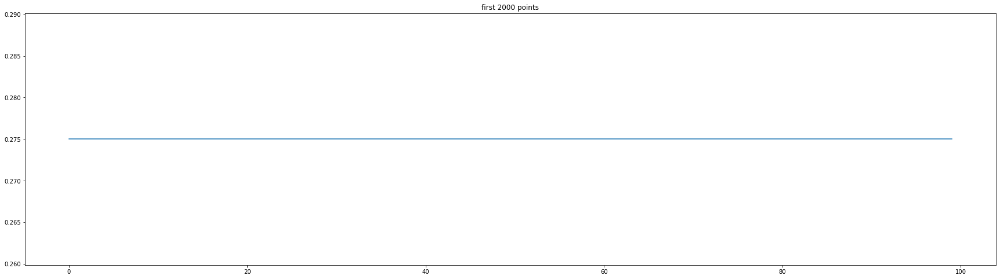

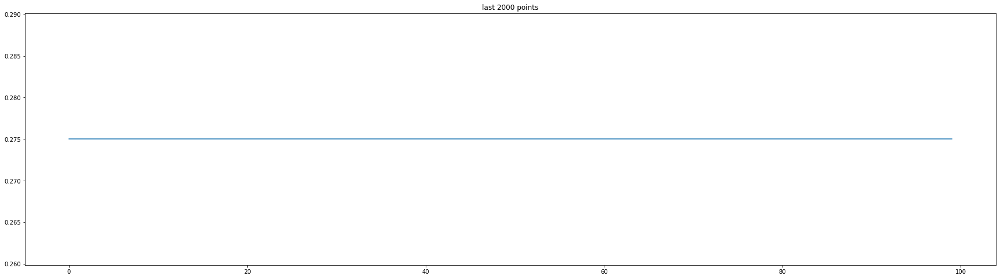

In [200]:
plt.figure(facecolor='w', figsize=(30, 8))
plt.plot(accum_rewards[:2000])
plt.title("first 2000 points")
plt.figure(facecolor='w', figsize=(30, 8))
plt.plot(accum_rewards[-2000:])
plt.title("last 2000 points") 

Text(0.5, 1.0, 'Policy_loss')

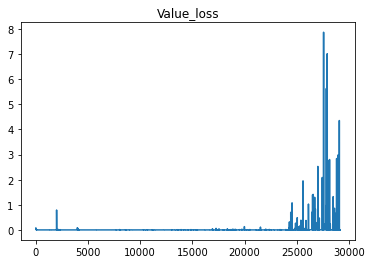

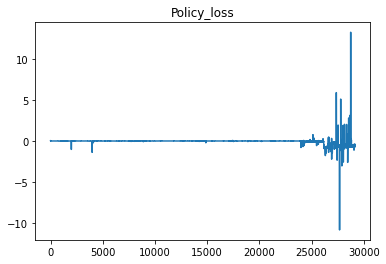

In [201]:
plt.figure(facecolor='w')
plt.plot(v_loss)
plt.title("Value_loss")
plt.figure(facecolor='w')
plt.plot(p_loss)
plt.title("Policy_loss")

## 6. Testing

# 5개 한꺼번에 추천

In [26]:
# https://github.com/CastellanZhang/NDCG/blob/master/NDCG.py
# https://en.wikipedia.org/wiki/Discounted_cumulative_gain
import numpy as np
def DCG(label_list):
    dcgsum = 0
    for i in range(len(label_list)):  # len(label_list)
        dcg = (2**label_list[i] - 1)/np.log2(i+2)
        dcgsum += dcg
    return dcgsum
def NDCG(label_list):
    dcg = DCG(label_list[0:len(label_list)])
    ideal_list = sorted(label_list, reverse=True) # reward 기준으로 정렬 ?
    ideal_dcg = DCG(ideal_list[0:len(label_list)])
    if ideal_dcg == 0:
        return 0
    return dcg/ideal_dcg

## 여기서 eval_user_num 을 test_user수로 설정

In [27]:
def get_action_prediction_topk(state, action_emb, userid_b, items, test_pred,related_books,k):
    action_emb = torch.reshape(action_emb,[1,100]).unsqueeze(0).to(device)
    m = torch.bmm(action_emb,items).squeeze(0)  #torch.bmm : batch 행렬 곱연산
    _, indices = torch.sort(m, descending=True)
    index_list = list(indices[0])
    rec_num = 0
    precision_num = 0
    precision_num_topk = 0
    rec_list = []
    rel_list = []
    for i in index_list:
        if users_dict[int(userid_b[0])]["item"][i] not in test_pred:
            rec_list.append(users_dict[int(userid_b[0])]["item"][i])
            rel_list.append(users_dict[int(userid_b[0])]["rating"][i])
            if users_dict[int(userid_b[0])]["rating"][i] >=4:
                precision_num_topk += 1
            rec_num += 1
        if rec_num == k:
            break
    for rec in rec_list:
        if rec in related_books[10:15]:
            precision_num += 1
    return rec_list , rel_list,precision_num, precision_num_topk
                

In [29]:
def MoreInfo(state_dict, action, answer, user_id):
#     value = pred_dict[user_id]
    state_item_info = []
    action_info = []
    answer_info = []
    
    for j in state_dict: # state에 대한 category 출력
        state_item_info.append(df_cat_title.loc[j][1])
    for k in action: # action에 대한 category 출력
        action_info.append(df_cat_title.loc[k][1])
    for i in answer:
        answer_info.append(df_cat_title.loc[i][1])
        
    return state_item_info, action_info, answer_info            

def Plot(state, action):
    pass

In [30]:
env = OfflineEnv2(test_dataloader, users_dict, item_embeddings_dict)
# it2 = iter(test_dataloader)
precision = 0
#eval_user_num = test_num
eval_user_num = 4
test_state_dict = dict()

actions = []
users = []
ndcg_all = 0
answer_items = []
topk = 5
precision_all = 0
precision_num_topk_all = 0 
dcg_all = 0
for user_idx in range(eval_user_num):  #session 돌리기 : timestamps 내에서 items들 
    ep_reward = 0
    item_b, rating_b, size_b, userid_b, idx_b = env.data['item'], env.data['rating'], env.data['size'], env.data['userid'], env.data['idx']
    memory = env.memory
    state = drrave_state_rep(userid_b,memory,idx_b)
    items = env.items.to(device)
    count = 0
    test_first_10 = list([item.item() for item in item_b])
    done = 0
    ndcg = 0
    accum_action = []
    answer_items.append([item.item() for item in item_b])
    users.append(env.data['userid'].item())
    test_state_dict[int(userid_b)] = test_first_10
    
    state_rep =  torch.reshape(state,[-1])
    action_emb = policy_net(state_rep)   # policy_net = actor : items들의 선호도 (rating)
    action_emb = action_emb.squeeze(0)
    
    
    if len(env.related_books) >= 15:

        action, rel_list, precision_num, precision_num_topk = get_action_prediction_topk(state,action_emb,userid_b,items, test_first_10,env.related_books,topk)
        dcg_user = DCG(rel_list)
        ndcg_5 = NDCG(rel_list)
        precision_user = precision_num/topk
        precision_num_topk_user = precision_num_topk/topk
        ndcg_all += ndcg_5
        dcg_all += dcg_user
        precision_all += precision_user
        precision_num_topk_all += precision_num_topk_user
        answer = env.related_books[10:15]
        state_item_info, action_info, answer_info = MoreInfo(test_first_10, action, answer, userid_b)
        
        print('User : ', int(userid_b))
        print('User state category: ', state_item_info)
        #print('state: ', state)
        print('Action : ', action,'\nAnswer :',answer)
        print('Action category: ', action_info, '\nAnswer category: ', answer_info)
        print('rel_list :', rel_list,'ndcg_5 :', ndcg_5,'precision_user :', precision_user)
        print('precision_num_topk :',precision_num_topk_user)
        print('DCG_topk :',dcg_user)
        #print('action_emb: ', action_emb)
        print('-'*30)
    try:
        env.reset()
    except:
        pass

print('Overall DCG : ', dcg_all/eval_user_num)
print('Overall NDCG : ', ndcg_all/eval_user_num)          
print('Overall Precision : ', precision_all/eval_user_num)
print('Overall Precision topk : ', precision_num_topk_all/eval_user_num)

User :  8
User state category:  ['Mystery, Thriller & Suspense', 'Health, Fitness & Dieting', 'Literature & Fiction', 'Literature & Fiction', 'Mystery, Thriller & Suspense', 'Literature & Fiction', 'Health, Fitness & Dieting', 'Arts & Photography', 'Literature & Fiction', 'Literature & Fiction']
Action :  [426781, 426821, 155737, 251826, 164376] 
Answer : [155737, 67284, 67358, 406358, 81576]
Action category:  ['Mystery, Thriller & Suspense', 'Mystery, Thriller & Suspense', 'Literature & Fiction', 'Literature & Fiction', 'Mystery, Thriller & Suspense'] 
Answer category:  ['Literature & Fiction', 'Mystery, Thriller & Suspense', 'Mystery, Thriller & Suspense', 'Literature & Fiction', 'Science Fiction & Fantasy']
rel_list : [5, 5, 4, 5, 3] ndcg_5 : 0.9852556136779376 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 74.11776531163216
------------------------------
User :  2
User state category:  ["Children's Books", "Children's Books", "Children's Books", "Children's Books", "Child

# 하나씩 추천

In [ ]:
def get_action_prediction(state, action_emb, userid_b, items, users_dict,test_pred):
    action_emb = torch.reshape(action_emb,[1,100]).unsqueeze(0).to(device)
    m = torch.bmm(action_emb,items).squeeze(0)  #torch.bmm : batch 행렬 곱연산
    _, indices = torch.sort(m, descending=True)
    index_list = list(indices[0])
    for i in index_list:
        if users_dict[int(userid_b[0])]["item"][i] not in test_pred:
            return users_dict[int(userid_b[0])]["item"][i], users_dict[int(userid_b[0])]["rating"][i] #추천한 item과 rating
#prediction algorithm

In [130]:
env = OfflineEnv2(train_dataloader, users_dict, item_embeddings_dict)
# it2 = iter(test_dataloader)
precision = 0
# eval_user_num = test_num
eval_user_num = 2
test_pred_dict = dict()
actions = []
users = []
ndcg_all = 0
answer_items = []
topk = 5
precision_all = 0
precision_num_topk_all = 0
dcg_all = 0
pred_dict = {}
action_embed_li = []
for user_idx in range(200):  #session 돌리기 : timestamps 내에서 items들
    ep_reward = 0
    item_b, rating_b, size_b, userid_b, idx_b = env.data['item'], env.data['rating'], env.data['size'], env.data['userid'], env.data['idx']
    items = env.items.to(device)
    count = 0
    test_pred = list(item.item() for item in item_b)
    done = 0
    ndcg = 0
    accum_action = []
    answer_items.append([item.item() for item in item_b])
    users.append(env.data['userid'].item())
    memory_user = env.memory
    rec_num = 0 #추천횟수
    precision_num_topk = 0 #4점 넘은 갯수
    rec_list = [] # 추천한 아이템 리스트
    rel_list = [] # 추천한 아이템의 rating
    if len(env.related_books) >= 15:
        for test_num in range(5):
            state = drrave_state_rep(userid_b,memory_user,idx_b)
            state_rep =  torch.reshape(state,[-1])
            action_emb = policy_net(state_rep)   # policy_net = actor : items들의 선호도 (rating)
            action_emb = action_emb.squeeze(0)
            action_embed_li.append(action_emb)
            pred_item, pred_rating = get_action_prediction(state,action_emb,userid_b,items,users_dict,test_pred)
            rec_list.append(pred_item)
            rel_list.append(pred_rating)
            test_pred.append(pred_item)
            if pred_rating >= 4:
                precision_num_topk += 1
                memory_user = memory_user[1:]
                memory_user.append(pred_item)
    else:
        pass
    pred_dict[int(userid_b)] = rec_list
    dcg_user = DCG(rel_list)
    ndcg_5 = NDCG(rel_list)
    precision_num_topk_user = precision_num_topk/topk
    ndcg_all += ndcg_5
    dcg_all += dcg_user
    precision_num_topk_all += precision_num_topk_user
    print('user : ', int(userid_b))
    print('action : ', rec_list)
    print('rel_list :', rel_list,'ndcg_5 :', ndcg_5)
    print('precision_num_topk :',precision_num_topk_user)
    print('DCG_topk :',dcg_user)
    print('-'*20)
    try:
        env.reset()
    except:
        pass
print('DCG : ', dcg_all/eval_user_num)
print('NDCG : ', ndcg_all/eval_user_num)
print('Precision topk : ', precision_num_topk_all/eval_user_num)

RuntimeError: Tensor for 'out' is on CPU, Tensor for argument #1 'self' is on CPU, but expected them to be on GPU (while checking arguments for addmm)

In [127]:
device = 'cpu'
policy_net_fake = Actor(300,100,256)

In [68]:
def get_action_prediction_topk(state, action_emb, userid_b, items, test_pred,related_books,k):
    action_emb = torch.reshape(action_emb,[1,100]).unsqueeze(0).to(device)
    m = torch.bmm(action_emb,items).squeeze(0)  #torch.bmm : batch 행렬 곱연산
    _, indices = torch.sort(m, descending=True)
    index_list = list(indices[0])
    rec_num = 0
    precision_num = 0
    precision_num_topk = 0
    rec_list = []
    rel_list = []
    for i in index_list:
        if users_dict[int(userid_b[0])]["item"][i] not in test_pred:
            rec_list.append(users_dict[int(userid_b[0])]["item"][i])
            rel_list.append(users_dict[int(userid_b[0])]["rating"][i])
            if users_dict[int(userid_b[0])]["rating"][i] >=4:
                precision_num_topk += 1
            rec_num += 1
        if rec_num == k:
            break
    for rec in rec_list:
        if rec in related_books[10:15]:
            precision_num += 1
    return rec_list , rel_list,precision_num, precision_num_topk
                

#prediction algorithm
env = OfflineEnv2(test_dataloader, users_dict, item_embeddings_dict)
# it2 = iter(test_dataloader)
precision = 0
eval_user_num = test_num
# eval_user_num = 200
test_pred_dict = dict()
actions = []
users = []
ndcg_all = 0
answer_items = []
topk = 5
precision_all = 0
precision_num_topk_all = 0 
dcg_all = 0
for user_idx in range(eval_user_num):  #session 돌리기 : timestamps 내에서 items들 
    ep_reward = 0
    item_b, rating_b, size_b, userid_b, idx_b = env.data['item'], env.data['rating'], env.data['size'], env.data['userid'], env.data['idx']
    memory = env.memory
    state = drrave_state_rep(userid_b,memory,idx_b)
    items = env.items.to(device)
    count = 0
    test_pred = set([item.item() for item in item_b])
    done = 0
    ndcg = 0
    accum_action = []
    answer_items.append([item.item() for item in item_b])
    users.append(env.data['userid'].item())
    
    state_rep =  torch.reshape(state,[-1])
    action_emb = policy_net_fake(state_rep)   # policy_net = actor : items들의 선호도 (rating)
    action_emb = action_emb.squeeze(0)
    
    
    if len(env.related_books) >= 15:

    
        action,rel_list,precision_num,precision_num_topk = get_action_prediction_topk(state,action_emb,userid_b,items, test_pred,env.related_books,topk)
        dcg_user = DCG(rel_list)
        ndcg_5 = NDCG(rel_list)
        precision_user = precision_num/topk
        precision_num_topk_user = precision_num_topk/topk
        ndcg_all += ndcg_5
        dcg_all += dcg_user
        precision_all += precision_user
        precision_num_topk_all += precision_num_topk_user
        answer = env.related_books[10:15]
        print('user : ', int(userid_b))
        print('action : ', action,'answer :',answer)
        print('rel_list :', rel_list,'ndcg_5 :', ndcg_5,'precision_user :', precision_user)
        print('precision_num_topk :',precision_num_topk_user)
        print('DCG_topk :',dcg_user)
    try:
        env.reset()
    except:
        pass

print('DCG : ', dcg_all/eval_user_num)
print('NDCG : ', ndcg_all/eval_user_num)          
print('Precision : ', precision_all/eval_user_num)
print('Precision topk : ', precision_num_topk_all/eval_user_num)

user :  7357553
action :  [1293239, 718323, 2823489, 2413429, 1158799] answer : [2823489, 50484, 296790, 550243, 718323]
rel_list : [5, 4, 5, 2, 2] ndcg_5 : 0.9653804788000362 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 58.41653439949567
user :  13350749
action :  [1685646, 1360641, 1309524, 1569307, 1360786] answer : [1360641, 1360786, 1446043, 1569307, 1685646]
rel_list : [4, 5, 3, 5, 4] ndcg_5 : 0.8510366148455194 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 57.212587769508495
user :  7957749
action :  [2024543, 698057, 1340147, 244507, 911057] answer : [911057, 980222, 1172213, 1827995, 1991546]
rel_list : [5, 1, 5, 4, 5] ndcg_5 : 0.8995648353634543 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 65.58351514894314
user :  11459668
action :  [2086307, 2153352, 2202621, 2086305, 2116298] answer : [1610007, 1646756, 2086307, 2086305, 2111516]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.4022326852

user :  6590066
action :  [435521, 1577367, 2839012, 1195588, 7003] answer : [205270, 338515, 435521, 452506, 789742]
rel_list : [5, 1, 1, 4, 5] ndcg_5 : 0.8591482601423727 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 50.58351514894314
user :  12981877
action :  [1550992, 1647647, 355480, 300477, 5905] answer : [355480, 652505, 779071, 1193513, 1462916]
rel_list : [5, 5, 5, 1, 3] ndcg_5 : 0.996214498288079 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 69.19746856943036
user :  1690257
action :  [1813900, 1850466, 1817686, 1818015, 2438623] answer : [757122, 1308104, 1339933, 1577433, 1617496]
rel_list : [4, 5, 4, 4, 4] ndcg_5 : 0.9019520307580505 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 54.32176284033421
user :  5275427
action :  [184040, 912091, 2059009, 353291, 1373850] answer : [705682, 705694, 705935, 705991, 705942]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.4022326852611

user :  9766994
action :  [40991, 2028466, 449703, 2513674, 2393949] answer : [2109809, 2513674, 293992, 317917, 2028466]
rel_list : [1, 5, 1, 5, 5] ndcg_5 : 0.6938511370261394 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 46.40223268526116
user :  6939582
action :  [1699324, 1460401, 2113082, 878199, 1908706] answer : [1699324, 1908706, 182934, 226241, 878199]
rel_list : [5, 3, 3, 4, 5] ndcg_5 : 0.899462517490081 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 57.36909367037189
user :  905586
action :  [2304211, 2401561, 2908029, 2042148, 1041004] answer : [2079163, 2090735, 2090739, 2304153, 2304211]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3513460
action :  [2456415, 2180620, 2467753, 1851015, 2445877] answer : [254839, 259489, 259617, 277813, 310274]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
use

user :  14362820
action :  [451121, 107101, 1334706, 2137804, 1310611] answer : [106891, 107101, 213897, 214395, 215103]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  5146542
action :  [2438835, 2424718, 2424721, 1646476, 2438838] answer : [2424721, 2424718, 2432697, 2432700, 2432699]
rel_list : [5, 5, 4, 3, 5] ndcg_5 : 0.9712743190142815 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 73.06599529149972
user :  12090248
action :  [346790, 1466434, 5235, 911580, 911885] answer : [309833, 346790, 911580, 911885, 1044701]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 76.40223268526115
user :  8287792
action :  [1501606, 2219668, 664234, 1463080, 472605] answer : [244934, 245096, 310291, 346394, 449736]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 66.416531698

user :  14885074
action :  [1360778, 1446279, 1446280, 1360813, 1999727] answer : [185533, 187914, 189445, 201310, 205270]
rel_list : [5, 3, 3, 5, 5] ndcg_5 : 0.8952152519387657 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 64.25991859954618
user :  14166121
action :  [457872, 230432, 647557, 786504, 297356] answer : [194621, 230432, 457872, 647557, 1315658]
rel_list : [4, 5, 5, 5, 3] ndcg_5 : 0.8789107329832349 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 66.11776531163216
user :  12793362
action :  [1218073, 1657361, 1703105, 2423444, 1218076] answer : [1218076, 1218073, 1334706, 1429169, 1525034]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3801157
action :  [88156, 1930707, 1168585, 2018252, 1878111] answer : [219826, 760344, 1548291, 1643911, 1670659]
rel_list : [3, 5, 3, 4, 1] ndcg_5 : 0.7791704142169043 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 36.90582353905062
us

user :  12497198
action :  [1676380, 1730909, 2902459, 2135027, 1754506] answer : [1674571, 1676380, 1677319, 1693540, 1718196]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  2981191
action :  [1637499, 1586714, 2440558, 1775376, 2422175] answer : [1716624, 1757010, 1775376, 2175416, 2175413]
rel_list : [3, 5, 1, 5, 5] ndcg_5 : 0.7544186951195051 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 52.40223268526116
user :  5238425
action :  [742636, 1334644, 607781, 1341504, 1241309] answer : [607781, 623334, 685266, 685878, 742636]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8300543
action :  [67815, 2878196, 2148065, 1260022, 1895465] answer : [556668, 1179034, 1473750, 1895465, 2353657]
rel_list : [1, 1, 2, 3, 4] ndcg_5 : 0.5497578483274372 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 11.94845776860

user :  8224855
action :  [293961, 640696, 1501052, 105022, 2109796] answer : [293961, 300849, 347003, 449507, 545485]
rel_list : [5, 4, 3, 2, 5] ndcg_5 : 0.9198879336266637 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 57.24841300206283
user :  4406037
action :  [180296, 529254, 2002945, 912417, 759800] answer : [370447, 529254, 648785, 705550, 706415]
rel_list : [3, 5, 4, 4, 4] ndcg_5 : 0.8107839859693216 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 46.32176284033421
user :  286610
action :  [356613, 101455, 266981, 345295, 293805] answer : [106858, 107709, 180480, 214632, 266981]
rel_list : [4, 3, 5, 3, 5] ndcg_5 : 0.7827294647138235 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 49.923681205784746
user :  659537
action :  [236691, 2003257, 1469567, 2352004, 1226529] answer : [2125257, 2352004, 2444547, 1224286, 1469567]
rel_list : [3, 4, 5, 5, 3] ndcg_5 : 0.7529278589300378 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 48.02288925448884
u

user :  9967616
action :  [1781605, 2135250, 1847367, 1759582, 2069496] answer : [1699443, 1724730, 1746294, 1759582, 1773839]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  863713
action :  [2420773, 730545, 730431, 2418928, 1232996] answer : [328670, 328669, 329007, 360988, 448068]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  983719
action :  [1830960, 2598221, 2598220, 2418499, 2598527] answer : [1830960, 1842623, 1842669, 1263030, 2033174]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7322274
action :  [313422, 472618, 1663182, 308934, 1727493] answer : [214713, 216590, 219224, 245058, 287579]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9735223
action :  [1688647, 1690755, 1645

user :  7712701
action :  [1616298, 2325348, 746860, 746861, 2356173] answer : [202332, 202686, 203258, 204609, 207017]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  621042
action :  [1699270, 1616298, 2463751, 1239041, 757110] answer : [571072, 573837, 757110, 1227008, 1239041]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  6748186
action :  [1699051, 1833752, 719265, 1830623, 1686777] answer : [649603, 1236641, 1236640, 1252951, 1252952]
rel_list : [4, 1, 3, 4, 4] ndcg_5 : 0.8876967425437062 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 31.393870233190476
user :  10891275
action :  [2463751, 1203572, 1214242, 2138850, 1617947] answer : [1234710, 1617947, 2095624, 2138850, 2138861]
rel_list : [4, 3, 4, 4, 5] ndcg_5 : 0.7941091260423679 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 45.36909367037189

user :  12304227
action :  [2893676, 1309187, 1699106, 1736046, 1679571] answer : [1309187, 1545769, 1614158, 1679571, 1699106]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  6610044
action :  [310188, 1619956, 1307472, 776984, 776769] answer : [310188, 328353, 328354, 345043, 347033]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  6458957
action :  [2421583, 1623507, 1655714, 1623077, 348022] answer : [1585974, 1589715, 1597436, 1623077, 1623507]
rel_list : [5, 5, 2, 5, 5] ndcg_5 : 0.960678819976623 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 77.40223268526115
user :  9181409
action :  [36971, 1562531, 333167, 1898547, 184549] answer : [1562531, 1898547, 2170740, 35182, 35338]
rel_list : [2, 5, 5, 5, 4] ndcg_5 : 0.7765058819838484 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 57.212587769508495
user

user :  9766515
action :  [3744, 2283622, 1646777, 1749797, 2439399] answer : [2112961, 2186989, 2200369, 2186987, 284269]
rel_list : [1, 1, 1, 1, 1] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 2.9484591188793923
user :  11627254
action :  [1466239, 1793375, 1791106, 2444970, 1793308] answer : [1690682, 1697582, 1715094, 1735151, 1735036]
rel_list : [3, 4, 4, 4, 4] ndcg_5 : 0.8807456512921771 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 36.226886783190885
user :  1845082
action :  [91761, 346972, 2389221, 1968102, 1963146] answer : [1963146, 1968102, 2389221, 2683775, 91761]
rel_list : [4, 3, 5, 4, 5] ndcg_5 : 0.7938646823245576 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 53.36909367037189
user :  4358707
action :  [434834, 2446170, 7434, 1260183, 817152] answer : [434834, 672395, 817152, 1152811, 1260183]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
u

user :  6831082
action :  [1209947, 1659349, 1547458, 1691470, 677882] answer : [328572, 328327, 328573, 351919, 358527]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  1160232
action :  [1657265, 1177142, 283811, 1090554, 40435] answer : [283811, 313096, 486733, 1360729, 1593477]
rel_list : [3, 2, 4, 3, 2] ndcg_5 : 0.8107534966245472 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 20.56808358893175
user :  10275838
action :  [1194172, 1515548, 1534051, 510814, 2183416] answer : [181318, 181327, 182189, 194278, 194591]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  6579456
action :  [2908477, 575959, 1771510, 2462512, 2916216] answer : [1747472, 1751064, 1759054, 1759708, 1774273]
rel_list : [1, 3, 5, 4, 5] ndcg_5 : 0.6405602074915111 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 39.36909367037189
user :

user :  3521556
action :  [2430406, 1567276, 1698829, 2422635, 1646765] answer : [676489, 748241, 1281783, 1415628, 1457557]
rel_list : [4, 1, 5, 2, 5] ndcg_5 : 0.7435069119145136 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 44.41539645206243
user :  3375762
action :  [1830612, 2187865, 1843749, 1830642, 1803913] answer : [1568726, 1568937, 1569333, 1569398, 1569524]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9471447
action :  [2421516, 2421515, 1838260, 1844236, 2427398] answer : [1844236, 2069528, 2069527, 2101972, 2356786]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5403384
action :  [213700, 208928, 2234087, 21250, 16373] answer : [208928, 213700, 214499, 241806, 241558]
rel_list : [4, 4, 5, 3, 3] ndcg_5 : 0.8509871686401044 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 45.6866518607274
user :  12845628

user :  891015
action :  [147162, 7466, 99908, 602438, 649255] answer : [215934, 236804, 243766, 244102, 284143]
rel_list : [1, 2, 1, 5, 4] ndcg_5 : 0.5270167594033826 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 22.546554669507685
user :  1639817
action :  [2397337, 2394044, 2118293, 2397326, 2871975] answer : [2394044, 2397337, 2397326, 2118293, 2871975]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 1.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12329315
action :  [481290, 294191, 245836, 271635, 1932094] answer : [216967, 245836, 245824, 266843, 266930]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14367567
action :  [793598, 1698946, 107379, 685898, 269324] answer : [101703, 105172, 107379, 202238, 206398]
rel_list : [2, 3, 5, 5, 5] ndcg_5 : 0.6871292880821686 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 48.25991859954618
user :  10267607
action :  [165

user :  8536329
action :  [2794111, 2825180, 1652945, 1556787, 1199060] answer : [1199060, 1214588, 1230014, 1233805, 1240328]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  9847120
action :  [1523223, 1714096, 1568971, 1307109, 633728] answer : [329123, 345135, 453716, 500457, 633728]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2113641
action :  [2419445, 1236704, 1624575, 1755674, 2879018] answer : [1624575, 1624244, 1624790, 1669104, 1669238]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  13598139
action :  [2393343, 1591319, 1611535, 1623265, 2880537] answer : [1560945, 1567584, 1591319, 1608772, 1611535]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user : 

user :  8749849
action :  [243861, 2702946, 924311, 472466, 1781741] answer : [1983753, 1983985, 1985931, 2052861, 2454970]
rel_list : [2, 2, 2, 2, 3] ndcg_5 : 0.8090683751073771 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 10.392788585576344
user :  13186874
action :  [2519578, 1679202, 2136933, 1688085, 1630411] answer : [1597247, 1629716, 1630411, 1688085, 1697306]
rel_list : [1, 1, 2, 4, 4] ndcg_5 : 0.5747954453114108 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 15.393870233190478
user :  7136880
action :  [2785564, 32726, 1717012, 468360, 1976540] answer : [1613542, 1717012, 1976540, 2106047, 2785564]
rel_list : [5, 2, 4, 5, 5] ndcg_5 : 0.892190820713464 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 65.73619958526035
user :  8466155
action :  [1534051, 1534755, 1720295, 1569043, 1908942] answer : [1569043, 1569042, 1908942, 2112961, 1720295]
rel_list : [3, 3, 4, 5, 4] ndcg_5 : 0.7091199090335245 precision_user : 0.6
precision_num_topk : 0.6
DCG_t

user :  12110767
action :  [205492, 2112969, 1503180, 1344061, 34642] answer : [1613430, 1614231, 1620320, 1681878, 2166860]
rel_list : [3, 3, 3, 3, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 20.639213832155747
user :  5675102
action :  [1281293, 1235281, 1235285, 1246115, 1246116] answer : [1235285, 1235281, 1243844, 1243845, 1246114]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  760519
action :  [529514, 346283, 1366716, 894043, 353196] answer : [298410, 346283, 353196, 361975, 445379]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6162144
action :  [1550992, 1204963, 1833547, 1795275, 1485794] answer : [276953, 325493, 325763, 344712, 496009]
rel_list : [4, 3, 1, 4, 3] ndcg_5 : 0.9272797763750008 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 29.08462629674289
user :  709861
act

user :  9903438
action :  [946041, 1895039, 532564, 1895050, 704305] answer : [406046, 532564, 704305, 918462, 946041]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  3954098
action :  [1737554, 587511, 1687132, 1599358, 306117] answer : [1569147, 1569232, 1569219, 1577701, 1599358]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  4221792
action :  [2091798, 447062, 5557, 97369, 2418928] answer : [1625328, 1624946, 1698780, 1718396, 1820182]
rel_list : [1, 1, 1, 1, 4] ndcg_5 : 0.4935196976606341 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 8.364398420162974
user :  1257130
action :  [2424892, 1543025, 1179575, 566816, 1641214] answer : [503746, 510308, 566816, 1516229, 1543025]
rel_list : [4, 5, 2, 5, 1] ndcg_5 : 0.8335882438033102 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 49.79664846822491
user :

user :  254213
action :  [1799692, 2885806, 1745985, 1727521, 1808220] answer : [1727521, 1745985, 1759932, 1773965, 1799692]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3268665
action :  [2105754, 1008429, 1008417, 1884616, 1008461] answer : [1008427, 1008461, 1008417, 1008396, 1008456]
rel_list : [4, 3, 5, 4, 4] ndcg_5 : 0.8257963249144239 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 47.17944875461922
user :  5247903
action :  [442797, 1514570, 1787733, 2032168, 1844145] answer : [1844145, 1864261, 2395520, 2412394, 69455]
rel_list : [3, 3, 2, 3, 4] ndcg_5 : 0.8022366251646473 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 21.73403629003208
user :  7285356
action :  [1634245, 1643790, 1746135, 1721434, 2853273] answer : [1391395, 1643790, 1716205, 1777279, 2094043]
rel_list : [5, 5, 3, 2, 1] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 55.737704842169904
user 

user :  5967889
action :  [687418, 2022840, 1169544, 1531355, 1907335] answer : [1531355, 1531318, 1975459, 2105824, 2445673]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2758403
action :  [1843480, 2491502, 1309719, 2083119, 677606] answer : [2125286, 2125257, 2129576, 2176243, 2176173]
rel_list : [4, 5, 4, 1, 4] ndcg_5 : 0.8810701738598414 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 48.2922910273067
user :  10379177
action :  [297101, 2385272, 1613695, 59740, 1287229] answer : [230114, 230178, 294921, 297101, 397076]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13766495
action :  [2091798, 447062, 180425, 334913, 1354909] answer : [100865, 180425, 202672, 214040, 332477]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  6376389
act

user :  10401159
action :  [1690757, 1716205, 2431597, 2179353, 2177584] answer : [1659275, 1690757, 1716205, 1832518, 2131982]
rel_list : [4, 5, 5, 5, 1] ndcg_5 : 0.8750555905051046 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 63.79664846822491
user :  6455995
action :  [2463749, 2463751, 1754701, 1569182, 1699255] answer : [1184683, 1214462, 1218344, 1224222, 1224221]
rel_list : [5, 5, 4, 4, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.22694038245787
user :  9100646
action :  [449395, 449786, 1754913, 2164866, 1709800] answer : [1462916, 1562227, 1675449, 1677184, 1705607]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  6711761
action :  [1763290, 2481394, 1767239, 2481402, 1699106] answer : [1269348, 1278528, 1330140, 1494087, 1566508]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
use

user :  2417361
action :  [2787131, 732027, 2140330, 1017594, 1058193] answer : [220455, 220458, 237193, 306170, 308007]
rel_list : [4, 5, 4, 5, 3] ndcg_5 : 0.864501120845258 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 58.11776531163216
user :  4526667
action :  [2035273, 1335063, 2737121, 183495, 2066351] answer : [1335063, 2035273, 2035340, 2066351, 2066366]
rel_list : [5, 5, 5, 2, 4] ndcg_5 : 0.9928625356851767 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 73.15364414345348
user :  9684073
action :  [1310631, 2432023, 2926287, 2431009, 1310919] answer : [731288, 1239637, 1276757, 1276951, 1281505]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12715519
action :  [1344652, 1462957, 2070657, 2316498, 1070465] answer : [608785, 610063, 1070465, 1307758, 1309035]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.402232685261

user :  12839821
action :  [35388, 183478, 340520, 35392, 35390] answer : [24242, 33614, 34588, 34691, 35390]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  12660755
action :  [1693500, 1917759, 1429334, 1658774, 1917708] answer : [1429334, 1658774, 1917708, 1917776, 1917759]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14465696
action :  [1478613, 1569236, 1213687, 1598491, 2125905] answer : [705723, 706877, 706823, 779735, 1205287]
rel_list : [1, 5, 5, 5, 5] ndcg_5 : 0.7694838550733315 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 61.40223268526116
user :  4340941
action :  [220557, 602099, 1971615, 845757, 364614] answer : [170619, 171024, 217654, 217684, 220557]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  15097954


user :  11173858
action :  [293658, 337059, 294180, 323079, 350115] answer : [293658, 294180, 309381, 323079, 337059]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  9644695
action :  [1360778, 640488, 287871, 2534908, 1633395] answer : [285493, 287871, 313062, 640488, 1360484]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
user :  10352901
action :  [2827428, 1414897, 1935742, 776286, 699816] answer : [700053, 699816, 776286, 1414897, 1935742]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  5518069
action :  [1569223, 1698775, 1698906, 1699230, 1699317] answer : [1569268, 1569223, 1698775, 1698959, 1699230]
rel_list : [4, 4, 3, 4, 3] ndcg_5 : 0.9852842450037123 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 37.132064

user :  1457736
action :  [428146, 648293, 862917, 484786, 1996184] answer : [428146, 484786, 648293, 1143508, 1339805]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  3853092
action :  [1724631, 1795275, 1800859, 1828605, 1717247] answer : [1717247, 1724631, 1749306, 1753184, 1773375]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  661688
action :  [1684136, 1229801, 2174344, 2916564, 1242198] answer : [325212, 402102, 510377, 670020, 1229801]
rel_list : [4, 5, 4, 5, 4] ndcg_5 : 0.8704643526711906 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 61.212587769508495
user :  3763497
action :  [1309522, 718990, 438891, 718991, 438894] answer : [206340, 214519, 268660, 287973, 438894]
rel_list : [5, 5, 3, 5, 4] ndcg_5 : 0.9732229889623544 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 73.21258776950849
user :  34

user :  12459770
action :  [1699087, 2450271, 918965, 2111463, 311701] answer : [1699087, 1699667, 1830666, 2125291, 2125327]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14647855
action :  [332165, 2851380, 31002, 1441899, 2841609] answer : [1573279, 1585765, 1591616, 1634518, 1975919]
rel_list : [4, 5, 5, 5, 3] ndcg_5 : 0.8789107329832349 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 66.11776531163216
user :  2973895
action :  [2008803, 1607916, 2119684, 1003170, 1541641] answer : [2318653, 77950, 691731, 1483989, 1607916]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4600562
action :  [2895464, 1785209, 1749813, 2908128, 1738217] answer : [1749813, 1750126, 1752993, 1754042, 1755588]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13988573
action

user :  7154377
action :  [1341470, 487253, 1986724, 409420, 2031445] answer : [1341470, 1378235, 1473785, 1489793, 1895996]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6871890
action :  [101025, 1281821, 6396, 275124, 1972929] answer : [1281821, 1380644, 1928144, 179488, 1972929]
rel_list : [1, 5, 1, 1, 5] ndcg_5 : 0.6454180918482666 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 33.48193594305937
user :  448672
action :  [2444465, 2441645, 2444458, 2426355, 1841165] answer : [1841165, 1849489, 2357573, 2424719, 2424721]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  13800070
action :  [1634412, 1748472, 1688810, 1784630, 1748711] answer : [1611150, 1634412, 1656190, 1671934, 1677731]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.5114077560

user :  12384887
action :  [447062, 2091798, 97558, 544898, 440010] answer : [40066, 64431, 68360, 69581, 70098]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  525162
action :  [2178306, 2429497, 2178352, 1822019, 1853767] answer : [1822019, 1822856, 1823324, 1827162, 1831860]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13249306
action :  [1378910, 2082631, 18186, 946352, 293503] answer : [946352, 1374419, 1686146, 2082631, 18186]
rel_list : [3, 5, 5, 5, 4] ndcg_5 : 0.8137056679203003 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 61.212587769508495
user :  11921532
action :  [1681065, 1555988, 1831390, 1830617, 1699324] answer : [327655, 1205575, 1245884, 1257223, 1515878]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5930028
action :  [1358034, 2

user :  2813385
action :  [87221, 2834931, 1460293, 308772, 663937] answer : [12403, 16699, 16708, 17468, 17913]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10621554
action :  [1806980, 594124, 1797102, 820122, 1741521] answer : [1797102, 1806980, 1806965, 2106998, 2144126]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  407452
action :  [1617769, 2165292, 1569265, 2457676, 2472269] answer : [510377, 1019762, 1021021, 1340414, 1357858]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10284234
action :  [1615281, 1310851, 1309589, 1501850, 1463042] answer : [487486, 1309589, 1310373, 1310851, 1463042]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5101106
action :  [1739950, 2828818, 1526

user :  11744682
action :  [1360762, 308129, 1721602, 1739950, 1253160] answer : [90099, 106250, 106227, 117958, 147020]
rel_list : [2, 2, 3, 5, 1] ndcg_5 : 0.5734004743694127 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 22.1306153682241
user :  13601363
action :  [67815, 2878196, 361375, 1469130, 718303] answer : [310335, 361375, 449763, 449842, 550111]
rel_list : [3, 3, 5, 4, 4] ndcg_5 : 0.7297800737557184 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 39.17944875461922
user :  9778168
action :  [1569191, 1557090, 308309, 1569197, 1615334] answer : [308309, 308347, 308328, 308722, 308773]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10354364
action :  [1229538, 1570027, 2424610, 802026, 2419444] answer : [478017, 501213, 503225, 506789, 510855]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  15410

user :  13378322
action :  [2357669, 2424610, 2906228, 2325348, 2482041] answer : [2325348, 2357669, 2366989, 2424610, 2482041]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5823794
action :  [1830757, 2221736, 2221704, 2132049, 219303] answer : [262078, 285550, 328527, 329219, 345964]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  3015393
action :  [1669867, 2434020, 2922459, 2325348, 1586173] answer : [1414948, 1523231, 1525203, 1568453, 1568457]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  3053091
action :  [1378330, 1935596, 1189815, 2122100, 1492894] answer : [556475, 990221, 1062824, 1189816, 1189817]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10238155
action 

user :  12388680
action :  [2118612, 2647239, 1735815, 2253684, 2096677] answer : [1569157, 1735815, 2118612, 2253684, 2647239]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  7871624
action :  [1264185, 1810227, 1799898, 1843633, 1655906] answer : [1264185, 1569394, 1569612, 1588000, 1619316]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  4020060
action :  [2192508, 2442703, 2352027, 1679621, 2221672] answer : [1543706, 1569347, 1679621, 1698980, 1699317]
rel_list : [2, 3, 2, 4, 3] ndcg_5 : 0.7128604831770838 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 18.08462629674289
user :  11910067
action :  [1709101, 1735543, 1685511, 1712381, 1732887] answer : [1255107, 1502184, 1655479, 1672642, 1674383]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0

user :  12714453
action :  [40275, 1503193, 1236638, 1236639, 1236640] answer : [448203, 486223, 1236638, 1236639, 1236640]
rel_list : [3, 3, 5, 5, 5] ndcg_5 : 0.7280413236583608 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 52.25991859954618
user :  10193806
action :  [1609733, 1684412, 1705104, 1534755, 1634306] answer : [106232, 107171, 147157, 184712, 215913]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  6041602
action :  [293018, 294661, 846062, 1815355, 345794] answer : [180487, 181240, 181187, 183106, 199322]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  11788953
action :  [1620103, 504298, 2823040, 2816239, 1763709] answer : [2816814, 2817255, 1763709, 504298, 1178230]
rel_list : [3, 5, 4, 4, 4] ndcg_5 : 0.8107839859693216 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 46.32176284033421
user :  4226306
act

user :  3128631
action :  [1699051, 1569386, 1707686, 1781586, 2417497] answer : [1248546, 1569386, 1654433, 1677648, 1695440]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7513780
action :  [1853746, 1856111, 2425654, 2456913, 2425665] answer : [1785502, 1806576, 1807478, 1809189, 1810625]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  13864854
action :  [2113142, 1699414, 1569593, 1699328, 1569380] answer : [1569380, 1569605, 1569593, 1626644, 1689988]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13479018
action :  [1325085, 1159673, 2073812, 993899, 1487989] answer : [365038, 706262, 894760, 993888, 993899]
rel_list : [1, 5, 5, 5, 5] ndcg_5 : 0.7694838550733315 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 61.40223268526116
user :

user :  10343508
action :  [1951739, 1951875, 31811, 2457915, 2431195] answer : [1844543, 1951739, 1951875, 2431195, 2457915]
rel_list : [4, 4, 2, 5, 4] ndcg_5 : 0.8116936816019534 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 45.11771171236517
user :  12572117
action :  [1568954, 2221598, 188364, 1783357, 2112419] answer : [732838, 1052883, 1107381, 1307647, 1307970]
rel_list : [4, 5, 5, 2, 5] ndcg_5 : 0.8597135430551298 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 63.34328905920616
user :  11879783
action :  [1501068, 1595931, 1153336, 1700943, 1221388] answer : [1221388, 1221389, 1233349, 1482804, 1501068]
rel_list : [5, 3, 3, 5, 5] ndcg_5 : 0.8952152519387657 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 64.25991859954618
user :  7363692
action :  [34605, 1360762, 425978, 216804, 101527] answer : [25999, 34325, 34605, 36085, 40609]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
use

user :  1274177
action :  [1501606, 360727, 1562546, 1565856, 2147601] answer : [1501606, 1561342, 1562546, 1804443, 2147601]
rel_list : [5, 2, 5, 3, 5] ndcg_5 : 0.9026946615175333 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 63.399962191498915
user :  3511114
action :  [2828818, 1166121, 1091483, 1091485, 2141016] answer : [730553, 755122, 1091485, 1091483, 1165927]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1390234
action :  [1342229, 191732, 1225603, 1809990, 2007804] answer : [964644, 1124659, 1225603, 1333082, 1341620]
rel_list : [2, 3, 5, 3, 5] ndcg_5 : 0.6512278946096245 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 37.923681205784746
user :  7081065
action :  [435241, 269630, 174869, 937360, 364849] answer : [1872444, 2848499, 266649, 269630, 364849]
rel_list : [4, 4, 3, 3, 5] ndcg_5 : 0.8004060179768899 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 42.9711192343564

user :  1750602
action :  [1908942, 169090, 106231, 789440, 287178] answer : [1340278, 1585844, 1923572, 1929022, 359815]
rel_list : [2, 2, 3, 3, 3] ndcg_5 : 0.8126787091526164 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 14.115494817869916
user :  3889283
action :  [1550992, 2325348, 1801528, 1360812, 1255039] answer : [505770, 570668, 572202, 573173, 575926]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7158022
action :  [1699096, 1686705, 1698799, 1699054, 1698823] answer : [1686705, 1698799, 1699054, 1699096, 1722346]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1269234
action :  [718991, 719273, 1341990, 2175881, 1724997] answer : [718991, 719273, 983599, 989709, 1201727]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13382200
action :  [1357

user :  6919123
action :  [802630, 309912, 1700952, 424858, 309941] answer : [309941, 424858, 442057, 457430, 789437]
rel_list : [4, 3, 5, 5, 4] ndcg_5 : 0.8042947273248592 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 54.070273683793516
user :  5456170
action :  [1965503, 712486, 2099812, 1289383, 1969927] answer : [957774, 1064687, 1289383, 1965503, 1968829]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5604343
action :  [1461437, 1585343, 1676008, 2822642, 2165615] answer : [1635715, 1673921, 1679337, 2146374, 2146399]
rel_list : [1, 3, 4, 5, 3] ndcg_5 : 0.6117412421356949 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 28.975451225917183
user :  11277394
action :  [182009, 1532133, 1707167, 2877962, 2123992] answer : [1532133, 1707167, 1772447, 1821397, 2877962]
rel_list : [3, 5, 5, 5, 1] ndcg_5 : 0.8032870466085978 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 55.79664846822

user :  4786809
action :  [36077, 802630, 216801, 1684412, 313422] answer : [36077, 36596, 37555, 37898, 69806]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15221574
action :  [2075528, 390680, 1378260, 2398128, 1923528] answer : [284565, 287579, 931625, 931613, 1378260]
rel_list : [3, 3, 5, 3, 5] ndcg_5 : 0.7012815273537419 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 41.923681205784746
user :  1341865
action :  [1590848, 1447101, 1597200, 1854274, 1253499] answer : [1555645, 1590848, 1597200, 1768193, 1844209]
rel_list : [4, 4, 4, 4, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 41.13206432531455
user :  10618385
action :  [1908822, 1048821, 647694, 1933718, 292317] answer : [1048821, 1908822, 2199030, 2645231, 244193]
rel_list : [5, 5, 5, 3, 2] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 70.23411668893256
user :  1384529
action :  [348453, 15

user :  12721491
action :  [2426562, 2165292, 1569098, 1664449, 2866686] answer : [536604, 1308790, 1569098, 1664449, 1972326]
rel_list : [4, 5, 5, 5, 3] ndcg_5 : 0.8789107329832349 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 66.11776531163216
user :  10002593
action :  [1399396, 1358459, 1719382, 1874936, 2032412] answer : [1358459, 1399396, 1758914, 1874743, 1874936]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6402250
action :  [1719532, 2232561, 205174, 2209134, 1474165] answer : [1474156, 1474165, 1719532, 2114618, 2232561]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10625882
action :  [472618, 218803, 665944, 216802, 1614478] answer : [216802, 218803, 147192, 309581, 324273]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11150940
action :

user :  11837554
action :  [2441409, 2386853, 1264262, 2917622, 1264263] answer : [2386853, 2441409, 2917622, 396356, 396155]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13390698
action :  [660561, 924233, 620335, 730769, 2018568] answer : [328247, 328248, 328371, 328271, 329225]
rel_list : [2, 4, 3, 5, 5] ndcg_5 : 0.6637413500152362 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 41.30735662811784
user :  8984239
action :  [649662, 676292, 651678, 1561885, 676293] answer : [357459, 357521, 426488, 426499, 550760]
rel_list : [2, 5, 5, 5, 3] ndcg_5 : 0.7705338639242828 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 54.11776531163216
user :  5217776
action :  [2122095, 1928064, 1928890, 2075051, 2368237] answer : [2007859, 2043011, 2075051, 2122095, 2140558]
rel_list : [5, 3, 5, 5, 4] ndcg_5 : 0.9314518618935239 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 70.0702736837935
user :

user :  8642114
action :  [1340506, 2129604, 1340509, 802625, 329426] answer : [313235, 313179, 329426, 364973, 449850]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  11230045
action :  [1731847, 1699414, 1699353, 1715227, 1745442] answer : [1309028, 1378680, 1545884, 1552342, 1641550]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  12272339
action :  [340918, 2432572, 340977, 1760174, 1703492] answer : [328959, 340918, 340977, 757120, 1229801]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  2373508
action :  [2419761, 1713300, 1646764, 2884274, 2894534] answer : [1634949, 1646764, 1663266, 1681461, 1713300]
rel_list : [4, 4, 5, 5, 4] ndcg_5 : 0.840674484321335 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 59

user :  4027607
action :  [1522985, 1566499, 1567260, 2146810, 1783168] answer : [1250557, 1522985, 1566499, 1567260, 1573704]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11830426
action :  [36008, 2754032, 202593, 208670, 1562577] answer : [360034, 677507, 677508, 1562747, 1562706]
rel_list : [3, 2, 2, 1, 2] ndcg_5 : 0.99273940647578 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 11.984024240491392
user :  1699532
action :  [1569108, 1596478, 2417368, 1646476, 1681325] answer : [1227808, 1228375, 1233941, 1249742, 1501704]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  6819508
action :  [2916564, 2441843, 2121436, 1787006, 1861434] answer : [1784271, 1785251, 1861434, 2012086, 2192366]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1

user :  11477096
action :  [2350592, 1791379, 2350578, 2219702, 2400694] answer : [747452, 747602, 846129, 966341, 1243964]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10351853
action :  [802625, 2212657, 1281482, 1298846, 1580595] answer : [1281482, 1472977, 1473143, 1580595, 2211789]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  6363225
action :  [1649058, 1679953, 1648411, 2440496, 1661256] answer : [1236556, 1545832, 1587976, 1619539, 1631472]
rel_list : [4, 4, 4, 5, 4] ndcg_5 : 0.8487523503644214 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 51.11771171236517
user :  4291516
action :  [309493, 932114, 33481, 140783, 1220068] answer : [262563, 262555, 293477, 309493, 346800]
rel_list : [5, 4, 1, 1, 3] ndcg_5 : 0.9848400896475029 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 44.102592512287046
user :  117277


user :  11136495
action :  [214633, 2124364, 1686786, 309133, 2351519] answer : [1930380, 2351519, 33770, 70267, 206104]
rel_list : [4, 5, 4, 3, 5] ndcg_5 : 0.8488560533448056 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 57.065995291499725
user :  9563946
action :  [308710, 284364, 284363, 184048, 425978] answer : [284363, 284364, 287715, 308710, 310001]
rel_list : [5, 4, 5, 1, 5] ndcg_5 : 0.9380191672793574 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 68.38705988591605
user :  5475279
action :  [2325348, 746771, 640635, 2858521, 1427960] answer : [288015, 327961, 347529, 352820, 360855]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  9497321
action :  [1597959, 2113075, 1501298, 1501169, 2113076] answer : [1501169, 1501298, 1505715, 1597959, 2113075]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2

user :  8557305
action :  [838474, 1309554, 97300, 1266144, 1388878] answer : [437638, 1331241, 1462874, 1462934, 1545773]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  4923153
action :  [1501981, 1501828, 2068356, 2146809, 358905] answer : [1501828, 1501981, 2068356, 2146809, 2591944]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  13077100
action :  [2479759, 2445754, 1698928, 1241245, 1241247] answer : [1646716, 1646731, 1658083, 1688539, 1689971]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  10636004
action :  [2142120, 2403960, 2403908, 2403948, 2403946] answer : [2403910, 2403938, 2403946, 2403955, 2403907]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user 

user :  14448905
action :  [2826352, 2808662, 1794330, 2799385, 1226357] answer : [1788845, 1794330, 1851303, 2775658, 2808662]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  10521512
action :  [1831346, 2177325, 2929134, 2177311, 1744126] answer : [1755466, 1769210, 1818380, 1831346, 1840934]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5126400
action :  [2870608, 1686227, 1688533, 1698917, 401375] answer : [361361, 426124, 676505, 676547, 1310500]
rel_list : [5, 5, 1, 4, 3] ndcg_5 : 0.9799306468921732 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 60.226940382457876
user :  2393569
action :  [1209947, 24549, 2834931, 1307928, 2118612] answer : [237329, 237835, 242199, 243328, 244872]
rel_list : [5, 3, 4, 4, 4] ndcg_5 : 0.9658227723126372 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 55.17944875461

user :  7834444
action :  [216802, 2785564, 841163, 37785, 434970] answer : [389015, 434547, 434970, 450807, 841163]
rel_list : [3, 4, 5, 3, 4] ndcg_5 : 0.7596203694057518 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 40.78147431860374
user :  10104368
action :  [2833036, 347529, 2841217, 2016568, 1301931] answer : [326209, 327624, 346933, 347529, 435057]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11821537
action :  [649564, 2118728, 802167, 1588013, 34107] answer : [445861, 449747, 649564, 802167, 975583]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3046479
action :  [246712, 1731679, 2810857, 1344704, 36396] answer : [242002, 246712, 346860, 1344704, 1501371]
rel_list : [5, 3, 1, 5, 3] ndcg_5 : 0.9045436719650634 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 51.97545122591718
user :  11204156
action :  [156

user :  8302802
action :  [652303, 107681, 97444, 713184, 31397] answer : [97444, 107681, 199248, 250893, 280322]
rel_list : [2, 5, 5, 5, 3] ndcg_5 : 0.7705338639242828 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 54.11776531163216
user :  9448776
action :  [214253, 42431, 2096008, 287715, 1493908] answer : [183435, 183476, 198368, 214253, 232168]
rel_list : [5, 3, 5, 4, 3] ndcg_5 : 0.9420380517398672 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 60.08462629674289
user :  11849144
action :  [462976, 328199, 463006, 693984, 2881824] answer : [328199, 340712, 463022, 462976, 463006]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10941683
action :  [1748054, 2393343, 1567916, 1763290, 2347368] answer : [1487189, 1540783, 1568132, 1567916, 1568746]
rel_list : [4, 3, 4, 4, 4] ndcg_5 : 0.9525281406920878 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 39.17944875461922
user :  692638
a

user :  11892729
action :  [650071, 193864, 1273847, 1118599, 10413] answer : [650071, 1273847, 1401883, 2184115, 2282755]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  697921
action :  [455169, 1816110, 1845789, 1837059, 1309157] answer : [1816110, 1818982, 1821669, 1836309, 1837059]
rel_list : [2, 4, 2, 5, 3] ndcg_5 : 0.6468145380283937 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 30.022889254488838
user :  1800129
action :  [1696800, 1836776, 1987844, 1523054, 1525123] answer : [1488017, 1908864, 1987844, 2033543, 1836776]
rel_list : [1, 5, 5, 2, 3] ndcg_5 : 0.7187023900429704 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 40.05882168557716
user :  15126789
action :  [746860, 1649030, 2833036, 503700, 1685915] answer : [500467, 500963, 503700, 569598, 238097]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 6

user :  14134872
action :  [374613, 1925311, 1379312, 1290169, 1292545] answer : [924007, 926665, 1231073, 1231074, 1291694]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6490797
action :  [364532, 2404683, 2059612, 551573, 2065554] answer : [2030864, 2404683, 60420, 150729, 364532]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10067219
action :  [2201278, 1875207, 1483447, 1163026, 555525] answer : [1501922, 2094052, 2131835, 2201278, 17895]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3725576
action :  [1744131, 2481335, 1813107, 1741996, 1734891] answer : [296329, 310134, 309842, 313152, 503005]
rel_list : [1, 5, 3, 3, 3] ndcg_5 : 0.7037539501312883 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 29.781527917870726
user :  7884875
action :  [1820

user :  5456830
action :  [2716223, 1757906, 1631199, 1502258, 2345319] answer : [1502258, 1532852, 1548064, 1699487, 1840708]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  4731740
action :  [1281287, 1454441, 1360790, 1544355, 216431] answer : [449741, 802223, 932071, 1360775, 1544355]
rel_list : [2, 1, 1, 5, 1] ndcg_5 : 0.5223206499891876 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 17.868755861081183
user :  9281911
action :  [246712, 1683566, 2433116, 1534051, 1603712] answer : [254561, 254911, 279834, 302775, 303035]
rel_list : [2, 3, 3, 3, 3] ndcg_5 : 0.8715370768264441 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 16.639213832155747
user :  5146659
action :  [1856624, 1551913, 2460917, 1689975, 1644692] answer : [1551913, 1562179, 1644692, 1667429, 1680809]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.4022326852

user :  2031577
action :  [2907826, 2907704, 2116552, 2146593, 2412399] answer : [1417391, 1457582, 2640063, 2907704, 2907826]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13852013
action :  [1699096, 1763689, 1830612, 1699054, 1699050] answer : [1545863, 1548064, 1568622, 1568919, 1569170]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1686914
action :  [1739207, 1830821, 1758991, 2155521, 1797302] answer : [1732918, 1739207, 1758991, 1797302, 1801232]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13205813
action :  [1699596, 837, 1699014, 1699264, 1218536] answer : [1686722, 1698993, 1699264, 1699443, 1699596]
rel_list : [5, 3, 3, 5, 3] ndcg_5 : 0.9196059910252504 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 54.97545122591718
user :  7586294
act

user :  5592439
action :  [308710, 184041, 214714, 1487236, 1203567] answer : [105495, 147157, 184041, 184712, 201681]
rel_list : [1, 4, 4, 1, 4] ndcg_5 : 0.7381429443438552 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 24.19741497016338
user :  14508618
action :  [2356178, 808244, 1584866, 2431787, 1569550] answer : [808244, 808262, 1569550, 1584866, 1664469]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  11977026
action :  [1358314, 283226, 1971713, 1158920, 648543] answer : [111799, 201858, 205401, 208187, 214612]
rel_list : [5, 5, 5, 2, 4] ndcg_5 : 0.9928625356851767 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 73.15364414345348
user :  917931
action :  [1492854, 2131999, 1691400, 1681060, 1248697] answer : [1641220, 1655929, 1668806, 1678195, 1681060]
rel_list : [3, 1, 3, 5, 5] ndcg_5 : 0.6347733926033005 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 36.4743

user :  15338697
action :  [2354581, 2157494, 1765922, 1687465, 2419483] answer : [1687465, 1765922, 1798139, 2157494, 2354581]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2763704
action :  [2433114, 853020, 1245334, 2433115, 912919] answer : [639697, 639792, 640186, 706341, 706342]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10794901
action :  [1795757, 1725339, 1258388, 2475517, 1310500] answer : [1258385, 1261595, 1310500, 1310501, 1625533]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  15002195
action :  [2022720, 2093943, 2022703, 2082813, 1473220] answer : [1291526, 1482758, 1989612, 1989607, 1990026]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4712923
actio

user :  10515928
action :  [607954, 99821, 652268, 244832, 923770] answer : [99821, 104156, 107166, 146493, 179888]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  2544607
action :  [1829200, 1849412, 2453907, 2462923, 1791315] answer : [1562548, 1655479, 1672642, 1674994, 1686028]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1046359
action :  [2785564, 705702, 639638, 705474, 706865] answer : [639756, 639987, 639638, 640098, 640199]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4432677
action :  [105185, 1523050, 1193346, 2806210, 570406] answer : [2182259, 2437285, 2608179, 2741, 246453]
rel_list : [3, 4, 5, 2, 5] ndcg_5 : 0.7270676505015714 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 45.24841300206283
user :  4743472
action :  [1

user :  8506947
action :  [1561933, 1446149, 2169591, 1684543, 1561942] answer : [1561933, 1561937, 1561939, 1562266, 1561934]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  770559
action :  [1414354, 2082753, 2188178, 703876, 1943165] answer : [1414354, 1645431, 1931555, 1938565, 1943165]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2194481
action :  [880930, 952952, 513173, 274349, 515188] answer : [513173, 515188, 800463, 880930, 1568985]
rel_list : [4, 5, 4, 5, 4] ndcg_5 : 0.8704643526711906 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 61.212587769508495
user :  10933940
action :  [1231945, 1231944, 1623485, 1150485, 2176640] answer : [1231945, 1231944, 1335188, 1434704, 1540347]
rel_list : [5, 5, 3, 4, 5] ndcg_5 : 0.9639021258532504 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 72.51140775608

user :  9821462
action :  [1727939, 1134102, 757097, 1134103, 1134105] answer : [757097, 1134105, 1134102, 1155046, 1615491]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8552163
action :  [1446360, 183451, 677290, 358462, 1352678] answer : [665259, 677653, 730472, 1352678, 1455466]
rel_list : [3, 3, 3, 3, 5] ndcg_5 : 0.6703451659856361 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 29.923681205784746
user :  4451589
action :  [1231101, 1629456, 1416541, 2380374, 757110] answer : [705445, 757110, 757096, 757098, 790850]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  4268137
action :  [1445794, 1497281, 1505213, 2068094, 2068181] answer : [1198687, 1343981, 1445794, 1462916, 1497281]
rel_list : [4, 5, 2, 3, 5] ndcg_5 : 0.8205466391809667 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 51.065995291499725


user :  15257301
action :  [802630, 308710, 246469, 1699242, 2190706] answer : [105985, 106218, 107137, 182751, 70246]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  7112541
action :  [1541619, 1534462, 506930, 1251643, 2422166] answer : [328620, 495489, 503054, 503527, 506183]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6346560
action :  [1360762, 183138, 275311, 924233, 802140] answer : [182099, 183745, 183737, 183761, 183752]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  11215280
action :  [1784321, 1669080, 2468357, 4239, 1836757] answer : [1809532, 1815077, 1819080, 2108964, 1784321]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  1294

user :  9111266
action :  [1735006, 2126808, 1247386, 1716644, 256408] answer : [1716644, 1731006, 1735006, 1754151, 2160528]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.40223268526115
user :  2093460
action :  [1961061, 944541, 2366973, 1093444, 1962477] answer : [1093444, 1961981, 1962477, 1961061, 1980695]
rel_list : [4, 5, 1, 5, 5] ndcg_5 : 0.8284966790466038 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 60.40223268526116
user :  11816160
action :  [1533007, 2439171, 1609280, 1784565, 1569184] answer : [1533007, 1545753, 1545745, 1567071, 1569055]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  5511417
action :  [2011889, 743739, 716701, 1496699, 641964] answer : [563064, 641964, 716701, 717220, 743739]
rel_list : [2, 5, 5, 5, 5] ndcg_5 : 0.7869176374747937 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 63.402232685261

user :  3661796
action :  [1811255, 1745026, 1781766, 1727437, 2475517] answer : [1727437, 1742152, 1744069, 1745026, 1748711]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11174852
action :  [660561, 1855319, 1810900, 1557451, 1514730] answer : [534190, 660561, 784792, 1184912, 1344252]
rel_list : [4, 3, 4, 4, 4] ndcg_5 : 0.9525281406920878 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 39.17944875461922
user :  7103472
action :  [1698945, 304952, 1935656, 300207, 333770] answer : [272755, 300207, 304952, 333770, 334176]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  8116182
action :  [1692672, 1692674, 286469, 2344597, 1637754] answer : [717534, 1226284, 1238752, 1460317, 1522814]
rel_list : [5, 2, 2, 5, 5] ndcg_5 : 0.8719160675150239 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 59.73619958526035


user :  14700028
action :  [246469, 310241, 216606, 670784, 670869] answer : [216606, 216682, 216684, 216683, 218225]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1002600
action :  [97369, 5971, 2541929, 100287, 5560] answer : [97962, 99101, 326547, 330851, 361704]
rel_list : [3, 3, 4, 3, 3] ndcg_5 : 0.8603313616273625 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 24.639213832155747
user :  5049895
action :  [2154379, 1492835, 1611398, 1869367, 1204034] answer : [1492835, 1611398, 1757292, 1759030, 1869367]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  10168362
action :  [1550992, 1579268, 263275, 1679278, 1506616] answer : [263275, 277466, 278101, 308387, 327452]
rel_list : [5, 4, 5, 4, 3] ndcg_5 : 0.9688387416528931 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 65.13206432531454
user :  1030500
action :  [279411

user :  5915135
action :  [1545206, 1399514, 853020, 1333082, 2394842] answer : [434485, 853020, 1333082, 1487902, 1501239]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5376308
action :  [6464, 2095669, 730767, 2221673, 309502] answer : [276583, 309502, 324652, 498731, 633122]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  7199974
action :  [1235281, 1277960, 2435100, 2435108, 2435101] answer : [1277961, 1277960, 1360654, 1562208, 1572500]
rel_list : [3, 4, 4, 4, 4] ndcg_5 : 0.8807456512921771 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 36.226886783190885
user :  14905222
action :  [1707262, 1752324, 1724568, 821470, 1678158] answer : [1678158, 1694310, 1707262, 1724568, 1752324]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  115842

user :  6040447
action :  [1830655, 1569350, 2221729, 1699365, 2808678] answer : [2808678, 208749, 445623, 1775837, 1800137]
rel_list : [3, 2, 1, 2, 4] ndcg_5 : 0.7296891309012918 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 16.487611043452677
user :  8859518
action :  [498898, 329380, 184019, 435814, 105973] answer : [435814, 450008, 498898, 1208103, 1310964]
rel_list : [5, 3, 2, 5, 1] ndcg_5 : 0.9087983533937334 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 50.65433438250993
user :  1473328
action :  [48424, 127641, 1378379, 728454, 701597] answer : [541178, 651292, 651291, 701597, 728454]
rel_list : [3, 3, 4, 4, 4] ndcg_5 : 0.8273340085992296 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 31.179448754619223
user :  10608622
action :  [732770, 2887640, 2422326, 1192123, 2360031] answer : [732770, 778962, 779690, 779151, 780610]
rel_list : [5, 5, 4, 5, 3] ndcg_5 : 0.9852556136779376 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 74.1177653116

user :  4910438
action :  [501969, 2140841, 1598244, 501743, 2147242] answer : [328628, 359974, 363255, 494721, 496009]
rel_list : [4, 5, 5, 3, 4] ndcg_5 : 0.8757850653442827 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 58.87635037574706
user :  10801246
action :  [1334513, 205126, 215722, 298708, 846061] answer : [245196, 298708, 777103, 808188, 974885]
rel_list : [5, 2, 2, 4, 3] ndcg_5 : 0.9384782350948279 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 43.56090728245706
user :  10510924
action :  [1686705, 2448497, 1796969, 1711809, 2354815] answer : [1586348, 1591438, 1596345, 1596442, 1686705]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13179242
action :  [1705091, 368567, 528481, 766510, 356650] answer : [309472, 309481, 309725, 329891, 337317]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  6

user :  631260
action :  [2427383, 1808958, 1570500, 1854842, 1579639] answer : [1767015, 1792435, 1792450, 1797490, 1802566]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4388782
action :  [1744131, 2417268, 1705241, 1644439, 1629753] answer : [1614426, 1629753, 1644439, 1689794, 1696562]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  121293
action :  [747274, 1234257, 1213685, 1203110, 1739950] answer : [747274, 1134106, 1203110, 1213685, 1217254]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2074784
action :  [802630, 1204963, 1204964, 1580911, 435083] answer : [347141, 435083, 464217, 465711, 494913]
rel_list : [4, 4, 4, 4, 5] ndcg_5 : 0.837110041573901 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 50.41653169894355
user :  4917820
action :  [14

user :  2932813
action :  [1766462, 1668825, 1567597, 1637754, 1754410] answer : [1212195, 1225913, 1242340, 1438474, 1483877]
rel_list : [4, 3, 4, 4, 3] ndcg_5 : 0.9574909023517167 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 36.08462629674289
user :  10055437
action :  [516311, 516369, 516312, 1856579, 1848896] answer : [1810772, 1810964, 1812592, 1819087, 1828895]
rel_list : [3, 4, 4, 4, 4] ndcg_5 : 0.8807456512921771 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 36.226886783190885
user :  2398476
action :  [1626629, 434683, 1309124, 742676, 923778] answer : [435116, 434683, 538337, 704339, 713020]
rel_list : [5, 5, 5, 2, 4] ndcg_5 : 0.9928625356851767 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 73.15364414345348
user :  7046565
action :  [1927459, 308826, 308760, 2347740, 1920247] answer : [308826, 308760, 336899, 345989, 445789]
rel_list : [3, 5, 5, 4, 4] ndcg_5 : 0.8080356257669117 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 54.321

user :  13105810
action :  [705925, 705989, 607974, 608374, 705832] answer : [705925, 706003, 705798, 705926, 705832]
rel_list : [4, 4, 3, 3, 4] ndcg_5 : 0.975981481574198 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 36.78147431860374
user :  13979885
action :  [3744, 263275, 1544003, 2915748, 1591607] answer : [1562179, 1562486, 1562487, 1591607, 1615279]
rel_list : [3, 2, 2, 2, 5] ndcg_5 : 0.6014173080358569 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 23.677255959205343
user :  5733707
action :  [101111, 1613689, 1558559, 1610465, 1956507] answer : [1613689, 1696148, 2855164, 439116, 1465928]
rel_list : [3, 4, 3, 1, 1] ndcg_5 : 0.8755979906927457 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 20.7814756688798
user :  11174107
action :  [346790, 215275, 1378641, 182993, 807934] answer : [215275, 222461, 292373, 293217, 339492]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 81.0659952914

user :  9427014
action :  [1360762, 2350592, 1360812, 329380, 1838234] answer : [220092, 237144, 245474, 245907, 245841]
rel_list : [5, 4, 5, 2, 3] ndcg_5 : 0.9635220811143538 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 59.963945628433834
user :  5849096
action :  [206185, 284707, 1360641, 284478, 932112] answer : [709165, 932112, 1010847, 1232244, 1272828]
rel_list : [3, 3, 4, 3, 4] ndcg_5 : 0.8232945323475436 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 27.73403629003208
user :  13221536
action :  [1270104, 1728858, 1360753, 1692470, 1694646] answer : [1228901, 1233431, 1233433, 1237479, 1239046]
rel_list : [4, 5, 3, 5, 4] ndcg_5 : 0.8510366148455194 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 57.212587769508495
user :  8733105
action :  [1360762, 38511, 1466434, 40275, 2122179] answer : [237843, 241785, 276890, 310668, 471878]
rel_list : [5, 3, 5, 2, 3] ndcg_5 : 0.9430298031857862 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 54.91650

user :  5221596
action :  [1709639, 1734713, 2405101, 1569810, 1569197] answer : [1385498, 1542931, 1569197, 1569810, 1572210]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  6542008
action :  [309226, 1505377, 69171, 452377, 357061] answer : [243777, 244790, 270580, 309226, 356350]
rel_list : [4, 4, 1, 3, 3] ndcg_5 : 0.9783557603523145 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 30.68665186072741
user :  14509898
action :  [1833752, 2650709, 513485, 1569386, 1618299] answer : [511710, 513485, 731116, 1253018, 1503139]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  13261981
action :  [1515589, 2307156, 2828818, 2400946, 2307161] answer : [1738116, 1753476, 1786808, 1895863, 2111580]
rel_list : [2, 5, 5, 4, 4] ndcg_5 : 0.7661711874138414 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 50.32176284033421

user :  4446746
action :  [553744, 1423788, 2913030, 522649, 2040022] answer : [1208563, 1502099, 2040022, 2287632, 2584987]
rel_list : [5, 4, 3, 5, 4] ndcg_5 : 0.9388752686539792 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 63.11771171236517
user :  6603979
action :  [270587, 270602, 215275, 214136, 269734] answer : [185090, 214136, 221135, 269734, 270602]
rel_list : [5, 4, 3, 5, 5] ndcg_5 : 0.921310321485301 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 69.30735662811783
user :  9472281
action :  [1634412, 1667614, 1535599, 1566957, 1722346] answer : [1535599, 1555603, 1566957, 1569095, 1634412]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  5464983
action :  [1682043, 1739830, 2435100, 1632954, 1683221] answer : [1501479, 1562307, 1653790, 1682043, 1683221]
rel_list : [5, 5, 5, 1, 5] ndcg_5 : 0.9835242137307423 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 78.48

user :  14697909
action :  [705889, 791037, 743721, 1955815, 792459] answer : [535049, 549540, 724836, 743721, 780639]
rel_list : [3, 5, 5, 4, 5] ndcg_5 : 0.8043848048111963 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 60.511407756086875
user :  7321054
action :  [2447844, 1853586, 1271328, 1818466, 2467099] answer : [1267160, 1271328, 1282104, 1502238, 1502329]
rel_list : [4, 4, 4, 5, 4] ndcg_5 : 0.8487523503644214 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 51.11771171236517
user :  5266742
action :  [1568938, 2763824, 424971, 2352012, 2035147] answer : [328353, 328466, 424971, 444957, 487539]
rel_list : [4, 3, 5, 2, 5] ndcg_5 : 0.7745104701078376 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 48.20097497349118
user :  195042
action :  [105806, 287981, 220544, 182700, 101527] answer : [31340, 31605, 32550, 33211, 33343]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8336842


user :  46400
action :  [1584998, 1568453, 1597140, 1847713, 2112613] answer : [262669, 327647, 327786, 327932, 347343]
rel_list : [3, 3, 4, 4, 3] ndcg_5 : 0.833701918874417 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 28.08462629674289
user :  11228847
action :  [2870498, 1619719, 1625478, 1658083, 1712098] answer : [1619719, 1625478, 1658083, 1687604, 1712098]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4990958
action :  [1360778, 434824, 364422, 435943, 144420] answer : [364422, 434824, 435943, 441698, 1360778]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1104329
action :  [214851, 100734, 2426289, 2109703, 2444792] answer : [1622853, 1677286, 2059915, 2109703, 2426289]
rel_list : [3, 3, 4, 4, 1] ndcg_5 : 0.8213955043046116 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 25.763509453335644
user :  635963
act

user :  741030
action :  [1789182, 1837397, 1797298, 2421517, 2454555] answer : [1686297, 1686298, 1759798, 1789182, 1797298]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14710737
action :  [87221, 2834931, 168230, 120341, 754867] answer : [21296, 21188, 21434, 21706, 22499]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  8492627
action :  [2084979, 1501057, 1237767, 847902, 1340175] answer : [284713, 298412, 363890, 508501, 840878]
rel_list : [5, 5, 5, 4, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 75.22694038245787
user :  2522479
action :  [2174343, 259762, 2449487, 2424132, 1811893] answer : [1269133, 1274776, 1856457, 2109081, 2424132]
rel_list : [3, 2, 3, 4, 3] ndcg_5 : 0.7958461678698471 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 21.56090728245706
user :  13231094
action :  [2481705, 24

user :  1294694
action :  [1492870, 2833862, 1579864, 2475025, 2411126] answer : [1492870, 1671982, 1680683, 2304170, 2411126]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10388958
action :  [1360451, 1564835, 639391, 1549459, 359034] answer : [262461, 262514, 264131, 359034, 639391]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  10895056
action :  [1209947, 1310486, 41268, 216804, 652303] answer : [217378, 220418, 245054, 245170, 245481]
rel_list : [4, 4, 3, 1, 3] ndcg_5 : 0.9916168334164263 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 31.102592512287046
user :  2718137
action :  [670758, 1984016, 359875, 2082701, 1933847] answer : [1379112, 1965303, 2082701, 2907704, 2907826]
rel_list : [5, 3, 4, 4, 3] ndcg_5 : 0.9701597043499668 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 52.08462629674289
user :  12157788


user :  8188916
action :  [1569114, 1602254, 1683566, 2869756, 2108950] answer : [1569114, 1602254, 1653353, 1683566, 1725656]
rel_list : [4, 4, 4, 5, 3] ndcg_5 : 0.8405593220129883 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 48.02288925448884
user :  853172
action :  [484657, 2320832, 2434169, 1440939, 967302] answer : [766553, 967302, 1122221, 1440939, 1894957]
rel_list : [2, 2, 5, 4, 5] ndcg_5 : 0.6419512347001349 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 38.84537465608606
user :  13149133
action :  [2429583, 2113048, 1689489, 2448261, 1569342] answer : [1568735, 1568983, 1569163, 1569342, 1689489]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13577798
action :  [309555, 309246, 2664240, 1310127, 1358483] answer : [202447, 205213, 205631, 205632, 206121]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.511407756086

user :  2231250
action :  [2091798, 447062, 5557, 1255714, 1800555] answer : [1181365, 1225626, 1255714, 1255716, 1212156]
rel_list : [2, 2, 2, 5, 5] ndcg_5 : 0.5821936970518284 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 31.73619958526035
user :  15232819
action :  [1699592, 1569382, 1698953, 1699564, 1699166] answer : [1569035, 1569063, 1569403, 1569382, 1699151]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  13364840
action :  [193648, 180484, 189354, 2760476, 2390950] answer : [187657, 189354, 193648, 180484, 301050]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  6766677
action :  [1242686, 1534023, 2181306, 1232325, 2221777] answer : [1659307, 1715477, 1715460, 1725663, 1746608]
rel_list : [3, 2, 2, 4, 5] ndcg_5 : 0.621446108143728 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 28.8453746560860

user :  1704273
action :  [502908, 2033881, 1561797, 2909797, 1733246] answer : [502908, 509741, 1210270, 1462986, 1561797]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  11137865
action :  [2372531, 835864, 1048652, 1092094, 1019494] answer : [774482, 774617, 835864, 1092095, 1469003]
rel_list : [1, 5, 5, 5, 1] ndcg_5 : 0.7446077302815532 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 49.79664846822491
user :  5596807
action :  [1609901, 1579102, 1571971, 2417368, 1671898] answer : [1561956, 1565942, 1569543, 1571971, 1579102]
rel_list : [5, 5, 4, 3, 5] ndcg_5 : 0.9712743190142815 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 73.06599529149972
user :  11581484
action :  [1487367, 2481235, 2437788, 1853017, 2481236] answer : [1847415, 1846111, 2180597, 2204194, 2437788]
rel_list : [2, 5, 5, 4, 5] ndcg_5 : 0.7669892628974176 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 56.5114077

user :  9545229
action :  [1233525, 253622, 1667765, 1610890, 1233522] answer : [195544, 230666, 246778, 252654, 253622]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  12156545
action :  [1401718, 1779264, 1607998, 2379630, 436145] answer : [1293496, 1401718, 1500111, 1607998, 1612915]
rel_list : [4, 4, 5, 5, 3] ndcg_5 : 0.8333398624981511 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 56.02288925448884
user :  2368336
action :  [602099, 1446063, 214493, 104334, 185499] answer : [300262, 602099, 648990, 887962, 1339640]
rel_list : [4, 5, 1, 1, 3] ndcg_5 : 0.8529747624188972 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 38.19746856943037
user :  2403516
action :  [2352031, 1821383, 1268041, 1699246, 1091549] answer : [1091549, 1268041, 1274738, 1502167, 1569547]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  315822


user :  2431007
action :  [22998, 2016528, 2924400, 1163757, 2403113] answer : [790518, 1116612, 1199201, 1163757, 1919653]
rel_list : [1, 3, 5, 5, 5] ndcg_5 : 0.6659897038322199 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 46.25991859954618
user :  2709057
action :  [1703758, 1690755, 1645955, 1585398, 1596393] answer : [1524604, 1573142, 1585398, 1645955, 1690755]
rel_list : [5, 4, 4, 5, 3] ndcg_5 : 0.9523397746537176 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 64.02288925448883
user :  6457843
action :  [1692602, 43162, 1457740, 2146589, 1633473] answer : [1232501, 1457740, 1462842, 1557314, 1571369]
rel_list : [1, 5, 4, 5, 5] ndcg_5 : 0.732482401171386 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 53.40223268526116
user :  2224407
action :  [1487237, 2480822, 2477189, 1712236, 1679358] answer : [1487237, 1545766, 1577566, 1604033, 1619681]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776

user :  9152527
action :  [562473, 2808709, 1497933, 701176, 734799] answer : [227797, 562473, 701176, 713196, 734799]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10362414
action :  [650700, 639898, 1377650, 530345, 651292] answer : [530345, 650677, 207308, 207761, 241892]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2762153
action :  [2459509, 1694904, 1777396, 2352006, 1545841] answer : [1476402, 1506431, 1545841, 1568746, 1569042]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  2278380
action :  [1211361, 1373707, 2400511, 1959979, 910270] answer : [838009, 910270, 911559, 1180720, 1211361]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4407818
action :  [730722, 73

user :  3389750
action :  [1686705, 1342229, 1339584, 1462913, 1492445] answer : [808021, 1339584, 1342229, 1462913, 1487885]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  13302310
action :  [2799385, 1801460, 1634573, 1161441, 2859801] answer : [1801460, 2859801, 2895812, 2897350, 2899335]
rel_list : [5, 5, 3, 2, 5] ndcg_5 : 0.9588401226354152 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 67.34328905920616
user :  1352453
action :  [1677587, 2445234, 2175887, 1646750, 1250010] answer : [1250010, 1262732, 1272051, 1515623, 1646750]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3584852
action :  [1445852, 999899, 107715, 2119249, 5339] answer : [1336625, 1337064, 1337069, 1337425, 1337465]
rel_list : [5, 3, 1, 5, 3] ndcg_5 : 0.9045436719650634 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 51.97545122591718
user : 

user :  14142105
action :  [2785564, 181010, 499447, 1360602, 2064795] answer : [4305, 5000, 14754, 16230, 16252]
rel_list : [5, 5, 2, 4, 4] ndcg_5 : 0.9793274048903143 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 64.3217628403342
user :  7295828
action :  [1823337, 1310049, 38880, 288974, 2618043] answer : [1271215, 1271218, 1276565, 1400989, 1400988]
rel_list : [5, 2, 3, 3, 5] ndcg_5 : 0.8826434590922114 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 51.399962191498915
user :  3664043
action :  [40275, 2221596, 1360752, 1360718, 2823939] answer : [408125, 436942, 1288973, 1291277, 1293876]
rel_list : [3, 1, 5, 5, 5] ndcg_5 : 0.6978700432128396 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 48.474340078117436
user :  3771782
action :  [1699589, 498899, 1569344, 2652736, 639391] answer : [308811, 309244, 309292, 309265, 309328]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 58.4165316989435

user :  3185438
action :  [1829200, 2468604, 1858028, 2459790, 1829355] answer : [1761706, 1765438, 1765731, 1766639, 1787380]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  12454475
action :  [1634039, 1741588, 1569557, 2136281, 1391346] answer : [1391346, 1501281, 1562658, 1569557, 1633291]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4210025
action :  [444849, 1147059, 2842304, 1694967, 801975] answer : [1617089, 1694967, 2367328, 2842304, 747640]
rel_list : [1, 5, 5, 5, 5] ndcg_5 : 0.7694838550733315 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 61.40223268526116
user :  6667437
action :  [1225746, 489906, 1614504, 1642602, 1583519] answer : [1583519, 1623780, 1642602, 1644591, 1655137]
rel_list : [5, 2, 1, 5, 5] ndcg_5 : 0.8671123375395842 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 58.73619

user :  10484379
action :  [1209947, 2541929, 330851, 1789183, 1604703] answer : [328757, 330851, 444939, 500923, 501733]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  6009858
action :  [1235281, 1610890, 246464, 1602466, 2166719] answer : [213741, 219175, 218951, 219176, 245103]
rel_list : [5, 3, 4, 5, 5] ndcg_5 : 0.9073866124623576 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 68.25991859954618
user :  9458022
action :  [24690, 1310659, 242871, 528441, 344503] answer : [66902, 68919, 68920, 69167, 70294]
rel_list : [2, 5, 4, 4, 4] ndcg_5 : 0.7613929472035007 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 42.32176284033421
user :  2350461
action :  [1704089, 1310657, 1310266, 2446600, 2472245] answer : [1633920, 1659413, 1699190, 1699610, 1775399]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783

user :  4996865
action :  [1699592, 1230016, 1579727, 2765679, 2778092] answer : [779703, 1230016, 1289426, 1579727, 1699592]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9496588
action :  [1203572, 1580584, 1226442, 1603054, 1209138] answer : [1202208, 1202206, 1209138, 1225297, 1225296]
rel_list : [2, 5, 5, 3, 4] ndcg_5 : 0.7532259292768807 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 46.87635037574706
user :  14253210
action :  [1705519, 2421830, 1692059, 2418001, 1794138] answer : [1516438, 1579152, 1636777, 1678910, 1692059]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6592008
action :  [1569302, 1692674, 1675705, 1727658, 1626634] answer : [1557572, 1675705, 1699625, 1727658, 1735627]
rel_list : [3, 3, 4, 5, 3] ndcg_5 : 0.7039204678945568 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 34.97545122591718
us

user :  188662
action :  [2221633, 1789192, 2108939, 1746450, 2350572] answer : [1734670, 1742210, 1789192, 2108939, 2219702]
rel_list : [4, 4, 5, 3, 4] ndcg_5 : 0.8538370684601577 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 48.781474318603735
user :  185813
action :  [1735092, 1847482, 2457184, 2452497, 1275773] answer : [1600345, 1278454, 1735092, 1750975, 1767133]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  864946
action :  [277345, 2603, 348163, 196700, 452243] answer : [195631, 196625, 196700, 197277, 207025]
rel_list : [2, 2, 5, 5, 3] ndcg_5 : 0.6450331343189645 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 36.45173221163135
user :  9465846
action :  [445099, 2715137, 104378, 532356, 718150] answer : [445099, 532356, 693704, 718150, 1052384]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  927

user :  14120449
action :  [87221, 2834931, 287973, 263490, 336315] answer : [20204, 21483, 22282, 23294, 24303]
rel_list : [4, 4, 4, 4, 2] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 39.584653096376385
user :  3683518
action :  [67497, 2146232, 1573239, 800436, 2372810] answer : [1692112, 1696900, 2422120, 2146232, 2716436]
rel_list : [3, 5, 4, 5, 5] ndcg_5 : 0.7896404184891339 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 59.40223268526116
user :  506971
action :  [2325348, 2174335, 2356173, 1761845, 1690642] answer : [1678115, 1690642, 1742550, 1761845, 1772147]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1016291
action :  [1276540, 1780697, 1814938, 1681371, 1739563] answer : [1498143, 1624080, 1681371, 1726368, 1739563]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  14416588
ac

user :  15060059
action :  [1176749, 67452, 1374328, 779642, 1555645] answer : [778978, 779642, 792663, 1176749, 1241309]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  5353524
action :  [748357, 742942, 802172, 1241309, 2035401] answer : [607557, 607663, 623672, 732948, 742617]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9076852
action :  [1225074, 1803890, 1771927, 613950, 2189845] answer : [1753252, 1803890, 1807730, 2020290, 2065685]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :  11991987
action :  [845956, 244699, 287322, 82579, 2035489] answer : [55490, 66234, 70180, 82579, 81990]
rel_list : [5, 3, 5, 5, 4] ndcg_5 : 0.9314518618935239 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 70.0702736837935
user :  1314321


user :  13792438
action :  [1466434, 91712, 310279, 5934, 218963] answer : [1231946, 1309520, 1358075, 1463051, 1568885]
rel_list : [3, 3, 3, 1, 2] ndcg_5 : 0.9947185635479169 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 16.50774325477722
user :  766214
action :  [284546, 1761435, 162, 1133346, 208583] answer : [204966, 208882, 208583, 213700, 215913]
rel_list : [5, 4, 2, 4, 5] ndcg_5 : 0.91986852642816 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 60.41653169894355
user :  10232679
action :  [95672, 648273, 96107, 104222, 194653] answer : [93373, 95672, 96107, 104222, 147760]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2045285
action :  [448113, 351769, 801979, 364709, 801975] answer : [351769, 364709, 448113, 451842, 534648]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  12784195
action :  [306

user :  14526674
action :  [1309524, 1594154, 2354249, 2354470, 2354081] answer : [449761, 449760, 491539, 933348, 933349]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7653166
action :  [1358035, 1843865, 1569116, 2410020, 1699415] answer : [1358035, 1569127, 1569116, 1646808, 1699415]
rel_list : [5, 1, 5, 3, 5] ndcg_5 : 0.8945829966042418 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 62.138102684356
user :  10717985
action :  [1815355, 1698837, 267201, 36024, 1584606] answer : [503615, 664146, 1233941, 1343945, 1343947]
rel_list : [4, 5, 3, 5, 5] ndcg_5 : 0.8428128588364854 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 63.40223268526116
user :  11734277
action :  [1281852, 1672740, 1584998, 1688258, 1269195] answer : [312285, 312430, 328991, 329195, 328990]
rel_list : [4, 5, 3, 5, 5] ndcg_5 : 0.8428128588364854 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 63.40223268526116
u

user :  2474059
action :  [1686706, 371117, 746146, 50204, 2711309] answer : [1290182, 2056208, 2135439, 2135457, 2373869]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  7132610
action :  [217038, 217888, 934447, 346359, 932074] answer : [103038, 105958, 151949, 180415, 184643]
rel_list : [5, 3, 5, 5, 3] ndcg_5 : 0.9330457733157693 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 66.97545122591717
user :  3773249
action :  [2193942, 2481924, 2194948, 2481064, 2475039] answer : [2481064, 2481924, 2468527, 2193942, 2478522]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10455928
action :  [346783, 282270, 1901640, 286544, 282271] answer : [281493, 281848, 281999, 282004, 282271]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  302644
action : 

user :  7877152
action :  [1788859, 1759172, 1749797, 1740446, 2901943] answer : [1740446, 1748587, 1749797, 1749773, 1759172]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  1693036
action :  [1610890, 1548528, 1619724, 1602311, 2828111] answer : [1230429, 1548528, 1602311, 1610890, 1619724]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3781682
action :  [497872, 2408038, 360784, 1636823, 1717067] answer : [340710, 360411, 360374, 360784, 360884]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  4280990
action :  [359855, 358417, 105924, 718303, 67552] answer : [67552, 105924, 140691, 208606, 244697]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12213831
acti

user :  5735168
action :  [916027, 487757, 915564, 656642, 915750] answer : [357749, 656412, 656669, 656642, 915353]
rel_list : [5, 2, 4, 4, 2] ndcg_5 : 0.9523363044564838 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 48.01349605351889
user :  523109
action :  [2106811, 1630143, 1633395, 1249248, 1226247] answer : [705817, 758612, 1175188, 1213402, 1225172]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  13046418
action :  [1334677, 742636, 1334644, 607688, 1462911] answer : [189074, 189070, 188949, 189071, 189048]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1958148
action :  [24549, 790936, 214534, 67334, 1281287] answer : [39649, 41093, 41102, 96291, 104349]
rel_list : [2, 2, 2, 2, 5] ndcg_5 : 0.5340495164086093 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 19.677255959205343
user :  4217953
acti

user :  11584850
action :  [328139, 424851, 363442, 309443, 216492] answer : [216492, 244953, 288470, 309443, 363442]
rel_list : [3, 5, 5, 4, 4] ndcg_5 : 0.8080356257669117 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 54.32176284033421
user :  4368266
action :  [1446077, 556790, 2391034, 1417824, 1528266] answer : [699676, 1446077, 1527864, 205630, 393495]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11429766
action :  [1693282, 915792, 1221685, 184679, 1522859] answer : [180443, 184679, 205269, 208589, 214621]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  4732606
action :  [1699096, 1686705, 1830612, 1281994, 1281995] answer : [447524, 447645, 463310, 1219753, 1281995]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8907668
action :

user :  11177609
action :  [1728521, 1717521, 1702600, 1855794, 1745747] answer : [1839791, 1797869, 2446291, 1838918, 1855794]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8784044
action :  [1699589, 1504911, 1698968, 1731847, 1698819] answer : [309642, 310001, 309996, 310241, 310000]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1462695
action :  [2889004, 2907826, 2907704, 2443825, 2451822] answer : [979755, 2443825, 2451822, 2889004, 2907704]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  13474884
action :  [1626670, 2417268, 1548775, 2425206, 1771876] answer : [575267, 581246, 1222494, 1242198, 1255201]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  15234073
action

user :  13065899
action :  [2470168, 2476701, 2477746, 2465692, 2194204] answer : [2479855, 2479682, 2468273, 2476701, 2194204]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13434849
action :  [746860, 746976, 746861, 746771, 510309] answer : [583541, 622598, 623466, 639421, 706708]
rel_list : [3, 4, 4, 3, 3] ndcg_5 : 0.8812586060337068 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 29.68665186072741
user :  2213422
action :  [1699096, 932132, 1806978, 2113095, 27307] answer : [813229, 932132, 1296466, 1310421, 1360739]
rel_list : [4, 5, 5, 3, 3] ndcg_5 : 0.8745718351197023 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 55.781527917870726
user :  9819850
action :  [1354903, 1377550, 2447436, 1609747, 1711801] answer : [1200623, 1224632, 1233014, 1248401, 521653]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8652318

user :  1469412
action :  [434819, 105962, 449860, 802129, 442285] answer : [101363, 105962, 149314, 151232, 296724]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8619779
action :  [408572, 286757, 839790, 2366251, 846033] answer : [2698017, 11725, 27472, 286757, 408572]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11458912
action :  [1209947, 1784565, 1559514, 1580786, 1214588] answer : [357071, 359621, 359617, 387048, 389040]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  158833
action :  [530900, 451039, 362124, 286310, 549661] answer : [216233, 286310, 292600, 298399, 353702]
rel_list : [4, 5, 5, 4, 4] ndcg_5 : 0.8862372091245206 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 62.32176284033421
user :  4227903
action :  [2478657, 1

user :  10668608
action :  [1454441, 1686786, 2429910, 2435219, 2411788] answer : [1454441, 1568733, 1568892, 1569140, 1572620]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9860578
action :  [2463749, 1699413, 1698918, 1830667, 1699482] answer : [1289943, 1401805, 1466463, 1568736, 1569163]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5027846
action :  [1194173, 1620058, 1731679, 1696839, 1111028] answer : [1111028, 1194173, 1342051, 1568682, 1569127]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  5525429
action :  [271170, 242713, 105523, 1922946, 1394596] answer : [108799, 109352, 180412, 207064, 241867]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  10796304
action 

user :  14592107
action :  [2432617, 2479070, 2187870, 2465732, 40720] answer : [1462928, 1462916, 1463022, 1485886, 1502329]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  5841704
action :  [1562729, 2829676, 1067817, 1067820, 1067818] answer : [449842, 486123, 530384, 532237, 651945]
rel_list : [3, 5, 4, 4, 4] ndcg_5 : 0.8107839859693216 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 46.32176284033421
user :  4635502
action :  [1175690, 2003038, 2116956, 1360515, 706920] answer : [1161887, 1175690, 1187021, 1240526, 1340422]
rel_list : [4, 5, 4, 3, 3] ndcg_5 : 0.890007595217977 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 47.781527917870726
user :  3783152
action :  [1610247, 1788951, 1819777, 1572817, 1808200] answer : [1610247, 1634518, 1641915, 1644868, 1788951]
rel_list : [5, 4, 4, 1, 5] ndcg_5 : 0.9303796884971983 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk

user :  4542971
action :  [1502258, 1010252, 1010207, 1999868, 1010211] answer : [724443, 724890, 790886, 791098, 791872]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12026767
action :  [520922, 1927459, 309582, 1204964, 309074] answer : [245109, 284311, 309096, 308969, 309074]
rel_list : [3, 4, 4, 3, 4] ndcg_5 : 0.8698431062475129 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 32.78147431860374
user :  11475958
action :  [1523153, 1572567, 1779512, 2111577, 1498766] answer : [1360441, 1360677, 1374694, 1483121, 1498766]
rel_list : [4, 3, 4, 4, 4] ndcg_5 : 0.9525281406920878 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 39.17944875461922
user :  11423628
action :  [640488, 1739407, 1244455, 2437702, 2441782] answer : [215913, 216355, 217062, 244042, 253315]
rel_list : [5, 2, 4, 5, 5] ndcg_5 : 0.892190820713464 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 65.73619958526035
user

user :  3383549
action :  [1655713, 1655715, 1681325, 1648259, 1571971] answer : [1228538, 1228536, 1249468, 1254810, 1281849]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  8055602
action :  [792134, 1374243, 2403500, 1679456, 2403506] answer : [579921, 742969, 779761, 779571, 792134]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  810801
action :  [268658, 34888, 204845, 1309786, 1699589] answer : [1281643, 1281735, 1309786, 1358157, 1552143]
rel_list : [5, 3, 3, 5, 3] ndcg_5 : 0.9196059910252504 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 54.97545122591718
user :  9642229
action :  [1658791, 706826, 912212, 705374, 706824] answer : [705374, 705811, 705809, 705651, 705842]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10354403
actio

user :  1327766
action :  [67641, 1534440, 2107128, 2009941, 2823211] answer : [1523128, 1534440, 1615384, 1972140, 2009941]
rel_list : [3, 4, 5, 4, 4] ndcg_5 : 0.774116729466652 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 44.226886783190885
user :  10629805
action :  [2381294, 2111674, 2409284, 2106585, 2381297] answer : [2106585, 2106580, 2111674, 2111713, 2381281]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  5619849
action :  [1806966, 1360810, 1577389, 580785, 1748821] answer : [580785, 808262, 1309853, 1360810, 1401573]
rel_list : [5, 5, 3, 5, 2] ndcg_5 : 0.9763111905627377 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 68.570354082694
user :  4766512
action :  [2787131, 106355, 34806, 308942, 2695000] answer : [32534, 33852, 34806, 103652, 106355]
rel_list : [5, 5, 4, 3, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 63.781527917870726
user

user :  1933447
action :  [2426039, 1545878, 2113142, 1569593, 1568746] answer : [33912, 36776, 99287, 152198, 220108]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  3449753
action :  [69601, 2309524, 185168, 267351, 2416500] answer : [69601, 69842, 104006, 107328, 115409]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13742601
action :  [1132761, 2317546, 615297, 966460, 2335153] answer : [449170, 525396, 527894, 551658, 647686]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8212594
action :  [1682650, 1631884, 1613493, 1620106, 1631606] answer : [1609144, 1610981, 1613493, 1615219, 1616456]
rel_list : [4, 4, 4, 1, 4] ndcg_5 : 0.9841917667165964 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 38.19741497016338
user :  10417088
action :  

user :  11732235
action :  [1855120, 1764500, 1844416, 1851819, 1856734] answer : [1227764, 1242553, 1252180, 1277722, 1330530]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  5491380
action :  [1788815, 1692470, 1701918, 1679401, 1706444] answer : [1701918, 1704520, 1706444, 1707387, 1707826]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13168126
action :  [309220, 309182, 309289, 309246, 309139] answer : [309083, 309139, 309289, 425999, 426000]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13863932
action :  [1590848, 403080, 1487371, 403040, 403240] answer : [402911, 402930, 402970, 402937, 403107]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3573546
action :  [15811

user :  6728816
action :  [357487, 1552719, 39859, 358524, 201512] answer : [34972, 36671, 37848, 38922, 39859]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  9259522
action :  [1676147, 1692753, 2437334, 2038202, 1251162] answer : [1251162, 1568928, 1588039, 1676147, 1684543]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13240644
action :  [1679324, 1681080, 1682423, 1706339, 1690628] answer : [1679324, 1681080, 1682423, 1694166, 1703017]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  8762803
action :  [1487682, 1502339, 640730, 2062575, 1145529] answer : [1145529, 1218207, 1487682, 1502339, 1991450]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
use

user :  2359678
action :  [2350592, 1838250, 2221637, 2221618, 2221596] answer : [329343, 608828, 608869, 608849, 664111]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  8561605
action :  [2091798, 447062, 5557, 216659, 544553] answer : [100068, 100170, 140480, 213879, 216659]
rel_list : [3, 3, 3, 4, 4] ndcg_5 : 0.8068314080897301 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 27.179448754619223
user :  5835109
action :  [2812894, 1593085, 2406173, 2426436, 2426434] answer : [682506, 833173, 1064687, 1131844, 1414943]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11693954
action :  [1581215, 1463007, 1482295, 1589725, 1579727] answer : [263498, 263524, 263502, 283080, 284638]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4285591
action 

user :  10570544
action :  [2069552, 2069553, 1222558, 510514, 1516454] answer : [218244, 244780, 244801, 270658, 309326]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  3090233
action :  [1619327, 2915890, 1600181, 2330757, 50383] answer : [1307682, 1501658, 1569144, 1600181, 1619327]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  10923744
action :  [291860, 291741, 30496, 1469741, 366042] answer : [699468, 699584, 1969090, 2154829, 95472]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  5127710
action :  [402880, 764408, 1916636, 449392, 1677193] answer : [402821, 402880, 449244, 449392, 528259]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  26

user :  13633397
action :  [92073, 2368761, 1355123, 1909181, 1775629] answer : [1775629, 1909108, 1909181, 1909365, 1909184]
rel_list : [1, 5, 3, 5, 4] ndcg_5 : 0.7030963023848555 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 43.212587769508495
user :  1200041
action :  [401484, 1547512, 872846, 2414509, 2421833] answer : [872846, 1360780, 1547512, 1552744, 1640756]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  8434826
action :  [2153380, 2211004, 270349, 435110, 1469054] answer : [294671, 435110, 435527, 789780, 796977]
rel_list : [2, 2, 2, 4, 4] ndcg_5 : 0.656509674193926 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 18.655729740333392
user :  4160200
action :  [2190706, 1699242, 1985805, 1985973, 697363] answer : [1638088, 1699242, 1985973, 1985805, 2190706]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 85.2125877695084

user :  1228868
action :  [1503193, 243016, 973340, 372121, 647856] answer : [204937, 205923, 216094, 243016, 275534]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1735024
action :  [328140, 328136, 2424620, 788398, 2100587] answer : [324877, 326522, 327461, 328140, 328527]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  12355402
action :  [1698968, 1833752, 1815201, 1699365, 1699492] answer : [1698823, 1698968, 1699292, 1699266, 1699492]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  6879411
action :  [1699378, 2481394, 2481346, 1704437, 2481403] answer : [1562730, 1562724, 1569305, 1569153, 1683945]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
use

user :  9497794
action :  [2651205, 2666075, 2711525, 2739841, 642990] answer : [2431730, 2443330, 2547466, 2560868, 2651205]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  7590323
action :  [1312681, 2152659, 1768633, 1944874, 2227549] answer : [246488, 710540, 1312681, 2152659, 2573759]
rel_list : [5, 5, 2, 5, 5] ndcg_5 : 0.960678819976623 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 77.40223268526115
user :  4821083
action :  [810169, 810004, 2420143, 791873, 810684] answer : [791873, 810004, 810169, 810689, 810684]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  3443971
action :  [1843578, 294827, 1823911, 452044, 1819185] answer : [1309481, 1309487, 1414363, 1545745, 1819185]
rel_list : [5, 3, 5, 2, 5] ndcg_5 : 0.9140995573111254 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 64.20097497349117
us

user :  13613183
action :  [1698799, 932133, 1463058, 1830761, 1699040] answer : [310069, 309842, 310309, 346537, 346536]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :  6003282
action :  [1581204, 2340164, 1631440, 1634247, 1635369] answer : [1558252, 1581204, 1584571, 1630698, 1631440]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12137359
action :  [1802493, 1844499, 1222038, 1813503, 1567916] answer : [717854, 717871, 718424, 719089, 1090075]
rel_list : [4, 4, 5, 4, 4] ndcg_5 : 0.8671689601224287 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 52.226886783190885
user :  7192709
action :  [781492, 623732, 1936034, 776490, 805162] answer : [190835, 471670, 623419, 776490, 781493]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  13798099
a

user :  5203368
action :  [1229538, 347936, 872924, 1218073, 278689] answer : [242529, 243434, 246745, 246756, 246755]
rel_list : [3, 3, 2, 4, 4] ndcg_5 : 0.7834487766246094 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 25.179448754619223
user :  6477174
action :  [1845086, 1761923, 1679961, 1649506, 1673459] answer : [1273825, 1501480, 1502008, 1598244, 1599933]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  2790191
action :  [2466491, 2434848, 1256531, 2434850, 2434851] answer : [1572905, 1613828, 1629572, 1646698, 1699192]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6480949
action :  [594307, 1937311, 2479199, 758127, 758063] answer : [437638, 1336703, 1336704, 1418643, 1902928]
rel_list : [3, 3, 4, 4, 4] ndcg_5 : 0.8273340085992296 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 31.17944875461922

user :  11243842
action :  [730722, 361219, 262628, 361327, 730567] answer : [361219, 361327, 449741, 677110, 677642]
rel_list : [2, 4, 3, 5, 3] ndcg_5 : 0.6652138428902055 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 32.02288925448884
user :  10161965
action :  [1699589, 1740157, 2881568, 2003462, 2218185] answer : [1698770, 1699495, 1699589, 2003462, 2881568]
rel_list : [4, 3, 4, 4, 2] ndcg_5 : 0.9556707463693821 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 34.53721506780472
user :  11043778
action :  [105812, 2016465, 357816, 2120358, 1014324] answer : [1446216, 1935115, 2016465, 2789657, 24096]
rel_list : [3, 5, 3, 1, 3] ndcg_5 : 0.7844745140183617 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 33.19746856943037
user :  12682121
action :  [358417, 2445876, 2435788, 2381294, 262201] answer : [325353, 327223, 327447, 338735, 346847]
rel_list : [1, 1, 1, 5, 1] ndcg_5 : 0.4816236111019961 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 15.8687

user :  15197217
action :  [1569169, 1756805, 1699482, 217498, 213873] answer : [1469141, 1569169, 1699482, 1756805, 213873]
rel_list : [4, 5, 5, 3, 5] ndcg_5 : 0.8649294383195787 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 65.06599529149972
user :  15089109
action :  [1649506, 2348910, 1776761, 1776101, 1744331] answer : [1776101, 1776761, 2348910, 1776274, 1635715]
rel_list : [1, 5, 5, 4, 1] ndcg_5 : 0.7287446025648769 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 42.90582353905062
user :  1822147
action :  [329396, 2429068, 1021102, 493569, 497523] answer : [1325115, 1325114, 2429068, 493569, 1460258]
rel_list : [3, 5, 1, 5, 1] ndcg_5 : 0.7434285841724165 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 40.79664846822491
user :  12516019
action :  [1486989, 287886, 518454, 808239, 104783] answer : [92176, 97772, 104783, 105984, 114863]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
us

user :  66272
action :  [780321, 391165, 370120, 488936, 424847] answer : [216929, 230437, 370120, 391165, 424847]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  13620165
action :  [2096042, 344589, 325511, 716948, 2038059] answer : [238656, 241204, 240910, 244630, 244886]
rel_list : [4, 4, 3, 5, 5] ndcg_5 : 0.7929463444989355 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 53.30735662811784
user :  4943776
action :  [1281293, 2541929, 330851, 723648, 381808] answer : [1281293, 82301, 91176, 536920, 72238]
rel_list : [4, 2, 2, 3, 2] ndcg_5 : 0.9657234165464403 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 22.56808358893175
user :  10500369
action :  [1754004, 2179137, 2166629, 217609, 2328605] answer : [1754004, 1755627, 2166629, 2174281, 2188808]
rel_list : [5, 3, 5, 5, 3] ndcg_5 : 0.9330457733157693 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 66.97545122591717
us

user :  4667797
action :  [2250790, 2214831, 2208706, 2250842, 2440788] answer : [2102417, 2208705, 2208704, 2208706, 2250841]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4296426
action :  [329337, 216225, 308866, 1281982, 106206] answer : [426124, 507490, 719254, 1281982, 1307707]
rel_list : [3, 3, 3, 4, 3] ndcg_5 : 0.8409667401449749 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 24.08462629674289
user :  5830126
action :  [469145, 36833, 1414912, 558621, 438686] answer : [1414912, 1414788, 15949, 19288, 20482]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8228120
action :  [1618551, 505494, 1663137, 2439318, 1603712] answer : [505494, 568506, 570839, 576099, 576710]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2375786
action :  [1818619, 15016

user :  2120945
action :  [2301896, 1142814, 2771325, 1918951, 2319054] answer : [1134380, 1134377, 1142814, 1918951, 2292793]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11888324
action :  [332497, 531153, 931768, 686159, 688097] answer : [332497, 424892, 531153, 550687, 672841]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5103193
action :  [746771, 1765011, 1497630, 2481136, 1739694] answer : [507654, 546552, 746771, 747560, 1106332]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  936354
action :  [1572152, 1485794, 252680, 1806658, 660518] answer : [1523584, 1531926, 1541124, 1556635, 1559219]
rel_list : [2, 3, 3, 3, 3] ndcg_5 : 0.8715370768264441 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 16.639213832155747
user :  10267579
action :  [31342

user :  7981883
action :  [208540, 2428624, 2426044, 453385, 2370544] answer : [1543498, 1931292, 2426044, 252407, 2084840]
rel_list : [2, 3, 4, 3, 1] ndcg_5 : 0.7447776361894559 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 18.318096988748493
user :  4714032
action :  [1942238, 1742515, 1894809, 1445849, 1452676] answer : [1246070, 1308398, 1319561, 1445849, 1742515]
rel_list : [4, 5, 5, 5, 3] ndcg_5 : 0.8789107329832349 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 66.11776531163216
user :  900774
action :  [503021, 1596280, 2146370, 1548775, 1649016] answer : [504133, 503021, 1220023, 1228008, 1231691]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  9778947
action :  [1846486, 1827134, 1835631, 1828233, 1835964] answer : [1810626, 1812391, 1816854, 1818818, 1821210]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.0
precision_num_topk : 1.0
DCG_top

user :  9004632
action :  [215755, 1354879, 251734, 204842, 103494] answer : [206018, 206332, 206331, 214350, 214802]
rel_list : [4, 5, 5, 2, 3] ndcg_5 : 0.8686364419018217 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 54.05882168557716
user :  11716240
action :  [1562028, 2420623, 2285754, 1946861, 1003302] answer : [1380970, 1462969, 1462986, 1562028, 2043435]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  4101796
action :  [2452497, 1854763, 2457765, 1845606, 1767921] answer : [2451308, 2452199, 2457765, 1767921, 2452497]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  2125231
action :  [2840883, 1804065, 1670117, 1263177, 1263176] answer : [1192985, 1192990, 1251960, 1263176, 1263177]
rel_list : [3, 4, 5, 5, 5] ndcg_5 : 0.7617930004432469 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk 

user :  11632697
action :  [1243084, 1698820, 1256310, 547772, 2219668] answer : [547772, 730415, 808262, 1307462, 1374832]
rel_list : [3, 1, 2, 4, 3] ndcg_5 : 0.7440031328029078 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 18.299047775314143
user :  7205105
action :  [2441645, 1247119, 1758438, 1658732, 1698953] answer : [705513, 705824, 705715, 705878, 705879]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  2664808
action :  [1586382, 2157959, 1840008, 1328165, 2426476] answer : [1309930, 1310268, 1572576, 1586382, 1623717]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  9032032
action :  [1685646, 2534908, 607999, 1645247, 640017] answer : [607999, 639589, 640017, 732850, 779096]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.4

user :  2435924
action :  [982483, 982578, 1892210, 757598, 982569] answer : [757387, 757631, 757529, 757578, 757527]
rel_list : [5, 4, 5, 3, 4] ndcg_5 : 0.9636237191527423 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 64.78147431860373
user :  4728536
action :  [1824087, 2873289, 1699160, 2415500, 924233] answer : [730731, 880932, 924233, 1121025, 1247168]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  9402472
action :  [1269844, 1752259, 2160287, 2835318, 1693062] answer : [1752259, 29793, 730967, 915517, 1715548]
rel_list : [3, 5, 5, 2, 5] ndcg_5 : 0.7879829870192859 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 55.34328905920616
user :  5332425
action :  [2072016, 961554, 900023, 802074, 2134923] answer : [802074, 802073, 898702, 899319, 898700]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1102

user :  1761554
action :  [40275, 1688898, 1593141, 1567984, 1635062] answer : [1568963, 1569547, 1593141, 1635062, 1688898]
rel_list : [3, 4, 4, 4, 4] ndcg_5 : 0.8807456512921771 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 36.226886783190885
user :  3054436
action :  [2393817, 1504438, 1524265, 1597201, 2074978] answer : [1225296, 1374705, 1495581, 1504438, 1531530]
rel_list : [3, 5, 3, 3, 5] ndcg_5 : 0.75384482232392 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 45.065995291499725
user :  1494185
action :  [1360762, 70327, 1445934, 2125492, 1201862] answer : [698717, 789698, 839257, 1017228, 1201862]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  9676714
action :  [1214590, 2414509, 2428292, 345005, 1838223] answer : [1669780, 1696830, 1698898, 1699067, 1759197]
rel_list : [3, 4, 4, 3, 4] ndcg_5 : 0.8698431062475129 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk 

user :  4039690
action :  [2091798, 447062, 5557, 245051, 1552031] answer : [185537, 188741, 202595, 204616, 206353]
rel_list : [3, 3, 3, 5, 5] ndcg_5 : 0.6734508133491705 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 40.25991859954618
user :  13896517
action :  [2454085, 2454556, 1309559, 491139, 569774] answer : [871088, 1282085, 1308801, 1310532, 1526895]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  3630212
action :  [846137, 434819, 1290426, 1289030, 845990] answer : [183001, 183154, 434819, 818975, 846137]
rel_list : [4, 4, 4, 4, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 41.13206432531455
user :  550741
action :  [1445677, 1358294, 2010972, 1309506, 1462948] answer : [1307131, 1309506, 1358294, 1445677, 1462948]
rel_list : [5, 4, 3, 5, 5] ndcg_5 : 0.921310321485301 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 69.30735662811783
user :  3

user :  10671820
action :  [932057, 1341387, 1342240, 1342183, 1455202] answer : [309584, 932057, 964684, 1097258, 1341387]
rel_list : [5, 5, 1, 5, 4] ndcg_5 : 0.9630587017771007 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 70.21258776950849
user :  5892526
action :  [1772280, 1737515, 2445648, 1853582, 2425627] answer : [1760183, 1772223, 1772280, 1774438, 1793461]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  1480766
action :  [217881, 104750, 1807082, 1430993, 205841] answer : [181421, 205841, 217881, 267253, 269287]
rel_list : [5, 3, 4, 2, 5] ndcg_5 : 0.9030573255245657 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 56.20097497349118
user :  6912511
action :  [846137, 284710, 215538, 276977, 444957] answer : [109729, 182175, 185008, 200956, 215538]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268

user :  14772649
action :  [1281287, 283079, 395865, 217970, 2021699] answer : [217695, 217970, 283079, 361570, 387912]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2099916
action :  [426590, 426118, 358432, 1310157, 2888709] answer : [346394, 358432, 359702, 426118, 426590]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  10347375
action :  [284708, 502627, 1592868, 1656411, 1776099] answer : [1591687, 1592868, 1597756, 1608507, 1617348]
rel_list : [2, 2, 5, 3, 4] ndcg_5 : 0.6293084491043698 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 29.21031727574625
user :  2008975
action :  [2794111, 2825180, 1309413, 462864, 267301] answer : [267301, 294979, 425990, 462864, 1309413]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  529

user :  9239554
action :  [1908815, 346539, 717571, 200847, 345659] answer : [200847, 201247, 215047, 245083, 244863]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  13895081
action :  [2541929, 330851, 802630, 1360812, 924233] answer : [325983, 328447, 330851, 364007, 514458]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14506857
action :  [1725740, 1223106, 2835891, 2598944, 570688] answer : [1709561, 1582417, 2404394, 2404387, 2598944]
rel_list : [5, 3, 4, 4, 4] ndcg_5 : 0.9658227723126372 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 55.17944875461922
user :  505550
action :  [448264, 1300125, 624243, 2026311, 752229] answer : [448264, 887949, 1300125, 2026311, 624243]
rel_list : [4, 5, 5, 5, 3] ndcg_5 : 0.8789107329832349 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 66.11776531163216
user :  143

user :  11972478
action :  [425978, 2095669, 1849657, 1830753, 652469] answer : [425978, 486223, 486155, 510377, 652469]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3226390
action :  [1632131, 1740302, 2475987, 2473776, 2466078] answer : [1721278, 1810036, 1814136, 1821435, 2427566]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12737183
action :  [650974, 1682939, 1791204, 1601615, 2172460] answer : [328901, 329229, 329363, 329009, 329365]
rel_list : [5, 4, 3, 4, 5] ndcg_5 : 0.9284452236536777 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 62.41653169894355
user :  10028709
action :  [2432616, 1660931, 2399721, 1656927, 1616456] answer : [1568889, 1568973, 1616456, 1644306, 1652422]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15174589
action :  

user :  1576684
action :  [1852735, 2466046, 1849743, 2458051, 1839873] answer : [1686157, 1701007, 1700995, 1772606, 1808904]
rel_list : [2, 5, 5, 5, 5] ndcg_5 : 0.7869176374747937 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 63.40223268526116
user :  1929754
action :  [1566887, 1603283, 1240543, 1748369, 2147712] answer : [358824, 358928, 358829, 359863, 507190]
rel_list : [4, 1, 5, 5, 4] ndcg_5 : 0.7747331814087676 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 50.28469516236477
user :  313537
action :  [1830630, 2424712, 1251851, 1839402, 1636253] answer : [1568888, 1609399, 1615215, 1616921, 1620448]
rel_list : [5, 5, 3, 5, 3] ndcg_5 : 0.9768218557824212 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 70.11776531163216
user :  8443908
action :  [2885341, 1686403, 1751991, 1463091, 1231789] answer : [442402, 557004, 1112326, 1463091, 1686403]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk 

user :  2295870
action :  [1786005, 1827648, 1826451, 1825823, 1756453] answer : [1731534, 2478089, 2466486, 2476731, 2478025]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  1423799
action :  [1636136, 1661651, 1570786, 1599248, 1697414] answer : [1599248, 1600919, 1636136, 1661651, 1697414]
rel_list : [4, 4, 3, 5, 4] ndcg_5 : 0.8247157225769604 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 47.11771171236517
user :  13914439
action :  [747032, 570269, 1730765, 1567941, 571316] answer : [1534220, 1619831, 1730765, 1995990, 1738168]
rel_list : [1, 4, 5, 1, 1] ndcg_5 : 0.6409892240552796 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 26.7814756688798
user :  12134738
action :  [70403, 242820, 2530011, 746700, 270650] answer : [182735, 185433, 219756, 242820, 269806]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67

user :  10418761
action :  [2357071, 2449093, 1727690, 1711124, 2149043] answer : [1711124, 1727690, 1776801, 1991689, 1991658]
rel_list : [4, 5, 4, 4, 5] ndcg_5 : 0.8604933282670719 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 60.511407756086875
user :  10535204
action :  [1229538, 1496500, 872924, 1231106, 1579268] answer : [505494, 252680, 325834, 871488, 872924]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  12154304
action :  [1569157, 685517, 677233, 676848, 676320] answer : [359702, 676072, 676074, 676073, 676318]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4998419
action :  [329380, 426590, 1552046, 1698799, 1842730] answer : [245922, 245058, 266164, 267201, 294593]
rel_list : [5, 3, 5, 4, 4] ndcg_5 : 0.9397936064796012 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 63.17944875461922
user 

user :  1900694
action :  [1802756, 1761988, 2475722, 1704437, 1788567] answer : [1704437, 1713673, 1761988, 1788567, 1802756]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  5592919
action :  [1209947, 288015, 2350592, 1698799, 308710] answer : [168974, 178103, 178102, 178116, 178087]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11518974
action :  [990973, 433959, 808933, 1004170, 80418] answer : [561442, 990973, 1004170, 1010451, 1010653]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6012175
action :  [216801, 309916, 310324, 309912, 2190706] answer : [239569, 309912, 309916, 310324, 313096]
rel_list : [2, 4, 4, 5, 5] ndcg_5 : 0.6898246259076578 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 45.30735662811784
user :  7106369
action :

user :  4020132
action :  [1620058, 1230001, 2462241, 2845871, 1240204] answer : [778974, 1226840, 1230001, 1240204, 1245381]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2128657
action :  [101429, 649672, 1686209, 2047933, 2396367] answer : [1551610, 1686209, 2396367, 129101, 364294]
rel_list : [2, 5, 5, 5, 4] ndcg_5 : 0.7765058819838484 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 57.212587769508495
user :  9692086
action :  [1625716, 1609859, 1514866, 1636928, 1531869] answer : [1514865, 1514866, 1531869, 1557408, 1559313]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12392942
action :  [1698984, 1626670, 2880189, 652313, 2705882] answer : [495680, 496996, 644826, 652313, 652384]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  115

user :  13188033
action :  [1799637, 1799692, 1806546, 1768980, 1849743] answer : [1799637, 1799692, 1803050, 1843088, 1849743]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9993852
action :  [1260177, 1341181, 1342183, 2283629, 1341398] answer : [1260177, 1312115, 1341181, 1341398, 1342183]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9982130
action :  [1247119, 1245332, 706143, 1245333, 779111] answer : [705714, 706045, 705967, 706004, 706076]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  921348
action :  [1309553, 2175779, 1740061, 1612972, 36954] answer : [887157, 1271078, 1271757, 1309553, 1612972]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10294439
action :  [448074, 240189

user :  1286658
action :  [215926, 439933, 1487348, 664234, 2106383] answer : [439934, 439933, 663456, 664234, 1098759]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  10305879
action :  [2734073, 1569386, 647559, 747236, 53267] answer : [528705, 648926, 747236, 1055452, 1556096]
rel_list : [5, 5, 2, 5, 2] ndcg_5 : 0.9716681300091831 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 66.570354082694
user :  1675537
action :  [105545, 486248, 1506146, 1486892, 1599968] answer : [1293063, 1341740, 1342001, 1462861, 1599968]
rel_list : [1, 1, 1, 1, 4] ndcg_5 : 0.4935196976606341 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 8.364398420162974
user :  12137455
action :  [1568921, 1698829, 1698799, 1787011, 2442703] answer : [1568921, 1569157, 1569284, 1569281, 1569368]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
us

user :  624459
action :  [243707, 2453789, 2446666, 1856964, 1266653] answer : [243707, 340599, 340653, 588152, 730384]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5924825
action :  [2907826, 2907704, 332279, 2848332, 2833772] answer : [216509, 242204, 244847, 279797, 308865]
rel_list : [5, 5, 5, 3, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 71.78152791787072
user :  9817319
action :  [244410, 444939, 608799, 1486957, 184169] answer : [569598, 664234, 1334125, 1344576, 1486957]
rel_list : [3, 3, 2, 5, 1] ndcg_5 : 0.6565852399948071 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 26.65433438250993
user :  8681220
action :  [1693282, 2356942, 1716502, 1723389, 2356939] answer : [1226442, 1229237, 1237013, 1246250, 1247275]
rel_list : [2, 2, 5, 5, 3] ndcg_5 : 0.6450331343189645 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 36.45173221163135
user :  10625731
acti

user :  360903
action :  [1814638, 2134175, 2134167, 1725083, 2134182] answer : [1260730, 1562190, 1609391, 1610653, 1626889]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13342705
action :  [245288, 271002, 25350, 808239, 40970] answer : [245288, 271002, 329977, 565732, 2431748]
rel_list : [4, 5, 2, 2, 2] ndcg_5 : 0.8670512226428065 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 38.51141045663899
user :  5325122
action :  [181946, 2093930, 2347230, 982305, 1236571] answer : [1463083, 2125328, 2347230, 982305, 1236571]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  11513749
action :  [360557, 340924, 2891112, 200792, 340834] answer : [340924, 341006, 360557, 437775, 451837]
rel_list : [4, 5, 5, 3, 3] ndcg_5 : 0.8745718351197023 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 55.781527917870726
user :  

user :  6721531
action :  [1515548, 497872, 1699051, 1789216, 1570027] answer : [324326, 324572, 325417, 327680, 338569]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  10777854
action :  [722649, 1340370, 706745, 779311, 1409294] answer : [706745, 722649, 779311, 780614, 790836]
rel_list : [5, 1, 5, 4, 4] ndcg_5 : 0.91507767708172 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 59.393870233190476
user :  6426168
action :  [401529, 1487365, 328173, 932112, 2440500] answer : [36003, 36004, 36320, 38629, 39923]
rel_list : [4, 3, 5, 3, 5] ndcg_5 : 0.7827294647138235 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 49.923681205784746
user :  3620574
action :  [2452497, 2455604, 1802716, 2478997, 2475662] answer : [1754374, 1761486, 1766639, 1767862, 1773015]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9715324
action :  [21

user :  13401636
action :  [1661158, 1682712, 1742152, 1339784, 1292927] answer : [439016, 440030, 592494, 685477, 1292927]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  8320973
action :  [1572152, 1572212, 2763824, 640693, 1487370] answer : [356934, 356932, 402861, 498662, 640693]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  13434746
action :  [1307298, 40410, 688153, 1235556, 2198889] answer : [688255, 688211, 688180, 688161, 807947]
rel_list : [4, 3, 3, 3, 4] ndcg_5 : 0.9420359263138368 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 31.73403629003208
user :  5097874
action :  [1760174, 284478, 1609630, 2412297, 1657569] answer : [1657465, 1668396, 1629741, 1699455, 2412297]
rel_list : [3, 1, 2, 5, 3] ndcg_5 : 0.6205106598335449 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 25.1898

user :  8234613
action :  [1789214, 1577465, 920994, 1310347, 335003] answer : [742560, 1310347, 1334636, 1577465, 1760576]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  11088990
action :  [1357900, 100755, 2033681, 1463465, 1401628] answer : [347349, 437450, 238097, 699257, 1340415]
rel_list : [5, 3, 3, 3, 4] ndcg_5 : 0.9607014057584613 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 47.73403629003208
user :  14921588
action :  [1754870, 2471575, 2448883, 1843380, 2452592] answer : [2477168, 2471575, 2448883, 2195805, 2452592]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6231956
action :  [2091798, 447062, 2424610, 100287, 2807287] answer : [93266, 100287, 105802, 168892, 168974]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
u

user :  65412
action :  [100828, 147215, 1307160, 63944, 60778] answer : [26790, 38211, 60778, 63944, 100828]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  816376
action :  [100829, 100974, 1401707, 1530843, 485243] answer : [100829, 100974, 331551, 333077, 438764]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4311352
action :  [238098, 245049, 975063, 1501961, 756743] answer : [621723, 639557, 639798, 756743, 912317]
rel_list : [1, 1, 5, 5, 5] ndcg_5 : 0.635117481469757 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 42.474340078117436
user :  9145849
action :  [1792447, 1762031, 403294, 2157237, 529166] answer : [2156894, 2156994, 2157237, 2172188, 1762031]
rel_list : [3, 5, 2, 4, 3] ndcg_5 : 0.7733179812120818 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 37.226940382457876
user :  9907191
action :  [1569169, 21

user :  3562167
action :  [1308179, 1959989, 1334906, 2316104, 1361104] answer : [781398, 791166, 792330, 1308179, 1334906]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12225221
action :  [2405114, 1292493, 2405113, 1293336, 1629307] answer : [1290864, 1292493, 1293336, 1473234, 1629307]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9782157
action :  [1209947, 924233, 2018568, 1569902, 1545783] answer : [503615, 730475, 1209947, 1233941, 1545783]
rel_list : [5, 3, 3, 3, 5] ndcg_5 : 0.9020124289875356 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 53.923681205784746
user :  2666687
action :  [182738, 1547078, 1516022, 1067464, 1567500] answer : [105949, 147095, 180756, 181735, 182738]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  1140

user :  14149867
action :  [527896, 348535, 1472695, 2011851, 12588] answer : [511178, 527896, 955348, 1368850, 1472695]
rel_list : [4, 3, 4, 5, 5] ndcg_5 : 0.7773657153253821 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 52.25991859954618
user :  15344569
action :  [2435226, 1668939, 1755796, 1569302, 1699485] answer : [1569302, 1692675, 1692674, 1692672, 1699485]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  10745840
action :  [1743210, 1852615, 1632703, 1831267, 1568867] answer : [360468, 270593, 579248, 652505, 778925]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3331204
action :  [1544003, 2915748, 2429580, 2356180, 2429589] answer : [260801, 260797, 260798, 260783, 263586]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7057831


user :  3248219
action :  [487539, 1466243, 277310, 2283624, 967600] answer : [1094686, 1117037, 1136564, 1191277, 1466243]
rel_list : [3, 5, 3, 4, 2] ndcg_5 : 0.7827196411701943 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 37.67952915351971
user :  4663816
action :  [3744, 438891, 438893, 438892, 438894] answer : [273365, 273364, 273363, 303578, 340181]
rel_list : [2, 4, 5, 5, 4] ndcg_5 : 0.7173880860539051 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 47.11771171236517
user :  9111779
action :  [424596, 16353, 295648, 467454, 153735] answer : [92050, 107267, 153735, 232502, 345367]
rel_list : [3, 3, 3, 4, 5] ndcg_5 : 0.6715907073776287 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 33.36909367037189
user :  2650638
action :  [1570507, 1201116, 1255039, 1660731, 1662544] answer : [497265, 500313, 501011, 757098, 808262]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5215694
act

user :  13369454
action :  [1640697, 2086344, 1710445, 2452231, 1761287] answer : [1710445, 2452231, 1761287, 1640697, 2086344]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 1.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  10132906
action :  [2481186, 1081335, 1790981, 1594447, 1242791] answer : [1242791, 1671438, 1677087, 2074786, 2083655]
rel_list : [4, 5, 3, 5, 5] ndcg_5 : 0.8428128588364854 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 63.40223268526116
user :  7669778
action :  [1381427, 765735, 671266, 672121, 672295] answer : [671266, 671755, 671754, 672121, 672295]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4954102
action :  [1788469, 1591629, 1813503, 2428478, 2926648] answer : [1570379, 1583771, 1583928, 1586445, 1591629]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  1

user :  3159426
action :  [66958, 1148004, 2004280, 226624, 2004079] answer : [226624, 483916, 538470, 538455, 995559]
rel_list : [2, 4, 4, 5, 5] ndcg_5 : 0.6898246259076578 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 45.30735662811784
user :  8048850
action :  [99908, 924233, 802026, 401484, 340951] answer : [36051, 69260, 99908, 102703, 103433]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  12899434
action :  [305909, 232458, 819889, 460251, 873985] answer : [232458, 268960, 305828, 362425, 362406]
rel_list : [2, 4, 4, 5, 3] ndcg_5 : 0.69089785002595 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 36.02288925448884
user :  9330313
action :  [1630531, 2214409, 2419985, 1747117, 1547590] answer : [1747117, 1908915, 2214409, 2219702, 2419985]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5012305
acti

user :  5056263
action :  [1341912, 1496154, 1686745, 2075563, 1341956] answer : [1050506, 1116513, 1144549, 1307476, 1341912]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14520041
action :  [1685755, 1787011, 1787009, 1720269, 1463535] answer : [1463535, 1503139, 1514349, 1514514, 1685755]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  2944652
action :  [1683658, 1644861, 1798345, 1800172, 1248659] answer : [1787360, 1798345, 1800172, 1821072, 2057134]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  12053467
action :  [1685855, 426575, 237385, 1913474, 685866] answer : [205130, 237385, 238091, 238178, 244730]
rel_list : [3, 5, 5, 4, 4] ndcg_5 : 0.8080356257669117 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 54.321762840

user :  7754205
action :  [2003167, 2003166, 2003257, 1360496, 1334134] answer : [487509, 547344, 639553, 639774, 639863]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  6066336
action :  [1533007, 1231518, 1568997, 1454441, 1569364] answer : [1231518, 1307691, 1454441, 1455535, 1533007]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  6050119
action :  [2785564, 181010, 472606, 181415, 181400] answer : [33722, 34098, 34392, 34872, 35019]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  1827238
action :  [2283622, 1360641, 529514, 1492835, 2154379] answer : [18367, 19042, 24360, 24328, 26827]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9545700
a

user :  8171888
action :  [660431, 441924, 1399388, 104995, 449600] answer : [293774, 363414, 364348, 441395, 441924]
rel_list : [5, 5, 5, 2, 2] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 68.51141045663898
user :  9043908
action :  [1733142, 2400961, 1741907, 575416, 1632259] answer : [1744393, 1765694, 2400945, 2400966, 2400968]
rel_list : [3, 3, 2, 3, 3] ndcg_5 : 0.9762940786437024 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 18.639213832155747
user :  9549486
action :  [1851481, 1779512, 955279, 1178624, 2176658] answer : [775322, 955279, 1178624, 1250570, 1381437]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1884111
action :  [1673420, 1657080, 1682043, 1810772, 1823991] answer : [1309806, 1590432, 1618863, 1644236, 1646771]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  799102

user :  10515478
action :  [808100, 246468, 1678791, 2346141, 1855533] answer : [216738, 246468, 263542, 447833, 486059]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  3531922
action :  [2020256, 2221637, 1533007, 1201116, 1572152] answer : [262466, 262658, 262439, 264381, 279308]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12027605
action :  [1685755, 1846038, 1569597, 1568923, 2108950] answer : [676841, 677109, 677512, 873345, 1545745]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  10818542
action :  [1545828, 347054, 1501298, 1245000, 1501169] answer : [328778, 328777, 347054, 449640, 449708]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :

user :  10849149
action :  [1658326, 1496500, 1577562, 1211766, 1699422] answer : [448074, 448562, 502908, 505628, 568474]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  15221586
action :  [1850526, 1830670, 2007326, 1339771, 1487719] answer : [1830670, 1850526, 2007326, 2095607, 2113068]
rel_list : [5, 5, 5, 2, 1] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 67.7377048421699
user :  4825603
action :  [2354784, 1757051, 1723453, 2929152, 725205] answer : [2354784, 1757051, 2929152, 1723453, 1826174]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  13674716
action :  [1229801, 2435788, 1251350, 1534401, 2435792] answer : [1205300, 1229801, 1251350, 1271388, 1448876]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  2986842
action

user :  5381483
action :  [1731847, 2113089, 1590566, 2038127, 2464742] answer : [1731847, 1830360, 2038127, 2447530, 1014990]
rel_list : [5, 1, 1, 5, 5] ndcg_5 : 0.8594120132864972 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 57.474340078117436
user :  15197212
action :  [67815, 2878196, 2172830, 535525, 2341033] answer : [1887812, 2035157, 25369, 183061, 535525]
rel_list : [3, 3, 4, 5, 3] ndcg_5 : 0.7039204678945568 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 34.97545122591718
user :  11476127
action :  [1699160, 1699042, 1767600, 2157508, 748437] answer : [1238797, 1568741, 1569325, 1668541, 1699042]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2458486
action :  [1360778, 2756564, 530013, 1501440, 1463106] answer : [183733, 214666, 335741, 362233, 442164]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11582

user :  6447159
action :  [2714714, 2135930, 2082352, 2326949, 2022067] answer : [2022067, 2082352, 2326949, 2526518, 2714714]
rel_list : [4, 3, 4, 5, 4] ndcg_5 : 0.8063820943256257 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 46.070273683793516
user :  5280734
action :  [353350, 2386853, 1486989, 2868958, 732189] answer : [353350, 531414, 732189, 1074921, 1203551]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  1083886
action :  [2191154, 1807871, 106199, 754184, 1804739] answer : [203132, 241242, 356703, 361376, 754184]
rel_list : [4, 4, 3, 5, 3] ndcg_5 : 0.8199969215568134 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 44.02288925448884
user :  7266402
action :  [1684543, 769666, 2084983, 2138191, 2138188] answer : [1632754, 1657875, 1681270, 1684543, 1715349]
rel_list : [5, 5, 5, 3, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 71.78152791787072
user :  133513

user :  13563688
action :  [70663, 1176964, 1089483, 1769394, 1474507] answer : [70067, 70663, 99478, 102126, 105326]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10176565
action :  [87221, 2834931, 271887, 2734073, 214587] answer : [33587, 33523, 33576, 34162, 34468]
rel_list : [5, 5, 3, 3, 1] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 57.46041107446347
user :  11924708
action :  [1591966, 2170205, 1373929, 2428259, 2017602] answer : [1261403, 1273162, 1373708, 1375359, 1430847]
rel_list : [3, 5, 2, 5, 5] ndcg_5 : 0.7603460426758132 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 53.40223268526116
user :  5897961
action :  [2091798, 1489340, 2397365, 2748174, 2349878] answer : [1192988, 1489340, 1515394, 1542038, 1543293]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  3549923
action 

user :  9064695
action :  [1358034, 2429223, 1714841, 2151209, 1739795] answer : [1358034, 1548388, 1568699, 1568994, 1690658]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11017506
action :  [872934, 1360509, 2331502, 1998296, 2035309] answer : [840292, 872934, 1998296, 2331502, 243415]
rel_list : [5, 1, 4, 4, 3] ndcg_5 : 0.9403006852557458 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 48.29904777531414
user :  10388500
action :  [1851449, 1844530, 1846479, 2468599, 1841354] answer : [1786257, 1794499, 1802881, 1836829, 1840256]
rel_list : [5, 4, 3, 5, 5] ndcg_5 : 0.921310321485301 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 69.30735662811783
user :  10433980
action :  [1701026, 1552102, 1717152, 1487097, 1463073] answer : [1460255, 1463073, 1487097, 1569009, 1588039]
rel_list : [3, 2, 4, 5, 5] ndcg_5 : 0.6706321517162713 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 41.7361

user :  8223941
action :  [2429593, 1487365, 2478800, 1806969, 1487367] answer : [329229, 338772, 361266, 385314, 574028]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  10663860
action :  [642253, 1376575, 1470869, 21715, 1460314] answer : [183581, 202128, 203484, 204852, 205261]
rel_list : [5, 5, 5, 1, 5] ndcg_5 : 0.9835242137307423 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 78.48193594305936
user :  11605641
action :  [1360762, 309833, 309493, 288015, 309476] answer : [200721, 205039, 214510, 215928, 220895]
rel_list : [3, 5, 4, 5, 4] ndcg_5 : 0.7915366587677362 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 53.212587769508495
user :  15002996
action :  [67815, 2878196, 1360762, 6625, 454494] answer : [452190, 454494, 1050152, 1246769, 1281623]
rel_list : [3, 3, 4, 3, 4] ndcg_5 : 0.8232945323475436 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 27.7340362900320

user :  13022046
action :  [1567136, 2424609, 1694840, 2424734, 509958] answer : [1496200, 1568902, 509958, 1694840, 2424734]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  3225619
action :  [1354879, 1602244, 1608482, 1608497, 1598244] answer : [676649, 1308636, 1310244, 1354879, 1358419]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  7587108
action :  [790936, 884682, 1374384, 1334039, 1378734] answer : [755251, 756308, 790936, 810063, 884682]
rel_list : [5, 4, 5, 3, 4] ndcg_5 : 0.9636237191527423 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 64.78147431860373
user :  3131377
action :  [1572152, 1569248, 2020580, 1617345, 338741] answer : [1379934, 1568682, 1568954, 1569035, 1569248]
rel_list : [5, 5, 4, 2, 4] ndcg_5 : 0.9919931671733363 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 

user :  2768716
action :  [1610890, 2880344, 402472, 872434, 1714841] answer : [1714841, 1718324, 2070727, 2880344, 160823]
rel_list : [1, 4, 1, 2, 4] ndcg_5 : 0.6743007110431387 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 18.058768086310167
user :  13396859
action :  [1357900, 1357934, 1357912, 1358035, 1236892] answer : [361168, 501129, 660566, 660565, 718193]
rel_list : [4, 4, 4, 4, 5] ndcg_5 : 0.837110041573901 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 50.41653169894355
user :  7386437
action :  [439702, 424971, 361258, 1391310, 569757] answer : [361258, 424971, 449854, 569757, 1391128]
rel_list : [3, 5, 5, 3, 5] ndcg_5 : 0.7949955503425915 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 57.065995291499725
user :  8265545
action :  [1430491, 1525561, 1175349, 940449, 2068846] answer : [940449, 1164311, 1166852, 1175349, 1181648]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
use

user :  7481802
action :  [1802716, 1757082, 1722686, 1727344, 2435277] answer : [1261283, 1358419, 1502093, 1502185, 1502189]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11384775
action :  [199171, 1694822, 1672616, 574433, 1334114] answer : [1325979, 1334114, 1549199, 1712992, 1961093]
rel_list : [2, 2, 3, 1, 5] ndcg_5 : 0.5393364967959855 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 20.81590284305856
user :  8885518
action :  [294283, 1445952, 325056, 308907, 651776] answer : [244084, 276780, 276993, 287520, 294283]
rel_list : [5, 5, 5, 3, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 71.78152791787072
user :  1701638
action :  [1683545, 1673802, 1699324, 493508, 1699042] answer : [1673802, 1683545, 1699042, 1699164, 1699324]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
user :  12219

user :  3082009
action :  [286095, 344502, 545113, 344650, 1149968] answer : [283587, 286095, 337021, 344650, 344502]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14894514
action :  [1652749, 507979, 1782340, 2461210, 2148726] answer : [2461210, 1634367, 1652749, 1776750, 1259074]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4810072
action :  [2430406, 246473, 341034, 246474, 340907] answer : [106302, 106321, 129801, 207794, 241051]
rel_list : [3, 2, 3, 3, 2] ndcg_5 : 0.9538828753732315 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 16.56808358893175
user :  11966267
action :  [1846486, 2453028, 2456229, 2473794, 2452497] answer : [1766691, 1767727, 1821165, 1833227, 1843410]
rel_list : [4, 5, 4, 4, 5] ndcg_5 : 0.8604933282670719 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 60.511407756086875
user :  5843434
ac

user :  11087474
action :  [1699592, 233076, 1463106, 288015, 1360813] answer : [244990, 245058, 288015, 607874, 649075]
rel_list : [4, 1, 1, 4, 3] ndcg_5 : 0.8790045398078369 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 25.299047775314143
user :  5955263
action :  [667482, 1308803, 1686460, 105643, 1685830] answer : [649363, 667482, 718073, 1281250, 1685830]
rel_list : [5, 3, 5, 4, 5] ndcg_5 : 0.9221309987844198 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 69.36909367037188
user :  6663053
action :  [181522, 99813, 364422, 364846, 2106924] answer : [294608, 364399, 364422, 364681, 364896]
rel_list : [3, 2, 5, 5, 4] ndcg_5 : 0.6997215833747313 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 43.546554669507685
user :  5745464
action :  [932057, 106229, 1487682, 1462992, 2141441] answer : [932057, 1136844, 1204823, 1462992, 1487682]
rel_list : [4, 3, 4, 4, 4] ndcg_5 : 0.9525281406920878 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 39.179448754

user :  11422011
action :  [802202, 1434617, 1781360, 2035564, 992368] answer : [724745, 732778, 732811, 733351, 732800]
rel_list : [4, 4, 4, 4, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 41.13206432531455
user :  14170118
action :  [1067373, 95661, 2496061, 987844, 95226] answer : [652322, 819375, 983605, 1065803, 1067373]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1435031
action :  [718990, 534094, 65106, 77391, 856792] answer : [527892, 531475, 534094, 718990, 940274]
rel_list : [4, 5, 1, 1, 4] ndcg_5 : 0.8464748239186453 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 41.2922910273067
user :  8181730
action :  [1625425, 1341849, 1632276, 1214754, 1642643] answer : [1249468, 1310500, 1341849, 1463047, 1617801]
rel_list : [4, 5, 4, 4, 5] ndcg_5 : 0.8604933282670719 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 60.511407756086875
user :  5491956
action :  [

user :  7545678
action :  [26003, 757845, 25298, 24596, 757964] answer : [238178, 242737, 279479, 670472, 717040]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  10982728
action :  [1833752, 1704189, 4238, 2455526, 1830670] answer : [617858, 719144, 1554525, 1830670, 2455526]
rel_list : [2, 3, 2, 5, 4] ndcg_5 : 0.6047472963448669 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 28.070273683793516
user :  9961821
action :  [1695450, 2427812, 2147243, 1523947, 2411535] answer : [506146, 1220029, 1220028, 1220023, 1226433]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  13311987
action :  [328140, 1798173, 1842942, 1745830, 1745853] answer : [1743910, 1757348, 1781801, 1788815, 1798187]
rel_list : [1, 5, 5, 5, 5] ndcg_5 : 0.7694838550733315 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 61.40223268526116
use

user :  2085248
action :  [2430406, 1233525, 2427335, 1596478, 1635337] answer : [506087, 509538, 697445, 699740, 730419]
rel_list : [5, 2, 3, 3, 3] ndcg_5 : 0.9773435380659902 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 42.115494817869916
user :  8138105
action :  [2070855, 1769295, 2054655, 1965026, 2778081] answer : [1390077, 1616149, 2033880, 2070855, 2113093]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  8844467
action :  [2428292, 1247119, 1620068, 1247118, 2066501] answer : [1247119, 1247118, 1250012, 1266512, 1344533]
rel_list : [4, 5, 4, 4, 5] ndcg_5 : 0.8604933282670719 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 60.511407756086875
user :  11811506
action :  [2467048, 2467859, 1762357, 1811354, 1743313] answer : [1736431, 1743313, 1759778, 1759251, 1787840]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :

user :  6998094
action :  [1358034, 1358035, 206185, 2785564, 100879] answer : [37316, 37538, 37702, 39028, 39094]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  4888832
action :  [1699248, 1699592, 1698780, 1699263, 1818506] answer : [1569351, 1698780, 1698829, 1698764, 1699263]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4095330
action :  [2607466, 2436867, 1031738, 2376673, 2183330] answer : [1515778, 1773126, 1031738, 2032983, 2113903]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  14559447
action :  [2580429, 719235, 719239, 1781459, 710539] answer : [1829090, 710539, 797019, 1763877, 1781459]
rel_list : [2, 1, 1, 5, 5] ndcg_5 : 0.557420077520432 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 29.474340078117436
use

user :  13875911
action :  [1498988, 1569902, 1601588, 1571117, 495455] answer : [1498988, 1515236, 1517229, 1547750, 1547794]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6259960
action :  [1558630, 1307345, 1738844, 1307346, 1468802] answer : [1233240, 1233241, 1307345, 1654216, 1727437]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  4041079
action :  [3952, 1712431, 1863974, 535266, 2425318] answer : [1712431, 3952, 177717, 201476, 346933]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7392829
action :  [2734073, 2717706, 286684, 23010, 2424886] answer : [730547, 1244114, 1280626, 1690215, 2098316]
rel_list : [4, 5, 2, 3, 5] ndcg_5 : 0.8205466391809667 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 51.065995291499725
user :  1351364

user :  9680163
action :  [2286155, 1006162, 2158431, 818825, 2075677] answer : [818825, 1006162, 2019868, 2060090, 2075677]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12961766
action :  [747817, 104352, 1959481, 346858, 1472997] answer : [1969500, 2041870, 2064003, 2764629, 1602220]
rel_list : [1, 1, 1, 2, 2] ndcg_5 : 0.7380487420225963 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 4.583517849495262
user :  2531196
action :  [802630, 916087, 1534841, 1238522, 705760] answer : [284868, 309555, 310235, 329237, 352617]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  4692194
action :  [2427336, 2354894, 1711927, 2427338, 2354889] answer : [1242554, 1242555, 1249468, 1258165, 1258164]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115

user :  13820700
action :  [362109, 28011, 420173, 297697, 315637] answer : [125283, 127280, 143413, 297697, 315637]
rel_list : [4, 3, 5, 5, 5] ndcg_5 : 0.8010417317676549 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 60.25991859954618
user :  9895433
action :  [2432572, 1974771, 1327860, 1737214, 1567551] answer : [1837190, 2432572, 1752120, 1802685, 1783542]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3853687
action :  [1686314, 1447020, 1463102, 1240148, 1960394] answer : [1240148, 1447020, 1463102, 1561822, 1677627]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13511863
action :  [2357720, 2357727, 2926423, 2357722, 2357715] answer : [2204145, 2357718, 2357716, 2357727, 2357715]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1636426
action :  

user :  1612810
action :  [1460293, 2702946, 374561, 1818113, 1430856] answer : [1430439, 1430856, 1430840, 1460293, 1706770]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7498784
action :  [287354, 1281275, 1612665, 2125456, 40605] answer : [267609, 268438, 284662, 284794, 287354]
rel_list : [4, 5, 5, 5, 1] ndcg_5 : 0.8750555905051046 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 63.79664846822491
user :  10730476
action :  [2705882, 652384, 2451755, 28911, 2475137] answer : [1794727, 1853492, 2436365, 2451755, 2423280]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  11600605
action :  [2068182, 1605171, 2404068, 1705775, 1732825] answer : [1605171, 1705775, 1732825, 1776495, 2021615]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 73.30735662811783

user :  659211
action :  [1632686, 1738338, 521598, 1273916, 1744396] answer : [1271470, 1272388, 588277, 1257824, 1632686]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  5921585
action :  [531155, 1230356, 1699010, 1230357, 2140833] answer : [531155, 625067, 1230357, 1230356, 1246902]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12424932
action :  [2151209, 2421583, 2465868, 2432123, 1611762] answer : [1635240, 1654059, 2149333, 2151209, 2421589]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  5888120
action :  [802630, 425978, 472618, 313423, 451053] answer : [310259, 346616, 451053, 472618, 802630]
rel_list : [4, 3, 4, 3, 4] ndcg_5 : 0.9481881389222024 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 35.73403629003208
us

user :  4179845
action :  [676176, 650606, 676175, 647853, 292804] answer : [292804, 298966, 344372, 345963, 647853]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  10623295
action :  [449324, 219339, 742694, 884757, 2390912] answer : [449324, 655238, 742694, 808262, 884757]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  7408106
action :  [1569007, 1569006, 1698900, 2902153, 1741497] answer : [573392, 584846, 1175136, 1232598, 1234521]
rel_list : [4, 3, 5, 5, 5] ndcg_5 : 0.8010417317676549 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 60.25991859954618
user :  13967387
action :  [1586766, 1683077, 1710565, 1711764, 1682164] answer : [1649191, 1653191, 1669857, 1672571, 1673680]
rel_list : [2, 5, 5, 4, 5] ndcg_5 : 0.7669892628974176 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 56.511407

user :  977928
action :  [393248, 1378588, 560951, 577265, 203413] answer : [393248, 444957, 608785, 1699500, 577265]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  8081585
action :  [246712, 22987, 1569344, 718078, 660561] answer : [246712, 309385, 346801, 640367, 652410]
rel_list : [4, 3, 5, 5, 5] ndcg_5 : 0.8010417317676549 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 60.25991859954618
user :  9346268
action :  [1501261, 1423246, 1953951, 2440608, 1603649] answer : [676769, 676768, 676650, 677112, 676767]
rel_list : [5, 5, 5, 4, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 75.22694038245787
user :  9664851
action :  [1354880, 1207565, 1647541, 1678489, 1377594] answer : [1207565, 1209138, 1225523, 1236851, 1307107]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7491043
action :  [2162539, 1974606

user :  4687297
action :  [1354975, 33208, 1490090, 619843, 440190] answer : [350218, 436145, 436146, 439413, 439981]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  6052094
action :  [2429588, 2481234, 2481235, 2478006, 1821179] answer : [1754311, 1754374, 1754529, 1754486, 1757414]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3395782
action :  [1543796, 2123906, 1839402, 1597959, 1631922] answer : [1543796, 1544003, 1568868, 1597959, 1599887]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  12219341
action :  [507935, 576534, 2177328, 2449586, 2844431] answer : [1784121, 1844908, 1855492, 1772264, 2450259]
rel_list : [1, 5, 1, 5, 5] ndcg_5 : 0.6938511370261394 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 46.402232685261

user :  9195203
action :  [1699422, 38598, 802508, 2033817, 1466434] answer : [434974, 607605, 802508, 1340509, 1358076]
rel_list : [4, 3, 5, 3, 4] ndcg_5 : 0.8146165717967633 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 43.73403629003208
user :  12202254
action :  [2422635, 1610156, 1651555, 1642640, 1636575] answer : [1636575, 1642640, 1651555, 1694104, 2146370]
rel_list : [1, 5, 5, 5, 5] ndcg_5 : 0.7694838550733315 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 61.40223268526116
user :  12006757
action :  [447062, 2091798, 764872, 414809, 1884162] answer : [378773, 414809, 447062, 486694, 487613]
rel_list : [5, 5, 4, 5, 3] ndcg_5 : 0.9852556136779376 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 74.11776531163216
user :  3488786
action :  [1062824, 2437460, 2181768, 2437481, 2181799] answer : [2437482, 2437481, 2437491, 2437464, 2437460]
rel_list : [2, 5, 5, 5, 5] ndcg_5 : 0.7869176374747937 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 63

user :  7462656
action :  [1462924, 1607995, 514539, 206724, 80045] answer : [307098, 434111, 441686, 515807, 701222]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13005965
action :  [1475547, 2138851, 2138869, 1782080, 1481837] answer : [1222845, 1227665, 1227664, 1228387, 1236869]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  3598226
action :  [2438130, 1237724, 2482041, 1648045, 1761845] answer : [1237724, 1238989, 1260891, 1503139, 1579323]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  2554225
action :  [684956, 1562976, 1974400, 2368867, 1342164] answer : [684956, 756648, 771470, 964802, 1181281]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2527077

user :  11265707
action :  [275311, 846137, 287981, 2190706, 1699242] answer : [103367, 103349, 103355, 103981, 105802]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10651749
action :  [1501205, 2472446, 2090770, 303947, 810487] answer : [743089, 743677, 810487, 1192871, 1374485]
rel_list : [5, 4, 4, 3, 5] ndcg_5 : 0.9366947071532653 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 62.9711192343564
user :  8877586
action :  [357487, 246473, 359856, 2380380, 284598] answer : [245938, 246473, 246475, 284598, 284597]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11536476
action :  [284364, 2084979, 730731, 677977, 639300] answer : [472632, 730731, 780228, 1445547, 2002190]
rel_list : [3, 5, 4, 3, 2] ndcg_5 : 0.7942401289912386 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 38.23411668893256
user :  3098269
action :  [13

user :  5978269
action :  [1597959, 915538, 1676373, 1635534, 1604307] answer : [1259262, 915538, 1518875, 1597959, 1604307]
rel_list : [4, 4, 5, 2, 4] ndcg_5 : 0.8466144064030863 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 47.05876808631017
user :  4401149
action :  [846137, 2534908, 1310851, 2190706, 1699242] answer : [846137, 1201096, 1310851, 1458131, 1635721]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1226217
action :  [648669, 104157, 208157, 213717, 308788] answer : [69762, 70239, 92973, 93033, 93209]
rel_list : [5, 4, 4, 3, 2] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 52.139240631789235
user :  4402075
action :  [1487253, 1220180, 1449488, 1961708, 2015025] answer : [623161, 651755, 1128005, 1220180, 1487253]
rel_list : [4, 5, 3, 2, 5] ndcg_5 : 0.8250022944141315 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 51.34328905920616
user :  8900232
action

user :  8444745
action :  [2170325, 1756921, 2393346, 1698917, 1752879] answer : [1213556, 1555988, 1569560, 1632754, 1698917]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10350551
action :  [245900, 245951, 403154, 361417, 246006] answer : [361411, 361417, 403154, 528481, 1214760]
rel_list : [3, 3, 5, 5, 3] ndcg_5 : 0.7188750893914567 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 42.97545122591718
user :  5616332
action :  [1256471, 1256470, 1639675, 1562123, 1720276] answer : [1241136, 1241131, 1256471, 1562123, 1626631]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  87839
action :  [2433462, 2187839, 2187838, 1562605, 1662345] answer : [498662, 509040, 509437, 718460, 507184]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
use

user :  4870220
action :  [1562016, 1334746, 1501588, 2133518, 608102] answer : [607744, 608102, 608231, 608218, 608250]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  330534
action :  [1194172, 2852138, 1194173, 1217401, 1569223] answer : [448390, 448640, 448641, 717469, 932119]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  11756080
action :  [35933, 100877, 1463268, 100811, 1307466] answer : [35933, 68992, 100877, 102340, 109479]
rel_list : [5, 4, 5, 3, 5] ndcg_5 : 0.9434269009683944 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 70.9711192343564
user :  9391465
action :  [1644008, 1743210, 1699270, 1649519, 1632703] answer : [1601941, 1613444, 1624706, 1632703, 1634936]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1017799
action :

user :  6469666
action :  [2757603, 361375, 543540, 639497, 912712] answer : [244320, 266904, 287500, 302923, 361375]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  892795
action :  [1609733, 1557090, 2131480, 1642302, 1661547] answer : [1557090, 1569409, 1642302, 1661547, 1868948]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  3945298
action :  [1668494, 2438234, 2438235, 1636482, 1637000] answer : [1209849, 1211539, 1211536, 1211542, 1555988]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1868550
action :  [2827428, 1501961, 1307569, 550469, 790448] answer : [1307569, 1309746, 1501961, 1573629, 1822296]
rel_list : [5, 5, 4, 3, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 63.781527917870726
user :  5305877
action :  [746

user :  1089561
action :  [2808341, 1572914, 346663, 214171, 452319] answer : [452319, 528049, 1378614, 1547685, 1548064]
rel_list : [5, 4, 1, 3, 5] ndcg_5 : 0.9106857285178841 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 55.9711192343564
user :  7215092
action :  [7466, 309476, 287372, 216931, 1281124] answer : [180775, 183099, 215132, 245483, 266952]
rel_list : [3, 1, 5, 1, 5] ndcg_5 : 0.6478937140978968 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 35.554043335915644
user :  10840752
action :  [497872, 1524854, 1660731, 1534403, 362890] answer : [204487, 205349, 205434, 214677, 323936]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12568753
action :  [1334557, 183601, 1685806, 2032440, 1289576] answer : [1143981, 1334557, 1347257, 1562461, 1685806]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10077126
action 

user :  9641314
action :  [1781109, 1724757, 2851605, 1707180, 2856073] answer : [1717465, 1724757, 1724294, 1725434, 1725499]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9223858
action :  [246712, 2787131, 2607466, 66851, 447856] answer : [197682, 203169, 246712, 271916, 271871]
rel_list : [5, 5, 4, 1, 4] ndcg_5 : 0.9905473426221179 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 64.2922910273067
user :  1445642
action :  [1276895, 1602466, 2178533, 1547512, 1598542] answer : [262616, 284788, 325341, 329229, 494606]
rel_list : [5, 4, 4, 5, 4] ndcg_5 : 0.9544372751968143 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 67.11771171236516
user :  796782
action :  [2640165, 68954, 1759680, 1573048, 2113041] answer : [1559674, 1573048, 1639960, 1722647, 1723655]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  9787347
acti

user :  15269870
action :  [1248847, 1551865, 1761017, 1706399, 2187746] answer : [1657734, 1673844, 1706399, 1716261, 1761017]
rel_list : [1, 2, 5, 5, 5] ndcg_5 : 0.6456699365171362 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 43.73619958526035
user :  10430081
action :  [268658, 1281832, 2425673, 1281491, 1612615] answer : [103494, 361545, 1252880, 1281491, 1401772]
rel_list : [3, 4, 4, 4, 4] ndcg_5 : 0.8807456512921771 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 36.226886783190885
user :  12579369
action :  [100968, 652313, 1354889, 1354903, 2705882] answer : [29383, 34291, 34290, 36690, 100968]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1871014
action :  [1209947, 395366, 2889004, 394328, 1705519] answer : [334080, 394328, 395366, 625172, 639532]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  7945230
act

user :  12944668
action :  [105806, 444939, 1545878, 99578, 308772] answer : [27965, 30321, 31806, 31803, 31805]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9101660
action :  [2711324, 640734, 760275, 74844, 81852] answer : [438692, 640734, 717536, 717534, 717535]
rel_list : [4, 4, 5, 3, 5] ndcg_5 : 0.8176947949976987 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 54.9711192343564
user :  9135158
action :  [1570027, 309493, 1789183, 1603177, 1199059] answer : [309493, 326280, 329258, 401453, 401451]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  5318772
action :  [220762, 241227, 241565, 308590, 242005] answer : [207064, 220762, 241082, 241227, 241565]
rel_list : [5, 5, 5, 3, 4] ndcg_5 : 0.9953395684454479 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 74.87635037574705
user :  10615958
action :  [1732363, 2856225,

user :  11525171
action :  [846151, 1358062, 1737564, 363260, 1251224] answer : [288015, 309833, 359701, 444957, 846151]
rel_list : [5, 3, 5, 5, 4] ndcg_5 : 0.9314518618935239 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 70.0702736837935
user :  5646020
action :  [1310851, 5794, 106078, 1205426, 1569101] answer : [549711, 640150, 730384, 730396, 730520]
rel_list : [5, 2, 3, 3, 5] ndcg_5 : 0.8826434590922114 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 51.399962191498915
user :  6596121
action :  [1828233, 1731111, 2354823, 1820309, 2069427] answer : [1630254, 1637732, 1636659, 1641879, 1644380]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  5602933
action :  [1974400, 2157840, 1007152, 1457210, 2407554] answer : [950348, 1007152, 1440970, 1457210, 1595908]
rel_list : [2, 5, 5, 5, 5] ndcg_5 : 0.7869176374747937 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 63.402

user :  37363
action :  [1714706, 2094196, 1742515, 1781846, 2914884] answer : [395668, 395729, 485738, 580355, 580877]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  14169047
action :  [104326, 1551576, 177610, 2404702, 2125352] answer : [2043472, 2125352, 104326, 1679552, 2404702]
rel_list : [5, 1, 2, 5, 5] ndcg_5 : 0.8632465510067653 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 58.474340078117436
user :  7171706
action :  [608768, 1399439, 77085, 1956788, 1032966] answer : [382348, 608768, 1032966, 1399439, 1759719]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  3230856
action :  [1748369, 2168450, 1739393, 1693218, 2183905] answer : [1683318, 1689975, 1699286, 1705607, 1715356]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.

user :  5746143
action :  [1610890, 1786624, 1786626, 1802530, 2127352] answer : [1247560, 1252963, 1523132, 1557121, 1610890]
rel_list : [4, 4, 4, 4, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 41.13206432531455
user :  2021135
action :  [357487, 357410, 262212, 2136226, 262067] answer : [326545, 357410, 357487, 717243, 873344]
rel_list : [5, 5, 2, 2, 3] ndcg_5 : 0.9919911966909921 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 56.05882168557716
user :  10991727
action :  [1209947, 1620058, 2785564, 246712, 1486957] answer : [201243, 246712, 636482, 640719, 672817]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  6164452
action :  [1802716, 1853586, 2478800, 1755319, 1823606] answer : [1250994, 1252898, 1255685, 1259073, 1259076]
rel_list : [5, 3, 5, 5, 4] ndcg_5 : 0.9314518618935239 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 70.0702736837935
us

user :  10521274
action :  [1686156, 1813924, 84288, 1464447, 2099447] answer : [1632439, 1686156, 1740646, 1799692, 1813924]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.40223268526115
user :  10414524
action :  [217038, 1532149, 1241207, 1223724, 1717152] answer : [179782, 180425, 185529, 201824, 208157]
rel_list : [3, 5, 4, 4, 4] ndcg_5 : 0.8107839859693216 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 46.32176284033421
user :  10504234
action :  [1694840, 2865243, 2042106, 994262, 2899027] answer : [1822268, 1944687, 2041992, 2042106, 2173505]
rel_list : [3, 5, 5, 5, 4] ndcg_5 : 0.8137056679203003 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 61.212587769508495
user :  14225571
action :  [2057576, 1421103, 1915937, 810586, 810585] answer : [795102, 810585, 1024190, 1041201, 1350014]
rel_list : [5, 4, 5, 3, 5] ndcg_5 : 0.9434269009683944 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk 

user :  3834467
action :  [40275, 463000, 462976, 462864, 718872] answer : [462976, 462864, 463000, 635330, 718872]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  9407167
action :  [1360762, 66409, 493082, 649564, 2907859] answer : [426565, 435545, 439016, 493082, 649564]
rel_list : [5, 3, 5, 5, 1] ndcg_5 : 0.9308084041310769 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 64.65433438250993
user :  9763380
action :  [22103, 22102, 247759, 1391152, 1391419] answer : [730724, 730805, 730702, 731128, 731186]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6193501
action :  [2467399, 2195018, 2480900, 2194877, 2194273] answer : [1832718, 1816449, 2204151, 2193570, 2411551]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  15081322


user :  12633356
action :  [520922, 220544, 215972, 203472, 807724] answer : [181910, 203472, 215972, 220544, 220585]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  6490715
action :  [1194172, 1251348, 1740124, 1696830, 2174591] answer : [1219349, 1251348, 1253216, 1307918, 1571857]
rel_list : [3, 5, 1, 5, 3] ndcg_5 : 0.7503908257070325 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 43.11776531163216
user :  2273889
action :  [2452497, 2455604, 2453302, 1851015, 2430355] answer : [1709777, 1716365, 1721923, 1731512, 1731598]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  14302737
action :  [2122120, 2861768, 521411, 1117702, 2212576] answer : [2122120, 2212505, 2212576, 753597, 1909028]
rel_list : [5, 4, 3, 3, 4] ndcg_5 : 0.9831396164455951 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 52.781474318603

user :  603421
action :  [1417456, 2175849, 2175826, 747228, 1446239] answer : [746994, 747075, 747115, 747078, 747129]
rel_list : [5, 3, 4, 5, 5] ndcg_5 : 0.9073866124623576 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 68.25991859954618
user :  7929771
action :  [1568938, 1699051, 1545878, 2018568, 1822539] answer : [1501389, 1545878, 1568878, 1568964, 1568938]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  4472573
action :  [1789192, 1230641, 2816627, 2842262, 2894651] answer : [1557646, 1566714, 2113014, 2205781, 1774259]
rel_list : [3, 3, 5, 4, 5] ndcg_5 : 0.7113202701696345 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 45.36909367037189
user :  2850158
action :  [1593016, 1501540, 2429940, 1256382, 1583475] answer : [1307476, 1405379, 1474166, 1474569, 1501540]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  101

user :  303502
action :  [1010256, 1010306, 1010250, 1010208, 1010097] answer : [1010242, 1010097, 1010250, 1010256, 1010212]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13856412
action :  [2467399, 1854195, 2477228, 2467142, 1280301] answer : [2462779, 2465971, 2467399, 2467142, 2471994]
rel_list : [4, 3, 5, 4, 3] ndcg_5 : 0.8211468729900712 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 44.08462629674289
user :  395989
action :  [2091798, 1696920, 1699590, 21952, 1605226] answer : [1605226, 1696920, 2029253, 2091798, 21952]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  10800550
action :  [101820, 181204, 105064, 676453, 932139] answer : [546071, 105064, 181204, 200922, 362455]
rel_list : [2, 4, 5, 2, 4] ndcg_5 : 0.6953823483484194 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 35.05876808631017
u

user :  14053658
action :  [1562910, 1501961, 1310851, 184691, 1741518] answer : [434547, 439748, 441923, 561670, 621749]
rel_list : [5, 2, 1, 2, 2] ndcg_5 : 0.9937265345740445 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 35.84537735663818
user :  9328213
action :  [1360811, 1309990, 1463112, 218314, 214253] answer : [185493, 214253, 216438, 218314, 284823]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  1952358
action :  [385418, 1591576, 1591570, 2058682, 1807730] answer : [1716845, 1732736, 1776457, 1807730, 1591570]
rel_list : [3, 1, 4, 3, 5] ndcg_5 : 0.636287601804464 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 30.138102684356
user :  6718159
action :  [1167499, 1554620, 2406105, 2012091, 2098275] answer : [766882, 1167499, 1246007, 1342232, 1445918]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9718843
ac

user :  14970453
action :  [1358294, 2140326, 694004, 284874, 2024468] answer : [218872, 284874, 287579, 300369, 303119]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  14927497
action :  [1602466, 2166723, 2166715, 2166719, 2166722] answer : [503021, 504272, 504796, 505119, 506183]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  5837963
action :  [1522859, 1556787, 1647137, 1615342, 1652945] answer : [677845, 677846, 743347, 743348, 873063]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10895520
action :  [338489, 2823272, 1675489, 1847713, 1629479] answer : [1629479, 1675489, 2210512, 1615211, 1847713]
rel_list : [1, 4, 5, 4, 4] ndcg_5 : 0.6974315996965625 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 38.226886783190885
u

user :  7760730
action :  [462864, 1692696, 1569070, 1377550, 402505] answer : [278271, 303625, 308317, 401529, 402505]
rel_list : [3, 5, 5, 5, 4] ndcg_5 : 0.8137056679203003 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 61.212587769508495
user :  9033200
action :  [2178429, 2155561, 1807121, 1819799, 1501864] answer : [1242766, 1250754, 1250474, 1250752, 1250751]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  11405872
action :  [2474008, 1786005, 1826749, 2448635, 2470355] answer : [1840710, 1846069, 1854096, 1857572, 2449610]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  13687463
action :  [217038, 2020256, 308582, 1240304, 1717832] answer : [2020256, 2183832, 2408271, 2456384, 2860977]
rel_list : [1, 4, 3, 3, 3] ndcg_5 : 0.7480271795162027 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 19.68665186

user :  9435711
action :  [1685915, 1281470, 1686745, 184895, 288015] answer : [184895, 213719, 214586, 288015, 1281470]
rel_list : [2, 4, 5, 5, 4] ndcg_5 : 0.7173880860539051 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 47.11771171236517
user :  14014854
action :  [291934, 1880075, 1632030, 1256384, 2527145] answer : [1159113, 1256384, 1339961, 1632030, 1871094]
rel_list : [1, 1, 5, 5, 5] ndcg_5 : 0.635117481469757 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 42.474340078117436
user :  4854313
action :  [602438, 2068182, 2068150, 347007, 487561] answer : [285788, 346815, 346804, 347007, 362910]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3954237
action :  [1642302, 1686064, 1445627, 370995, 2442698] answer : [368567, 370995, 370883, 372635, 377955]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15049122
actio

user :  3977828
action :  [1586937, 1577600, 641441, 1339796, 2166675] answer : [2166675, 2767670, 2809092, 641441, 1453262]
rel_list : [3, 3, 5, 3, 5] ndcg_5 : 0.7012815273537419 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 41.923681205784746
user :  2252889
action :  [2785564, 181010, 2926069, 101362, 285022] answer : [151880, 181094, 181010, 183444, 189063]
rel_list : [5, 5, 3, 3, 4] ndcg_5 : 0.9858081552500713 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 62.87635037574706
user :  4639402
action :  [2325348, 1515548, 1629010, 2417268, 1592299] answer : [1122014, 1168112, 1201117, 1204251, 1212632]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  12390220
action :  [1601322, 1581215, 1548934, 915873, 1514446] answer : [1514446, 1515285, 1516376, 1540892, 1548934]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  805

user :  7971
action :  [2417268, 1600616, 1548103, 1642637, 1645633] answer : [1391186, 1545824, 1548103, 1568974, 1617925]
rel_list : [4, 3, 5, 5, 5] ndcg_5 : 0.8010417317676549 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 60.25991859954618
user :  4815791
action :  [743721, 1446314, 1179398, 1163085, 1140567] answer : [685376, 743721, 791195, 923981, 1163085]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  13889029
action :  [1309149, 1634776, 1501145, 1642037, 1592594] answer : [765158, 878708, 920700, 941543, 1110919]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  3075370
action :  [1775400, 1616298, 2826593, 1234256, 2351063] answer : [915841, 915939, 1076340, 1204555, 1218636]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783


user :  10649334
action :  [520922, 846137, 182009, 184698, 652469] answer : [7497, 17585, 21478, 24862, 25984]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  8356547
action :  [1672537, 2426893, 1658169, 2147240, 1673731] answer : [1342312, 1390284, 1562347, 1631606, 1644236]
rel_list : [4, 5, 1, 5, 1] ndcg_5 : 0.8287987797765836 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 48.79664846822491
user :  14876247
action :  [1819281, 1598542, 1772005, 1828480, 2481680] answer : [1720584, 1755687, 1763982, 1772005, 1819281]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  3408993
action :  [245844, 660558, 660559, 1310501, 1310500] answer : [309137, 309316, 309396, 309172, 309432]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2628493
action :

user :  264788
action :  [246474, 329264, 208672, 1830690, 338661] answer : [208672, 209590, 244820, 244840, 245862]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  8199610
action :  [2415302, 37554, 42067, 2069481, 2069480] answer : [39337, 39339, 39961, 42067, 262616]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6448448
action :  [1360762, 2734073, 434466, 2426042, 995937] answer : [434466, 639292, 653868, 995937, 1219102]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  919454
action :  [284143, 536615, 536613, 536614, 528739] answer : [234571, 267912, 284117, 284143, 284169]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  4642949
action :  [1360630, 134213

user :  9825130
action :  [550228, 184040, 215930, 181522, 104382] answer : [33587, 33576, 34162, 35200, 39535]
rel_list : [5, 3, 3, 2, 5] ndcg_5 : 0.8963985021414778 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 52.20097497349118
user :  6495005
action :  [1551463, 923607, 1374460, 1384230, 2137866] answer : [607211, 742887, 792374, 792499, 816946]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9099694
action :  [2734073, 1307860, 309912, 1378143, 535774] answer : [284030, 309912, 364973, 374717, 386094]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  1454709
action :  [1281293, 1308377, 1308531, 183478, 150624] answer : [150606, 150592, 151261, 151381, 151226]
rel_list : [4, 4, 3, 3, 4] ndcg_5 : 0.975981481574198 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 36.78147431860374
user :  14751007
action

user :  6359149
action :  [1360815, 1456103, 2283405, 2283399, 563018] answer : [1360815, 1514028, 1705230, 1726758, 2283405]
rel_list : [5, 1, 5, 5, 5] ndcg_5 : 0.9082378955674657 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 72.47434007811744
user :  8500801
action :  [676717, 677123, 452783, 357830, 537115] answer : [328310, 357830, 385234, 452783, 551294]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1077903
action :  [374929, 2064527, 1381344, 1442543, 1464154] answer : [1442543, 1464154, 2021005, 2036851, 2038112]
rel_list : [5, 5, 3, 4, 4] ndcg_5 : 0.9865354940002615 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 66.3217628403342
user :  3974783
action :  [215614, 1761988, 846246, 215612, 1813610] answer : [632548, 639688, 1025680, 1487130, 1523128]
rel_list : [2, 4, 3, 2, 4] ndcg_5 : 0.7580997816336532 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 23.058768086310167
user

user :  15244774
action :  [2113033, 1699014, 1692181, 1703998, 2473711] answer : [1686737, 1691777, 1692181, 1698907, 1699014]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3179745
action :  [2106819, 2057004, 2121000, 2362050, 651807] answer : [639695, 640017, 651807, 705618, 748384]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  4719028
action :  [284546, 216803, 308617, 309916, 219209] answer : [216803, 217521, 218048, 218051, 219294]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13760253
action :  [2033681, 2131910, 438917, 2766371, 671544] answer : [671544, 685401, 997093, 1133308, 1388918]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13573351
action :  [357410, 508913, 2432708

user :  2516398
action :  [2902432, 310180, 2468807, 2449958, 1750180] answer : [1815795, 2902432, 88956, 507985, 508268]
rel_list : [4, 3, 5, 4, 5] ndcg_5 : 0.7938646823245576 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 53.36909367037189
user :  13268938
action :  [24549, 270602, 243295, 446266, 270613] answer : [18871, 19006, 21706, 22479, 23883]
rel_list : [3, 5, 5, 4, 1] ndcg_5 : 0.7957288713835299 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 48.90582353905062
user :  8727153
action :  [2438137, 2438135, 2438136, 2438138, 2438143] answer : [1266480, 1266307, 1281470, 1308607, 1360744]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  3397125
action :  [6583, 1552719, 214510, 1685884, 1699242] answer : [1502150, 1685884, 1699242, 2695054, 2757603]
rel_list : [3, 3, 1, 5, 5] ndcg_5 : 0.6484450407300553 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 37.25991859954

user :  9235565
action :  [2080406, 214836, 185664, 364958, 1649208] answer : [2670325, 185664, 214836, 364958, 1396223]
rel_list : [4, 5, 5, 4, 4] ndcg_5 : 0.8862372091245206 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 62.32176284033421
user :  11995994
action :  [578924, 1593016, 1789182, 1802493, 1272431] answer : [1067472, 1154303, 1178056, 1242526, 1247128]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  11547392
action :  [2110851, 2118717, 2143014, 1339803, 1052384] answer : [990713, 1017269, 1052384, 1052880, 1094243]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13883349
action :  [2138814, 2097963, 2101015, 1926492, 452899] answer : [2097963, 2101015, 2138814, 284368, 641685]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  84

user :  14607755
action :  [106300, 358417, 358524, 932112, 1445794] answer : [358417, 534885, 932112, 1445794, 2172530]
rel_list : [3, 4, 3, 4, 4] ndcg_5 : 0.8551273512512252 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 32.226886783190885
user :  751256
action :  [2468103, 2876841, 2434022, 1614577, 2732022] answer : [1769966, 1784134, 1788056, 2434022, 2481687]
rel_list : [3, 5, 5, 3, 5] ndcg_5 : 0.7949955503425915 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 57.065995291499725
user :  433038
action :  [97369, 1369, 2719031, 372562, 1291068] answer : [1291068, 1406284, 2129030, 2129032, 2719031]
rel_list : [3, 3, 5, 5, 5] ndcg_5 : 0.7280413236583608 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 52.25991859954618
user :  6916797
action :  [933348, 1487474, 1854274, 346410, 1623477] answer : [39910, 161118, 208853, 244425, 245068]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user : 

user :  13007192
action :  [2432023, 1230908, 1231945, 1229120, 1593128] answer : [544793, 845964, 1225236, 1229120, 1231945]
rel_list : [4, 5, 5, 4, 4] ndcg_5 : 0.8862372091245206 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 62.32176284033421
user :  7934659
action :  [2149393, 2178352, 2159864, 1747594, 2172448] answer : [1657138, 1679920, 1710108, 1747594, 2096328]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8880252
action :  [140454, 415257, 360610, 2111838, 156214] answer : [2368849, 156191, 415257, 2111838, 2252063]
rel_list : [3, 4, 2, 4, 2] ndcg_5 : 0.8411429375991172 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 25.584653096376385
user :  8000754
action :  [1760670, 1924324, 1652649, 19655, 327721] answer : [1760670, 1924324, 2651205, 2666075, 2711525]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 79.40223268526

user :  10513327
action :  [1461791, 2833036, 1257622, 41246, 1274900] answer : [1569106, 1569317, 1587915, 1672452, 1830669]
rel_list : [2, 2, 1, 2, 4] ndcg_5 : 0.6221510197985718 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 12.487611043452677
user :  14418108
action :  [1584998, 1786629, 1773991, 1787323, 1787321] answer : [1724631, 1725663, 1787321, 2428619, 1786629]
rel_list : [2, 5, 1, 3, 5] ndcg_5 : 0.682948739982918 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 38.065995291499725
user :  10771989
action :  [1636136, 1636713, 1718396, 1649399, 2901059] answer : [1636136, 1636713, 1649399, 1705087, 1718396]
rel_list : [4, 4, 4, 5, 4] ndcg_5 : 0.8487523503644214 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 51.11771171236517
user :  2175952
action :  [2091798, 2807287, 1569006, 1343948, 2100938] answer : [494073, 742678, 1230217, 1339961, 1405355]
rel_list : [4, 5, 3, 2, 5] ndcg_5 : 0.8250022944141315 precision_user : 0.0
precision_num_topk : 0.6
D

user :  2356536
action :  [843117, 653748, 560002, 934384, 934447] answer : [560002, 624800, 653748, 839785, 843117]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1750257
action :  [2889004, 1569279, 2424997, 1568917, 1595011] answer : [706252, 706063, 899264, 1334068, 1334069]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  14408178
action :  [1945147, 6124, 1691409, 18905, 223101] answer : [222167, 223101, 374518, 374960, 427011]
rel_list : [5, 3, 5, 1, 5] ndcg_5 : 0.9118808955714726 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 63.33962185734439
user :  6867363
action :  [1245333, 2125727, 810175, 264156, 254286] answer : [810175, 1245333, 1430557, 1588001, 1626535]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  3880445

user :  1679411
action :  [2441994, 2870515, 2874289, 1682439, 2868946] answer : [1711374, 1713047, 1720947, 1723977, 1727269]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10636749
action :  [246712, 437072, 217038, 213725, 69845] answer : [213725, 214762, 217038, 246712, 270376]
rel_list : [5, 4, 4, 5, 3] ndcg_5 : 0.9523397746537176 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 64.02288925448883
user :  11045905
action :  [182700, 340520, 340924, 1309154, 2698868] answer : [1545744, 3907, 18156, 182700, 196230]
rel_list : [4, 4, 4, 3, 4] ndcg_5 : 0.9914764791784341 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 40.78147431860374
user :  4590700
action :  [1214590, 872924, 499447, 2101085, 1596785] answer : [357084, 402472, 436397, 496104, 497774]
rel_list : [3, 3, 4, 5, 1] ndcg_5 : 0.689411285454059 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 32.65433438250993
user :  108406

user :  14640542
action :  [2221649, 2417268, 2221596, 2858449, 1569600] answer : [444618, 445870, 451053, 747424, 747306]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  4709464
action :  [1489566, 209618, 68719, 273086, 197977] answer : [180212, 188029, 192763, 197977, 209618]
rel_list : [4, 4, 3, 5, 5] ndcg_5 : 0.7929463444989355 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 53.30735662811784
user :  13447470
action :  [1683566, 1744239, 2417996, 1618386, 1242688] answer : [1240136, 1242688, 1260241, 1569729, 1609193]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6823382
action :  [358188, 5368, 6073, 1548009, 1452107] answer : [1550162, 1944641, 2043155, 2129617, 238668]
rel_list : [2, 3, 3, 3, 2] ndcg_5 : 0.8688881839864374 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 15.091802603217578
user : 

user :  1977650
action :  [1570027, 308582, 324572, 1585739, 492988] answer : [527220, 968348, 1307927, 1307956, 1378926]
rel_list : [4, 3, 2, 4, 2] ndcg_5 : 0.9382138902806065 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 28.537215067804723
user :  12192059
action :  [731318, 1568921, 731158, 730722, 1309511] answer : [253530, 257989, 263577, 267729, 309511]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  404249
action :  [1658265, 2466869, 1272615, 2191143, 1601786] answer : [633407, 677235, 677852, 730514, 1310117]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  4159778
action :  [184716, 367454, 649716, 182987, 706958] answer : [120515, 182987, 184716, 266678, 282253]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7215836
action :  [1334513, 649385,

user :  10036721
action :  [2166717, 506930, 1658169, 1608497, 1667665] answer : [326261, 326628, 345119, 360938, 360836]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
user :  13077497
action :  [1685646, 309833, 287981, 544898, 1309553] answer : [245294, 287981, 288015, 309833, 310279]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6863648
action :  [1837459, 516281, 2860615, 1221515, 36402] answer : [516281, 915610, 1221515, 1492936, 1585346]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3620700
action :  [2422635, 1567080, 1580584, 1596892, 2767487] answer : [1236312, 1343944, 1532873, 1541365, 1567006]
rel_list : [5, 5, 4, 3, 5] ndcg_5 : 0.9712743190142815 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 73.06599529149972
user :  12856642
ac

user :  2945660
action :  [160693, 251576, 251586, 251568, 251547] answer : [247400, 247184, 247117, 252926, 284731]
rel_list : [4, 5, 4, 5, 3] ndcg_5 : 0.864501120845258 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 58.11776531163216
user :  4393578
action :  [2166725, 1629479, 1821307, 2166732, 2166730] answer : [1248038, 1255106, 1255107, 1255685, 1259076]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  7481604
action :  [451425, 1643790, 1678803, 2100909, 2097984] answer : [705875, 705962, 1133899, 1194851, 1201357]
rel_list : [3, 4, 5, 3, 5] ndcg_5 : 0.7364376609923723 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 46.97111923435641
user :  10259154
action :  [2380384, 2170148, 1840113, 1686030, 2872345] answer : [1685881, 1685882, 1714054, 1723203, 1752586]
rel_list : [4, 4, 1, 2, 2] ndcg_5 : 0.991813631401809 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 27.416534399495667


user :  13860993
action :  [335002, 1568723, 301628, 546485, 360881] answer : [301628, 335002, 339497, 353419, 360881]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7514942
action :  [1799637, 1569057, 1498610, 1596196, 1532539] answer : [242584, 242737, 243236, 243237, 243524]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  11734111
action :  [1686772, 1343444, 1769012, 2851391, 78939] answer : [962386, 1343444, 1686772, 1769012, 1975343]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8519736
action :  [1423220, 1699541, 452358, 1593911, 391599] answer : [596457, 1335285, 1572941, 1654750, 1749079]
rel_list : [3, 5, 5, 3, 1] ndcg_5 : 0.7911605612349503 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 45.46041107446347
user :  5780719
action :  [283127, 5

user :  1035992
action :  [1401825, 1401828, 1463752, 1594898, 2083165] answer : [1217614, 1344553, 1401828, 1401825, 1463881]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14418288
action :  [1257693, 2470995, 2474291, 2462396, 2477382] answer : [2465288, 2470995, 2478027, 1257693, 1843982]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15225712
action :  [1569184, 193943, 252680, 1699574, 1548402] answer : [252680, 747289, 1207026, 1548402, 1569184]
rel_list : [5, 3, 4, 5, 5] ndcg_5 : 0.9073866124623576 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 68.25991859954618
user :  5696167
action :  [1460293, 2035470, 1429346, 1430621, 810229] answer : [886296, 886909, 887112, 923795, 924251]
rel_list : [5, 4, 3, 5, 3] ndcg_5 : 0.9410701062504844 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 60.02288925448884
user :  13

user :  5924084
action :  [1235407, 1525843, 2174335, 2174338, 1726758] answer : [1525843, 1567839, 1570196, 1591511, 1721316]
rel_list : [3, 4, 4, 3, 5] ndcg_5 : 0.7258996022969421 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 38.97111923435641
user :  4902067
action :  [392998, 2161764, 2386853, 390219, 1515627] answer : [1289997, 1333622, 1378922, 1515627, 4441]
rel_list : [3, 5, 5, 2, 5] ndcg_5 : 0.7879829870192859 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 55.34328905920616
user :  12569033
action :  [357410, 510814, 1217401, 1217404, 2432017] answer : [510814, 1217404, 1217401, 1217403, 1690212]
rel_list : [2, 4, 5, 5, 5] ndcg_5 : 0.7235029490626341 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 53.30735662811784
user :  2077880
action :  [2468154, 1278454, 2462010, 161309, 2448207] answer : [1252008, 1653848, 1686662, 1727171, 1759127]
rel_list : [5, 3, 4, 3, 2] ndcg_5 : 0.9782414924950027 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk 

user :  13678815
action :  [204845, 332497, 1238332, 2161764, 808003] answer : [177531, 204157, 204845, 270632, 270656]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  13597513
action :  [2439288, 2434026, 2158814, 2433191, 2132076] answer : [2132076, 2429010, 2429011, 2433192, 2433191]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15210072
action :  [739217, 741804, 1339309, 738738, 2740578] answer : [1320009, 1320086, 1336228, 2801000, 486175]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  8101417
action :  [2794111, 2825180, 1246738, 1233522, 505048] answer : [442487, 444693, 495167, 498899, 499407]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  14088404
a

user :  2320532
action :  [1686302, 453275, 363346, 351856, 255264] answer : [324349, 351856, 358206, 359324, 363346]
rel_list : [4, 4, 5, 5, 4] ndcg_5 : 0.840674484321335 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 59.11771171236517
user :  231793
action :  [923770, 743053, 1341947, 809696, 1219105] answer : [649902, 711485, 780529, 808262, 809696]
rel_list : [5, 3, 1, 5, 2] ndcg_5 : 0.904738365883094 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 50.42803999697902
user :  12663091
action :  [2147977, 37293, 1236927, 1187176, 1342305] answer : [1171968, 1187176, 1236927, 1342305, 1626100]
rel_list : [4, 1, 5, 5, 5] ndcg_5 : 0.7746204258685593 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 56.474340078117436
user :  3602548
action :  [1445945, 2647239, 287751, 99307, 1931366] answer : [924233, 984995, 1445945, 1931366, 2647239]
rel_list : [5, 4, 3, 3, 5] ndcg_5 : 0.9245799083128187 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 58.971119234356

user :  13833760
action :  [2878196, 1360754, 681640, 1360813, 90087] answer : [196902, 245993, 269932, 681640, 903596]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  5030014
action :  [487444, 362987, 983456, 1408880, 2024301] answer : [278343, 279246, 260726, 487444, 505326]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  1284111
action :  [147162, 168230, 652469, 444957, 677404] answer : [103446, 105329, 129564, 147162, 168230]
rel_list : [4, 5, 4, 5, 2] ndcg_5 : 0.861308764112272 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 56.570354082693996
user :  3237970
action :  [1851588, 1276895, 2455604, 1851260, 2473395] answer : [1275547, 1276895, 1279509, 1358034, 1562306]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4113602
action :  [2

user :  7931978
action :  [1698729, 1248663, 1854274, 484283, 1421453] answer : [1248663, 1559740, 1596660, 1667613, 2046863]
rel_list : [5, 5, 5, 2, 5] ndcg_5 : 0.9847702664651511 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.34328905920614
user :  4918566
action :  [1789214, 2054291, 1015498, 1343209, 1510482] answer : [1015498, 1245675, 1246769, 1281319, 1281318]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  12304889
action :  [1942225, 1660466, 1660491, 1789214, 1794975] answer : [853071, 915581, 915571, 1344704, 1477394]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3948095
action :  [1569279, 2113033, 451053, 1569184, 1212690] answer : [446027, 451053, 1194710, 1212690, 1224916]
rel_list : [5, 5, 4, 3, 4] ndcg_5 : 0.9947849774998492 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 66.87635037

user :  2049781
action :  [199300, 1532359, 506201, 2426058, 265114] answer : [1619380, 2426066, 2426063, 2426062, 2426065]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  231955
action :  [2607466, 179853, 723193, 748435, 1333197] answer : [1242902, 1333197, 1699500, 1947967, 2053643]
rel_list : [5, 3, 3, 3, 4] ndcg_5 : 0.9607014057584613 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 47.73403629003208
user :  6998959
action :  [2467607, 2470086, 1792062, 2194584, 1857435] answer : [2467607, 2470086, 1792062, 1857734, 2474507]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5943989
action :  [2428774, 1457650, 2024543, 1612776, 1500390] answer : [1612777, 2428774, 1003, 27640, 196074]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8132167

user :  7636712
action :  [2476231, 1810772, 2476685, 1682043, 2480287] answer : [2476685, 2479944, 1265053, 2480287, 1682043]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6288949
action :  [2439171, 1699060, 1698789, 309955, 1378806] answer : [846232, 1378806, 1698789, 1699060, 1796092]
rel_list : [4, 5, 5, 2, 5] ndcg_5 : 0.8597135430551298 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 63.34328905920616
user :  1505797
action :  [2433114, 2433122, 2433115, 2433117, 2433123] answer : [706139, 706140, 706214, 706164, 706143]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1406543
action :  [1522985, 2068311, 2068305, 2387118, 2387108] answer : [1501145, 1522985, 2021572, 2021689, 2021601]
rel_list : [5, 5, 2, 5, 5] ndcg_5 : 0.960678819976623 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 77.40223268526115
user :  14

user :  11743833
action :  [309220, 309289, 310236, 308848, 309083] answer : [204758, 216586, 218318, 308848, 308992]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  5790339
action :  [1570027, 1503140, 1374245, 1493960, 1445810] answer : [1503140, 1514028, 1513637, 1542038, 1543293]
rel_list : [3, 4, 2, 3, 3] ndcg_5 : 0.8743106617023056 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 23.68665186072741
user :  9570151
action :  [1496555, 1548661, 1597648, 2138850, 2147738] answer : [1496555, 1522909, 1542127, 1548661, 1568960]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8861859
action :  [2157356, 2170489, 2436161, 2170507, 1810852] answer : [2157332, 2157356, 2170489, 2170507, 2170335]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  119

user :  3452810
action :  [2356104, 1579874, 2902153, 1741497, 1569590] answer : [1568868, 1569184, 1579874, 1720284, 1741497]
rel_list : [5, 4, 5, 5, 3] ndcg_5 : 0.9574081956320506 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 72.02288925448883
user :  2141884
action :  [182738, 790936, 2283622, 1492835, 2154379] answer : [28086, 30778, 33297, 33628, 36906]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5857983
action :  [2430406, 2151209, 2438623, 1811534, 1747764] answer : [1737820, 1741526, 1744260, 1745887, 1747764]
rel_list : [4, 4, 4, 4, 5] ndcg_5 : 0.837110041573901 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 50.41653169894355
user :  8106423
action :  [912578, 2074033, 2814660, 1350014, 1330161] answer : [503485, 607841, 607947, 705683, 724351]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :

user :  1055916
action :  [283850, 181678, 2039419, 2107128, 983300] answer : [283850, 845210, 983300, 1969261, 2107128]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  15100168
action :  [1645728, 1875485, 1401686, 1401718, 2009549] answer : [1401718, 1401686, 1430919, 1645728, 1875485]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  9406696
action :  [2902153, 1741497, 1222737, 1727351, 1703095] answer : [1601330, 1615510, 1696830, 1703350, 1703095]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  8195743
action :  [1256470, 1257021, 1562707, 1588039, 1772189] answer : [1257021, 1308689, 1562707, 1562921, 1588039]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  1

user :  3598218
action :  [1309906, 2217838, 2426900, 174039, 2170299] answer : [747691, 1309881, 1309906, 1485868, 874933]
rel_list : [5, 3, 3, 4, 5] ndcg_5 : 0.899462517490081 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 57.36909367037189
user :  12786545
action :  [1584994, 1074094, 1657378, 1608477, 1808827] answer : [1588039, 1588040, 1608477, 1657378, 1692675]
rel_list : [2, 3, 4, 4, 5] ndcg_5 : 0.6399996100063412 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 33.36909367037189
user :  14379998
action :  [1460281, 2125403, 2154548, 2348075, 718937] answer : [718937, 1015508, 1261100, 1460281, 1699625]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  7310147
action :  [1584348, 1514616, 1224976, 2357533, 2816191] answer : [1181917, 1224976, 1307694, 1466463, 1514616]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.4
precision_num_topk : 1.0
DCG_t

user :  8949041
action :  [1218364, 1762011, 1813296, 1703116, 1468426] answer : [1672242, 1703116, 1754249, 1762011, 1831390]
rel_list : [1, 5, 4, 5, 5] ndcg_5 : 0.732482401171386 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 53.40223268526116
user :  12989118
action :  [216968, 305057, 105989, 105185, 346929] answer : [1405029, 2198289, 66977, 118638, 272272]
rel_list : [3, 3, 3, 3, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 20.639213832155747
user :  11087970
action :  [7466, 790936, 1378330, 1378106, 1559046] answer : [790936, 1150696, 1267731, 1378106, 1378330]
rel_list : [3, 4, 5, 5, 5] ndcg_5 : 0.7617930004432469 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 57.30735662811784
user :  8179869
action :  [37667, 608799, 1715056, 309493, 337715] answer : [151452, 169045, 287185, 309493, 452605]
rel_list : [3, 4, 4, 5, 2] ndcg_5 : 0.7379370615937244 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 38.47547802555067
user :  1

user :  7355925
action :  [550228, 1357684, 1568746, 1569302, 1699485] answer : [287620, 288015, 294191, 359545, 442794]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  14028604
action :  [1601844, 2213951, 309903, 20706, 2025932] answer : [1939658, 2025932, 2025986, 2125405, 2213951]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14135728
action :  [2907704, 2907826, 1562784, 1565560, 1837177] answer : [1063120, 1118981, 1231692, 1231691, 1492932]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  10800120
action :  [1814799, 2199982, 1673913, 1591367, 2142799] answer : [1673913, 1814799, 2089027, 2112985, 2142799]
rel_list : [4, 4, 5, 4, 4] ndcg_5 : 0.8671689601224287 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 52.22688678

user :  9042676
action :  [2452497, 1846486, 2446788, 1851588, 1850966] answer : [1642640, 1685784, 1699364, 1739699, 1740012]
rel_list : [4, 4, 4, 5, 3] ndcg_5 : 0.8405593220129883 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 48.02288925448884
user :  4383708
action :  [547248, 13370, 302279, 370188, 1916] answer : [302198, 302279, 370188, 396681, 396687]
rel_list : [5, 3, 5, 4, 3] ndcg_5 : 0.9420380517398672 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 60.08462629674289
user :  3270926
action :  [1663058, 1831587, 1771823, 1259457, 1842524] answer : [1663058, 1684556, 1685757, 1686722, 1690356]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  13494242
action :  [105806, 204157, 333153, 293715, 303571] answer : [68372, 98185, 105806, 182886, 194735]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 74.41653169894

user :  14423371
action :  [1596478, 2573935, 1646764, 2390755, 1231561] answer : [1379333, 1494313, 1494312, 1558992, 1568887]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  893787
action :  [1551836, 1648253, 1562366, 1583452, 1562368] answer : [1502081, 1524904, 1526328, 1550015, 1551836]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4020661
action :  [1735127, 2427339, 1232667, 1710762, 1722660] answer : [1710415, 1710762, 1722660, 1735127, 1774968]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 76.40223268526115
user :  11061291
action :  [2175188, 1921519, 2162753, 1216954, 1523827] answer : [1487302, 1523827, 2114214, 7068, 195163]
rel_list : [3, 4, 5, 5, 5] ndcg_5 : 0.7617930004432469 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 57.30735

user :  11411936
action :  [1854051, 1721502, 2472108, 2475450, 2422583] answer : [2181344, 2183711, 2422579, 2463360, 2472108]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8149703
action :  [1328767, 1501440, 1308377, 1555180, 439363] answer : [727444, 775265, 1202097, 1281777, 1308377]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  9097358
action :  [1661158, 2422373, 1547685, 1293499, 1613468] answer : [623020, 677055, 677880, 685316, 1023486]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5458956
action :  [1766639, 912578, 804871, 2176395, 160756] answer : [272273, 299058, 804871, 912578, 1374179]
rel_list : [5, 5, 4, 5, 3] ndcg_5 : 0.9852556136779376 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 74.11776531163216
user :  8878198

user :  10627809
action :  [2122111, 1975778, 1446213, 813789, 6524] answer : [813789, 975553, 1100158, 1207245, 1446213]
rel_list : [4, 5, 4, 5, 3] ndcg_5 : 0.864501120845258 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 58.11776531163216
user :  7374604
action :  [1795757, 1831267, 2442703, 2350973, 1800023] answer : [1795757, 1797433, 1800023, 1831267, 2350973]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14358708
action :  [2166715, 2166719, 2166721, 2166717, 2166724] answer : [1264185, 1501536, 1501705, 1501758, 1501947]
rel_list : [5, 3, 3, 4, 5] ndcg_5 : 0.899462517490081 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 57.36909367037189
user :  12522536
action :  [1233522, 1242526, 2351881, 1580072, 1225626] answer : [1225626, 1226619, 1242526, 1415631, 1505044]
rel_list : [1, 4, 5, 3, 4] ndcg_5 : 0.6771364166045508 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 34.7814743

user :  8804339
action :  [2460406, 2432572, 2460015, 2453617, 1852210] answer : [1642366, 1687472, 1740323, 1745280, 1746867]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  8454819
action :  [2103858, 1511816, 1578857, 1296653, 1245728] answer : [732769, 732828, 783455, 898649, 899280]
rel_list : [5, 2, 5, 5, 4] ndcg_5 : 0.9167614864743059 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.54655466950769
user :  15333021
action :  [1473180, 18296, 278969, 2068118, 281971] answer : [676360, 676561, 722112, 281971, 1056016]
rel_list : [5, 3, 4, 5, 5] ndcg_5 : 0.9073866124623576 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 68.25991859954618
user :  8549340
action :  [1663058, 2174335, 1203108, 1166121, 2893893] answer : [779131, 779037, 1161887, 1166121, 1203108]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 74.4

user :  9642277
action :  [100287, 2807287, 184040, 1360762, 34605] answer : [6169, 6447, 6583, 7118, 7373]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  10836255
action :  [1504981, 1504982, 288731, 1569057, 1238274] answer : [1567156, 1569068, 1569057, 1613717, 1623357]
rel_list : [3, 3, 3, 4, 2] ndcg_5 : 0.8318831861386762 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 22.537215067804723
user :  4849512
action :  [2380380, 872924, 499573, 1496500, 1231106] answer : [496861, 499573, 499868, 505924, 508095]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8210932
action :  [667147, 2298349, 2422136, 342382, 537533] answer : [2198269, 2298349, 342382, 451362, 650526]
rel_list : [3, 5, 2, 5, 2] ndcg_5 : 0.7533054605911506 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 42.570354082693996
user :  1462902
ac

user :  10485443
action :  [790936, 2423444, 2161779, 2147443, 493856] answer : [493856, 710435, 790936, 951165, 957554]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  4468547
action :  [2481335, 1632703, 2438133, 1699270, 1852615] answer : [253472, 263463, 308495, 308723, 308937]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  2048593
action :  [329264, 1282099, 361167, 1532149, 361220] answer : [313353, 329264, 360578, 361220, 361167]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  399377
action :  [1416541, 2858521, 2020256, 746937, 975063] answer : [1249581, 1416541, 1526770, 1569600, 1676373]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  1

user :  6512238
action :  [217038, 1639855, 705984, 652505, 2893885] answer : [39089, 96807, 104577, 104671, 104707]
rel_list : [4, 5, 2, 5, 5] ndcg_5 : 0.8333689613749106 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 61.40223268526116
user :  13075335
action :  [1796395, 1276895, 1713333, 1534755, 2481350] answer : [309725, 310113, 310002, 310129, 313149]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  1998768
action :  [730676, 2408552, 2136826, 742982, 2059532] answer : [1626670, 1698775, 1699010, 2408552, 1699606]
rel_list : [3, 5, 5, 3, 1] ndcg_5 : 0.7911605612349503 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 45.46041107446347
user :  4420530
action :  [1548528, 1542732, 2409129, 2023764, 2387612] answer : [1542732, 1569529, 1590400, 2111555, 2409129]
rel_list : [3, 5, 5, 5, 3] ndcg_5 : 0.8096479275020164 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 58.117

user :  6885558
action :  [287354, 2432023, 450671, 104757, 640488] answer : [42481, 67548, 70276, 70403, 70364]
rel_list : [4, 4, 3, 5, 3] ndcg_5 : 0.8199969215568134 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 44.02288925448884
user :  5159001
action :  [2762854, 1181023, 1452301, 736502, 482903] answer : [1640228, 1646401, 1683058, 2402809, 2862843]
rel_list : [5, 4, 5, 2, 5] ndcg_5 : 0.9398596027639625 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 69.24841300206283
user :  12938529
action :  [2455371, 1749705, 1849122, 1840891, 2468957] answer : [1839791, 1797869, 2446291, 2468957, 1854905]
rel_list : [5, 3, 4, 5, 5] ndcg_5 : 0.9073866124623576 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 68.25991859954618
user :  10938419
action :  [1610890, 1649506, 1695211, 1619719, 1660774] answer : [1610890, 1613458, 1616028, 1619719, 1631528]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 65.3

user :  2533180
action :  [1489566, 287094, 1588016, 434418, 271257] answer : [180336, 181154, 181499, 182701, 205620]
rel_list : [3, 4, 2, 4, 3] ndcg_5 : 0.8442036523563023 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 27.132064325314552
user :  2951585
action :  [1699129, 1548103, 1698782, 1386958, 2408549] answer : [1386958, 1487878, 1548103, 1568860, 1569004]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  13873283
action :  [70403, 70276, 183138, 283080, 2903282] answer : [34659, 34658, 35103, 35104, 35334]
rel_list : [4, 5, 5, 5, 2] ndcg_5 : 0.8763676264563838 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 64.570354082694
user :  30113
action :  [1757284, 1757289, 1624579, 1653825, 1597100] answer : [1683185, 1688293, 1714620, 1751872, 1757289]
rel_list : [5, 5, 1, 3, 2] ndcg_5 : 0.990965036061974 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 55.23411668893256
user :  15304

user :  14646360
action :  [262511, 1661256, 1814975, 1812344, 1844941] answer : [1814975, 1815897, 1835929, 1842067, 2187767]
rel_list : [3, 3, 4, 3, 5] ndcg_5 : 0.6827524080486133 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 33.923681205784746
user :  7543328
action :  [325369, 106274, 1132536, 843415, 271587] answer : [233229, 106274, 236652, 237144, 270632]
rel_list : [4, 4, 3, 2, 2] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 30.416534399495667
user :  15257925
action :  [347837, 347836, 2107124, 1462877, 1018399] answer : [1462877, 1588020, 1923565, 2107124, 2107127]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  8992816
action :  [2425206, 2425209, 1566909, 1767239, 1809236] answer : [1566909, 1604528, 1626544, 1686725, 1767239]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5508135
action :  [

user :  4520496
action :  [1813610, 1814123, 1605221, 1769415, 1754964] answer : [718424, 1174443, 1513956, 1526370, 1562724]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12333274
action :  [1357900, 1357912, 1309522, 206185, 100880] answer : [37196, 68600, 100727, 100795, 100812]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1101251
action :  [1592299, 2415302, 2452497, 1821165, 2466464] answer : [1562207, 1592299, 1597140, 1623843, 1670041]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  9111966
action :  [2091798, 1668983, 2776428, 900292, 1559354] answer : [1459157, 1532761, 1668983, 1875408, 1917739]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  1227

user :  14681546
action :  [2757603, 1585208, 1645955, 1698927, 1774627] answer : [1235427, 1248663, 1310691, 1501016, 1501305]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  9888263
action :  [520922, 287354, 1550992, 1360657, 105629] answer : [1101717, 1360657, 1374274, 1380810, 1407874]
rel_list : [1, 3, 5, 5, 3] ndcg_5 : 0.6434943735087513 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 36.97545122591718
user :  9378063
action :  [309833, 498898, 677767, 481290, 218455] answer : [309833, 424971, 481290, 498898, 1453431]
rel_list : [5, 4, 3, 5, 3] ndcg_5 : 0.9410701062504844 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 60.02288925448884
user :  2603058
action :  [1908946, 1732057, 1726380, 245806, 1726733] answer : [1728538, 1732057, 1908946, 2436570, 1723158]
rel_list : [5, 4, 4, 5, 4] ndcg_5 : 0.9544372751968143 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 67

user :  6742157
action :  [2478270, 2460077, 2472428, 2479653, 2475575] answer : [2473591, 2475575, 2476477, 2478270, 2478178]
rel_list : [5, 3, 5, 5, 4] ndcg_5 : 0.9314518618935239 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 70.0702736837935
user :  11702553
action :  [1209947, 2429047, 1194162, 1249615, 1274320] answer : [672178, 673288, 748421, 1194162, 1209947]
rel_list : [4, 4, 4, 5, 3] ndcg_5 : 0.8405593220129883 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 48.02288925448884
user :  10842977
action :  [1745985, 1673413, 2174323, 2174324, 1848895] answer : [1739791, 1783289, 1794046, 1848895, 1909276]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  349099
action :  [1525881, 1803836, 1848679, 1858820, 1849003] answer : [1842718, 1848679, 1858820, 779222, 779221]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.4022326

user :  15307399
action :  [1685701, 1601313, 2112919, 2160350, 1718922] answer : [1251248, 1282030, 1282025, 1308482, 1308483]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  3825530
action :  [2862263, 2647055, 1562910, 1360770, 277270] answer : [1596184, 1692479, 1768963, 2035474, 2162500]
rel_list : [5, 5, 3, 3, 5] ndcg_5 : 0.9621694786229963 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 69.06599529149972
user :  11558976
action :  [1377414, 530270, 1045338, 2307807, 2404128] answer : [1016726, 1045338, 1289430, 1344487, 1484053]
rel_list : [1, 1, 5, 5, 5] ndcg_5 : 0.635117481469757 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 42.474340078117436
user :  5047864
action :  [1799692, 1822999, 1815652, 1848073, 2455855] answer : [1555988, 1569351, 1631134, 1641788, 1653263]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40

user :  3748705
action :  [1592299, 521865, 230432, 722859, 617977] answer : [1699164, 2113101, 1739667, 1882192, 2329505]
rel_list : [1, 3, 1, 2, 2] ndcg_5 : 0.7465529437760114 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 8.369096370924007
user :  14703021
action :  [1616028, 1573015, 1722916, 2183737, 1463830] answer : [1214125, 1463830, 1515285, 1573015, 1600707]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8009067
action :  [1281992, 40605, 2350584, 288015, 361143] answer : [1462934, 1686444, 2108984, 2180181, 2350584]
rel_list : [3, 3, 5, 3, 3] ndcg_5 : 0.7311780613986568 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 32.63921383215575
user :  1785126
action :  [2446921, 2573935, 1642366, 1772935, 1710745] answer : [1646263, 1661824, 1662133, 1664405, 1674789]
rel_list : [5, 4, 3, 4, 4] ndcg_5 : 0.984156400563972 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 56.2268867831

user :  13585742
action :  [34605, 2541929, 330851, 184445, 442789] answer : [99063, 103455, 106218, 106217, 107164]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  12491035
action :  [2424610, 1641251, 1855319, 1227497, 178127] answer : [1806973, 1855319, 2037392, 2287644, 2424610]
rel_list : [5, 5, 5, 1, 5] ndcg_5 : 0.9835242137307423 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 78.48193594305936
user :  2986499
action :  [1360813, 1502167, 1502005, 313149, 1502166] answer : [1360813, 1469141, 1501625, 1501527, 1502005]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  891391
action :  [1697822, 1720593, 1727484, 1709380, 1689594] answer : [1632598, 1637999, 1641379, 1643338, 1646315]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115

user :  9670754
action :  [1801487, 1752184, 572803, 1249195, 1241627] answer : [1637560, 1663305, 1663313, 1693561, 1752184]
rel_list : [4, 5, 3, 4, 4] ndcg_5 : 0.8807972096684282 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 50.32176284033421
user :  9972717
action :  [843418, 447800, 282521, 996237, 282776] answer : [282775, 282521, 282776, 341474, 447800]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  9370389
action :  [2350592, 1698799, 1789192, 2902153, 1741497] answer : [1213941, 1231945, 1401408, 1462872, 1545786]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9883583
action :  [845856, 1339873, 640278, 368095, 1007854] answer : [1378136, 2029200, 193457, 1007854, 1339873]
rel_list : [3, 4, 1, 3, 5] ndcg_5 : 0.6749869757127315 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 31.971119234356408
u

user :  1939876
action :  [1242408, 1713580, 1804983, 535468, 402879] answer : [360941, 535468, 1242408, 1713580, 1804983]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  147064
action :  [2667860, 1685941, 1487790, 1114687, 2147563] answer : [1107667, 1114687, 1405009, 1457992, 1685941]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14714284
action :  [425978, 313422, 1552002, 1463075, 1552031] answer : [313422, 329113, 329112, 329337, 329339]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  11015364
action :  [1562539, 512986, 2210079, 2154760, 1157966] answer : [2154760, 215069, 512986, 545904, 755063]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14147371
action :  [1846

user :  15263696
action :  [1236927, 1374384, 1005332, 913063, 217528] answer : [1005210, 1005332, 1061829, 1374384, 724409]
rel_list : [3, 5, 5, 2, 1] ndcg_5 : 0.784705882059911 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 43.737704842169904
user :  13329701
action :  [409155, 1990949, 286048, 2272982, 987292] answer : [685381, 747701, 845518, 1957891, 1990949]
rel_list : [2, 5, 3, 3, 3] ndcg_5 : 0.7375307134516963 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 31.781527917870726
user :  14827896
action :  [245049, 245050, 184678, 219209, 2888709] answer : [70024, 70064, 70017, 69802, 69884]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7602252
action :  [288015, 2442703, 284596, 38473, 35590] answer : [2147372, 2147383, 2147384, 2147381, 2147366]
rel_list : [3, 3, 3, 2, 2] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 17.369096370924005
user :  6657386
action :  

user :  13119589
action :  [1499465, 1499479, 1388820, 831986, 2920559] answer : [831986, 1065428, 1090640, 1499465, 1499479]
rel_list : [5, 5, 1, 4, 4] ndcg_5 : 0.9755944750047988 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 63.32176284033421
user :  3240802
action :  [1927459, 309368, 2751748, 757112, 340520] answer : [233541, 244692, 244850, 244912, 244861]
rel_list : [5, 2, 2, 1, 5] ndcg_5 : 0.871192824117796 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 46.81590284305856
user :  1454138
action :  [472618, 308510, 308413, 308978, 1501314] answer : [308413, 308510, 308978, 472618, 1469141]
rel_list : [4, 4, 4, 4, 5] ndcg_5 : 0.837110041573901 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 50.41653169894355
user :  10107413
action :  [1690837, 1585270, 1722766, 1802430, 1581124] answer : [1585270, 1654422, 1673644, 1682610, 1690837]
rel_list : [5, 5, 2, 4, 3] ndcg_5 : 0.9838163316190556 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 61.22694

user :  9952229
action :  [362890, 1827152, 702609, 1446593, 302866] answer : [237122, 285435, 308268, 445695, 702609]
rel_list : [2, 4, 4, 5, 3] ndcg_5 : 0.69089785002595 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 36.02288925448884
user :  14888383
action :  [364452, 1501361, 356489, 1150143, 2240449] answer : [179938, 214510, 232726, 272858, 284567]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3301342
action :  [1845203, 1836349, 1805849, 2440342, 2440340] answer : [1845203, 2440342, 2440348, 2440339, 2440336]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11456494
action :  [335741, 530809, 653748, 268363, 351696] answer : [217513, 232347, 268362, 268363, 274305]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1587216
action :  [1534462, 160001

user :  8303880
action :  [872924, 1493171, 1802985, 1599975, 730741] answer : [499735, 506789, 730629, 730711, 730741]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  9647915
action :  [1679815, 1112274, 1642610, 1507119, 1624123] answer : [1602691, 1610528, 1624123, 1642610, 1651463]
rel_list : [5, 4, 5, 3, 5] ndcg_5 : 0.9434269009683944 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 70.9711192343564
user :  3841485
action :  [2873194, 1723723, 2151209, 1815092, 1742213] answer : [1735421, 1738380, 1743478, 1747143, 1750529]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1136938
action :  [361219, 1756096, 1685863, 1804519, 2132141] answer : [263562, 329097, 340803, 340895, 341013]
rel_list : [5, 5, 3, 5, 4] ndcg_5 : 0.9732229889623544 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 73.21258776950849
u

user :  3703296
action :  [808100, 434447, 251767, 251734, 1307215] answer : [38718, 69902, 100829, 100821, 103187]
rel_list : [5, 5, 4, 4, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.22694038245787
user :  13104835
action :  [2446176, 2454655, 2460248, 1569386, 2465935] answer : [571849, 571835, 573291, 574307, 573214]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  9070297
action :  [1641999, 1545761, 1232471, 1642432, 2139195] answer : [328365, 346795, 452505, 452506, 676702]
rel_list : [4, 2, 1, 5, 5] ndcg_5 : 0.7153974143829528 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 42.73619958526035
user :  10920109
action :  [1522859, 1801528, 1251971, 1619531, 2424606] answer : [1227203, 1251595, 1251971, 1251969, 1344535]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :

user :  11395484
action :  [24875, 1189116, 2130241, 790752, 1201342] answer : [991207, 1167727, 1189116, 1357687, 790752]
rel_list : [3, 5, 4, 4, 3] ndcg_5 : 0.8051710971769322 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 43.226940382457876
user :  7685984
action :  [2716069, 1975805, 649304, 1207147, 1487832] answer : [1975805, 2716069, 304623, 649304, 1207147]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  1156004
action :  [1257023, 1831587, 2429936, 1840687, 1848554] answer : [1831587, 1840687, 1848554, 2108974, 2354819]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9077858
action :  [283080, 2640165, 338736, 338500, 338501] answer : [270580, 276608, 283080, 338501, 338500]
rel_list : [4, 4, 1, 4, 4] ndcg_5 : 0.9591852092903719 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 37.226886783190885
u

user :  3586400
action :  [217038, 68913, 2479540, 2603365, 237144] answer : [98004, 100287, 101237, 182747, 237144]
rel_list : [3, 3, 5, 5, 5] ndcg_5 : 0.7280413236583608 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 52.25991859954618
user :  14856379
action :  [2283622, 2383310, 1686517, 2383309, 1748553] answer : [1685814, 1686517, 1748553, 1981365, 2158545]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  1415128
action :  [103653, 214428, 287871, 2534908, 2757603] answer : [66740, 68442, 68920, 69765, 90087]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13118186
action :  [1633136, 1597200, 1804473, 1818619, 2336613] answer : [1596506, 1601855, 1633136, 1689772, 1706610]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15001562
action

user :  778592
action :  [1640105, 1594480, 1452785, 1342113, 201546] answer : [941528, 1213420, 1340429, 1340410, 1340454]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7025397
action :  [208411, 1668739, 1569422, 2152021, 2110189] answer : [2152021, 208411, 160564, 254686, 254797]
rel_list : [4, 3, 3, 4, 4] ndcg_5 : 0.9334723839259147 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 35.17944875461922
user :  2607908
action :  [1354880, 2033681, 2425673, 486185, 1696832] answer : [1242030, 1354880, 1697387, 1737424, 2177291]
rel_list : [5, 4, 4, 3, 4] ndcg_5 : 0.9938635158583711 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 56.781474318603735
user :  14991220
action :  [2424613, 216318, 1427655, 232347, 267130] answer : [216318, 218192, 232347, 267130, 329123]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12035560


user :  9606498
action :  [1656151, 1556696, 1580631, 1598352, 1598066] answer : [1562179, 1580631, 1584606, 1590439, 1590346]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  6973951
action :  [2651205, 2666075, 2711525, 2739841, 276755] answer : [331551, 397254, 439484, 439702, 446455]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  13216561
action :  [2082358, 2147544, 2470955, 2377039, 2521915] answer : [2377039, 2470955, 2521915, 150894, 151243]
rel_list : [4, 3, 5, 5, 4] ndcg_5 : 0.8042947273248592 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 54.070273683793516
user :  12423691
action :  [1686433, 26854, 884943, 1646696, 1960209] answer : [1686433, 1960209, 2427509, 26854, 588301]
rel_list : [5, 5, 5, 1, 4] ndcg_5 : 0.9915845884188481 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 72.2922910273066

user :  13586420
action :  [1211766, 1158079, 1732616, 1175690, 1641795] answer : [656620, 705409, 725142, 937530, 1175690]
rel_list : [2, 3, 4, 5, 5] ndcg_5 : 0.6469107419131382 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 40.25991859954618
user :  4565520
action :  [494480, 272831, 2082646, 1341849, 711352] answer : [1341849, 1955584, 2053772, 2082646, 2420634]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  12643377
action :  [2807287, 182902, 835176, 1228175, 2112418] answer : [835176, 932119, 1228175, 2041878, 2042025]
rel_list : [5, 3, 4, 5, 4] ndcg_5 : 0.9232946394804258 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 62.070273683793516
user :  14423477
action :  [310594, 70084, 1388921, 586331, 191451] answer : [310594, 586331, 756157, 1331222, 1388921]
rel_list : [4, 3, 5, 5, 3] ndcg_5 : 0.7992196626514892 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 50.97

user :  7724543
action :  [1610890, 1786624, 1856080, 1795275, 246497] answer : [246497, 256577, 263401, 310306, 310291]
rel_list : [5, 4, 3, 4, 4] ndcg_5 : 0.984156400563972 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 56.226886783190885
user :  5325586
action :  [2480133, 1832706, 1825026, 2464919, 2462022] answer : [2455180, 2455371, 2464919, 1854353, 1808144]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5881934
action :  [188792, 313235, 705637, 705814, 187785] answer : [187524, 188371, 188549, 188492, 188716]
rel_list : [3, 3, 5, 4, 2] ndcg_5 : 0.7174441186552021 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 34.53721506780472
user :  2371069
action :  [2001649, 129519, 1310977, 1562200, 2509701] answer : [1562200, 2001649, 2342944, 2509701, 2651047]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5567701
act

user :  8655783
action :  [2734073, 1309990, 549810, 298209, 1720303] answer : [288015, 361127, 549810, 649558, 650040]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  1406625
action :  [1738844, 1734891, 1622725, 1670744, 2401895] answer : [1207339, 1215018, 1219748, 1225747, 1241571]
rel_list : [5, 5, 5, 3, 4] ndcg_5 : 0.9953395684454479 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 74.87635037574705
user :  8653943
action :  [640385, 1334422, 1486468, 743353, 2311507] answer : [298590, 607481, 640385, 743353, 743721]
rel_list : [5, 3, 1, 5, 3] ndcg_5 : 0.9045436719650634 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 51.97545122591718
user :  12518592
action :  [1281293, 37603, 802508, 451006, 1593849] answer : [185067, 194550, 214680, 216457, 216458]
rel_list : [4, 5, 5, 4, 4] ndcg_5 : 0.8862372091245206 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 62.321762840

user :  910624
action :  [1569386, 1620058, 93818, 1415749, 2150362] answer : [407474, 452597, 452590, 912274, 1415749]
rel_list : [5, 5, 1, 5, 4] ndcg_5 : 0.9630587017771007 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 70.21258776950849
user :  2122739
action :  [1307215, 460186, 362367, 789319, 172196] answer : [194869, 283594, 293294, 301399, 362367]
rel_list : [3, 5, 5, 2, 2] ndcg_5 : 0.78765350390241 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 44.51141045663899
user :  1102329
action :  [846129, 1358483, 1720303, 1686341, 1640105] answer : [846129, 931625, 1358483, 1462948, 1720303]
rel_list : [4, 5, 4, 2, 2] ndcg_5 : 0.8828732674073737 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 44.51141045663899
user :  3679109
action :  [1699080, 1676011, 1541896, 105677, 1390006] answer : [1587936, 1676011, 1698923, 1699207, 1699311]
rel_list : [3, 4, 2, 3, 5] ndcg_5 : 0.6849114942744567 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 32.971119234

user :  3467669
action :  [2156161, 789828, 2125414, 1633965, 1552054] answer : [218016, 219456, 313041, 361476, 425983]
rel_list : [5, 4, 5, 4, 4] ndcg_5 : 0.9702101316501444 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 68.22688678319088
user :  7975599
action :  [2091689, 756733, 1511571, 838802, 978270] answer : [753355, 838802, 879610, 1404123, 1511571]
rel_list : [5, 3, 5, 4, 3] ndcg_5 : 0.9420380517398672 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 60.08462629674289
user :  4381663
action :  [718048, 717871, 718398, 377693, 1931284] answer : [717853, 718048, 717871, 718204, 1181736]
rel_list : [4, 4, 5, 1, 3] ndcg_5 : 0.8391344993827693 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 43.102592512287046
user :  11854084
action :  [87221, 2834931, 214534, 2787131, 24623] answer : [14719, 20383, 20525, 20527, 21691]
rel_list : [5, 5, 5, 3, 4] ndcg_5 : 0.9953395684454479 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 74.87635037574705
user 

user :  229226
action :  [2907704, 2907826, 218254, 331072, 180430] answer : [180121, 180430, 182769, 207554, 218254]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  2992530
action :  [1712319, 2818038, 2149334, 2908171, 1749081] answer : [1687798, 1705485, 1720665, 1791739, 1749081]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  14035580
action :  [1623595, 1838220, 2118392, 2172462, 2149459] answer : [1568741, 1569127, 1569187, 1569333, 1569398]
rel_list : [4, 2, 4, 4, 2] ndcg_5 : 0.9301777942519399 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 32.01349605351889
user :  3925384
action :  [99578, 530724, 5961, 839, 104278] answer : [21595, 21596, 21720, 21866, 23152]
rel_list : [2, 5, 3, 3, 4] ndcg_5 : 0.7244890014471086 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 34.87635037574706
u

user :  12450547
action :  [1699596, 1686705, 2352031, 448695, 1577383] answer : [448695, 450739, 1091548, 1463057, 1545765]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  9414643
action :  [1360762, 1466434, 310279, 2820036, 196421] answer : [181730, 183967, 185496, 196421, 205270]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10470705
action :  [2884611, 2455298, 2351674, 1815779, 1823834] answer : [1823834, 2351674, 2455298, 2472025, 2450045]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5856448
action :  [1698780, 1690305, 1699196, 573019, 746771] answer : [492988, 730646, 746771, 1098759, 1215818]
rel_list : [4, 4, 3, 3, 4] ndcg_5 : 0.975981481574198 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 36.78147431860374
user :  12453027

user :  2056592
action :  [2325348, 2174341, 1568997, 2174340, 1699205] answer : [2447539, 2447541, 2655757, 22331, 31146]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11192366
action :  [2922437, 615252, 106813, 2019017, 673354] answer : [615252, 673354, 1462994, 2019017, 2922437]
rel_list : [5, 5, 3, 4, 5] ndcg_5 : 0.9639021258532504 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 72.51140775608687
user :  4809502
action :  [216803, 216801, 216804, 1699096, 802630] answer : [205270, 215930, 216801, 216804, 216803]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12924362
action :  [1360762, 1527340, 391493, 1744800, 390487] answer : [581046, 872659, 1360762, 1527340, 1744800]
rel_list : [5, 4, 3, 5, 3] ndcg_5 : 0.9410701062504844 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 60.02288925448884
user :  2027522
action

user :  14096463
action :  [705624, 357366, 1340427, 1609817, 1642686] answer : [1340427, 1343676, 1609817, 1624955, 1642686]
rel_list : [1, 3, 5, 5, 4] ndcg_5 : 0.6519688525227345 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 40.070273683793516
user :  10335600
action :  [2146427, 2420291, 1736705, 1723388, 1682830] answer : [1557171, 1562292, 1562624, 1569333, 1633403]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11109184
action :  [425978, 802630, 472618, 2426572, 2882723] answer : [200466, 200468, 202358, 204757, 284710]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2927806
action :  [1759680, 1977360, 1842321, 1710435, 1759090] answer : [1720517, 1723863, 1727936, 1743243, 1748154]
rel_list : [5, 5, 5, 2, 5] ndcg_5 : 0.9847702664651511 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 79.34328905920614
user :  

user :  3861548
action :  [84210, 2165292, 1741530, 797594, 1147059] answer : [450738, 510834, 797594, 801851, 1147059]
rel_list : [3, 4, 5, 4, 4] ndcg_5 : 0.774116729466652 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 44.226886783190885
user :  14721834
action :  [2018568, 2219702, 1645805, 1761845, 2347785] answer : [1645887, 1645805, 1652757, 1669978, 1762375]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6793249
action :  [2907704, 2907826, 2184610, 435288, 365348] answer : [361493, 365348, 426094, 435288, 435961]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  12419720
action :  [2165100, 2446287, 1828572, 1812985, 1783476] answer : [1720870, 1723419, 1783476, 1812985, 1828572]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 74.41653169894354


user :  2235153
action :  [1592299, 1853582, 530284, 1401478, 1718900] answer : [1220624, 1237854, 1244041, 1401478, 1501535]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 76.40223268526115
user :  618582
action :  [2074233, 2382682, 2094080, 1960106, 591746] answer : [288837, 292992, 293002, 304238, 305023]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  10187179
action :  [790936, 2823836, 2012152, 1309154, 2030361] answer : [794314, 790936, 899360, 900688, 965113]
rel_list : [4, 5, 5, 4, 4] ndcg_5 : 0.8862372091245206 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 62.32176284033421
user :  8052662
action :  [2907826, 2907704, 1643668, 1682702, 1682651] answer : [506047, 506812, 802472, 1308636, 1501534]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 65.307

user :  1061182
action :  [1854624, 1842406, 1798030, 580969, 1246554] answer : [2479817, 1854624, 580969, 1246550, 1246554]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10737481
action :  [2926069, 1686772, 99780, 17033, 2016562] answer : [939863, 955280, 992713, 992707, 1081868]
rel_list : [5, 5, 1, 3, 5] ndcg_5 : 0.9511316485109071 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 66.06599529149972
user :  11696054
action :  [1821260, 1817773, 2442951, 1809225, 2442952] answer : [1797007, 1809225, 1817773, 1820330, 1821260]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4789828
action :  [1341591, 1402050, 1289173, 2242436, 2385739] answer : [237252, 673105, 687699, 756911, 829881]
rel_list : [5, 4, 3, 3, 5] ndcg_5 : 0.9245799083128187 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 58.9711192343564
user :  14454440

user :  12229415
action :  [731318, 2221675, 731335, 1670218, 252764] answer : [730388, 730663, 730761, 731335, 1391281]
rel_list : [3, 4, 5, 5, 5] ndcg_5 : 0.7617930004432469 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 57.30735662811784
user :  8432853
action :  [1744131, 1775502, 207691, 1735437, 1754572] answer : [1775502, 1786024, 207691, 215978, 1820812]
rel_list : [3, 4, 4, 3, 4] ndcg_5 : 0.8698431062475129 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 32.78147431860374
user :  2391678
action :  [649188, 90099, 640302, 1192472, 33278] answer : [33278, 34437, 35308, 49627, 53190]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  531919
action :  [2878196, 97031, 329437, 97030, 1463087] answer : [1463087, 2878196, 22117, 24539, 42634]
rel_list : [5, 3, 3, 1, 4] ndcg_5 : 0.9532242573652285 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 45.149976941591724
user :  

user :  11934473
action :  [1649637, 1619518, 1214213, 1722315, 2870498] answer : [1654545, 1722315, 1753819, 1214213, 1680488]
rel_list : [2, 2, 5, 4, 5] ndcg_5 : 0.6419512347001349 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 38.84537465608606
user :  13146397
action :  [206185, 718990, 802508, 104757, 147162] answer : [26841, 28949, 30190, 33409, 35761]
rel_list : [2, 5, 5, 5, 2] ndcg_5 : 0.76732260702713 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 52.570354082693996
user :  7017335
action :  [613628, 613472, 2410143, 613256, 2410139] answer : [613337, 613256, 613472, 613628, 613384]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8464094
action :  [182009, 1310851, 2421833, 1592299, 101010] answer : [31131, 31154, 31699, 32411, 32410]
rel_list : [5, 3, 5, 4, 5] ndcg_5 : 0.9221309987844198 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 69.36909367037188
user :  11601473
acti

user :  7698965
action :  [1308942, 1309909, 357487, 357410, 358693] answer : [105677, 105961, 105958, 107153, 182735]
rel_list : [4, 4, 4, 4, 5] ndcg_5 : 0.837110041573901 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 50.41653169894355
user :  10329589
action :  [1611190, 1603462, 1600445, 1772141, 1651861] answer : [1266171, 1310501, 1360806, 1568977, 1569612]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3516617
action :  [1839843, 1696920, 1793777, 1357699, 2038205] answer : [341867, 341958, 342152, 360557, 360613]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  10246444
action :  [2404755, 2890348, 1147901, 1147900, 927532] answer : [2404755, 2890348, 694015, 927532, 927521]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9411976
ac

user :  14063947
action :  [235800, 114866, 115657, 80782, 436371] answer : [196845, 235800, 262359, 346907, 436371]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  11196576
action :  [1685817, 2124636, 1727233, 744306, 744351] answer : [1244301, 1244297, 1685817, 1727233, 2100888]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  9310078
action :  [1552002, 2174341, 1569275, 2900419, 1552031] answer : [1308292, 1469141, 1501625, 1501527, 1502166]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
user :  11503741
action :  [1629753, 1568874, 747275, 1241742, 1091238] answer : [747275, 1091238, 1241742, 1545786, 1545765]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  15329

user :  12341156
action :  [1649506, 506183, 505119, 1584889, 1492961] answer : [1225858, 1227008, 1230116, 1230117, 1251696]
rel_list : [4, 3, 3, 4, 4] ndcg_5 : 0.9334723839259147 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 35.17944875461922
user :  1355638
action :  [1247029, 2069432, 2419606, 2146178, 2149647] answer : [1695307, 2069432, 2146182, 2146178, 2179141]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8091443
action :  [328184, 2150798, 327495, 327175, 327826] answer : [326606, 326987, 327175, 327495, 327826]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2506680
action :  [651030, 308848, 42230, 1152411, 1501600] answer : [308848, 309455, 450008, 652411, 808262]
rel_list : [3, 4, 3, 1, 5] ndcg_5 : 0.6837684800577692 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 32.387059885916045
user :  2023558
acti

user :  3044773
action :  [2442703, 2221647, 2221677, 2221658, 2221716] answer : [1800307, 2221647, 2221716, 2221677, 2221754]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8201293
action :  [1640893, 1596909, 1541036, 1567555, 1763050] answer : [1434417, 1540869, 1640893, 1760969, 1763050]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  1653390
action :  [640385, 326150, 182747, 1177136, 220762] answer : [145743, 171068, 180641, 182747, 196459]
rel_list : [5, 4, 5, 3, 5] ndcg_5 : 0.9434269009683944 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 70.9711192343564
user :  609927
action :  [472618, 2207583, 1514616, 1747244, 1203112] answer : [309429, 309581, 328914, 358365, 359617]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user

user :  15024427
action :  [1276864, 2452847, 1649506, 1854763, 1636823] answer : [1258505, 1258506, 1269180, 1269182, 1269083]
rel_list : [4, 4, 3, 5, 5] ndcg_5 : 0.7929463444989355 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 53.30735662811784
user :  10548442
action :  [427481, 216197, 2186221, 2078387, 1397295] answer : [2907704, 2907826, 34409, 216197, 427481]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1485838
action :  [448695, 2929786, 730770, 1699042, 664161] answer : [448695, 582740, 664161, 730770, 1245343]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  7579497
action :  [1569236, 2110851, 1882050, 622008, 1258130] answer : [371864, 640353, 640463, 705712, 706036]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  4692850
action :  [245371

user :  4959264
action :  [2447844, 2464595, 1854936, 1838799, 1845805] answer : [1241996, 1244316, 1259076, 1268835, 1268995]
rel_list : [4, 4, 4, 5, 4] ndcg_5 : 0.8487523503644214 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 51.11771171236517
user :  6567113
action :  [2878196, 329380, 1466434, 283080, 284710] answer : [101826, 180121, 184584, 184464, 185533]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  8214856
action :  [1235281, 37315, 2435096, 1545828, 1235283] answer : [160777, 200523, 200522, 201054, 201055]
rel_list : [5, 3, 3, 5, 2] ndcg_5 : 0.917469741704403 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 53.42803999697902
user :  3854976
action :  [425979, 245052, 1698799, 1251893, 466412] answer : [309493, 357458, 395279, 466412, 492815]
rel_list : [2, 3, 5, 4, 4] ndcg_5 : 0.6747211568165868 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 35.17944875461

user :  5145154
action :  [841163, 756666, 394175, 559065, 487647] answer : [309373, 390740, 394175, 438687, 471172]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13413085
action :  [1246889, 1446551, 1569049, 1344341, 1463243] answer : [1238917, 1246889, 1344341, 1446551, 1463243]
rel_list : [4, 4, 3, 4, 5] ndcg_5 : 0.8124427542937027 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 46.41653169894355
user :  3067561
action :  [245088, 1281293, 607999, 217490, 1309975] answer : [107039, 106891, 180435, 180439, 184716]
rel_list : [4, 3, 5, 5, 4] ndcg_5 : 0.8042947273248592 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 54.070273683793516
user :  3640800
action :  [1700952, 1259918, 1565495, 1341387, 1259830] answer : [699719, 808195, 1231708, 1259830, 1259832]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  6822026
acti

user :  7406857
action :  [747451, 327515, 327470, 1391011, 327646] answer : [244537, 262086, 263553, 327567, 327470]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  6206288
action :  [1825812, 1750257, 1788338, 1788206, 1744720] answer : [1788338, 1797437, 1801747, 1816330, 1825812]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  7582067
action :  [1780395, 2417994, 2162678, 2171601, 2912788] answer : [779037, 1384586, 1429169, 1455202, 1467451]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5386587
action :  [2385350, 617515, 1989982, 1421214, 617532] answer : [1421214, 1989982, 83534, 225358, 484783]
rel_list : [5, 4, 5, 5, 3] ndcg_5 : 0.9574081956320506 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 72.02288925448883
user :  3219971
a

user :  2741059
action :  [742982, 1350204, 747306, 1368726, 1368753] answer : [685469, 742982, 747306, 766716, 807824]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  13345362
action :  [1793645, 1791341, 1790607, 2203844, 1787698] answer : [1785009, 1787698, 1790606, 1791341, 1792147]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8807945
action :  [1781081, 1244553, 1532456, 1091237, 1669801] answer : [1244553, 1532456, 1569312, 1611331, 1623048]
rel_list : [4, 4, 4, 3, 5] ndcg_5 : 0.8221498695881019 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 46.97111923435641
user :  14296511
action :  [1378641, 1503143, 1378640, 932132, 245084] answer : [104519, 105331, 107849, 152198, 69530]
rel_list : [1, 5, 1, 5, 1] ndcg_5 : 0.6707612873780715 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 34.79664846822491
u

user :  629584
action :  [607954, 262870, 742681, 932114, 242820] answer : [70001, 93557, 101831, 101791, 103506]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  12422491
action :  [1830661, 1698957, 1568700, 337831, 1569615] answer : [1503197, 1545884, 1548064, 1569615, 1642499]
rel_list : [5, 4, 3, 3, 5] ndcg_5 : 0.9245799083128187 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 58.9711192343564
user :  1298729
action :  [694168, 1358203, 1492870, 233128, 649392] answer : [233128, 649392, 694168, 721144, 731227]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15116068
action :  [217038, 182008, 184820, 217888, 1700952] answer : [107061, 182009, 182008, 184445, 184820]
rel_list : [4, 4, 5, 4, 4] ndcg_5 : 0.8671689601224287 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 52.226886783190885
user :  3612724


user :  2906022
action :  [1788859, 2459609, 1859103, 2424610, 2442703] answer : [1569279, 1579422, 1602389, 1653164, 1661391]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2314616
action :  [2283622, 1341912, 1437377, 1281956, 1111033] answer : [909695, 1111033, 1281956, 1341912, 1874799]
rel_list : [3, 5, 3, 5, 5] ndcg_5 : 0.7718174061250127 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 55.40223268526116
user :  3912745
action :  [1599043, 1629583, 1624847, 1566344, 1705532] answer : [1540866, 1559444, 1559197, 1584440, 1599043]
rel_list : [4, 3, 5, 3, 5] ndcg_5 : 0.7827294647138235 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 49.923681205784746
user :  273393
action :  [1339906, 1659148, 1659147, 2066145, 2079861] answer : [967323, 1339906, 1463032, 1659147, 1906340]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user

user :  14423237
action :  [1194173, 1696839, 1786854, 1840762, 1568753] answer : [1129545, 1194173, 1307151, 1307328, 1574517]
rel_list : [4, 5, 5, 5, 3] ndcg_5 : 0.8789107329832349 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 66.11776531163216
user :  7221724
action :  [2453028, 2473794, 1667765, 2452921, 2480900] answer : [2350093, 2350091, 2432727, 2432646, 2445909]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1278945
action :  [2794111, 96548, 2825180, 1686473, 632928] answer : [1568955, 1699538, 1749325, 2794111, 2825180]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13308618
action :  [284710, 1281287, 2852138, 1358067, 284707] answer : [238105, 244427, 245483, 284710, 313378]
rel_list : [5, 4, 4, 5, 3] ndcg_5 : 0.9523397746537176 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 64.02288925448883
user :  67

user :  1415287
action :  [2913531, 1673463, 2439288, 1812342, 2136298] answer : [1672255, 1673463, 1683405, 1699149, 1711630]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8618099
action :  [1466434, 1225747, 1248523, 1691108, 1260165] answer : [425988, 677874, 1225747, 1248523, 1260167]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9951543
action :  [1591756, 640017, 1707132, 732784, 1673400] answer : [639475, 640017, 705829, 705991, 706138]
rel_list : [3, 5, 5, 5, 4] ndcg_5 : 0.8137056679203003 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 61.212587769508495
user :  5539084
action :  [2178306, 2422167, 2178476, 2444669, 2444301] answer : [1849817, 2178306, 2422186, 2430983, 2444301]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2775402
action : 

user :  4176099
action :  [1605149, 2581216, 1530840, 1481978, 1586176] answer : [1481978, 1586176, 1592959, 1605149, 1630624]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  8406757
action :  [1698819, 1731847, 1585212, 1276538, 2439054] answer : [758504, 1240228, 1255127, 1276538, 1393598]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  6585232
action :  [238098, 246712, 1685855, 183602, 345796] answer : [238098, 246712, 331396, 345796, 444596]
rel_list : [5, 5, 1, 3, 5] ndcg_5 : 0.9511316485109071 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 66.06599529149972
user :  7021596
action :  [1568938, 40275, 1698790, 107083, 323636] answer : [1077123, 1334070, 1334069, 1334068, 1378626]
rel_list : [5, 1, 5, 3, 3] ndcg_5 : 0.9198269612487369 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 52.8

user :  4577340
action :  [323641, 220807, 446067, 639483, 723253] answer : [97030, 99718, 104509, 154863, 179031]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2704833
action :  [1309522, 246474, 329264, 1309385, 1699589] answer : [313053, 313192, 328490, 328493, 329264]
rel_list : [4, 3, 4, 5, 5] ndcg_5 : 0.7773657153253821 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 52.25991859954618
user :  363493
action :  [1683658, 2429181, 2428292, 2428314, 2428312] answer : [1259262, 1269687, 1269689, 1525401, 1568992]
rel_list : [5, 3, 4, 5, 4] ndcg_5 : 0.9232946394804258 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 62.070273683793516
user :  81162
action :  [560002, 2585606, 672943, 471139, 1341913] answer : [103075, 103076, 103193, 103561, 108523]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  2061622
action :  [1641

user :  14360409
action :  [1669743, 335860, 2115675, 1930706, 2133709] answer : [698839, 1669743, 1930706, 2115675, 2417016]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  10604136
action :  [2193718, 1702170, 1814606, 1807621, 1835485] answer : [1279497, 1279509, 1326078, 511269, 1610164]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  5774281
action :  [1699589, 752, 1722531, 1671051, 1676662] answer : [1569370, 1569368, 1671051, 1699510, 1699482]
rel_list : [3, 3, 3, 5, 3] ndcg_5 : 0.6939067373002007 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 30.975451225917183
user :  8665240
action :  [2785564, 652268, 1552021, 220894, 1552036] answer : [652268, 1281820, 1552021, 1552036, 2785564]
rel_list : [5, 4, 4, 3, 4] ndcg_5 : 0.9938635158583711 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk

user :  13882640
action :  [1813177, 1848974, 1740063, 1837412, 1807121] answer : [1568828, 1569087, 1672300, 1686741, 1698843]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  650252
action :  [1821165, 259762, 1235170, 1579323, 1216753] answer : [705558, 705909, 705821, 706000, 705946]
rel_list : [4, 3, 4, 4, 4] ndcg_5 : 0.9525281406920878 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 39.17944875461922
user :  13118252
action :  [1586181, 685828, 2096358, 2823836, 1457645] answer : [1458085, 1530892, 1586181, 2096358, 2823836]
rel_list : [4, 3, 5, 4, 5] ndcg_5 : 0.7938646823245576 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 53.36909367037189
user :  2214486
action :  [2166720, 2166726, 2166727, 2426106, 1684311] answer : [1642715, 1655111, 1684311, 1785432, 2166720]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  

user :  1866114
action :  [242171, 2308714, 1677505, 721583, 1050193] answer : [242171, 697708, 721583, 1050193, 1052417]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13407832
action :  [1654252, 2155425, 1794195, 1250005, 1234018] answer : [1241994, 1241989, 1241990, 486204, 1446416]
rel_list : [5, 5, 5, 3, 1] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 69.46041107446348
user :  14919157
action :  [1228583, 1748570, 1245206, 1699012, 2444463] answer : [260686, 260740, 260714, 262718, 262643]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  2532668
action :  [2772209, 2351547, 2136175, 2805691, 2412596] answer : [1568745, 1568701, 1569120, 1579421, 1596461]
rel_list : [2, 3, 4, 3, 2] ndcg_5 : 0.752561396908841 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 19.09180260321758
user :  8179972
action :  [

user :  5674079
action :  [271887, 2734073, 1486957, 32763, 244610] answer : [214696, 233553, 244610, 244698, 251570]
rel_list : [4, 4, 5, 3, 4] ndcg_5 : 0.8538370684601577 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 48.781474318603735
user :  6601515
action :  [2769567, 435215, 1868032, 1987759, 2017534] answer : [353581, 366134, 435215, 1253237, 1339765]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14424903
action :  [1225787, 1728916, 1257158, 1663165, 771872] answer : [1225787, 1257158, 1585269, 1663165, 2131880]
rel_list : [4, 3, 4, 4, 1] ndcg_5 : 0.9547009379838328 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 33.76350945333564
user :  14699915
action :  [2445877, 2456229, 2467129, 2467158, 2471290] answer : [1623948, 1636482, 1661438, 1692059, 1753476]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  28977

user :  3146256
action :  [487582, 1462965, 40991, 640368, 185178] answer : [362852, 363083, 377656, 384487, 384903]
rel_list : [5, 5, 1, 5, 3] ndcg_5 : 0.9662736553585907 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 67.11776531163216
user :  7993237
action :  [98924, 332497, 10661, 2903123, 183433] answer : [35986, 38302, 67571, 86793, 98482]
rel_list : [5, 5, 2, 2, 5] ndcg_5 : 0.9537577554407826 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 65.34328905920616
user :  5784571
action :  [2456959, 530579, 1116262, 1255695, 2453962] answer : [2152204, 2456959, 1116262, 1514018, 1762633]
rel_list : [5, 2, 4, 4, 4] ndcg_5 : 0.9473069778637526 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 52.65572974033339
user :  7852104
action :  [1794195, 932854, 1226331, 1497148, 2114065] answer : [2114065, 1077202, 1289599, 1292906, 2535005]
rel_list : [3, 1, 3, 3, 5] ndcg_5 : 0.6176577999550779 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 26.138102684356
us

user :  13909508
action :  [652313, 2705882, 652384, 652413, 1360451] answer : [652313, 652384, 652413, 677692, 1247560]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5493170
action :  [1761435, 215136, 358306, 649056, 1387017] answer : [198612, 199702, 205609, 215136, 327755]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3929357
action :  [923359, 1728194, 777797, 777561, 1915949] answer : [2363270, 23335, 248415, 256299, 256280]
rel_list : [1, 1, 5, 5, 5] ndcg_5 : 0.635117481469757 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 42.474340078117436
user :  13323210
action :  [328059, 358456, 357894, 1414592, 338231] answer : [328059, 338231, 357894, 358456, 398735]
rel_list : [4, 5, 4, 5, 4] ndcg_5 : 0.8704643526711906 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 61.212587769508495
user :  11961593
action :  [173

user :  12493993
action :  [1067375, 1360813, 310310, 1041615, 1499394] answer : [233083, 310310, 406627, 447497, 717916]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  9127243
action :  [992353, 1010267, 1570658, 2047587, 1010249] answer : [992353, 1010267, 1010249, 1191183, 1191181]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2720706
action :  [1256641, 704438, 204367, 817950, 2080205] answer : [704438, 774134, 817950, 2080205, 2335586]
rel_list : [3, 5, 1, 5, 5] ndcg_5 : 0.7544186951195051 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 52.40223268526116
user :  2553943
action :  [1487345, 299641, 691094, 2423825, 1740684] answer : [1655934, 2155408, 2423825, 299641, 870981]
rel_list : [1, 5, 1, 5, 5] ndcg_5 : 0.6938511370261394 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 46.40223268526116
user 

user :  7584835
action :  [652413, 328185, 808101, 756743, 2754032] answer : [36459, 37091, 99557, 103199, 104677]
rel_list : [4, 4, 5, 4, 3] ndcg_5 : 0.8599735526017867 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 49.13206432531455
user :  14607982
action :  [1209947, 329380, 217038, 245088, 217888] answer : [152227, 185533, 204822, 205270, 217038]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4883729
action :  [1340522, 2429184, 1639980, 1950427, 2474389] answer : [607572, 732925, 732921, 779431, 1223464]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :  15263915
action :  [244990, 658503, 2652731, 284353, 270250] answer : [203133, 242120, 244990, 270048, 270250]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  12180104
ac

user :  14824487
action :  [1636136, 1687887, 1213686, 1213688, 1626595] answer : [1213686, 1213688, 1227497, 1239473, 1242526]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
user :  8631592
action :  [1911270, 172687, 1915264, 2409040, 784266] answer : [876209, 1344438, 1895247, 1915264, 2409040]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  4030610
action :  [520922, 246468, 802508, 288731, 462864] answer : [217070, 233392, 244227, 244852, 246468]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  10334803
action :  [216623, 1828975, 1247131, 2434651, 1798039] answer : [1593478, 1695743, 1798039, 1828975, 2113030]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 67.40223268526115


user :  829761
action :  [1416541, 2218498, 1556023, 2467602, 1543412] answer : [1416541, 1543412, 1556023, 1569560, 1715714]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  9177229
action :  [569391, 1685444, 1756094, 1855794, 1689559] answer : [2452457, 2471575, 2448883, 1856017, 1814571]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9645324
action :  [1609901, 1234369, 1253485, 1234370, 1649367] answer : [1609901, 1632954, 1646750, 1647118, 1649367]
rel_list : [4, 3, 4, 4, 5] ndcg_5 : 0.7941091260423679 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 45.36909367037189
user :  10471795
action :  [802494, 1238108, 2113161, 740391, 150456] answer : [2201059, 642889, 740391, 2040692, 2172368]
rel_list : [3, 2, 2, 4, 3] ndcg_5 : 0.77105258289279 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 19.5609072824

user :  12976717
action :  [2785564, 2207569, 2144713, 2161752, 1551609] answer : [1551609, 1938329, 1963164, 1975883, 2144713]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1121616
action :  [1715320, 1681566, 1661579, 2431153, 1738517] answer : [1661579, 1681566, 1711801, 1715320, 1735966]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4354439
action :  [347884, 706033, 2427136, 1244456, 1248847] answer : [327879, 327918, 328798, 347884, 361190]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  1137244
action :  [2210055, 2243858, 2230361, 646701, 2271909] answer : [2259444, 2307720, 358228, 646701, 654061]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9707677
action :  [

user :  5946926
action :  [2221637, 329264, 2221649, 329386, 1310058] answer : [313076, 323371, 329264, 329386, 361104]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  5255774
action :  [219317, 310145, 1712713, 313115, 1463111] answer : [310113, 310145, 313115, 425986, 639613]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  4953466
action :  [1360812, 1699248, 105629, 2764993, 1851498] answer : [1335207, 1360812, 1423120, 1446520, 1457971]
rel_list : [5, 5, 3, 4, 2] ndcg_5 : 0.9910886895336706 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 61.67952915351971
user :  1565426
action :  [1978011, 2111062, 797642, 1669198, 549774] answer : [1978011, 2010986, 2111062, 74609, 83959]
rel_list : [4, 4, 5, 3, 4] ndcg_5 : 0.8538370684601577 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 48.781474318

user :  2884564
action :  [2719031, 347404, 1599926, 36240, 1657198] answer : [1557081, 1634185, 1634518, 1657198, 1696954]
rel_list : [5, 3, 5, 2, 5] ndcg_5 : 0.9140995573111254 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 64.20097497349117
user :  4980831
action :  [2149378, 2159864, 2179912, 1597338, 2136312] answer : [2118326, 2123880, 2136312, 2149378, 2149364]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11847942
action :  [1569238, 1698780, 1501169, 1270854, 1192472] answer : [1192472, 1234687, 1308762, 1501169, 1960164]
rel_list : [2, 3, 4, 5, 5] ndcg_5 : 0.6469107419131382 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 40.25991859954618
user :  1250365
action :  [746771, 2410173, 756470, 2426113, 1549475] answer : [1232244, 1269885, 1425915, 1547680, 1569137]
rel_list : [1, 5, 2, 2, 3] ndcg_5 : 0.6751796309049913 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 26.058821

user :  9731365
action :  [347182, 2111816, 664253, 359493, 359532] answer : [313150, 313152, 313149, 347182, 359605]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  1327963
action :  [392435, 395400, 1821075, 1756172, 1813453] answer : [1973964, 2452110, 2460565, 1756172, 1813453]
rel_list : [3, 2, 5, 5, 5] ndcg_5 : 0.7081487164641418 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 49.73619958526035
user :  3908685
action :  [1463054, 2109456, 1586951, 1638387, 1830439] answer : [1338294, 1338631, 1338707, 1338873, 1463054]
rel_list : [4, 4, 4, 3, 4] ndcg_5 : 0.9914764791784341 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 40.78147431860374
user :  5724555
action :  [1685646, 1784565, 1533007, 2352014, 1699167] answer : [206899, 216590, 216588, 216802, 219185]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
use

user :  5639774
action :  [1601322, 2067721, 793138, 247634, 1644692] answer : [1501535, 1562190, 1568868, 1587977, 1616433]
rel_list : [3, 5, 3, 3, 4] ndcg_5 : 0.7824304701535975 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 38.87635037574706
user :  9178420
action :  [1112502, 1341351, 1983944, 2647911, 971091] answer : [964142, 971091, 1027442, 1059847, 1112502]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9546737
action :  [1212543, 372268, 146315, 2054370, 2092022] answer : [2533383, 2546879, 2550724, 2553039, 2560712]
rel_list : [4, 4, 5, 3, 5] ndcg_5 : 0.8176947949976987 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 54.9711192343564
user :  11803744
action :  [70403, 1806969, 208672, 2472135, 2460611] answer : [1677422, 1739945, 1772610, 1776665, 1794921]
rel_list : [1, 4, 5, 4, 5] ndcg_5 : 0.6843227506730627 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 44.416531698943

user :  10038935
action :  [216803, 1032559, 68827, 649911, 1457184] answer : [216803, 232197, 269495, 435751, 486113]
rel_list : [4, 4, 3, 4, 5] ndcg_5 : 0.8124427542937027 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 46.41653169894355
user :  9689829
action :  [2350565, 1646764, 1646766, 1545828, 1391407] answer : [1391287, 1391308, 1391407, 1460370, 1545828]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6671658
action :  [798327, 1010116, 1824218, 911529, 446578] answer : [798327, 913063, 1002751, 1008050, 1009939]
rel_list : [5, 1, 5, 5, 5] ndcg_5 : 0.9082378955674657 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 72.47434007811744
user :  8059116
action :  [649188, 33587, 486750, 1700967, 1501961] answer : [486750, 649188, 727892, 1333604, 1700967]
rel_list : [5, 1, 4, 4, 3] ndcg_5 : 0.9403006852557458 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 48.29904777531414
user : 

user :  13933727
action :  [1601322, 1839754, 2455321, 2465439, 2479944] answer : [1830682, 1834121, 1839102, 1839754, 1840354]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  10464024
action :  [1357934, 438834, 1400494, 1878163, 1936622] answer : [440153, 1357934, 1400494, 1462970, 1463008]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  747910
action :  [106312, 180481, 667489, 435375, 184252] answer : [96785, 105872, 113217, 130371, 150027]
rel_list : [3, 5, 4, 3, 3] ndcg_5 : 0.8006481907732298 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 39.781527917870726
user :  10957513
action :  [769749, 360890, 2483887, 114825, 1307400] answer : [255946, 449691, 449707, 452376, 528878]
rel_list : [5, 5, 4, 2, 4] ndcg_5 : 0.9919931671733363 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 65.15364414345349
user 

user :  3954543
action :  [2433114, 1568844, 1558384, 1629456, 1566922] answer : [1558384, 1566922, 1568844, 1596879, 1616687]
rel_list : [1, 5, 5, 4, 5] ndcg_5 : 0.7476962073803181 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 54.511407756086875
user :  1174902
action :  [2346162, 2346151, 2346144, 2142272, 2434666] answer : [2142272, 2142270, 2346151, 2346161, 2346162]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  9235356
action :  [2190706, 531693, 2170490, 191914, 4274] answer : [284662, 288015, 308333, 313096, 347050]
rel_list : [5, 5, 4, 2, 4] ndcg_5 : 0.9919931671733363 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 65.15364414345349
user :  9526860
action :  [464140, 1214953, 1207966, 264308, 264572] answer : [501192, 730595, 1693779, 1780675, 1975087]
rel_list : [3, 4, 3, 5, 4] ndcg_5 : 0.7286301223224607 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 39.11771171236517
u

user :  5789416
action :  [846034, 846272, 1374420, 1686596, 363910] answer : [615246, 846034, 846272, 951512, 1562615]
rel_list : [5, 5, 2, 3, 3] ndcg_5 : 0.9922281164926152 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 57.781527917870726
user :  14796905
action :  [2909502, 1623345, 589633, 2142272, 1791404] answer : [1609141, 1750263, 2142161, 2142142, 2142259]
rel_list : [3, 4, 3, 4, 3] ndcg_5 : 0.8647954817758933 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 29.132064325314552
user :  6981320
action :  [1360657, 1308409, 1487107, 647515, 1466415] answer : [647515, 704900, 780664, 787927, 924233]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2556711
action :  [2187866, 2455321, 2465439, 2427812, 2573935] answer : [1615992, 1617844, 1642215, 1647118, 1647501]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15151

user :  13485957
action :  [70403, 1360762, 67616, 99908, 1334513] answer : [34407, 36584, 39253, 61517, 67616]
rel_list : [1, 3, 4, 3, 5] ndcg_5 : 0.5895358554605981 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 27.923681205784746
user :  14708515
action :  [1685755, 497872, 1255052, 1255051, 1787009] answer : [1251870, 1255052, 1255051, 1446254, 1462867]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  10659051
action :  [802630, 1661817, 2020256, 1759120, 309581] answer : [234362, 236512, 309461, 309581, 309491]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  12668596
action :  [2138034, 1282047, 1633965, 1272811, 1613036] answer : [1231555, 1249574, 1272811, 1275004, 1282047]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user : 

user :  2697690
action :  [2705882, 204842, 1720269, 1463535, 1543644] answer : [1401791, 1463535, 1965754, 1720269, 2705882]
rel_list : [5, 3, 5, 5, 1] ndcg_5 : 0.9308084041310769 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 64.65433438250993
user :  9215953
action :  [1577776, 2218189, 607974, 677767, 1698953] answer : [1569295, 1657265, 1686796, 1698906, 1699044]
rel_list : [2, 5, 2, 3, 2] ndcg_5 : 0.7171644587144963 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 28.23411668893256
user :  7446553
action :  [1229801, 245050, 1745300, 2807287, 1835527] answer : [215612, 215614, 244536, 244700, 245050]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  3254294
action :  [2028358, 2399773, 2216721, 2297269, 384548] answer : [2028358, 2297269, 2399773, 1015168, 2716579]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 5

user :  5346464
action :  [1255052, 1787011, 1226317, 1579422, 1811534] answer : [730759, 730605, 731032, 1226317, 1255052]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5561910
action :  [70403, 1684412, 1569114, 873150, 503844] answer : [402426, 503844, 873150, 1117214, 1211765]
rel_list : [3, 5, 5, 4, 4] ndcg_5 : 0.8080356257669117 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 54.32176284033421
user :  3127769
action :  [2787131, 1562942, 329, 1919644, 364599] answer : [288015, 305889, 181823, 364599, 1307379]
rel_list : [5, 4, 1, 5, 4] ndcg_5 : 0.926229857883173 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 60.11771171236517
user :  13718328
action :  [2221682, 2221691, 1803564, 1716822, 1615203] answer : [1547676, 1557747, 1567414, 1579963, 1596527]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4994704
actio

user :  14566826
action :  [1504981, 1604712, 1163480, 2208708, 1648523] answer : [608763, 1163480, 1494280, 1503142, 1504981]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  883961
action :  [756721, 81292, 95446, 808967, 2315768] answer : [615306, 756721, 1091077, 2315768, 2603411]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  15303099
action :  [2427307, 2433465, 1843005, 2461747, 2187738] answer : [1667495, 1686028, 1736985, 1741479, 1752498]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  13628751
action :  [686167, 2172340, 49869, 2354090, 241885] answer : [846085, 880839, 1074018, 1219260, 1360610]
rel_list : [1, 5, 3, 5, 2] ndcg_5 : 0.691997530072543 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 38.570354082693996

user :  1356439
action :  [238098, 346497, 615498, 639937, 1698858] answer : [238098, 338226, 346497, 346634, 500534]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2492728
action :  [1532417, 1779512, 1569518, 1699140, 2424849] answer : [1569370, 1569518, 1699244, 1699287, 1779512]
rel_list : [3, 5, 4, 3, 5] ndcg_5 : 0.7692822184297672 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 49.065995291499725
user :  5959661
action :  [36077, 184039, 219206, 219207, 219734] answer : [36077, 69593, 70260, 90991, 69852]
rel_list : [4, 3, 4, 4, 3] ndcg_5 : 0.9574909023517167 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 36.08462629674289
user :  162332
action :  [2091975, 1351833, 106273, 2784416, 2046870] answer : [279568, 279569, 340621, 344933, 716969]
rel_list : [5, 5, 2, 2, 2] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 54.51141045663899
user :  13133124
action :  [12426

user :  9493485
action :  [2228613, 2403169, 1555224, 253516, 612551] answer : [2228613, 2403169, 2404368, 253516, 612551]
rel_list : [4, 5, 1, 5, 4] ndcg_5 : 0.8352499793318462 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 54.212587769508495
user :  15117487
action :  [1629753, 2018568, 104389, 2084, 801857] answer : [801857, 1307131, 1499004, 1523210, 1568676]
rel_list : [4, 4, 3, 3, 4] ndcg_5 : 0.975981481574198 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 36.78147431860374
user :  5720349
action :  [35935, 37483, 100916, 1357913, 1463679] answer : [35764, 35935, 36455, 36518, 36522]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  282975
action :  [263414, 263412, 731318, 731158, 263501] answer : [262703, 262628, 262701, 262566, 262827]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9378797
action :  [649940, 20

user :  8929694
action :  [1663182, 1690755, 1226911, 676715, 1642337] answer : [1663182, 1690755, 2109009, 1649800, 2862468]
rel_list : [5, 4, 3, 3, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 49.6866518607274
user :  9586385
action :  [243034, 2887886, 1686568, 219518, 1661230] answer : [486223, 486155, 1469141, 1502166, 1661230]
rel_list : [4, 5, 4, 3, 5] ndcg_5 : 0.8488560533448056 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 57.065995291499725
user :  13928160
action :  [2221616, 1830623, 1568935, 1427960, 1177140] answer : [1177140, 1265522, 1427960, 1568935, 1587960]
rel_list : [5, 2, 5, 5, 5] ndcg_5 : 0.9151778023661239 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 73.73619958526035
user :  3214502
action :  [2116725, 2424135, 2884918, 2887984, 2069556] answer : [2887984, 3581, 194983, 915691, 1231902]
rel_list : [3, 3, 3, 4, 3] ndcg_5 : 0.8409667401449749 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 24.08462629674

user :  4549778
action :  [1257163, 2069547, 1696689, 634044, 2350384] answer : [328585, 328605, 328604, 328809, 328832]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  10048268
action :  [2195018, 38242, 2381294, 2170157, 2106579] answer : [2445651, 2451822, 2480652, 2480897, 1228010]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6650632
action :  [2763824, 571072, 1690524, 1235844, 1609583] answer : [1583519, 1609583, 1698946, 1720296, 1908834]
rel_list : [5, 3, 5, 3, 5] ndcg_5 : 0.9183933961563445 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 65.92368120578475
user :  15356705
action :  [1360762, 1360801, 1469130, 1360684, 306677] answer : [205270, 306677, 1360684, 1360801, 1360762]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 76.402232685261

user :  7256834
action :  [357487, 357410, 1794195, 358291, 2466512] answer : [357487, 357410, 358291, 1463022, 1562020]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  6689897
action :  [1626595, 1239957, 1435053, 633582, 1681681] answer : [1435053, 1453718, 1624123, 1626595, 1667916]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  2616565
action :  [214539, 1045335, 2249291, 283387, 2249581] answer : [789730, 1045335, 1492888, 2249291, 2249581]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8864438
action :  [395412, 1642501, 2427812, 1499405, 1225173] answer : [394538, 395412, 573155, 746426, 1202786]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3971492
a

user :  2350370
action :  [2207583, 1569070, 39488, 2805691, 288713] answer : [915819, 1239180, 1545765, 1568854, 1568882]
rel_list : [4, 5, 3, 5, 3] ndcg_5 : 0.8484864988075818 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 54.11776531163216
user :  9426135
action :  [1681065, 1487237, 1562481, 205758, 717364] answer : [717364, 1487237, 1501373, 1501371, 1545892]
rel_list : [4, 5, 5, 3, 4] ndcg_5 : 0.8757850653442827 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 58.87635037574706
user :  3503039
action :  [484192, 2372981, 82894, 484195, 1290355] answer : [1290355, 1421207, 2372961, 2372981, 2574307]
rel_list : [5, 5, 2, 2, 5] ndcg_5 : 0.9537577554407826 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 65.34328905920616
user :  10052716
action :  [1685646, 1273919, 2350592, 1833752, 1222099] answer : [705837, 705836, 730491, 915736, 915911]
rel_list : [4, 4, 4, 3, 5] ndcg_5 : 0.8221498695881019 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 46.97

user :  15239165
action :  [1343973, 1908767, 1487514, 652401, 797618] answer : [282508, 363401, 534241, 640676, 797618]
rel_list : [5, 3, 1, 2, 5] ndcg_5 : 0.8827233757258482 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 49.20097497349118
user :  7106958
action :  [1360762, 70403, 246712, 70276, 309833] answer : [5643, 5560, 7118, 7421, 7373]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12815952
action :  [1002481, 1490835, 230905, 371744, 631520] answer : [1002481, 1079603, 1471225, 1880593, 1886470]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1356539
action :  [2429047, 2429048, 2580429, 1720320, 1699070] answer : [1569092, 1569281, 1626554, 1699070, 1713260]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15120244
action :  [1719382, 2407446, 

user :  5104239
action :  [287871, 2534908, 1698927, 757059, 106209] answer : [35821, 42860, 46317, 47026, 47156]
rel_list : [5, 5, 4, 5, 2] ndcg_5 : 0.984945953325589 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 72.570354082694
user :  8758444
action :  [246712, 1360778, 1194172, 182009, 1838234] answer : [180121, 182009, 184678, 205271, 205270]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  593071
action :  [2148065, 1404560, 1002642, 1103513, 1677026] answer : [239704, 783071, 783821, 909941, 959843]
rel_list : [3, 5, 5, 1, 5] ndcg_5 : 0.7843595380489935 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 54.48193594305937
user :  1155089
action :  [1177939, 1570027, 748125, 1522859, 503205] answer : [748125, 1177939, 1258385, 1501090, 1522859]
rel_list : [4, 5, 5, 5, 2] ndcg_5 : 0.8763676264563838 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 64.570354082694
user :  12505642
acti

user :  2290974
action :  [1368726, 1368754, 1293505, 1368780, 1368740] answer : [1334964, 1350758, 1368726, 1368740, 1368780]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  2308365
action :  [219209, 2888709, 1309488, 1577463, 1865054] answer : [219209, 248144, 256894, 270580, 309511]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9529745
action :  [1378994, 1473156, 2015858, 31144, 2035505] answer : [1335102, 1350177, 1378994, 1429683, 1464327]
rel_list : [5, 5, 4, 1, 5] ndcg_5 : 0.9667531689743145 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 70.48193594305937
user :  9801184
action :  [2635292, 2082763, 305129, 1922585, 2082602] answer : [305129, 418644, 542563, 544297, 550829]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10905481

user :  9423947
action :  [1775344, 2429496, 1717415, 1739260, 1740063] answer : [1327811, 1327817, 1328188, 1328158, 1391316]
rel_list : [4, 3, 4, 4, 5] ndcg_5 : 0.7941091260423679 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 45.36909367037189
user :  10793914
action :  [486751, 1751631, 2436989, 1219753, 1032559] answer : [370248, 390915, 486751, 499404, 499233]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1067736
action :  [652313, 36119, 1331271, 251767, 1610531] answer : [360931, 363469, 442928, 460783, 505409]
rel_list : [3, 3, 3, 2, 4] ndcg_5 : 0.8124719635719002 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 22.011330057738505
user :  13191237
action :  [2091798, 447062, 5557, 1699596, 100968] answer : [215913, 235674, 237163, 237193, 244390]
rel_list : [3, 3, 3, 5, 3] ndcg_5 : 0.6939067373002007 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 30.975451225917183
user :  

user :  12084755
action :  [487684, 270650, 1334597, 1360630, 1446284] answer : [217095, 270650, 369002, 427482, 487684]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  14428875
action :  [1209947, 2906228, 1703867, 2807287, 252654] answer : [705719, 799172, 866949, 934029, 1209947]
rel_list : [4, 4, 5, 5, 3] ndcg_5 : 0.8333398624981511 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 56.02288925448884
user :  1032536
action :  [1637773, 1464235, 26241, 1381579, 1464234] answer : [793178, 1381579, 1464235, 1562347, 1596608]
rel_list : [5, 5, 2, 5, 3] ndcg_5 : 0.9698671888097669 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 68.11776531163216
user :  11398249
action :  [1624716, 1572152, 1679953, 2357570, 1652275] answer : [1259984, 1281783, 1344475, 1571932, 1584225]
rel_list : [4, 1, 5, 3, 4] ndcg_5 : 0.7777288361764937 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 39.9

user :  10480938
action :  [275311, 1668939, 438563, 515116, 846030] answer : [184053, 184877, 202126, 202333, 204787]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  5873644
action :  [285435, 406021, 717247, 3497, 15935] answer : [340271, 528619, 533581, 717080, 717081]
rel_list : [3, 3, 3, 3, 2] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 19.09180260321758
user :  9136454
action :  [451699, 1908640, 29167, 451914, 446068] answer : [446068, 445679, 449830, 450152, 450137]
rel_list : [4, 2, 3, 4, 4] ndcg_5 : 0.9036086306586187 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 32.65572974033339
user :  3119019
action :  [484052, 2082730, 2045691, 211793, 811491] answer : [691080, 1023522, 2045691, 2082730, 2288127]
rel_list : [5, 4, 5, 3, 3] ndcg_5 : 0.9671554425626049 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 61.6866518607274
user :  14293978
action

user :  3976826
action :  [1572152, 1616298, 2763824, 2325348, 1251893] answer : [664097, 730286, 1067464, 1210168, 1251893]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  8595317
action :  [1524816, 105726, 106342, 1603102, 1951299] answer : [1378042, 1487288, 1601098, 1951299, 2322822]
rel_list : [3, 1, 4, 3, 4] ndcg_5 : 0.7635277942932877 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 23.948457768603333
user :  10462068
action :  [2174328, 1740936, 1774436, 2420420, 1702637] answer : [1723389, 1750292, 1829654, 1840383, 2174326]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11928322
action :  [238098, 498898, 1562910, 1699248, 1427960] answer : [1222562, 1273611, 1427960, 1562910, 1569157]
rel_list : [3, 3, 5, 3, 4] ndcg_5 : 0.7191878492878779 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 35.73403

user :  4190916
action :  [2022802, 2398064, 339394, 339395, 1730617] answer : [1281318, 1360788, 1730617, 2022802, 2897592]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9025995
action :  [2452497, 2460406, 2453028, 2465149, 2456229] answer : [1685967, 1756685, 1767646, 1768156, 1767445]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14396960
action :  [238098, 1804065, 2215300, 2930353, 2355698] answer : [1570961, 1581572, 1584696, 1588020, 1664297]
rel_list : [1, 5, 3, 5, 5] ndcg_5 : 0.7112286253575523 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 49.40223268526116
user :  13985886
action :  [1357900, 358907, 242668, 106300, 357487] answer : [105677, 105545, 106300, 242668, 244497]
rel_list : [5, 3, 4, 4, 5] ndcg_5 : 0.9128645944801242 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 61.36909367037189
user :  8980

user :  14192112
action :  [1828275, 2410711, 1516712, 2082700, 2400683] answer : [1339815, 1339981, 1486874, 1487670, 1516712]
rel_list : [5, 5, 5, 1, 5] ndcg_5 : 0.9835242137307423 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 78.48193594305936
user :  5798258
action :  [1230597, 1849476, 1496555, 1523122, 1763082] answer : [504510, 588816, 677446, 677445, 677444]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  7944700
action :  [2091798, 3744, 121937, 2103863, 371623] answer : [793176, 1569295, 1758023, 2103863, 2091798]
rel_list : [5, 3, 4, 5, 5] ndcg_5 : 0.9073866124623576 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 68.25991859954618
user :  14032327
action :  [1503165, 1741954, 1741922, 1603468, 1601574] answer : [1741954, 1741922, 2419606, 1601574, 1177719]
rel_list : [3, 5, 5, 3, 5] ndcg_5 : 0.7949955503425915 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk :

user :  3044201
action :  [1177936, 620383, 1599926, 240130, 2124667] answer : [240130, 389172, 441461, 507676, 508501]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :  7410260
action :  [2221596, 1646777, 2219658, 2926987, 1629572] answer : [1463023, 1463115, 1468848, 1552052, 1619956]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  2368
action :  [2357288, 2559545, 2182057, 2191754, 2410170] answer : [2357288, 2410170, 2182057, 2175293, 575282]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6530763
action :  [7318, 1201738, 1850159, 2441341, 670874] answer : [670874, 1192987, 1192986, 1201738, 1201739]
rel_list : [3, 5, 4, 5, 5] ndcg_5 : 0.7896404184891339 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 59.40223268526116
user :  2594814
ac

user :  11510373
action :  [246712, 100968, 1731847, 359621, 358365] answer : [9584, 10698, 14504, 15993, 16023]
rel_list : [3, 5, 4, 5, 5] ndcg_5 : 0.7896404184891339 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 59.40223268526116
user :  2197880
action :  [1699235, 1360657, 1360813, 2442703, 2428946] answer : [1360657, 1360813, 1632446, 1642543, 1699235]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1957533
action :  [2734073, 2350592, 1688647, 1523661, 1789216] answer : [565688, 705719, 718041, 1194045, 1201116]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  4674668
action :  [747274, 1234257, 1203109, 1134104, 1203112] answer : [747274, 1134104, 1203113, 1203109, 1203112]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10989446
acti

user :  134523
action :  [1789182, 2424610, 1237724, 1261337, 1775400] answer : [1166121, 1178061, 1190906, 1193085, 1195099]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6122732
action :  [2266657, 373277, 1368746, 1293149, 2284773] answer : [485934, 550909, 652473, 766781, 840569]
rel_list : [5, 5, 4, 3, 2] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 62.23411668893256
user :  8980158
action :  [215177, 1360753, 147259, 1699140, 1502148] answer : [245075, 245294, 245058, 287677, 287579]
rel_list : [3, 3, 2, 4, 5] ndcg_5 : 0.6516324989484149 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 31.36909367037189
user :  145817
action :  [1602749, 1608865, 1547006, 2861366, 1617801] answer : [1358419, 1463047, 1547006, 1557517, 1562168]
rel_list : [4, 4, 4, 5, 3] ndcg_5 : 0.8405593220129883 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 48.02288925448884
user :  6155966
a

user :  15218052
action :  [1358102, 246473, 1218942, 340808, 340858] answer : [246473, 262121, 263498, 326222, 328214]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  7215423
action :  [2035169, 2032543, 579473, 1341689, 1166631] answer : [1577630, 1772884, 1846976, 2032543, 2035169]
rel_list : [5, 5, 3, 3, 5] ndcg_5 : 0.9621694786229963 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 69.06599529149972
user :  5081154
action :  [2033681, 275311, 1646738, 664254, 217556] answer : [217556, 345618, 360809, 360988, 361271]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  2173739
action :  [1503143, 1623300, 1748633, 1152206, 1603897] answer : [1215026, 1227699, 1254131, 1362301, 1503143]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  248728
act

user :  10043590
action :  [246712, 520922, 1434106, 1555645, 1380810] answer : [195618, 244042, 246712, 308588, 371202]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13882595
action :  [1209947, 67815, 2878196, 520922, 1360762] answer : [37898, 38215, 38105, 38767, 38854]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  277359
action :  [99678, 802631, 1569169, 845957, 106123] answer : [797782, 802631, 820051, 845957, 959319]
rel_list : [3, 5, 4, 5, 3] ndcg_5 : 0.7857724163674329 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 50.11776531163216
user :  14955839
action :  [1307775, 2380372, 1751426, 1755365, 1693199] answer : [1181423, 1222844, 1307775, 1671963, 1693199]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  339114
action :  [2455

user :  14273555
action :  [1846313, 2481571, 1782855, 1686184, 1844894] answer : [1686184, 1707541, 1709723, 1737007, 1739503]
rel_list : [3, 4, 4, 5, 5] ndcg_5 : 0.7334463884211522 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 49.30735662811784
user :  9372180
action :  [1639675, 2475258, 2479987, 2408042, 2112375] answer : [1754596, 2112375, 2408042, 2475258, 2479987]
rel_list : [1, 4, 4, 5, 5] ndcg_5 : 0.6672337591104123 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 43.30735662811784
user :  7203700
action :  [2449687, 1791018, 2471529, 1280074, 2468474] answer : [2467628, 1827666, 2458411, 1595202, 2473702]
rel_list : [4, 4, 3, 5, 4] ndcg_5 : 0.8247157225769604 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 47.11771171236517
user :  6110468
action :  [1699592, 2917622, 2147473, 2348464, 1401586] answer : [1401586, 1401624, 1612698, 1670941, 1699592]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.4
precision_num_topk : 1.0
D

user :  9368993
action :  [40275, 846137, 933429, 1487910, 2408267] answer : [327060, 347543, 846137, 933429, 1310494]
rel_list : [2, 5, 5, 4, 4] ndcg_5 : 0.7661711874138414 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 50.32176284033421
user :  13146779
action :  [1585901, 1523223, 2447557, 2447555, 2447554] answer : [1498811, 1523223, 1585901, 1642794, 1829757]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  12297536
action :  [118115, 564218, 58132, 416280, 420253] answer : [541883, 562467, 566402, 1866417, 47093]
rel_list : [3, 5, 4, 5, 5] ndcg_5 : 0.7896404184891339 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 59.40223268526116
user :  812570
action :  [520922, 640488, 651755, 39980, 705035] answer : [520922, 640488, 651755, 1309140, 1699242]
rel_list : [4, 5, 5, 3, 1] ndcg_5 : 0.8698349090065888 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 53.46041107446347

user :  3328757
action :  [1728951, 1877661, 1804665, 440036, 186729] answer : [816658, 899229, 1429501, 1698858, 1720310]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1443754
action :  [270663, 309133, 2009402, 649660, 756777] answer : [270663, 285435, 309133, 325094, 669733]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7165267
action :  [359855, 359856, 36004, 2716223, 1760178] answer : [2148202, 2303604, 2347779, 2347786, 2347799]
rel_list : [1, 1, 3, 3, 2] ndcg_5 : 0.6776029253390075 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 9.306224081788834
user :  2832639
action :  [472618, 639694, 639661, 639564, 1307323] answer : [309367, 309511, 328354, 358982, 472618]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9266800
action :  [649332, 1446520,

user :  707611
action :  [718084, 673638, 1309553, 1720312, 1775052] answer : [607712, 608019, 607985, 607979, 608283]
rel_list : [5, 4, 5, 2, 3] ndcg_5 : 0.9635220811143538 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 59.963945628433834
user :  13325233
action :  [2836628, 1201116, 529296, 365354, 1472952] answer : [2062625, 2110899, 2836628, 365354, 1472952]
rel_list : [5, 3, 1, 5, 5] ndcg_5 : 0.8819400526419842 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 61.25991859954618
user :  9967789
action :  [1634365, 510988, 1623290, 1655916, 1689108] answer : [1634679, 1637768, 1652422, 1655916, 1683185]
rel_list : [2, 2, 2, 5, 1] ndcg_5 : 0.5580727034807949 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 20.1306153682241
user :  7773729
action :  [2734073, 344705, 435083, 360958, 2836628] answer : [1307639, 1417462, 1463003, 1501206, 2029256]
rel_list : [5, 2, 3, 2, 2] ndcg_5 : 0.9866972051034267 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 38.8

user :  10422474
action :  [1838260, 2132149, 2281333, 1741545, 1565799] answer : [284564, 313427, 328723, 329311, 329360]
rel_list : [3, 4, 5, 3, 5] ndcg_5 : 0.7364376609923723 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 46.97111923435641
user :  948496
action :  [1731847, 1851022, 1699628, 1699599, 1266635] answer : [1698992, 1698993, 1699266, 1699599, 1699628]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10010519
action :  [912417, 1374118, 780538, 905053, 1991196] answer : [523481, 553690, 608245, 619642, 619662]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10180294
action :  [38260, 251798, 1569593, 1378640, 37091] answer : [35773, 35804, 35897, 35913, 36023]
rel_list : [3, 5, 5, 4, 4] ndcg_5 : 0.8080356257669117 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 54.32176284033421
user :  9657684
action :  [2

user :  3691481
action :  [1339163, 1794831, 2153919, 1924662, 2215179] answer : [1337307, 1337040, 1339269, 2215179, 2715241]
rel_list : [2, 2, 2, 4, 4] ndcg_5 : 0.656509674193926 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 18.655729740333392
user :  11136534
action :  [1751631, 1682934, 1634775, 1619041, 1691500] answer : [1619041, 1647503, 1670128, 1682934, 1751631]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  2307037
action :  [531153, 685479, 335757, 109491, 840823] answer : [531153, 534978, 685479, 699864, 837730]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5737590
action :  [1720274, 266404, 2097624, 2090042, 2097560] answer : [1262455, 1720274, 2097560, 2097624, 2837424]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  1529

user :  8558760
action :  [104720, 1569009, 1310026, 310303, 1902070] answer : [496116, 730415, 1308091, 1310026, 1360744]
rel_list : [3, 4, 5, 3, 3] ndcg_5 : 0.7584864435294169 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 37.68665186072741
user :  2647942
action :  [1833752, 2221873, 1699014, 2424107, 1260241] answer : [1807619, 1833752, 2221873, 1801997, 1815995]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2698377
action :  [1468802, 100811, 1549322, 1674585, 2058744] answer : [1514485, 1566199, 1586436, 1669722, 1709508]
rel_list : [5, 3, 3, 3, 4] ndcg_5 : 0.9607014057584613 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 47.73403629003208
user :  6504688
action :  [2467753, 2473395, 2180621, 2446176, 1855886] answer : [2183112, 2187747, 2473395, 2180621, 1709438]
rel_list : [5, 4, 4, 3, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 53.6866518607274
user :  

user :  14504272
action :  [34605, 242820, 2530011, 1565451, 37885] answer : [242820, 245087, 279848, 279845, 535652]
rel_list : [2, 5, 5, 1, 3] ndcg_5 : 0.7391310547516712 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 41.19746856943037
user :  3056364
action :  [1462905, 1354879, 2705882, 216444, 1799230] answer : [1354879, 1462905, 1581775, 1799230, 2705882]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11001208
action :  [293486, 1468386, 1401681, 2192366, 1898526] answer : [1468386, 2376475, 68432, 282445, 1401681]
rel_list : [3, 4, 5, 5, 5] ndcg_5 : 0.7617930004432469 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 57.30735662811784
user :  9780716
action :  [1603283, 1592868, 1584998, 1522707, 1741468] answer : [1522707, 1569772, 1584998, 1585988, 1592868]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 65.30735662811783


user :  5993151
action :  [275311, 101077, 217038, 1634306, 99978] answer : [5700, 5693, 6439, 6447, 6438]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11331684
action :  [2356823, 2356824, 2883279, 2356827, 2864595] answer : [1687771, 2356824, 2356827, 2419512, 2419510]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  15319771
action :  [1806978, 1990991, 2416878, 92497, 2005288] answer : [1444704, 1606753, 1694967, 1741530, 1806978]
rel_list : [5, 4, 5, 3, 5] ndcg_5 : 0.9434269009683944 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 70.9711192343564
user :  185775
action :  [802630, 309493, 105545, 608768, 310324] answer : [105545, 147157, 180756, 182660, 216509]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  9645022
act

user :  8760049
action :  [2139190, 1636251, 2210209, 2139178, 2139264] answer : [1610512, 1636251, 1712082, 1783765, 2139214]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13401431
action :  [1360811, 182416, 1561967, 214534, 1564207] answer : [99713, 105831, 177620, 182416, 214534]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  3319626
action :  [1663058, 1247902, 1247904, 1561755, 2203149] answer : [993706, 1193085, 1238950, 1247902, 1523944]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  1669100
action :  [2647239, 269578, 1832435, 1836558, 732027] answer : [100116, 100240, 112095, 180602, 194352]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1283338
a

user :  3454378
action :  [1233525, 2473395, 1534462, 1830630, 1602466] answer : [243309, 243307, 244941, 245102, 245079]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9723901
action :  [220544, 182008, 270051, 287953, 105569] answer : [96253, 99972, 101389, 105251, 105714]
rel_list : [3, 3, 5, 3, 3] ndcg_5 : 0.7311780613986568 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 32.63921383215575
user :  5435039
action :  [1236638, 2419985, 1226681, 2834329, 1525203] answer : [1160129, 1192715, 1194710, 1226681, 1236638]
rel_list : [5, 4, 4, 5, 4] ndcg_5 : 0.9544372751968143 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 67.11771171236516
user :  7742302
action :  [2167355, 2439472, 2191775, 2160529, 1327987] answer : [1255156, 1266947, 1268424, 1698807, 1788289]
rel_list : [5, 4, 4, 5, 4] ndcg_5 : 0.9544372751968143 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 67.11771171236516
user

user :  4462763
action :  [2878196, 506789, 607679, 695277, 2072016] answer : [695277, 1212654, 1453395, 1453683, 1457132]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  5822107
action :  [1731111, 1646765, 1634412, 1760519, 326261] answer : [1618900, 1634412, 1646765, 1698942, 1699539]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11257023
action :  [1281293, 244998, 439728, 244999, 1466434] answer : [218032, 233707, 244998, 244999, 245948]
rel_list : [5, 5, 2, 5, 4] ndcg_5 : 0.9665179540049575 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 71.21258776950849
user :  1149916
action :  [1832030, 1499102, 2146412, 1647519, 503021] answer : [328796, 328927, 328794, 328685, 328956]
rel_list : [5, 5, 4, 3, 5] ndcg_5 : 0.9712743190142815 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 73.06599529149972
user :  12436121
ac

user :  8045588
action :  [214427, 2041916, 1962702, 1346509, 2041913] answer : [2041916, 2041888, 2041913, 2377731, 181670]
rel_list : [2, 5, 5, 5, 5] ndcg_5 : 0.7869176374747937 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 63.40223268526116
user :  1298082
action :  [1569236, 2219702, 1698912, 2218498, 2218189] answer : [1569236, 1569265, 1698912, 1699263, 1726758]
rel_list : [5, 5, 4, 1, 5] ndcg_5 : 0.9667531689743145 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 70.48193594305937
user :  13197631
action :  [2430406, 328834, 1702574, 719265, 1633643] answer : [262696, 328834, 450712, 511653, 566846]
rel_list : [5, 4, 3, 5, 4] ndcg_5 : 0.9388752686539792 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 63.11771171236517
user :  7767407
action :  [780465, 2654829, 992363, 992536, 1955579] answer : [706311, 742514, 780465, 781713, 781728]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.511

user :  5983119
action :  [846137, 1360778, 361375, 1307928, 1568936] answer : [184079, 184076, 184716, 194584, 205270]
rel_list : [5, 3, 4, 5, 4] ndcg_5 : 0.9232946394804258 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 62.070273683793516
user :  6610275
action :  [1565451, 622719, 1699545, 1549318, 1995999] answer : [622719, 639792, 705434, 706958, 779517]
rel_list : [1, 5, 2, 5, 5] ndcg_5 : 0.6997909479765994 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 47.40223268526116
user :  4542351
action :  [346087, 356235, 356241, 243170, 2310633] answer : [261621, 279308, 286039, 346087, 355402]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  14557404
action :  [2400694, 1619623, 2423711, 1573549, 1592556] answer : [1227401, 1534220, 1547353, 1548404, 1549444]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7

user :  6192873
action :  [1699353, 1569311, 1229315, 464288, 717249] answer : [401375, 464288, 717080, 717249, 717467]
rel_list : [5, 3, 2, 4, 4] ndcg_5 : 0.9432329308730778 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 49.17944875461922
user :  414922
action :  [1360762, 846137, 2756564, 530013, 287981] answer : [185540, 203478, 219083, 237743, 245836]
rel_list : [4, 5, 4, 4, 5] ndcg_5 : 0.8604933282670719 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 60.511407756086875
user :  10654476
action :  [1664246, 1487366, 325493, 1463716, 1664252] answer : [677692, 1235285, 1235283, 1235282, 1241788]
rel_list : [4, 5, 2, 5, 4] ndcg_5 : 0.8406361690025864 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 55.212587769508495
user :  7346400
action :  [360898, 1594761, 1551557, 531661, 536706] answer : [1360610, 1551557, 1594761, 2487237, 530992]
rel_list : [3, 5, 4, 5, 4] ndcg_5 : 0.7915366587677362 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 53.212587

user :  5134806
action :  [2451794, 1856247, 1831213, 492988, 2069175] answer : [1831213, 353205, 472634, 1340536, 2069175]
rel_list : [5, 1, 5, 3, 5] ndcg_5 : 0.8945829966042418 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 62.138102684356
user :  15188149
action :  [2103858, 1414921, 2103882, 1615855, 2103853] answer : [685684, 1354805, 1414956, 1414921, 1414957]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4300294
action :  [284710, 1699589, 1569547, 1830654, 1698968] answer : [205270, 284710, 361131, 425990, 426052]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15157399
action :  [743053, 808262, 1360675, 1192472, 2066355] answer : [808262, 967387, 1023120, 1169936, 1192472]
rel_list : [3, 4, 4, 5, 3] ndcg_5 : 0.7454905058768656 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 40.02288925448884
user :  3380311


user :  2523807
action :  [2907826, 2907704, 439702, 530900, 549787] answer : [365076, 376731, 417592, 439702, 487486]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9291884
action :  [246712, 17800, 351919, 70217, 216704] answer : [216704, 351919, 444957, 1307584, 1360610]
rel_list : [3, 2, 4, 3, 4] ndcg_5 : 0.7844092386803462 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 25.21031727574625
user :  10969519
action :  [2463704, 1825287, 1856909, 2437788, 1832231] answer : [1610575, 1625478, 1658083, 1677830, 1754529]
rel_list : [5, 3, 3, 4, 4] ndcg_5 : 0.9532993207955619 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 51.17944875461922
user :  6921912
action :  [2854737, 1590920, 1218988, 1599385, 1675752] answer : [1590920, 1218988, 2854737, 362680, 1455940]
rel_list : [4, 4, 4, 1, 4] ndcg_5 : 0.9841917667165964 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 38.19741497016338
user 

user :  6607416
action :  [1597648, 1630209, 1670544, 2428349, 1584708] answer : [1584708, 1596608, 1597648, 1603407, 1604439]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5828625
action :  [466910, 649159, 648364, 357627, 52852] answer : [24269, 24715, 25129, 26359, 28684]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14131569
action :  [2430406, 2462324, 2465062, 2460015, 2471715] answer : [1643783, 1647353, 1662610, 1677537, 1682939]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1155872
action :  [2893893, 1840395, 1741530, 1701281, 801971] answer : [1654571, 1701281, 1741530, 1812972, 1840395]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8327467
action :  [1497551, 1752886, 243

user :  1582942
action :  [1637966, 1690864, 2422080, 1309502, 572837] answer : [347338, 356375, 356667, 356491, 357681]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7096371
action :  [10399, 1698940, 293632, 267628, 1736640] answer : [1673952, 1736640, 1966670, 2185736, 1216652]
rel_list : [3, 3, 2, 2, 5] ndcg_5 : 0.6333465623364776 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 26.20097497349117
user :  14506071
action :  [2820036, 1712574, 2221650, 2218175, 1803564] answer : [1569296, 1658907, 1698923, 1699242, 1712574]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  9903348
action :  [2432749, 1863475, 2899148, 2098051, 972736] answer : [911879, 972736, 973137, 1181268, 1248544]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8443013

user :  12791997
action :  [1673022, 1663163, 1724521, 1839533, 2354198] answer : [1618126, 1622801, 1623128, 1624244, 1632861]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  5771464
action :  [1640756, 248272, 1619905, 1608412, 1569964] answer : [259393, 262585, 262555, 358642, 358768]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10077546
action :  [649896, 1562706, 1377515, 104268, 243551] answer : [30230, 30285, 31845, 31844, 33852]
rel_list : [5, 3, 3, 4, 3] ndcg_5 : 0.9677574257071091 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 48.08462629674289
user :  7115304
action :  [1330051, 2888709, 1557468, 310103, 1548402] answer : [911580, 915911, 1203999, 1330051, 1401241]
rel_list : [5, 5, 5, 2, 5] ndcg_5 : 0.9847702664651511 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.34328905920614
user : 

user :  11934944
action :  [620475, 1464507, 312924, 285314, 1594298] answer : [285314, 312924, 312926, 312930, 620475]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1363436
action :  [802630, 1585212, 1215819, 1758469, 2838762] answer : [236715, 270138, 284944, 285421, 287620]
rel_list : [2, 2, 5, 5, 4] ndcg_5 : 0.6535388015429882 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 39.546554669507685
user :  14671385
action :  [1569026, 219206, 216588, 1688037, 1677150] answer : [216588, 216592, 218316, 219206, 1515624]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  15194210
action :  [1827134, 1774867, 2479070, 2473749, 1802716] answer : [1235281, 1235285, 1239357, 1244931, 1250754]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
use

user :  14886908
action :  [746861, 2832635, 1692173, 1693282, 1634306] answer : [501733, 506922, 507721, 510368, 511647]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4179788
action :  [1569386, 1626677, 1828245, 2019489, 1569404] answer : [1569127, 1569327, 1569404, 1569386, 1569622]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13043343
action :  [2746029, 2432023, 220418, 242536, 2432024] answer : [220418, 276953, 309381, 309411, 309380]
rel_list : [2, 5, 4, 3, 5] ndcg_5 : 0.7241364976184207 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 45.065995291499725
user :  4573103
action :  [2033815, 1554620, 2150089, 2174220, 2165165] answer : [1474785, 1499470, 1501631, 1501738, 1502004]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  5455

user :  11462920
action :  [346991, 639212, 1043251, 1463090, 1045489] answer : [344749, 346991, 363890, 363918, 639212]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  11041430
action :  [309833, 288015, 309493, 520922, 730619] answer : [106813, 205700, 205270, 215617, 216094]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9990038
action :  [2387112, 2387113, 1454563, 502054, 2132370] answer : [2132370, 2387112, 2404068, 502054, 1787846]
rel_list : [5, 2, 5, 5, 5] ndcg_5 : 0.9151778023661239 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 73.73619958526035
user :  7891303
action :  [608030, 326730, 2698859, 325847, 469540] answer : [325349, 325201, 325847, 326730, 403226]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  10493182
action :  [

user :  8492770
action :  [1717415, 1775344, 1246789, 1736771, 2154333] answer : [1715084, 1717415, 1734649, 1750802, 1775344]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13116223
action :  [924233, 1672301, 1230641, 1724568, 779071] answer : [778517, 779071, 779017, 780091, 808187]
rel_list : [4, 3, 4, 3, 4] ndcg_5 : 0.9481881389222024 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 35.73403629003208
user :  5513388
action :  [651678, 1127849, 1130242, 1135938, 676148] answer : [551056, 551702, 640063, 650814, 651678]
rel_list : [4, 3, 5, 5, 4] ndcg_5 : 0.8042947273248592 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 54.070273683793516
user :  11306421
action :  [2176378, 1838257, 2139273, 1562171, 1502124] answer : [1233014, 1254947, 1492854, 1502124, 1562171]
rel_list : [5, 5, 2, 5, 5] ndcg_5 : 0.960678819976623 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 77.40223268526115

user :  5676067
action :  [357487, 284478, 284707, 2408038, 1626586] answer : [244429, 246464, 262360, 284707, 309054]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  8910429
action :  [2442703, 1261337, 1698829, 1342229, 1360790] answer : [1090096, 1206775, 1253304, 1253302, 1261337]
rel_list : [5, 4, 5, 4, 4] ndcg_5 : 0.9702101316501444 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 68.22688678319088
user :  5719847
action :  [1779349, 450678, 2088713, 326156, 2777761] answer : [1547926, 1548239, 1550567, 1550230, 1565070]
rel_list : [5, 4, 4, 3, 4] ndcg_5 : 0.9938635158583711 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 56.781474318603735
user :  9241944
action :  [1357900, 1831511, 1822187, 2433463, 2435103] answer : [1357900, 1562306, 1590432, 1715988, 1741480]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526

user :  3265313
action :  [239029, 2608146, 550111, 180708, 180371] answer : [112287, 145305, 180371, 180708, 239029]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7682437
action :  [486129, 1815007, 204183, 1965794, 671360] answer : [486129, 671674, 922910, 1531407, 1965794]
rel_list : [5, 3, 3, 5, 1] ndcg_5 : 0.916358470082553 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 52.65433438250993
user :  13262745
action :  [309833, 544898, 37309, 245088, 510514] answer : [238018, 245088, 287603, 308073, 309833]
rel_list : [5, 5, 3, 5, 4] ndcg_5 : 0.9732229889623544 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 73.21258776950849
user :  1343862
action :  [218048, 2041923, 561219, 305391, 1882190] answer : [2174990, 191834, 193622, 244611, 244789]
rel_list : [1, 5, 5, 5, 5] ndcg_5 : 0.7694838550733315 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 61.40223268526116
user :  13595137
act

user :  15061175
action :  [5934, 1570230, 1598873, 1225937, 2202538] answer : [1570230, 1581457, 1586463, 1590680, 1598873]
rel_list : [3, 4, 4, 1, 3] ndcg_5 : 0.8640883216983515 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 27.102592512287046
user :  10437413
action :  [1623614, 1626595, 1698953, 932119, 1699164] answer : [329134, 329155, 402804, 932119, 1569325]
rel_list : [5, 1, 3, 4, 5] ndcg_5 : 0.8718378906386269 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 53.58351514894314
user :  5831203
action :  [1265874, 1615875, 1256082, 1643662, 2183905] answer : [1643662, 1669123, 1685292, 1689971, 1709628]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  7252932
action :  [2734073, 650052, 2724071, 365268, 649174] answer : [475687, 486054, 1101532, 1871876, 2322930]
rel_list : [5, 1, 1, 1, 1] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 32.948459118879

user :  14817245
action :  [2534908, 357568, 649588, 647632, 170164] answer : [338515, 357568, 359598, 544811, 649588]
rel_list : [5, 4, 5, 3, 1] ndcg_5 : 0.9659150334252525 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 59.36553501732015
user :  14133185
action :  [105668, 2017792, 1015460, 1016726, 2298340] answer : [591895, 692105, 704701, 1016726, 1172813]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  367014
action :  [1360762, 1466434, 718990, 106584, 462864] answer : [233620, 444971, 449833, 450018, 449842]
rel_list : [5, 4, 4, 2, 3] ndcg_5 : 0.9966379448332716 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 51.963945628433834
user :  9931174
action :  [2166346, 2057071, 783063, 1848200, 1623291] answer : [742543, 791196, 796111, 886109, 900268]
rel_list : [3, 3, 5, 5, 4] ndcg_5 : 0.7223137354614116 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 46.070273683793516
user :  44

user :  14601921
action :  [1569221, 2350600, 151902, 1686403, 1698783] answer : [544081, 615246, 932135, 1486908, 1561953]
rel_list : [2, 3, 1, 5, 4] ndcg_5 : 0.5930893067844667 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 27.070273683793516
user :  9148478
action :  [1260177, 551017, 345383, 652392, 1157336] answer : [79314, 81328, 182117, 294541, 345383]
rel_list : [3, 4, 5, 5, 3] ndcg_5 : 0.7529278589300378 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 48.02288925448884
user :  4277452
action :  [1584411, 719202, 2120556, 2112558, 22567] answer : [1547648, 1556151, 1571549, 1572688, 1573350]
rel_list : [4, 1, 4, 1, 4] ndcg_5 : 0.8957619454587054 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 29.364398420162978
user :  10523314
action :  [1289243, 478383, 2063901, 2324571, 728730] answer : [728730, 1236669, 1289243, 2063901, 2324571]
rel_list : [5, 2, 5, 5, 5] ndcg_5 : 0.9151778023661239 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 73.736

user :  7028842
action :  [1236638, 639293, 2012045, 207975, 717559] answer : [639293, 685090, 688178, 1236638, 1360669]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11817482
action :  [395467, 2180197, 1745073, 1175587, 1906421] answer : [1360786, 1460285, 1462969, 1463058, 1501066]
rel_list : [1, 1, 5, 1, 2] ndcg_5 : 0.547266599239077 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 18.722164733348478
user :  12621228
action :  [67815, 2878196, 438891, 435654, 1328906] answer : [435383, 439910, 440252, 444821, 444853]
rel_list : [3, 3, 3, 3, 5] ndcg_5 : 0.6703451659856361 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 29.923681205784746
user :  2026198
action :  [1328080, 527864, 1065373, 657865, 275390] answer : [279592, 1191940, 1328080, 1501952, 1502208]
rel_list : [5, 5, 2, 1, 5] ndcg_5 : 0.9519356478537834 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 64.48193594305937
user

user :  2224593
action :  [1357900, 1358034, 206185, 1554630, 35222] answer : [279320, 328683, 487205, 677639, 1357900]
rel_list : [4, 3, 2, 5, 2] ndcg_5 : 0.7632633598204168 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 35.42803999697902
user :  13231417
action :  [1681065, 2481136, 1586173, 2481141, 1233525] answer : [1555988, 1569556, 1586173, 1641788, 1681065]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  7378133
action :  [1534755, 1266551, 1569007, 1698912, 1568997] answer : [1474416, 1534755, 1548757, 1568997, 1569006]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4061997
action :  [2394359, 2418498, 2154980, 2155117, 2073630] answer : [1768990, 1768892, 2073478, 2093975, 2120246]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  

user :  1525799
action :  [1423702, 104194, 602103, 1455397, 300347] answer : [2098258, 2402787, 26578, 104194, 232629]
rel_list : [3, 5, 5, 4, 5] ndcg_5 : 0.8043848048111963 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 60.511407756086875
user :  9239777
action :  [1963389, 2235459, 1159132, 2017281, 1085797] answer : [385599, 817507, 1085797, 1118571, 1346609]
rel_list : [5, 5, 1, 3, 5] ndcg_5 : 0.9511316485109071 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 66.06599529149972
user :  11733597
action :  [672445, 2644955, 24587, 838413, 800497] answer : [672683, 672445, 838413, 1128363, 1341649]
rel_list : [4, 3, 3, 5, 1] ndcg_5 : 0.7738608751934618 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 36.65433438250993
user :  1853922
action :  [2074563, 2385040, 1437753, 1437737, 1437573] answer : [225778, 484906, 1289827, 1295957, 1437573]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user

user :  13751436
action :  [238098, 1735092, 270651, 328185, 2352107] answer : [214498, 238178, 245024, 245883, 270651]
rel_list : [2, 5, 5, 4, 5] ndcg_5 : 0.7669892628974176 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 56.511407756086875
user :  8306072
action :  [486069, 1289576, 484117, 1294242, 1473172] answer : [483899, 484464, 486069, 617873, 642038]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4745059
action :  [1209947, 1568938, 1577776, 2018568, 1569344] answer : [1209947, 1226525, 1360657, 1568611, 1568938]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
user :  14920468
action :  [1211765, 873150, 1596785, 2189827, 1661808] answer : [791271, 1211765, 1251197, 1334746, 1374411]
rel_list : [5, 1, 3, 2, 5] ndcg_5 : 0.8686291728222082 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 48.41539645206243
u

user :  12833382
action :  [269708, 756470, 358477, 220894, 359520] answer : [95794, 96193, 99322, 104072, 193685]
rel_list : [4, 4, 3, 3, 5] ndcg_5 : 0.8004060179768899 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 42.97111923435641
user :  4571839
action :  [1641167, 1637489, 1636547, 1802985, 2144370] answer : [1623265, 1636547, 1641364, 1641167, 1677128]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  13363788
action :  [104601, 246712, 1709639, 1806978, 666407] answer : [104601, 152198, 175864, 269597, 303811]
rel_list : [5, 2, 5, 4, 4] ndcg_5 : 0.9235104228374771 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 60.65572974033339
user :  6974520
action :  [1093751, 790731, 1375221, 2760937, 2292785] answer : [790945, 810063, 963707, 1093751, 1205997]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 69.2125877695

user :  4091821
action :  [1310631, 1699536, 1463022, 1699074, 1564990] answer : [358953, 359813, 359814, 361101, 361386]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10618786
action :  [1233522, 1220029, 2411115, 1630146, 1639677] answer : [1216753, 1216752, 1220028, 1220029, 1233522]
rel_list : [5, 4, 5, 5, 3] ndcg_5 : 0.9574081956320506 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 72.02288925448883
user :  4486799
action :  [1354889, 1455915, 385321, 2473668, 2114411] answer : [972721, 1354889, 1455915, 1463331, 1518980]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5760551
action :  [1258932, 1699526, 730742, 2428247, 731296] answer : [730576, 730742, 731160, 731296, 1569034]
rel_list : [3, 5, 4, 2, 5] ndcg_5 : 0.7607288667057674 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 47.34328905920616
user :  262245

user :  13293095
action :  [288039, 2820036, 444939, 196421, 182008] answer : [147264, 169045, 168974, 181732, 182008]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  12814823
action :  [2109868, 1463054, 244561, 2903123, 449806] answer : [105352, 151718, 184678, 216967, 218163]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  12605084
action :  [2794111, 2825180, 1915264, 1458523, 1421207] answer : [1915264, 1919214, 2528388, 2695054, 2794111]
rel_list : [4, 4, 5, 3, 1] ndcg_5 : 0.8442535447688329 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 43.36553501732015
user :  14840404
action :  [206070, 1741518, 308895, 1686484, 299816] answer : [1487205, 1501052, 1741518, 1989804, 2138167]
rel_list : [2, 5, 3, 1, 5] ndcg_5 : 0.690411204623998 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 38.48193594305937
use

user :  10223182
action :  [1615239, 1624543, 1583946, 1599933, 1532861] answer : [1532873, 1534717, 1540885, 1562179, 1562190]
rel_list : [5, 5, 4, 3, 5] ndcg_5 : 0.9712743190142815 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 73.06599529149972
user :  15353248
action :  [1836448, 2911421, 2828804, 2478634, 2463195] answer : [1747641, 1769567, 1786402, 1802208, 1808326]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  13915970
action :  [1400989, 1400988, 1224884, 1611118, 1513336] answer : [499283, 501524, 674244, 674248, 1198733]
rel_list : [5, 4, 4, 4, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 57.13206432531455
user :  3511571
action :  [288731, 288732, 1281994, 1240028, 1281418] answer : [214293, 217177, 217051, 288519, 288746]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 74.4165316989

user :  14315711
action :  [1626586, 670731, 719403, 2125449, 1373973] answer : [370885, 633728, 670656, 670731, 676916]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6115107
action :  [1841201, 1856074, 2189519, 2189852, 1271154] answer : [1803728, 1810626, 1813894, 1841201, 1844707]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  11941217
action :  [1786935, 1639675, 1829533, 1813296, 1819604] answer : [932133, 932132, 1513292, 1543626, 1568859]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  8363916
action :  [2075434, 2112420, 2075543, 2491498, 2527133] answer : [2075543, 2075434, 2112420, 2344658, 2491498]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  5

user :  4665491
action :  [213725, 346687, 245120, 104210, 723524] answer : [206678, 213725, 221679, 266162, 270022]
rel_list : [5, 1, 2, 2, 3] ndcg_5 : 0.96205604738497 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 37.13092907843343
user :  9450615
action :  [802630, 472618, 1203012, 1682242, 1091484] answer : [324572, 355242, 363315, 236719, 472618]
rel_list : [4, 5, 4, 5, 4] ndcg_5 : 0.8704643526711906 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 61.212587769508495
user :  8360475
action :  [1417389, 1239957, 2294589, 2806714, 2008258] answer : [1239957, 1334761, 1373974, 1374135, 1374892]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  13263186
action :  [287354, 1779956, 242692, 104606, 1343768] answer : [183521, 244877, 245041, 244775, 270653]
rel_list : [3, 4, 3, 5, 4] ndcg_5 : 0.7286301223224607 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 39.117711712365

user :  5829016
action :  [449512, 434965, 2159478, 2886099, 2106889] answer : [434965, 449512, 1360805, 2027728, 2027730]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  15310794
action :  [216804, 1591756, 1281832, 2418499, 2455193] answer : [2394361, 2418499, 901246, 2136704, 2365185]
rel_list : [2, 3, 2, 5, 5] ndcg_5 : 0.6062478059335238 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 34.25991859954618
user :  14146263
action :  [1601615, 1591409, 2111572, 1233989, 1219493] answer : [1233989, 1344256, 1501122, 1501438, 1535978]
rel_list : [4, 3, 4, 4, 3] ndcg_5 : 0.9574909023517167 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 36.08462629674289
user :  8157911
action :  [1830209, 1653203, 2139184, 1625574, 1602627] answer : [1562190, 1562486, 1562487, 1591927, 1602627]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.2
precision_num_topk : 1.0
DCG_to

user :  10260451
action :  [1209947, 1685646, 2218175, 1249619, 298209] answer : [1209947, 1249619, 1555241, 1685646, 1720088]
rel_list : [5, 5, 5, 4, 3] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 75.22694038245787
user :  5490264
action :  [2120324, 2347260, 1680571, 2347263, 1581123] answer : [1429169, 1581123, 2120324, 2144762, 2347260]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  5682781
action :  [181044, 1378800, 2080032, 1514576, 1501043] answer : [1501043, 1554096, 1569277, 2080032, 181044]
rel_list : [5, 3, 5, 3, 5] ndcg_5 : 0.9183933961563445 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 65.92368120578475
user :  13404046
action :  [2221613, 1699121, 1699141, 1699132, 1699325] answer : [1699121, 1699132, 1699141, 1699325, 1699409]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 75.402

user :  1545733
action :  [2180197, 395467, 442356, 1309257, 1760576] answer : [395467, 423847, 427455, 437105, 442356]
rel_list : [4, 4, 5, 4, 4] ndcg_5 : 0.8671689601224287 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 52.226886783190885
user :  443886
action :  [1703758, 1808492, 1776375, 1759120, 2073054] answer : [1703758, 1759120, 1776375, 1808492, 2315911]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  10290152
action :  [99678, 328185, 1462954, 34705, 328776] answer : [34705, 35179, 36222, 69602, 96372]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  8562419
action :  [1833752, 2221637, 1552719, 1699167, 2210949] answer : [1457184, 1457682, 1552719, 1555988, 1610255]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  1

user :  7051879
action :  [1253160, 1685855, 1340509, 1334070, 2125793] answer : [1240526, 1253160, 1334070, 1340509, 1599887]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  8778994
action :  [924257, 781600, 2868958, 1374776, 2118710] answer : [724132, 724599, 724907, 725213, 743160]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4596267
action :  [2356173, 872924, 1839402, 1239041, 1677135] answer : [705889, 705835, 705809, 705973, 730554]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3698125
action :  [2823836, 1309589, 359442, 359493, 359532] answer : [359605, 359532, 359426, 359442, 359493]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7008756
action :  [107133, 137

user :  4970635
action :  [447062, 2091798, 5557, 67815, 2878196] answer : [5560, 5559, 5971, 6455, 7882]
rel_list : [3, 3, 3, 4, 4] ndcg_5 : 0.8068314080897301 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 27.179448754619223
user :  8741917
action :  [18318, 309833, 1626586, 329264, 1827261] answer : [328490, 328835, 329264, 360411, 361223]
rel_list : [3, 2, 5, 5, 5] ndcg_5 : 0.7081487164641418 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 49.73619958526035
user :  2575396
action :  [2441318, 1850094, 1699136, 1833256, 2478006] answer : [1699136, 1815302, 1833256, 1850094, 1856978]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5345590
action :  [425978, 1533007, 327653, 747428, 747289] answer : [309463, 309581, 309812, 309453, 309916]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7919364
action :  [1360762, 1501

user :  10947136
action :  [1561976, 1334515, 648990, 639289, 508095] answer : [508095, 648990, 1104668, 1218766, 1334515]
rel_list : [5, 5, 4, 1, 5] ndcg_5 : 0.9667531689743145 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 70.48193594305937
user :  11432065
action :  [2438143, 1817276, 2463751, 2463749, 1634306] answer : [746976, 747119, 757098, 1091242, 1143858]
rel_list : [5, 4, 5, 3, 5] ndcg_5 : 0.9434269009683944 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 70.9711192343564
user :  3285390
action :  [2159469, 1827261, 1761311, 2459308, 361388] answer : [1445854, 1570027, 1572934, 1597201, 1673868]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  7066877
action :  [2033900, 1309847, 1553666, 2241711, 2253661] answer : [533530, 1309847, 1436663, 1473473, 1553666]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  33323

user :  4866385
action :  [1699242, 2190706, 1360762, 1394325, 4136] answer : [608768, 699403, 845705, 1281470, 1468972]
rel_list : [3, 3, 2, 3, 3] ndcg_5 : 0.9762940786437024 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 18.639213832155747
user :  9914110
action :  [869603, 763786, 1139079, 1139078, 9745] answer : [756682, 756701, 756741, 869603, 945478]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13739992
action :  [1281346, 1686460, 673152, 184142, 694021] answer : [561577, 672338, 673152, 673197, 694021]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  478813
action :  [1685855, 1794051, 2172611, 1686145, 1742871] answer : [1577402, 1685855, 1686145, 1685882, 1715054]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  15

user :  3687640
action :  [1806730, 1143508, 363481, 528093, 1377692] answer : [346977, 359176, 452506, 528093, 651520]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4560341
action :  [1460293, 242713, 2198834, 2101326, 266481] answer : [434994, 1460293, 2101326, 23272, 242713]
rel_list : [4, 4, 4, 4, 2] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 39.584653096376385
user :  2160359
action :  [2481394, 2481402, 2475722, 1842524, 1853758] answer : [1854016, 1853758, 2434378, 2435324, 2457706]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3265385
action :  [1812191, 2889854, 250378, 2838375, 1735900] answer : [1756685, 1800236, 1812191, 2175412, 1732582]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3021381
action :  [913065, 639341, 81

user :  3010796
action :  [34789, 341596, 2718372, 673503, 1801971] answer : [242719, 2087873, 2651205, 2666075, 2711525]
rel_list : [3, 4, 3, 5, 3] ndcg_5 : 0.7250013415164632 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 36.02288925448884
user :  727051
action :  [2430406, 1789182, 1692706, 2428292, 1827152] answer : [1629572, 1692706, 1696830, 1702354, 1754600]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  8151551
action :  [2426356, 1775850, 1724341, 1262641, 1709610] answer : [1256764, 1259215, 1262641, 1263290, 1328670]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  8626490
action :  [2141000, 2386613, 1223699, 1808840, 1790513] answer : [2141000, 2386613, 1223699, 1714837, 1787846]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3205124
actio

user :  7194041
action :  [1698926, 1696920, 1699572, 1699165, 1704085] answer : [1231519, 1246291, 1268855, 1280324, 1497630]
rel_list : [4, 3, 3, 4, 2] ndcg_5 : 0.9501535962738354 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 30.537215067804723
user :  1564665
action :  [38597, 1354880, 438892, 1381424, 1354903] answer : [30436, 38657, 38597, 40367, 69845]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  14904312
action :  [2473693, 1832112, 2474290, 2464356, 2462137] answer : [1624964, 1686274, 1761663, 1764817, 1765717]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1181734
action :  [2439171, 1699496, 1533007, 572007, 359621] answer : [107136, 70029, 216590, 216591, 217490]
rel_list : [4, 5, 4, 4, 4] ndcg_5 : 0.9019520307580505 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 54.32176284033421
user :

user :  11463848
action :  [649664, 215930, 308413, 215913, 640196] answer : [215913, 215930, 233083, 233268, 233229]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  15338545
action :  [2221618, 2221651, 2221633, 184041, 757098] answer : [757098, 1309106, 1468983, 2219657, 2221633]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  10408777
action :  [244587, 1238274, 2086340, 2086339, 1624944] answer : [1669714, 1686770, 1720322, 2086339, 2086340]
rel_list : [2, 3, 4, 4, 2] ndcg_5 : 0.7409527585160527 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 22.537215067804723
user :  12421780
action :  [1935078, 1935042, 1500110, 2097061, 893063] answer : [1935078, 1935042, 2402614, 2402629, 893052]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 79.4022326852611

user :  4158700
action :  [2180197, 395467, 252680, 730546, 1532847] answer : [262589, 358570, 395467, 252680, 639489]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2415476
action :  [550228, 462864, 361375, 1310924, 1263031] answer : [332988, 357753, 361375, 462408, 462864]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12290632
action :  [97369, 206185, 100880, 100879, 217038] answer : [69845, 96059, 97369, 100137, 100880]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :  2202913
action :  [2864293, 2858318, 1534440, 1711885, 1238680] answer : [1238680, 1411423, 1496413, 1523072, 1534440]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  4219237
action :  [4027

user :  12413164
action :  [328059, 332279, 357771, 328254, 551020] answer : [274925, 284868, 302480, 328059, 328254]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13726691
action :  [961554, 17683, 967397, 190442, 17864] answer : [961554, 967397, 1333329, 1429036, 2107123]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5425783
action :  [1831267, 1699274, 1698985, 602099, 508628] answer : [452048, 477657, 505646, 602099, 607884]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  10931086
action :  [789521, 2903224, 1334433, 674060, 884943] answer : [674060, 789521, 808262, 884943, 1334433]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  2287166
action :  [169949

user :  5577769
action :  [1217103, 1230250, 402501, 1839402, 338923] answer : [730638, 1217105, 1217104, 1217103, 1230250]
rel_list : [4, 5, 3, 4, 3] ndcg_5 : 0.8796775128568801 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 47.226940382457876
user :  4507071
action :  [2421516, 2421513, 1634412, 2421515, 324572] answer : [310255, 310008, 313097, 324572, 328727]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  1913109
action :  [2603365, 2405333, 2453378, 1693906, 1689831] answer : [1718188, 1733226, 1738818, 1738966, 1751726]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  431225
action :  [105806, 2350592, 1569146, 1745064, 1240359] answer : [5000, 5863, 28683, 35952, 38761]
rel_list : [4, 2, 2, 1, 3] ndcg_5 : 0.9529127290387125 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 21.53143546942956
user :  14427868
action 

user :  14914327
action :  [1460293, 2165292, 1741530, 2375525, 1644333] answer : [466266, 477927, 639130, 640214, 665357]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  339433
action :  [1681065, 1555988, 1562017, 899230, 1374759] answer : [899230, 1242340, 1339932, 1374759, 1555988]
rel_list : [5, 4, 2, 4, 5] ndcg_5 : 0.91986852642816 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 60.41653169894355
user :  4001318
action :  [1377414, 530270, 94859, 1368952, 660342] answer : [588147, 660342, 853280, 853044, 956219]
rel_list : [3, 3, 3, 5, 4] ndcg_5 : 0.6857027472749244 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 34.070273683793516
user :  15064108
action :  [1501994, 2144058, 1332182, 1939172, 425991] answer : [313077, 425991, 449452, 1501994, 1914193]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user : 

user :  5756059
action :  [1744131, 1198559, 2481352, 1745015, 1524854] answer : [1267759, 1268965, 1524854, 1543706, 1569362]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3052155
action :  [1330051, 1616298, 183073, 1203109, 1738791] answer : [183073, 447669, 510976, 679212, 816513]
rel_list : [4, 5, 4, 4, 3] ndcg_5 : 0.8966408091044562 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 51.226940382457876
user :  9495664
action :  [1229538, 1240393, 1600019, 1194172, 1496500] answer : [473014, 496784, 500077, 503844, 506068]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  1672226
action :  [184041, 1541105, 1569184, 1688037, 747428] answer : [496233, 747428, 1360752, 1566909, 1568879]
rel_list : [1, 3, 4, 4, 5] ndcg_5 : 0.6107031428718579 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 31.36909367037189
u

user :  5303625
action :  [284546, 308710, 284364, 663962, 359626] answer : [243106, 244117, 284364, 284546, 300367]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10037483
action :  [2408038, 2195292, 1812230, 1833491, 591369] answer : [1684094, 1698841, 1699466, 1702821, 1733268]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6951223
action :  [1549805, 1625342, 1619989, 1616831, 1614997] answer : [260700, 264740, 328628, 359853, 494641]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11144805
action :  [2785564, 181010, 18318, 100968, 790936] answer : [99852, 101362, 100968, 107166, 115022]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 76.40223268526115
user :  3473275
action :  [1378800, 309014

user :  12072244
action :  [1327565, 1953878, 1251442, 2368959, 2045749] answer : [1429169, 1430744, 1434459, 1614226, 1917769]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  482247
action :  [924233, 1334706, 932074, 924310, 2066451] answer : [498337, 705971, 705987, 705937, 706041]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5338927
action :  [1616298, 1850119, 1280424, 1615491, 188013] answer : [1462821, 1572254, 1615491, 1616298, 1850119]
rel_list : [5, 4, 2, 4, 2] ndcg_5 : 0.983499831691573 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 49.584653096376385
user :  465112
action :  [2446896, 2446897, 1793645, 1548737, 2522403] answer : [2460662, 2462190, 2464383, 2468874, 1821716]
rel_list : [3, 3, 4, 5, 3] ndcg_5 : 0.7039204678945568 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 34.97545122591718
user :  3007

user :  617784
action :  [1309975, 1309992, 1309993, 184301, 653526] answer : [1220156, 1309993, 1309992, 1309975, 1562190]
rel_list : [5, 5, 4, 2, 2] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 60.51141045663899
user :  5762386
action :  [218445, 182700, 372054, 368093, 2607997] answer : [181451, 181452, 182700, 218445, 237194]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  5470154
action :  [1562027, 1489566, 2249899, 434965, 1807871] answer : [2249899, 103547, 164993, 173133, 427124]
rel_list : [3, 3, 4, 3, 4] ndcg_5 : 0.8232945323475436 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 27.73403629003208
user :  1591742
action :  [853049, 1962175, 743743, 733161, 1430508] answer : [733161, 743743, 781392, 809049, 853049]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  6326

user :  10218086
action :  [1374047, 1795065, 1781429, 2432430, 2432432] answer : [2432431, 2432430, 2454906, 1795065, 2432432]
rel_list : [3, 5, 3, 5, 4] ndcg_5 : 0.7715805716175042 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 49.212587769508495
user :  9684902
action :  [2221696, 1309753, 2184664, 1327816, 1779371] answer : [1634085, 1779371, 2033782, 2449772, 2221696]
rel_list : [4, 5, 4, 5, 4] ndcg_5 : 0.8704643526711906 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 61.212587769508495
user :  7931522
action :  [1698926, 2140531, 1698912, 1789168, 1793950] answer : [1698926, 1698912, 1789168, 1793950, 2140531]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 1.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  13998568
action :  [217038, 718192, 251767, 217888, 1700952] answer : [78678, 97117, 103304, 103972, 214163]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.402232685

user :  10714938
action :  [1419211, 1532159, 1391255, 2564882, 2157052] answer : [1391255, 1419211, 1499224, 1532159, 1752450]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8110514
action :  [802630, 2836628, 1360813, 1686226, 1502150] answer : [649955, 802630, 1243975, 1243973, 1360813]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3673948
action :  [1568938, 1098270, 2170692, 2589963, 1915553] answer : [1568938, 1834118, 1915553, 2017609, 2017576]
rel_list : [5, 2, 1, 3, 4] ndcg_5 : 0.9247962582370357 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 42.21031727574625
user :  13197449
action :  [1699042, 1685882, 1747599, 2457403, 2441313] answer : [1685882, 1699059, 1699042, 1722988, 1741479]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12150378
a

user :  2856403
action :  [1358035, 718990, 1203572, 1699051, 1360801] answer : [673608, 718990, 1358035, 1360801, 1445789]
rel_list : [4, 4, 2, 5, 4] ndcg_5 : 0.8116936816019534 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 45.11771171236517
user :  8284666
action :  [238098, 1685855, 32763, 32837, 169045] answer : [310055, 361156, 412970, 696424, 718113]
rel_list : [2, 3, 2, 3, 1] ndcg_5 : 0.8439717164338832 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 12.318096988748495
user :  3724765
action :  [18318, 275311, 38700, 1189870, 1414273] answer : [834090, 1343108, 1357684, 1402757, 2153733]
rel_list : [3, 4, 3, 3, 5] ndcg_5 : 0.7038332816705198 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 34.97111923435641
user :  4123753
action :  [2475581, 1831026, 2466447, 2450914, 1825703] answer : [2466447, 2470859, 2471189, 2470762, 2472680]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.402232

user :  9781349
action :  [1492923, 1579526, 1201705, 1334906, 920343] answer : [707004, 779720, 887076, 920343, 923462]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2678464
action :  [1360762, 1387319, 686074, 666328, 723602] answer : [666328, 723602, 1357684, 1358482, 1360762]
rel_list : [4, 3, 3, 4, 4] ndcg_5 : 0.9334723839259147 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 35.17944875461922
user :  6383510
action :  [106993, 2058576, 688131, 688013, 1653705] answer : [841231, 1603898, 1643899, 1653705, 1699069]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13844592
action :  [1240304, 2424712, 1608847, 1652310, 1598639] answer : [1548775, 1608847, 1619956, 1879641, 1598639]
rel_list : [2, 5, 5, 5, 5] ndcg_5 : 0.7869176374747937 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 63.40223268526116
user :  8183663


user :  1351838
action :  [206185, 434447, 244587, 36119, 1388734] answer : [105326, 105507, 152249, 183456, 183520]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  9284911
action :  [309493, 1310651, 608799, 1360654, 67056] answer : [284616, 284617, 288015, 309493, 434912]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  12266123
action :  [279491, 1180034, 1965171, 802504, 1140283] answer : [265821, 265945, 279491, 279683, 325124]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  4016007
action :  [1583362, 1347155, 1566322, 2481181, 1702322] answer : [1347155, 1360610, 1566322, 1570106, 1583362]
rel_list : [5, 5, 4, 5, 3] ndcg_5 : 0.9852556136779376 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 74.11776531163216
user :  5880017

user :  6327901
action :  [1229999, 22987, 21629, 1339925, 2083138] answer : [348639, 725043, 792545, 1229999, 2083138]
rel_list : [5, 3, 3, 3, 5] ndcg_5 : 0.9020124289875356 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 53.923681205784746
user :  3760427
action :  [489049, 2435102, 2436830, 1793114, 2435098] answer : [2435099, 2435102, 2435100, 2435106, 2435103]
rel_list : [2, 4, 4, 3, 3] ndcg_5 : 0.7992302044411245 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 25.68665186072741
user :  5258620
action :  [1340506, 1656358, 1649731, 1239761, 1106823] answer : [1106822, 1106823, 1202521, 1247688, 1248520]
rel_list : [4, 5, 5, 2, 5] ndcg_5 : 0.8597135430551298 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 63.34328905920616
user :  11521546
action :  [218851, 2012129, 103497, 551448, 550540] answer : [439702, 550540, 2018597, 551448, 705253]
rel_list : [1, 2, 3, 5, 5] ndcg_5 : 0.5693847580399373 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 31.7

user :  10030802
action :  [2481922, 1309524, 2481923, 1401828, 1540966] answer : [1212565, 1219055, 1263367, 1309524, 1381818]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12337495
action :  [1881749, 17650, 16070, 1625942, 1580599] answer : [1580599, 1591329, 1625942, 2110851, 16070]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  571874
action :  [802508, 1635337, 1339784, 1417405, 472500] answer : [685995, 802508, 905128, 1064802, 1138094]
rel_list : [4, 4, 2, 4, 1] ndcg_5 : 0.9752731463684312 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 32.8109474819073
user :  6990499
action :  [2108939, 2210535, 1233519, 932809, 472781] answer : [215624, 216743, 789546, 1466372, 2108939]
rel_list : [5, 3, 3, 3, 1] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 42.31809698874849
user :  8963736
action :  [124596

user :  12017626
action :  [1752696, 328834, 340858, 2044855, 358907] answer : [328834, 328978, 338898, 340858, 358907]
rel_list : [4, 4, 4, 4, 5] ndcg_5 : 0.837110041573901 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 50.41653169894355
user :  7923906
action :  [1820446, 2463749, 1264916, 1821766, 242250] answer : [1264916, 1360529, 1466520, 1692198, 1820446]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  726565
action :  [2422171, 2462864, 2422184, 1669208, 1716449] answer : [1592861, 1669208, 1671662, 1716449, 1739945]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12999512
action :  [1570027, 1789182, 1692706, 1234256, 1534051] answer : [798836, 872960, 872979, 873150, 873172]
rel_list : [5, 1, 4, 4, 3] ndcg_5 : 0.9403006852557458 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 48.29904777531414
user :  12281137

user :  3614886
action :  [802170, 1658898, 428020, 1646746, 1501231] answer : [428020, 447041, 607777, 607569, 607964]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11109978
action :  [1794068, 2424738, 1747326, 1731824, 1787698] answer : [1731824, 1771306, 1787698, 1794068, 2121764]
rel_list : [4, 4, 5, 4, 4] ndcg_5 : 0.8671689601224287 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 52.226886783190885
user :  7999982
action :  [444957, 2197772, 2851251, 2242015, 1551873] answer : [351919, 444957, 658623, 658642, 728847]
rel_list : [5, 4, 3, 4, 3] ndcg_5 : 0.9896699176389031 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 53.13206432531455
user :  13641654
action :  [301160, 371256, 374391, 1909812, 204678] answer : [201549, 204678, 242955, 301160, 358904]
rel_list : [5, 4, 4, 2, 5] ndcg_5 : 0.9325342887111818 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 61.24841300206283
user :

user :  8777432
action :  [1310651, 615390, 472653, 309833, 1310631] answer : [285022, 309833, 444957, 472653, 525214]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  6590232
action :  [500819, 251730, 931751, 206037, 1503766] answer : [494721, 498662, 500819, 501545, 505665]
rel_list : [5, 3, 4, 3, 1] ndcg_5 : 0.9778860720524187 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 46.31809698874849
user :  728069
action :  [1235407, 2352091, 2174344, 1794604, 1807548] answer : [1794604, 1807548, 2142798, 2174344, 2174353]
rel_list : [3, 5, 4, 5, 5] ndcg_5 : 0.7896404184891339 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 59.40223268526116
user :  9715588
action :  [2380380, 1492854, 1354903, 2146390, 2140840] answer : [509981, 568461, 572170, 1195900, 1195897]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4

user :  12755391
action :  [1623948, 2432617, 1755319, 2432616, 1562570] answer : [245970, 328903, 328796, 329280, 329228]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1063858
action :  [758394, 717412, 183941, 718089, 463763] answer : [442330, 463763, 717412, 718089, 757548]
rel_list : [3, 4, 2, 4, 4] ndcg_5 : 0.8364007171916706 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 30.226886783190885
user :  8088545
action :  [1255199, 1693051, 1196575, 2163754, 2344385] answer : [1196575, 1228373, 1228374, 1228372, 1255199]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  8074700
action :  [2541929, 1357950, 244221, 1460288, 1209112] answer : [349332, 440002, 833671, 924724, 975932]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  4985173
acti

user :  5088651
action :  [214534, 2421037, 530809, 470266, 361008] answer : [109960, 178734, 204220, 209006, 114600]
rel_list : [3, 5, 4, 4, 5] ndcg_5 : 0.7811066137674346 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 52.511407756086875
user :  2288644
action :  [2447472, 1269902, 1440406, 324986, 755122] answer : [1252018, 1252017, 1269902, 1342013, 2715229]
rel_list : [4, 4, 2, 5, 5] ndcg_5 : 0.781177290540432 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 51.30735662811784
user :  9378234
action :  [1698784, 2853696, 1747420, 2344441, 1547183] answer : [1686741, 1698784, 1747420, 2047525, 2109006]
rel_list : [5, 4, 5, 4, 4] ndcg_5 : 0.9702101316501444 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 68.22688678319088
user :  4787501
action :  [1360762, 520922, 1360801, 756743, 1696920] answer : [363646, 426003, 445454, 448073, 520922]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223

user :  6908879
action :  [1203375, 968518, 1344115, 2143622, 1489721] answer : [968518, 1344115, 1489721, 1577394, 2143622]
rel_list : [3, 4, 5, 5, 5] ndcg_5 : 0.7617930004432469 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 57.30735662811784
user :  9723454
action :  [2091798, 447062, 1833752, 498899, 1794168] answer : [284975, 447062, 498899, 677766, 1309352]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  6975734
action :  [2534908, 1281293, 2533597, 70327, 1685915] answer : [717646, 1179028, 1281293, 1685915, 2533597]
rel_list : [5, 5, 5, 1, 4] ndcg_5 : 0.9915845884188481 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 72.29229102730669
user :  4687260
action :  [718853, 1303205, 1626574, 798003, 921157] answer : [391400, 718853, 798003, 921119, 1303205]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user

user :  6096641
action :  [1789214, 1111284, 436460, 2319051, 397982] answer : [228255, 334672, 369976, 397982, 436460]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2000353
action :  [1487236, 798817, 1699251, 258025, 1569555] answer : [798817, 799052, 799147, 1209272, 1246250]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12855457
action :  [1323088, 487408, 546434, 2378450, 2420262] answer : [362026, 471481, 487408, 546435, 546434]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  2080333
action :  [2178327, 2172506, 2172557, 2178470, 2178306] answer : [1689976, 1693487, 1707117, 1712111, 1723790]
rel_list : [5, 4, 3, 4, 4] ndcg_5 : 0.984156400563972 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 56.226886783190885
user :  10132806
action :  [2221631

user :  10034582
action :  [2093917, 1963259, 1414926, 2114882, 1514208] answer : [1414926, 1481181, 1514208, 1681508, 1963259]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6556184
action :  [872578, 1590775, 1215936, 1581215, 1564792] answer : [505158, 325834, 872578, 872751, 915426]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4843137
action :  [1310486, 2221742, 1699314, 1310963, 1779956] answer : [309581, 309833, 327191, 439124, 677326]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12526205
action :  [340977, 1760174, 2172447, 2172506, 2172557] answer : [452320, 705792, 1090520, 1735766, 1756096]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  1521022
action :  [1486957, 1686503

user :  1084133
action :  [1933451, 1034125, 1933692, 1911594, 1075348] answer : [1013295, 1034125, 1033939, 1033926, 1075348]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  8729747
action :  [1360657, 607681, 40275, 22505, 182636] answer : [285405, 607681, 1360657, 1620064, 1638260]
rel_list : [5, 5, 2, 3, 3] ndcg_5 : 0.9922281164926152 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 57.781527917870726
user :  6003108
action :  [1255199, 1213685, 1213688, 1213687, 1641167] answer : [583244, 677549, 677550, 677548, 677767]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9188119
action :  [1427960, 1360753, 1840861, 2481191, 2475995] answer : [1840861, 2216250, 2457350, 1038, 287465]
rel_list : [2, 1, 4, 4, 5] ndcg_5 : 0.5959272642792308 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 29.583515148943142
us

user :  9802525
action :  [532617, 987022, 1507640, 308147, 194569] answer : [1739944, 25976, 165068, 184193, 194569]
rel_list : [2, 5, 2, 3, 5] ndcg_5 : 0.6912939347262431 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 39.065995291499725
user :  12188521
action :  [2455321, 1699011, 2465439, 1698826, 1851602] answer : [1677125, 1685834, 1685836, 1690682, 1695736]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13931498
action :  [1460326, 2068312, 1378016, 2068184, 244080] answer : [1208047, 1210185, 1216336, 1378016, 1460326]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  4191740
action :  [1390235, 1653698, 328140, 327823, 2784416] answer : [325369, 325583, 325957, 326634, 327823]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2167435


user :  281358
action :  [5934, 1754401, 2811776, 2840883, 1711069] answer : [1119100, 1196344, 1202097, 1210252, 1213838]
rel_list : [2, 5, 5, 5, 5] ndcg_5 : 0.7869176374747937 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 63.40223268526116
user :  12646947
action :  [21814, 202592, 1501436, 2074749, 98936] answer : [200976, 200977, 202592, 202593, 98936]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2746511
action :  [1583035, 1644861, 570297, 2143494, 2444186] answer : [1310501, 1543075, 1568873, 1583035, 1699176]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  5494167
action :  [1272432, 1564909, 1585901, 1699589, 2420412] answer : [1564909, 1567941, 1568964, 1569225, 1569316]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  7431908
a

user :  913544
action :  [341034, 246474, 1571608, 2408038, 1230597] answer : [341034, 358790, 358780, 358907, 359757]
rel_list : [5, 3, 3, 5, 4] ndcg_5 : 0.9104559827818581 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 58.070273683793516
user :  4990638
action :  [379164, 722859, 487175, 966506, 530280] answer : [486602, 487175, 487195, 529254, 530280]
rel_list : [4, 5, 5, 3, 4] ndcg_5 : 0.8757850653442827 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 58.87635037574706
user :  13460569
action :  [1630802, 1640323, 2147179, 2086857, 1631515] answer : [511381, 717576, 1463036, 1524711, 1578450]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  2669502
action :  [1531220, 1689696, 1562860, 1562760, 1562647] answer : [1414579, 1487963, 1530729, 1531220, 1531416]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13821992
act

user :  2485612
action :  [308710, 120341, 1699485, 1195923, 1554266] answer : [287512, 303812, 303811, 328397, 328396]
rel_list : [2, 3, 5, 5, 3] ndcg_5 : 0.6692889570921319 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 38.97545122591718
user :  4823601
action :  [183017, 67352, 551016, 1920423, 1501333] answer : [1501333, 1502676, 1542830, 1573278, 1769011]
rel_list : [1, 3, 5, 5, 5] ndcg_5 : 0.6659897038322199 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 46.25991859954618
user :  4534751
action :  [2000391, 1422724, 2842469, 1586693, 1226357] answer : [1586693, 1692672, 2000391, 2861010, 2866441]
rel_list : [5, 5, 3, 5, 3] ndcg_5 : 0.9768218557824212 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 70.11776531163216
user :  6459060
action :  [606025, 2184736, 1207315, 2303865, 842392] answer : [185113, 203088, 606025, 790008, 842392]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user 

user :  1303763
action :  [2794111, 2825180, 1647394, 1883926, 1925303] answer : [1047406, 1104668, 1880749, 1883926, 1925303]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8676809
action :  [1501068, 2068326, 1522985, 2068127, 1624778] answer : [1183804, 1213988, 1219256, 1233756, 1258823]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13372723
action :  [266689, 2895485, 1462964, 2116141, 1198303] answer : [912953, 983435, 1165714, 1198303, 1202116]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  8214466
action :  [1240304, 2481401, 1590701, 1615571, 2425824] answer : [1240304, 1446614, 1573083, 1590701, 1615571]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
user

user :  13608757
action :  [1830633, 1568968, 2059099, 1632836, 1699284] answer : [1699271, 1699284, 1699510, 1699488, 1699431]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  6622419
action :  [1279103, 1584025, 2446777, 1525881, 1611353] answer : [358940, 730545, 1231182, 1307323, 1343954]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  172095
action :  [1360468, 1645700, 1596475, 2047435, 778984] answer : [574183, 607987, 608253, 705719, 705980]
rel_list : [3, 5, 5, 3, 5] ndcg_5 : 0.7949955503425915 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 57.065995291499725
user :  4520170
action :  [1688085, 2140841, 1682090, 1231319, 1797827] answer : [1645694, 1682090, 1688085, 2140841, 1642025]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 44.226886783

user :  4176186
action :  [1504136, 2095624, 1523231, 1525546, 1690794] answer : [1504136, 1523231, 1525546, 1534117, 1541287]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5394726
action :  [1699599, 36029, 338735, 1213423, 2787541] answer : [338735, 676650, 873297, 1213423, 1414832]
rel_list : [5, 3, 4, 4, 4] ndcg_5 : 0.9658227723126372 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 55.17944875461922
user :  6837059
action :  [1487524, 1374395, 1486851, 1501052, 2111525] answer : [506091, 506087, 640488, 730366, 730443]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  2581897
action :  [1307196, 1684940, 1541013, 1647011, 1856697] answer : [1541013, 1556606, 1569402, 1569590, 1586058]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  12921

user :  2035807
action :  [1821165, 1752511, 1850848, 1844416, 2452921] answer : [1524191, 1600817, 1638006, 1664058, 1744954]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  12753309
action :  [253622, 1795233, 2112870, 1754401, 1817943] answer : [1754401, 1795233, 1802441, 1817943, 1821766]
rel_list : [2, 5, 2, 5, 5] ndcg_5 : 0.7210803624679124 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 49.40223268526116
user :  5464325
action :  [1699422, 1620058, 1698927, 1251893, 1250486] answer : [1250486, 1380322, 1568727, 1620058, 1698927]
rel_list : [4, 5, 5, 3, 4] ndcg_5 : 0.8757850653442827 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 58.87635037574706
user :  4120805
action :  [652303, 1753476, 2439559, 730427, 1261932] answer : [442484, 504578, 840723, 975665, 1128681]
rel_list : [1, 4, 3, 3, 3] ndcg_5 : 0.7480271795162027 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 19.686651860

user :  5462588
action :  [309833, 245088, 313386, 105973, 106078] answer : [244743, 245088, 267201, 313386, 347384]
rel_list : [3, 5, 5, 3, 2] ndcg_5 : 0.7939352276243831 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 46.23411668893256
user :  13852224
action :  [238098, 640659, 705781, 437867, 705925] answer : [179769, 180637, 180425, 182086, 182083]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  13337521
action :  [245049, 1281945, 2481263, 309779, 309455] answer : [308220, 309455, 309779, 486163, 1193085]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  234055
action :  [1342098, 1080715, 1342219, 2303302, 18827] answer : [1342098, 1342122, 1342219, 1342174, 1342293]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  8092411
action :  [117538

user :  13936128
action :  [2001758, 2111068, 1035447, 411869, 1903286] answer : [1035447, 1067882, 1903286, 2001776, 2111068]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  9637371
action :  [246712, 36119, 2033681, 100755, 182886] answer : [20603, 28308, 28473, 33965, 34806]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9923581
action :  [2481231, 1814968, 1831511, 1836994, 2481233] answer : [1776316, 1783486, 1784588, 1787380, 1790667]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  7239730
action :  [1813924, 2420366, 1593235, 1580868, 1082981] answer : [706395, 1082991, 1340409, 507427, 1374779]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  10357472
actio

user :  6385417
action :  [2441645, 1391193, 1255147, 1391211, 1693062] answer : [1307699, 1307698, 1390228, 1391195, 1391194]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  13381347
action :  [2438134, 2438129, 2438133, 2438137, 2438135] answer : [423847, 494913, 521411, 1037517, 1091484]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8761791
action :  [2428344, 2414669, 2425583, 2183813, 2436975] answer : [1772437, 1773320, 1775128, 1800236, 1802937]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3020371
action :  [257989, 2478505, 1853425, 2478506, 2463704] answer : [1686048, 1686452, 1686526, 1687555, 1699087]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user 

user :  3141176
action :  [958662, 1309718, 1502049, 2093929, 2404764] answer : [435461, 557073, 625354, 642069, 723210]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11237421
action :  [2200846, 1434533, 1377588, 1324804, 1023900] answer : [899489, 1434533, 1460293, 1568701, 1569021]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  11280717
action :  [1774259, 1699090, 1569141, 2166529, 2095661] answer : [498899, 1545884, 1568969, 1569157, 2067436]
rel_list : [4, 2, 3, 5, 3] ndcg_5 : 0.7572145246420876 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 36.45173221163135
user :  7135226
action :  [528610, 70316, 532382, 483886, 2273460] answer : [232183, 282980, 286173, 304937, 348212]
rel_list : [4, 3, 3, 4, 3] ndcg_5 : 0.9524433128407103 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 32.08462629674289
use

user :  6255011
action :  [1806978, 270649, 180341, 108023, 104382] answer : [100246, 104382, 104381, 124871, 144030]
rel_list : [5, 4, 5, 2, 5] ndcg_5 : 0.9398596027639625 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 69.24841300206283
user :  4613346
action :  [1381424, 1354880, 802059, 1388734, 718192] answer : [435344, 718046, 718192, 802059, 1220350]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  8468983
action :  [1562247, 807130, 1258638, 2095996, 990299] answer : [807130, 887607, 887892, 888537, 1065372]
rel_list : [5, 5, 2, 5, 3] ndcg_5 : 0.9698671888097669 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 68.11776531163216
user :  12296575
action :  [2147520, 2437281, 2147484, 2147538, 2147529] answer : [2147540, 2147613, 2147538, 2147529, 2147484]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user : 

user :  11880919
action :  [182204, 403093, 299063, 1595985, 1176804] answer : [182204, 218949, 245058, 270656, 287579]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  1950080
action :  [1360762, 1360778, 208655, 932133, 1462954] answer : [309255, 529880, 1360762, 1360778, 1379035]
rel_list : [5, 4, 3, 3, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 49.6866518607274
user :  10123660
action :  [2438250, 1794529, 1280727, 2438252, 1733226] answer : [1264277, 1269212, 1269213, 1280727, 1280728]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5301568
action :  [358311, 491380, 2031415, 1339830, 1448505] answer : [347256, 845805, 1339821, 1339830, 1343837]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  13751210
a

user :  12778628
action :  [463000, 462978, 463006, 462977, 1554276] answer : [462977, 463000, 462978, 463006, 670677]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  193183
action :  [1831025, 1835447, 1848582, 1825276, 1819603] answer : [1799411, 1803844, 1804359, 1805477, 1809980]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11823986
action :  [2198827, 2384449, 2199815, 2198188, 189002] answer : [107211, 1246250, 1544297, 2198188, 2198827]
rel_list : [5, 4, 4, 5, 3] ndcg_5 : 0.9523397746537176 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 64.02288925448883
user :  9461529
action :  [106300, 1377550, 640485, 452306, 1282035] answer : [462854, 640485, 873225, 1254810, 1256964]
rel_list : [2, 4, 4, 2, 2] ndcg_5 : 0.7888553221990896 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 22.416534399495667
use

user :  12944568
action :  [1354879, 340924, 38473, 1307228, 1817151] answer : [779761, 779763, 1307228, 1354879, 1794928]
rel_list : [4, 3, 3, 4, 4] ndcg_5 : 0.9334723839259147 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 35.17944875461922
user :  13646769
action :  [2429593, 1667765, 2429582, 2452508, 1772769] answer : [1220028, 1220029, 1224439, 1224438, 1228607]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  4401719
action :  [245052, 1699482, 245050, 426589, 1569157] answer : [235997, 244799, 245052, 245922, 245884]
rel_list : [5, 4, 3, 5, 5] ndcg_5 : 0.921310321485301 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 69.30735662811783
user :  10201762
action :  [1964840, 636116, 2016110, 1180902, 1091824] answer : [2035544, 2093916, 2143966, 625318, 2818770]
rel_list : [3, 3, 1, 5, 3] ndcg_5 : 0.661075360580493 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 27.9

user :  6015989
action :  [1827261, 2380380, 1707342, 1799637, 1795233] answer : [1325229, 1545819, 1548564, 1564909, 1568848]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  7784247
action :  [2356174, 1776004, 1234890, 1514947, 1603712] answer : [1091108, 1213288, 1234890, 1391136, 1487824]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2530329
action :  [1585208, 1589725, 1608559, 1637737, 1377663] answer : [1213942, 1227077, 1234982, 1377663, 1498999]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13901803
action :  [1584031, 1548890, 1806660, 1653830, 1475544] answer : [1513600, 1542624, 1549033, 1548890, 1549200]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10322676
action :  [13

user :  13161043
action :  [217732, 702326, 1137540, 1016492, 385832] answer : [187571, 217732, 232090, 245058, 287620]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  707244
action :  [742681, 1360812, 2481231, 1820679, 1825064] answer : [1360812, 1615050, 1629573, 1644807, 1657519]
rel_list : [4, 5, 5, 4, 4] ndcg_5 : 0.8862372091245206 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 62.32176284033421
user :  2520162
action :  [1234020, 2429495, 2468393, 2457260, 2465935] answer : [507184, 1091260, 1223584, 1224184, 1224183]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5889221
action :  [1360657, 186323, 1492906, 1334677, 1374582] answer : [1319529, 1334677, 1360657, 1374582, 1501640]
rel_list : [4, 2, 3, 5, 4] ndcg_5 : 0.758479682295108 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 39.546554669507685
user :  86700

user :  14768548
action :  [2218498, 1569350, 2891794, 2184763, 337935] answer : [2132094, 2218498, 2243372, 2887700, 2891794]
rel_list : [5, 3, 5, 2, 2] ndcg_5 : 0.9443950511883602 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 53.36909637092401
user :  525513
action :  [1583322, 2902153, 1741497, 1657936, 2438716] answer : [1462948, 1569086, 1569403, 1583322, 1614478]
rel_list : [5, 4, 4, 5, 4] ndcg_5 : 0.9544372751968143 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 67.11771171236516
user :  572459
action :  [288039, 181010, 181463, 184252, 525743] answer : [71942, 67238, 90245, 90421, 90368]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  13659200
action :  [284881, 1977975, 1933668, 40735, 1204949] answer : [2394779, 118195, 331774, 514662, 703707]
rel_list : [3, 1, 1, 5, 4] ndcg_5 : 0.6092853072576582 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 27.28469516236477
user :  317

user :  12914735
action :  [1584998, 1663016, 1695211, 2035147, 1611654] answer : [1259987, 1381426, 1381427, 1568890, 1584998]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5752644
action :  [2607997, 717974, 69154, 1338817, 2288926] answer : [2288926, 2607997, 2905249, 2907077, 1338817]
rel_list : [5, 1, 3, 5, 5] ndcg_5 : 0.8706303222606511 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 60.474340078117436
user :  4953761
action :  [6116, 1357913, 35042, 688258, 100812] answer : [275122, 309037, 504866, 688258, 699862]
rel_list : [3, 5, 2, 5, 3] ndcg_5 : 0.7575931055551973 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 44.11776531163216
user :  2208556
action :  [1205479, 878846, 2144030, 2358571, 2143442] answer : [2143429, 2143422, 2143442, 2144030, 2146600]
rel_list : [5, 2, 5, 2, 5] ndcg_5 : 0.9002479375058409 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 61.67725595920535
u

user :  5819377
action :  [2156315, 2510397, 887518, 2590922, 834831] answer : [834831, 887518, 935919, 1511840, 2590922]
rel_list : [3, 1, 4, 4, 4] ndcg_5 : 0.774592275212984 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 27.393870233190476
user :  14031930
action :  [1495530, 1532221, 2400668, 1104427, 1498492] answer : [1498492, 1523072, 1532221, 1535280, 1571149]
rel_list : [3, 4, 4, 2, 4] ndcg_5 : 0.8594194992295957 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 31.058768086310167
user :  12883878
action :  [1334513, 487406, 1118577, 1595925, 1625743] answer : [356667, 357533, 358216, 358433, 360932]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12358755
action :  [2170160, 2851079, 1257791, 1752330, 2457527] answer : [2187763, 2434978, 2454786, 2456180, 2457527]
rel_list : [4, 5, 5, 3, 5] ndcg_5 : 0.8649294383195787 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 65.065995291

user :  73104
action :  [67815, 2878196, 105806, 238098, 1360778] answer : [6583, 7466, 9952, 16231, 16089]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  9244575
action :  [472618, 309582, 1568874, 1360739, 309633] answer : [279611, 309389, 309633, 309866, 309582]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10628445
action :  [705575, 608828, 2035303, 2775157, 705647] answer : [114382, 177343, 188181, 188349, 188363]
rel_list : [5, 3, 4, 5, 5] ndcg_5 : 0.9073866124623576 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 68.25991859954618
user :  1018292
action :  [1568844, 38599, 2139262, 2139308, 2419448] answer : [660553, 915234, 1231395, 1308241, 1308258]
rel_list : [5, 3, 5, 4, 3] ndcg_5 : 0.9420380517398672 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 60.08462629674289
user :  12181882
action :

user :  11890649
action :  [359855, 1707342, 358907, 1795233, 358693] answer : [358524, 358693, 358907, 359855, 509981]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6260904
action :  [1148525, 286082, 1557572, 1095114, 411507] answer : [747824, 1095114, 1505395, 1557572, 2381752]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  7796169
action :  [1698851, 2108981, 205081, 2405158, 301227] answer : [2108981, 2405170, 205081, 301227, 2534113]
rel_list : [3, 4, 4, 3, 4] ndcg_5 : 0.8698431062475129 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 32.78147431860374
user :  9490281
action :  [34605, 652268, 472606, 448074, 551376] answer : [472606, 551376, 652268, 846108, 1378927]
rel_list : [2, 4, 4, 3, 4] ndcg_5 : 0.7964050659461458 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 28.781474318603742
user :  36

user :  1227036
action :  [2525694, 740790, 2384402, 2088881, 741319] answer : [933489, 2020961, 2088881, 2150962, 2172104]
rel_list : [3, 3, 5, 5, 1] ndcg_5 : 0.7075190313175033 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 40.65433438250993
user :  15128606
action :  [1021672, 1961919, 2334413, 2209574, 682177] answer : [2209574, 2330259, 2340243, 682177, 1021672]
rel_list : [4, 5, 4, 5, 4] ndcg_5 : 0.8704643526711906 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 61.212587769508495
user :  1171431
action :  [1209947, 238098, 246712, 498898, 608768] answer : [246712, 284432, 284564, 357711, 449842]
rel_list : [5, 1, 5, 5, 5] ndcg_5 : 0.9082378955674657 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 72.47434007811744
user :  11528820
action :  [239118, 446824, 446823, 241270, 324626] answer : [68192, 68546, 68544, 68538, 68822]
rel_list : [4, 2, 2, 4, 5] ndcg_5 : 0.7308192658409824 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 36.8453746560860

user :  9005173
action :  [2221652, 7210, 1091097, 1257556, 1358402] answer : [2221652, 7210, 361113, 1091107, 1091118]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  11014383
action :  [1568938, 2534908, 2145726, 1983921, 1651652] answer : [1568938, 1596461, 1651652, 1983921, 2113025]
rel_list : [4, 4, 3, 5, 5] ndcg_5 : 0.7929463444989355 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 53.30735662811784
user :  1375538
action :  [1463429, 1401346, 1226899, 2058789, 1623499] answer : [505665, 506633, 507445, 508052, 1162095]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  14362464
action :  [1209947, 1568921, 1568938, 1552719, 1699051] answer : [273524, 274863, 279388, 282880, 283549]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  4555501


user :  12111252
action :  [1565495, 293715, 606248, 1286607, 1420059] answer : [293715, 606248, 1565495, 2064961, 2064976]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12992780
action :  [718990, 718991, 269802, 602099, 719273] answer : [283182, 353864, 445860, 452485, 602099]
rel_list : [4, 3, 3, 4, 2] ndcg_5 : 0.9501535962738354 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 30.537215067804723
user :  2936090
action :  [245088, 2218175, 448074, 2911009, 2174334] answer : [245088, 256903, 256891, 309223, 309511]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  5348329
action :  [1262724, 1837703, 2027503, 2139258, 1585270] answer : [1262724, 1307686, 1646759, 1819769, 1831514]
rel_list : [4, 4, 5, 5, 3] ndcg_5 : 0.8333398624981511 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 56.02288925448884
user 

user :  3769960
action :  [1496555, 1599933, 1514947, 1562368, 1655882] answer : [1244305, 1244302, 1251447, 1251449, 1259294]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  3186324
action :  [238098, 293658, 640302, 1545206, 293952] answer : [266858, 293658, 293952, 295265, 369570]
rel_list : [2, 4, 5, 3, 4] ndcg_5 : 0.705447065835825 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 36.78147431860374
user :  7542238
action :  [1941944, 1882066, 389357, 1941932, 1941946] answer : [1941944, 1941932, 2052861, 2366260, 817464]
rel_list : [5, 3, 3, 5, 5] ndcg_5 : 0.8952152519387657 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 64.25991859954618
user :  3503298
action :  [466412, 1699413, 1633997, 1374274, 498606] answer : [356724, 356988, 356917, 357071, 361018]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :

user :  4595076
action :  [185212, 810218, 216802, 2112466, 1019687] answer : [693705, 817978, 861451, 1019687, 1634116]
rel_list : [3, 1, 1, 4, 4] ndcg_5 : 0.7085762546651321 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 20.393870233190476
user :  10878521
action :  [1857435, 2473340, 1857224, 1845021, 1857223] answer : [1845021, 1829483, 1756094, 1838918, 1857224]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  1022205
action :  [2451755, 1770523, 2519580, 2900420, 2419463] answer : [2519582, 2519580, 1770523, 2900420, 2928567]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  8171049
action :  [331365, 331567, 450450, 450430, 450451] answer : [472094, 472068, 471628, 472348, 472349]
rel_list : [2, 5, 4, 4, 3] ndcg_5 : 0.7523496680644263 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 39.2

user :  1341416
action :  [1836439, 1856683, 1809375, 1702821, 2460606] answer : [1702821, 1795466, 1809375, 1836439, 1856683]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11304314
action :  [395467, 2180197, 425978, 802630, 208583] answer : [37890, 37888, 38396, 38475, 40550]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  13454091
action :  [935387, 2737416, 823809, 756945, 652131] answer : [685228, 756945, 935387, 1603433, 1973388]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3524153
action :  [1931448, 1860587, 2322510, 1931595, 692065] answer : [1931448, 1931595, 1943075, 1943145, 2075008]
rel_list : [5, 3, 5, 5, 1] ndcg_5 : 0.9308084041310769 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 64.65433438250993
user :  11859427
actio

user :  7105731
action :  [1688801, 1682279, 1697822, 1735307, 1720593] answer : [1636928, 1643560, 1655351, 1669412, 1682279]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  9431080
action :  [1360762, 275311, 101077, 184019, 184820] answer : [36435, 36881, 37095, 37772, 38931]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  6364387
action :  [2166721, 2166719, 2166724, 2166729, 1602466] answer : [1602664, 1602466, 2166724, 2166721, 2166730]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12595488
action :  [1620599, 1598404, 1586317, 1291225, 692087] answer : [682602, 717646, 1291225, 1497587, 1586317]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3055396
action :  [2463749, 2463751, 24

user :  6966951
action :  [1225778, 1570027, 2179373, 2917801, 1320828] answer : [276074, 328236, 358603, 358750, 359725]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1956640
action :  [1360754, 1231900, 345928, 271088, 2145726] answer : [1308052, 1341907, 1360744, 1448870, 1463057]
rel_list : [2, 2, 3, 3, 5] ndcg_5 : 0.5656387072535967 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 23.399962191498915
user :  11476701
action :  [2541929, 330851, 2907826, 2907704, 332279] answer : [5445, 6351, 6352, 24742, 34809]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5565704
action :  [1685755, 1787009, 1569236, 1569239, 1634412] answer : [1532490, 1540674, 1547213, 1547457, 1548064]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5393370
action :  [1253160, 1

user :  3010100
action :  [1354880, 1354879, 1381424, 2419482, 1492923] answer : [184678, 185537, 204469, 204468, 204467]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8493597
action :  [1209947, 1360778, 1588012, 2012452, 1469567] answer : [525938, 557014, 1209947, 1281273, 1360778]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  13232469
action :  [1340506, 1373978, 1373980, 1373979, 1741540] answer : [1308978, 1340506, 1358324, 1373980, 1373978]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6506544
action :  [1568938, 2409126, 1216680, 1240359, 1572672] answer : [1205288, 1216680, 1230862, 1230863, 1234749]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7433383
action 

user :  10599571
action :  [1843766, 1813900, 1820027, 2183116, 1817451] answer : [2423516, 2423517, 1692832, 2437968, 2183116]
rel_list : [2, 2, 2, 5, 1] ndcg_5 : 0.5580727034807949 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 20.1306153682241
user :  4638407
action :  [1486957, 310279, 2084979, 441724, 284852] answer : [105980, 179720, 181844, 183499, 184604]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  1882786
action :  [1618536, 1625467, 1661670, 2428031, 1703047] answer : [1618536, 1624006, 1625467, 1629716, 1629830]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  10940382
action :  [2068182, 1199784, 1198222, 1568100, 1237249] answer : [1219256, 1219257, 1230960, 1237249, 1240180]
rel_list : [4, 1, 2, 3, 5] ndcg_5 : 0.704121623042328 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 32.1381026843

user :  3603647
action :  [1766639, 2435104, 2452847, 1829200, 2435107] answer : [1223174, 1224384, 1224383, 1228009, 1228516]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  5048156
action :  [1948094, 2419466, 1103078, 2137399, 1957612] answer : [1948094, 2166223, 2399343, 418739, 1103078]
rel_list : [5, 1, 5, 5, 5] ndcg_5 : 0.9082378955674657 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 72.47434007811744
user :  7866805
action :  [2415313, 2170504, 2170484, 1685175, 2170469] answer : [2170500, 2170497, 2170504, 2170494, 2170498]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15319420
action :  [2541929, 330851, 1585208, 1772769, 182886] answer : [180423, 182886, 183459, 183458, 198979]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.511407756

user :  7808338
action :  [1968129, 900308, 900507, 1414276, 1968024] answer : [792388, 796013, 796195, 900308, 900235]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  1842616
action :  [1214760, 1214761, 1214762, 35391, 1377978] answer : [402953, 403136, 403114, 403124, 640460]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  12025156
action :  [2091798, 447062, 245483, 1309553, 1434106] answer : [190802, 244415, 245483, 434668, 447062]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11747417
action :  [15149, 1694811, 294672, 1715218, 1951299] answer : [1605581, 1605419, 1607855, 1694811, 1951299]
rel_list : [3, 5, 3, 5, 5] ndcg_5 : 0.7718174061250127 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 55.40223268526116
user :  15102750
action

user :  4722291
action :  [275311, 640259, 244958, 705805, 294738] answer : [244958, 281127, 285225, 287620, 294738]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14251239
action :  [1820280, 1795471, 1751094, 1741507, 1646764] answer : [1646765, 1646764, 1651555, 1690757, 1709687]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11681153
action :  [1579728, 1579245, 1673093, 1599968, 1757235] answer : [1579245, 1579728, 1599968, 1653825, 1673093]
rel_list : [5, 4, 5, 5, 3] ndcg_5 : 0.9574081956320506 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 72.02288925448883
user :  6360815
action :  [1603169, 2428235, 2354859, 2819455, 2428234] answer : [1785209, 1796667, 1816854, 1829027, 1829863]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6636205
action : 

user :  14332506
action :  [99788, 95322, 199630, 104782, 180481] answer : [99788, 104839, 104782, 150076, 168244]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  11342449
action :  [30908, 284863, 2823836, 244998, 270903] answer : [244998, 284863, 313407, 363357, 364259]
rel_list : [3, 4, 4, 5, 3] ndcg_5 : 0.7454905058768656 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 40.02288925448884
user :  14954632
action :  [275311, 101077, 1699051, 1702255, 1360671] answer : [1237089, 1360671, 1568849, 1699051, 1702255]
rel_list : [3, 3, 5, 4, 4] ndcg_5 : 0.7297800737557184 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 39.17944875461922
user :  932924
action :  [2408038, 2380380, 284707, 1523223, 2457085] answer : [1344549, 1487268, 1487540, 1523223, 1566321]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  3999

user :  13498732
action :  [2823836, 685837, 885021, 108512, 371393] answer : [685837, 688012, 700138, 2388613, 2823836]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  8230697
action :  [1377414, 530270, 963707, 2076201, 622172] answer : [622172, 724613, 724979, 778363, 791341]
rel_list : [1, 1, 5, 5, 5] ndcg_5 : 0.635117481469757 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 42.474340078117436
user :  7973912
action :  [2033681, 2172460, 2178345, 1741191, 2109530] answer : [1797233, 1798599, 1827162, 2147238, 2172460]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15160040
action :  [1374723, 1374693, 1232646, 1374646, 1374754] answer : [1374722, 1374646, 1374693, 1374723, 1374828]
rel_list : [5, 5, 4, 4, 3] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 67.22694038245787
user :  1390179

user :  11936497
action :  [1833752, 1765427, 2352108, 1825440, 2108990] answer : [1692730, 1725792, 1765427, 1794150, 1809225]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  5614305
action :  [1624706, 1770154, 309503, 2775961, 2012046] answer : [1662124, 1770154, 1921801, 2012046, 75681]
rel_list : [3, 5, 3, 5, 4] ndcg_5 : 0.7715805716175042 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 49.212587769508495
user :  14934737
action :  [37237, 649432, 1659501, 1544360, 374115] answer : [1487265, 1501092, 1544360, 1659501, 2161014]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13723191
action :  [309493, 217038, 1445945, 309476, 4978] answer : [309476, 615290, 1375873, 1445945, 1501186]
rel_list : [3, 1, 5, 5, 1] ndcg_5 : 0.6718514387609611 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 36.86875586108118
user :  117525

user :  2649011
action :  [790936, 1341269, 2386853, 1652605, 1341301] answer : [492401, 625264, 790936, 1167893, 1341301]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13654587
action :  [1445810, 1462894, 1378630, 1938128, 1938098] answer : [1360535, 1378630, 1445810, 1462894, 1592155]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15330631
action :  [1853007, 2181646, 1733393, 2432617, 2154333] answer : [2187773, 2457443, 2479882, 1812578, 2181646]
rel_list : [2, 5, 5, 2, 5] ndcg_5 : 0.7494122324587293 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 51.34328905920616
user :  12531185
action :  [2904551, 1683566, 2439172, 1630531, 1699311] answer : [1569012, 1630531, 1637572, 1652794, 1656981]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2760072
ac

user :  4035833
action :  [1950270, 2028187, 643255, 1043006, 2043401] answer : [1950270, 2043401, 22864, 34512, 372057]
rel_list : [5, 1, 5, 5, 5] ndcg_5 : 0.9082378955674657 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 72.47434007811744
user :  15299506
action :  [1266584, 2001598, 1941600, 924233, 1421149] answer : [352617, 498305, 733678, 781398, 899642]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  2877206
action :  [550228, 1402283, 1937709, 293860, 347070] answer : [243620, 293860, 347070, 444924, 484221]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  10190588
action :  [310279, 288015, 313095, 346887, 1310548] answer : [288015, 310279, 313095, 328628, 346887]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
u

user :  14535989
action :  [244410, 1629753, 1228975, 353346, 284656] answer : [93487, 100806, 100968, 107793, 180217]
rel_list : [5, 1, 5, 5, 5] ndcg_5 : 0.9082378955674657 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 72.47434007811744
user :  5449436
action :  [1610475, 1772663, 1602302, 1615613, 1584255] answer : [1599933, 1602302, 1610475, 1615613, 1655667]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  3087475
action :  [356342, 2405106, 1308701, 845848, 2223173] answer : [216765, 283221, 284950, 356414, 356342]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  3693243
action :  [1334513, 328672, 1404640, 2017424, 2398421] answer : [551249, 1334513, 1404640, 1475366, 2398421]
rel_list : [5, 3, 5, 5, 4] ndcg_5 : 0.9314518618935239 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 70.0702

user :  2400025
action :  [1671873, 1794195, 1823315, 2408553, 2421583] answer : [1668456, 1671873, 1671897, 1673405, 1673542]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  4278842
action :  [70403, 70276, 284710, 283080, 2834931] answer : [271966, 283080, 284809, 435565, 449842]
rel_list : [2, 2, 3, 4, 5] ndcg_5 : 0.5783580140868454 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 26.845374656086058
user :  975698
action :  [352032, 2425823, 1289943, 2410612, 2425822] answer : [240710, 241411, 241410, 242281, 243593]
rel_list : [5, 4, 4, 5, 4] ndcg_5 : 0.9544372751968143 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 67.11771171236516
user :  13859046
action :  [573837, 579751, 2429923, 2429938, 2429928] answer : [570695, 571145, 571201, 573837, 575594]
rel_list : [5, 4, 4, 3, 5] ndcg_5 : 0.9366947071532653 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 62.9711192343

user :  5372361
action :  [1462954, 349762, 2420630, 2420634, 1501321] answer : [349762, 465715, 465716, 579171, 639564]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  5411174
action :  [2221677, 1585208, 2428297, 1572269, 1177718] answer : [188814, 188788, 188831, 188859, 269799]
rel_list : [3, 4, 2, 3, 1] ndcg_5 : 0.8686804462219364 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 21.365535017320155
user :  3189670
action :  [1679961, 1709996, 1757082, 1757079, 1688968] answer : [1679961, 1688968, 1709996, 1714620, 1757082]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  8146445
action :  [313422, 246712, 2801931, 287673, 747031] answer : [245059, 246712, 287673, 309539, 309556]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.511407

user :  1041766
action :  [2787131, 452430, 215047, 244939, 444451] answer : [244939, 444451, 446013, 452430, 2787131]
rel_list : [5, 4, 3, 4, 4] ndcg_5 : 0.984156400563972 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 56.226886783190885
user :  9822428
action :  [802630, 2481346, 2481350, 2481354, 2481344] answer : [1835424, 2118728, 2479429, 2481350, 2481354]
rel_list : [3, 5, 5, 5, 4] ndcg_5 : 0.8137056679203003 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 61.212587769508495
user :  12541471
action :  [1569275, 1231518, 338569, 1626553, 472618] answer : [445268, 447524, 447418, 447697, 449671]
rel_list : [4, 3, 3, 3, 4] ndcg_5 : 0.9420359263138368 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 31.73403629003208
user :  4741591
action :  [244410, 408559, 530284, 286177, 26568] answer : [115409, 198721, 203181, 239596, 297675]
rel_list : [2, 3, 3, 3, 3] ndcg_5 : 0.8715370768264441 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 16.639213832155

user :  11300586
action :  [1214590, 2346141, 2353632, 1225626, 719236] answer : [717612, 719029, 719236, 933357, 933370]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8447124
action :  [1595931, 1611768, 1595980, 1591915, 1591652] answer : [1590802, 1591652, 1591915, 1592844, 1595980]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10468145
action :  [1445675, 36077, 529272, 215275, 99788] answer : [175656, 175939, 201095, 203357, 205126]
rel_list : [4, 3, 2, 4, 3] ndcg_5 : 0.9360714722981316 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 30.08462629674289
user :  13831894
action :  [1548737, 1659413, 1651946, 1651926, 1572298] answer : [1591415, 1620530, 1646720, 1651926, 1651946]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  10609875

user :  12451201
action :  [660561, 245024, 525938, 1333342, 2106506] answer : [181224, 184951, 147192, 245024, 361471]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  1056080
action :  [2430355, 1814364, 1817008, 1815092, 1801176] answer : [1794376, 1795430, 1796667, 1797831, 1801176]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8719417
action :  [2757603, 1377686, 1583714, 651756, 1699582] answer : [1698763, 1699314, 1699506, 1801923, 2113051]
rel_list : [5, 1, 3, 3, 4] ndcg_5 : 0.9278573070595045 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 43.94845776860333
user :  207277
action :  [1543796, 1496555, 1660768, 1231978, 1664152] answer : [328684, 338553, 338496, 344628, 361132]
rel_list : [5, 4, 4, 2, 3] ndcg_5 : 0.9966379448332716 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 51.963945628433834


user :  14381246
action :  [1942225, 2888491, 674012, 395525, 1092234] answer : [213970, 214474, 214677, 215505, 216417]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  3221028
action :  [1518911, 1689013, 1518830, 1519375, 482536] answer : [482536, 507964, 571465, 574068, 699727]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  1381271
action :  [1577381, 1005602, 1028246, 1416398, 2133555] answer : [1005602, 1005572, 1167265, 1416398, 1577381]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  747931
action :  [2432615, 1562169, 1235754, 1548586, 1618646] answer : [1235754, 1251615, 1343924, 1463047, 1502329]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14033154
action :  [1215792, 109780, 

user :  7459017
action :  [2434020, 1830630, 2429555, 2429569, 1228583] answer : [1222341, 1228583, 1231327, 1231324, 1245689]
rel_list : [5, 2, 5, 5, 5] ndcg_5 : 0.9151778023661239 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 73.73619958526035
user :  14947920
action :  [932112, 1462867, 283927, 1194163, 2748726] answer : [196014, 338921, 448434, 451915, 451918]
rel_list : [3, 3, 2, 4, 4] ndcg_5 : 0.7834487766246094 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 25.179448754619223
user :  3174786
action :  [1807347, 104326, 2438237, 2419605, 1857841] answer : [1802441, 1807347, 1817943, 2419605, 2438237]
rel_list : [4, 3, 4, 4, 3] ndcg_5 : 0.9574909023517167 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 36.08462629674289
user :  9611901
action :  [1692602, 1771088, 1541178, 1753244, 1744246] answer : [1668027, 1692602, 1727437, 1757710, 1771088]
rel_list : [5, 5, 5, 3, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 71.78152791

user :  7082247
action :  [2787131, 1616298, 2541929, 330851, 757098] answer : [100287, 103652, 146989, 152267, 179645]
rel_list : [2, 5, 4, 4, 4] ndcg_5 : 0.7613929472035007 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 42.32176284033421
user :  9526437
action :  [1239694, 525127, 1213420, 1569648, 691094] answer : [1239694, 1250061, 1414470, 1545786, 1569370]
rel_list : [5, 3, 3, 3, 1] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 42.31809698874849
user :  3771882
action :  [1705633, 1549093, 837340, 1312681, 1722819] answer : [313116, 313117, 406711, 425986, 448140]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  12253408
action :  [1679961, 1544003, 2915748, 1562605, 1541619] answer : [1281783, 1308638, 1308639, 1501495, 1502333]
rel_list : [3, 1, 1, 3, 2] ndcg_5 : 0.896038324933026 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 12.306224081788834
use

user :  7010478
action :  [1641154, 1614568, 1634365, 1585988, 1524117] answer : [572480, 572972, 652505, 793178, 1198630]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  5606028
action :  [2426328, 1615844, 1692453, 934337, 1675703] answer : [672474, 718414, 747521, 934337, 1090420]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5561808
action :  [1997329, 2383048, 798049, 2211640, 2149163] answer : [1353509, 1487346, 1611446, 1686087, 1997329]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9721784
action :  [1360602, 649564, 846058, 1446230, 1339887] answer : [100240, 103451, 112377, 146291, 177753]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  13605895
ac

user :  5683706
action :  [932133, 649386, 529296, 650974, 1552031] answer : [529296, 649392, 649386, 650974, 673747]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9996182
action :  [168902, 962867, 425707, 334355, 924498] answer : [168902, 230581, 235723, 270082, 272755]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  6951320
action :  [1124102, 1190180, 530207, 2112968, 685471] answer : [449642, 452505, 530207, 608768, 648687]
rel_list : [4, 5, 4, 2, 4] ndcg_5 : 0.8843024361099748 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 49.15364414345349
user :  2901588
action :  [1334572, 541153, 506912, 2028748, 1182989] answer : [1334572, 1445982, 1523504, 327232, 506912]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  726254
ac

user :  4898050
action :  [1685855, 329386, 7117, 7285, 1830667] answer : [1685855, 1685951, 1687311, 1830667, 2125493]
rel_list : [4, 2, 2, 1, 5] ndcg_5 : 0.7060931589666156 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 30.81590284305856
user :  2515600
action :  [1360762, 182738, 435083, 494852, 620803] answer : [105654, 242861, 308333, 434683, 505562]
rel_list : [5, 3, 3, 2, 4] ndcg_5 : 0.9557967565311877 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 46.01133005773851
user :  2111417
action :  [615390, 472653, 359386, 747314, 806118] answer : [325344, 327932, 327924, 328113, 345119]
rel_list : [4, 4, 3, 4, 4] ndcg_5 : 0.9779933840673642 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 40.226886783190885
user :  6192029
action :  [287354, 1360762, 32394, 2053643, 2102723] answer : [1360762, 1462861, 1463065, 1463091, 1552146]
rel_list : [3, 4, 3, 4, 2] ndcg_5 : 0.8582857763320061 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 27.584653096376385

user :  11030734
action :  [1567136, 1811255, 755121, 2854737, 1662857] answer : [1238622, 1252839, 1265763, 1307879, 1203729]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  5171571
action :  [2350572, 2147977, 1797523, 2094156, 2104187] answer : [1797523, 2000513, 2094156, 2094013, 2104187]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  14103342
action :  [1583362, 1645728, 1577776, 2095648, 1203012] answer : [723510, 747327, 766889, 780059, 844957]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  7070206
action :  [1838939, 2151066, 2151067, 1699093, 1753424] answer : [1699093, 1699436, 1830761, 1838972, 1838939]
rel_list : [5, 5, 4, 5, 3] ndcg_5 : 0.9852556136779376 precision_user : 0.4
precision_num_topk : 0.8
DCG_t

user :  11890037
action :  [2807287, 2822782, 1377541, 704290, 2832541] answer : [704290, 740345, 1338239, 2807287, 2815886]
rel_list : [5, 2, 4, 5, 5] ndcg_5 : 0.892190820713464 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 65.73619958526035
user :  4730854
action :  [802630, 1776375, 663962, 1759172, 1688037] answer : [663962, 802630, 1168108, 1168109, 1183102]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5670192
action :  [2421516, 1327852, 1562971, 187307, 503392] answer : [1327852, 1533685, 1562971, 1619956, 1635281]
rel_list : [4, 5, 5, 1, 4] ndcg_5 : 0.8672918385118157 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 56.2922910273067
user :  524426
action :  [1752696, 2408038, 2432572, 2352245, 2132143] answer : [1487883, 1685897, 1686269, 1752696, 2132143]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 76.51140775608687


user :  12955585
action :  [1746724, 1562356, 2029315, 94127, 107314] answer : [940252, 1562356, 1768888, 2029315, 94054]
rel_list : [2, 4, 5, 4, 5] ndcg_5 : 0.7067123089516869 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 46.41653169894355
user :  15312058
action :  [779301, 779224, 706414, 2102195, 778952] answer : [706414, 706312, 706327, 778952, 779222]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9726121
action :  [1228535, 264982, 265014, 265068, 2414553] answer : [265116, 264982, 265060, 265080, 730474]
rel_list : [2, 4, 5, 3, 2] ndcg_5 : 0.6924093116296602 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 32.13924063178924
user :  3883939
action :  [2481352, 2793997, 639319, 338368, 1719773] answer : [309981, 313117, 338368, 425988, 639319]
rel_list : [2, 4, 4, 4, 4] ndcg_5 : 0.8141257851806453 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 32.226886783190885
user :  153401

user :  616369
action :  [1580911, 310280, 1641167, 718041, 1661391] answer : [706877, 718041, 725120, 1360502, 1360694]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  13982621
action :  [1360812, 1699060, 2221618, 2350592, 2221596] answer : [426582, 1333040, 1357916, 1360812, 1569560]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12754257
action :  [2432572, 106256, 1850966, 38880, 1852125] answer : [36968, 37911, 38384, 38468, 38321]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  7144739
action :  [2424607, 1794122, 1794328, 1792977, 1794943] answer : [1769246, 1786991, 1792977, 1794122, 1794328]
rel_list : [1, 5, 5, 5, 5] ndcg_5 : 0.7694838550733315 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 61.40223268526116
user :  3446045
acti

user :  5300264
action :  [520922, 287981, 394328, 395236, 245087] answer : [214510, 245087, 245326, 266110, 284984]
rel_list : [3, 5, 5, 5, 4] ndcg_5 : 0.8137056679203003 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 61.212587769508495
user :  3071527
action :  [1360641, 652114, 757059, 293846, 345794] answer : [287356, 292774, 293846, 345794, 360718]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  1606568
action :  [1830612, 1668939, 1545779, 337449, 1626556] answer : [1545765, 1545777, 1545779, 1568798, 1568701]
rel_list : [5, 2, 5, 4, 5] ndcg_5 : 0.9072448673878749 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 66.84537465608605
user :  12709885
action :  [214171, 214427, 214139, 351844, 356699] answer : [32826, 32825, 35455, 35456, 35856]
rel_list : [2, 2, 2, 4, 5] ndcg_5 : 0.5593722020862611 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 24.845374656086058
user

user :  771495
action :  [1310651, 245088, 2350592, 1310486, 217038] answer : [106218, 152333, 152338, 168974, 168663]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8303054
action :  [1360762, 1360641, 1686241, 1310851, 2823836] answer : [802226, 808154, 983822, 1310851, 1344451]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  14004038
action :  [1169801, 1658221, 1752203, 1629308, 2832833] answer : [650698, 651403, 657162, 1031975, 1169801]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10384437
action :  [608374, 1340473, 2035326, 608372, 607972] answer : [499819, 503485, 607972, 608374, 608111]
rel_list : [4, 4, 3, 3, 5] ndcg_5 : 0.8004060179768899 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 42.97111923435641
user :  4354815
action

user :  14369543
action :  [309493, 1005332, 649523, 732093, 1606204] answer : [309493, 649523, 1005332, 1376266, 1719420]
rel_list : [5, 5, 4, 1, 1] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 58.87635172602312
user :  7052988
action :  [1699096, 1713333, 1796395, 472666, 1309188] answer : [246505, 310140, 313153, 472666, 718498]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
user :  5658774
action :  [246712, 103119, 102940, 802055, 285022] answer : [103119, 103003, 103143, 102940, 182886]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2815009
action :  [1599358, 1233705, 1645923, 1636090, 2800684] answer : [358984, 358983, 1489411, 1599358, 1636090]
rel_list : [5, 2, 4, 5, 4] ndcg_5 : 0.9066227397934481 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 59.546554669507685
user :  7356309
action 

user :  11631929
action :  [1201116, 1559461, 2171599, 1036988, 1212982] answer : [452612, 452610, 452608, 706888, 706889]
rel_list : [5, 5, 2, 5, 4] ndcg_5 : 0.9665179540049575 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 71.21258776950849
user :  1816048
action :  [1722531, 2429181, 1244432, 2429182, 607573] answer : [256442, 256448, 256430, 256471, 256490]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :  10528979
action :  [1828778, 1761663, 1820659, 2824064, 2199985] answer : [1707305, 1761663, 1828778, 2187835, 2199986]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  184647
action :  [1357934, 1357912, 1358034, 1358035, 1358102] answer : [572907, 688258, 699257, 931785, 1237180]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  865697
a

user :  6810685
action :  [105806, 147162, 24549, 100968, 287981] answer : [3286, 3565, 3575, 3710, 3903]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  1764561
action :  [278689, 1230597, 401529, 872578, 1225654] answer : [1505314, 1565931, 1581348, 2415302, 1687658]
rel_list : [2, 3, 1, 2, 3] ndcg_5 : 0.8164569074378503 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 11.916507599862173
user :  1525355
action :  [652313, 360865, 664234, 452318, 267505] answer : [68291, 69183, 69581, 96123, 98160]
rel_list : [2, 5, 4, 3, 4] ndcg_5 : 0.7456255577309692 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 38.87635037574706
user :  7722280
action :  [1597959, 1579268, 1618618, 1600870, 2433746] answer : [779711, 872631, 1390077, 1579268, 1597959]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  1419

user :  1323881
action :  [1807849, 1702170, 1833340, 1755346, 1229466] answer : [1229466, 1229465, 1235303, 1238797, 1242652]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12394626
action :  [105545, 1703434, 1358000, 1568969, 2210554] answer : [245923, 245922, 329218, 1281470, 1381788]
rel_list : [3, 5, 4, 5, 5] ndcg_5 : 0.7896404184891339 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 59.40223268526116
user :  5872567
action :  [1626613, 1636403, 1723619, 1234992, 1633279] answer : [1234992, 1241458, 1550015, 1568830, 1626613]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13831520
action :  [182738, 520922, 7466, 93885, 845700] answer : [233138, 520922, 789726, 845700, 951579]
rel_list : [3, 5, 3, 3, 5] ndcg_5 : 0.75384482232392 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 45.065995291499725
user :  8268807
ac

user :  9014462
action :  [154861, 170189, 829523, 117543, 654388] answer : [115745, 117543, 154861, 170189, 361980]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  9367906
action :  [1568938, 1698790, 1620058, 1699422, 1569386] answer : [1360762, 1360812, 1378280, 1545878, 1568938]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  9572324
action :  [384038, 2614810, 1562910, 338010, 1452514] answer : [294595, 298209, 338010, 384038, 424579]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7637804
action :  [1673459, 2187842, 1809375, 1829890, 1810626] answer : [1652422, 1669530, 1673459, 1699035, 1715500]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user : 

user :  5350685
action :  [1659163, 2424606, 915682, 2424609, 2373589] answer : [915682, 1526742, 1570027, 1604703, 1789183]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7990162
action :  [435109, 666407, 1261562, 1487724, 1231533] answer : [493082, 666407, 1231533, 1261562, 1487724]
rel_list : [1, 4, 5, 4, 4] ndcg_5 : 0.6974315996965625 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 38.226886783190885
user :  4304937
action :  [245051, 472480, 728134, 1711856, 442456] answer : [215625, 245051, 285403, 442456, 472480]
rel_list : [4, 5, 3, 5, 5] ndcg_5 : 0.8428128588364854 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 63.40223268526116
user :  5873539
action :  [1786624, 1786626, 1761663, 1755679, 1801858] answer : [1584931, 1612075, 1755679, 1761663, 1786626]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
u

user :  5442969
action :  [1707342, 1466451, 2426042, 1218942, 2138146] answer : [718688, 933412, 1215319, 1218942, 1218943]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  7199413
action :  [1346773, 388440, 442830, 1908782, 390224] answer : [730884, 1637640, 80895, 92135, 97205]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5675310
action :  [1281287, 1580911, 1641251, 1644439, 2221635] answer : [1091546, 1244452, 1281287, 1580911, 1641251]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10827958
action :  [444939, 218445, 845957, 1644333, 283059] answer : [270138, 284861, 442794, 444939, 723602]
rel_list : [5, 3, 5, 4, 5] ndcg_5 : 0.9221309987844198 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 69.36909367037188
user :  8489532
action

user :  12375076
action :  [1569184, 2352013, 1823572, 1699261, 2043156] answer : [1569184, 1699261, 1699246, 1706025, 1709481]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  13166761
action :  [2110582, 2219537, 1414579, 673194, 2207867] answer : [1414579, 1490292, 1598870, 1934673, 1934676]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  2320327
action :  [2462803, 1726157, 2478996, 1830015, 1763988] answer : [1805407, 1818852, 1834118, 1839830, 1850338]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2114503
action :  [2541929, 1430993, 2016486, 1931366, 1931292] answer : [822869, 1401945, 1430993, 1893669, 1931292]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
use

user :  407708
action :  [426589, 2719031, 1462976, 830131, 1404199] answer : [359725, 359724, 359983, 426589, 730523]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10226902
action :  [1660953, 1802779, 1333034, 2215317, 2215151] answer : [840574, 1246908, 1333034, 1360744, 1445798]
rel_list : [4, 5, 5, 5, 2] ndcg_5 : 0.8763676264563838 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 64.570354082694
user :  9880019
action :  [802630, 309583, 361375, 426590, 497059] answer : [288015, 309583, 361375, 426582, 426583]
rel_list : [2, 5, 5, 4, 2] ndcg_5 : 0.7548911652993537 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 45.67952915351971
user :  12167776
action :  [7369, 2442545, 2414585, 32360, 1626080] answer : [730581, 1462934, 1568616, 1568846, 1626080]
rel_list : [3, 5, 3, 2, 5] ndcg_5 : 0.7442937494996568 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 43.34328905920615
user :  3262

user :  946794
action :  [1624716, 1515548, 1713333, 1631208, 1565542] answer : [439702, 455343, 572202, 639359, 639391]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7689074
action :  [932809, 2221594, 1466434, 1469130, 1360575] answer : [347033, 932809, 1360575, 1445925, 1466434]
rel_list : [5, 1, 5, 1, 5] ndcg_5 : 0.8905097511882037 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 59.554043335915644
user :  1650893
action :  [1609567, 1626104, 1693903, 1694838, 1630970] answer : [219209, 1501527, 1609567, 1626104, 1630970]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  846257
action :  [651755, 1950435, 325421, 1377782, 1333549] answer : [325421, 364901, 365265, 421374, 486231]
rel_list : [5, 4, 4, 4, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 57.13206432531455
user :  120042
action :  [402608, 

user :  80770
action :  [1937718, 2709243, 769630, 767742, 762104] answer : [762104, 767742, 769627, 769630, 769887]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12238708
action :  [2429564, 2429561, 2429557, 2429558, 1677878] answer : [1715616, 1793390, 1799328, 2404211, 2404214]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  628634
action :  [214714, 1552021, 214716, 309176, 309587] answer : [206063, 214714, 245959, 246576, 303028]
rel_list : [4, 1, 3, 3, 3] ndcg_5 : 0.9443553354694457 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 24.853635310727
user :  8245892
action :  [310206, 309916, 1525203, 1427957, 1686341] answer : [309916, 310206, 529306, 1378475, 1427957]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  1065394
action :  [30

user :  7412727
action :  [1194045, 505811, 1643895, 1233440, 505310] answer : [505310, 505309, 505811, 506569, 505578]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  1167739
action :  [1570507, 1596827, 1617769, 1648310, 1226480] answer : [310143, 346536, 347184, 442794, 839638]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  12350201
action :  [18994, 1339637, 1077663, 406341, 525619] answer : [308674, 328631, 335406, 338797, 406341]
rel_list : [3, 2, 4, 5, 5] ndcg_5 : 0.6706321517162713 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 41.73619958526035
user :  10609848
action :  [2073774, 1973984, 2001598, 1963325, 1896441] answer : [1896441, 1963325, 1973984, 2001598, 2073774]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 1.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user 

user :  6463252
action :  [2887425, 1213403, 2755133, 1794047, 2444031] answer : [944787, 1157208, 1271887, 1568624, 1631748]
rel_list : [3, 3, 5, 2, 5] ndcg_5 : 0.6903337297658607 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 40.20097497349117
user :  12116947
action :  [2219702, 1640916, 1818506, 1711175, 1797536] answer : [1711175, 1818506, 1797536, 2219702, 42380]
rel_list : [5, 2, 4, 5, 5] ndcg_5 : 0.892190820713464 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 65.73619958526035
user :  3839895
action :  [245051, 2424610, 1445945, 245049, 1569552] answer : [34890, 37317, 37472, 184679, 184678]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  3097965
action :  [310236, 1838236, 1308566, 1462965, 426118] answer : [310236, 359617, 361327, 426118, 640367]
rel_list : [5, 4, 2, 5, 4] ndcg_5 : 0.9305443035303782 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 61.11771171236517
user : 

user :  9308454
action :  [1501600, 313150, 2423600, 545112, 1685342] answer : [309844, 309842, 313150, 313149, 326637]
rel_list : [5, 5, 3, 5, 3] ndcg_5 : 0.9768218557824212 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 70.11776531163216
user :  7962762
action :  [2603365, 1849425, 1787006, 1785125, 1831922] answer : [1831922, 1833747, 1846342, 1849425, 2312038]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  13820616
action :  [2438615, 1460350, 2438627, 2661947, 2163070] answer : [1242554, 1242555, 1699364, 1782420, 2163070]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1693387
action :  [1360762, 105545, 602099, 1463075, 2929786] answer : [103455, 103514, 105545, 106123, 106218]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  12322138

user :  10195236
action :  [2193994, 1631093, 1818820, 1852187, 2346301] answer : [1615090, 1631093, 1631135, 1636330, 1786591]
rel_list : [5, 5, 4, 3, 4] ndcg_5 : 0.9947849774998492 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 66.87635037574705
user :  10585214
action :  [2848332, 2833772, 2246794, 1466434, 1328767] answer : [285403, 285404, 505562, 664241, 1188909]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  13728099
action :  [2086712, 1216799, 1655628, 632666, 1579712] answer : [358515, 632666, 633407, 1216799, 1604490]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  5182721
action :  [1699051, 1830617, 2228508, 2210938, 1699142] answer : [1699051, 1699142, 1830617, 2110899, 2210938]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user : 

user :  13933719
action :  [1360762, 2221693, 1830623, 2132066, 1746450] answer : [845885, 933138, 1360578, 1360762, 1569009]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11456911
action :  [2439171, 2192508, 2922459, 2192509, 2192511] answer : [1699171, 1768207, 1791211, 1802962, 1840115]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2204054
action :  [2719031, 233076, 2654829, 186224, 214136] answer : [21443, 23961, 28486, 31377, 92346]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7130784
action :  [391358, 391162, 391850, 390334, 390064] answer : [388142, 389083, 388964, 389525, 390064]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  7057563
action :  [1293036, 1466

user :  3377780
action :  [1531254, 739677, 1445565, 740619, 2690231] answer : [1338571, 1338668, 1445565, 1531254, 2021005]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  15018927
action :  [506930, 1235281, 1579268, 1228742, 1496555] answer : [244520, 245053, 245050, 245901, 249745]
rel_list : [4, 4, 3, 3, 4] ndcg_5 : 0.975981481574198 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 36.78147431860374
user :  9456395
action :  [1602681, 1608558, 1632045, 505245, 1610688] answer : [1600341, 1602681, 1604195, 1608558, 1609144]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9676766
action :  [1374397, 2033887, 882632, 34916, 2900909] answer : [1746038, 2900909, 34916, 882632, 1145048]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  405424
ac

user :  11779124
action :  [915792, 1600817, 2431597, 1741470, 2179320] answer : [352419, 448299, 573392, 577121, 915792]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4656554
action :  [1626595, 2283635, 1341823, 1342262, 2283634] answer : [1080715, 1099815, 1202503, 1203432, 1225605]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4074379
action :  [2418000, 1584170, 1673459, 1801927, 1732616] answer : [1591083, 1632686, 1673459, 1718333, 1732616]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  6392203
action :  [1710498, 1963409, 2276470, 1654134, 1687866] answer : [663196, 664099, 987870, 1654134, 1687866]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10466675
action :

user :  6091046
action :  [544480, 270749, 198462, 285964, 647558] answer : [26521, 29010, 35722, 42584, 66834]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  4079977
action :  [2350592, 2893676, 1698829, 1309187, 1793950] answer : [1309187, 1445547, 1469141, 1545810, 1698829]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  11300782
action :  [38704, 2162004, 1462181, 2161973, 1680802] answer : [2162030, 2161954, 1462181, 1680802, 2161900]
rel_list : [3, 5, 5, 5, 4] ndcg_5 : 0.8137056679203003 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 61.212587769508495
user :  12347295
action :  [640696, 1620599, 1266586, 288909, 576400] answer : [583288, 640696, 1170584, 1558242, 1620599]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 76.51140775

user :  635746
action :  [1854274, 1679571, 1823338, 2855386, 1226127] answer : [2027728, 2027729, 1854274, 2819839, 2855386]
rel_list : [4, 3, 3, 4, 3] ndcg_5 : 0.9524433128407103 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 32.08462629674289
user :  10479957
action :  [1764968, 1723723, 2873194, 2884043, 2883462] answer : [1224265, 1232858, 1244439, 1245469, 1251447]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6071709
action :  [1501961, 560002, 445435, 1457098, 923816] answer : [445435, 504950, 559695, 560002, 561670]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  5701650
action :  [2072016, 1170585, 1241552, 1696920, 1785807] answer : [97563, 97675, 97962, 100287, 239136]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10054975
action :  [16992

user :  10926208
action :  [2839084, 2839619, 2167014, 1714911, 1565201] answer : [1693124, 1715087, 1714911, 1771272, 1680155]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12609571
action :  [1739950, 1630531, 1168111, 2861149, 755121] answer : [324967, 325130, 324794, 329067, 503099]
rel_list : [4, 5, 4, 4, 5] ndcg_5 : 0.8604933282670719 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 60.511407756086875
user :  10278076
action :  [358417, 1566887, 2166715, 1675119, 2166717] answer : [1308638, 1501672, 1556447, 1562168, 1562179]
rel_list : [3, 5, 4, 5, 4] ndcg_5 : 0.7915366587677362 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 53.212587769508495
user :  1526518
action :  [350134, 620382, 998683, 470590, 470810] answer : [274268, 274419, 332679, 333718, 334148]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  442811

user :  10201479
action :  [1790535, 1975027, 1271405, 1646738, 1557239] answer : [1198583, 1209849, 1229472, 1229465, 1230909]
rel_list : [5, 4, 4, 5, 4] ndcg_5 : 0.9544372751968143 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 67.11771171236516
user :  12812703
action :  [1568842, 2093745, 2093746, 1310046, 1308810] answer : [1568842, 2093746, 2093745, 1310046, 104977]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  10509115
action :  [100968, 2541929, 330851, 2033681, 100755] answer : [38451, 39972, 69845, 69927, 70356]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  12848608
action :  [2432610, 2440560, 2092655, 1711452, 2419526] answer : [361270, 1228008, 1231691, 1233943, 1234993]
rel_list : [5, 4, 3, 3, 5] ndcg_5 : 0.9245799083128187 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 58.9711192343564


user :  6692526
action :  [2430406, 1218073, 1515548, 1552719, 1629456] answer : [873162, 1187612, 1187611, 1198125, 1218073]
rel_list : [5, 4, 3, 5, 5] ndcg_5 : 0.921310321485301 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 69.30735662811783
user :  1557011
action :  [1725132, 2869710, 1714918, 1704317, 1630066] answer : [1604195, 1623210, 1624573, 1630066, 1646711]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2483769
action :  [2436464, 1642501, 1658089, 37946, 1647965] answer : [1221515, 1242132, 1244297, 1248862, 1250753]
rel_list : [3, 3, 4, 4, 5] ndcg_5 : 0.6960593066469087 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 37.36909367037189
user :  11110694
action :  [1258343, 1741138, 2452380, 1766085, 2444833] answer : [2428108, 2444848, 2444833, 2452380, 2457326]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user 

user :  2890604
action :  [2351907, 2180629, 2183877, 2183866, 1820484] answer : [1728568, 1743055, 1786591, 1811457, 1820484]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  14357761
action :  [2429495, 2429497, 1735307, 1250007, 1720593] answer : [1236240, 1244581, 1250006, 1250007, 1251873]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  7329181
action :  [2433465, 2433472, 1728003, 1721002, 1781834] answer : [1721002, 1728003, 1745902, 1755778, 1780739]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  3909654
action :  [472618, 105545, 269881, 99907, 37800] answer : [472618, 676016, 746933, 746992, 746994]
rel_list : [4, 3, 2, 3, 3] ndcg_5 : 0.9832942540704884 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 26.63921383215574

user :  3256502
action :  [1309990, 1801528, 7366, 1698912, 359981] answer : [202441, 243173, 245087, 288015, 359981]
rel_list : [4, 4, 1, 5, 5] ndcg_5 : 0.7750823252069267 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 50.30735662811784
user :  9494254
action :  [1592299, 2356718, 1739517, 1643005, 2047505] answer : [1592299, 1641167, 1739517, 2047505, 2047618]
rel_list : [5, 1, 4, 3, 5] ndcg_5 : 0.8808613827649803 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 54.138102684356
user :  12009384
action :  [1534051, 2455145, 1745429, 1790584, 1731737] answer : [1672679, 1694324, 1717344, 1718828, 1731737]
rel_list : [3, 1, 5, 5, 4] ndcg_5 : 0.6879988991797334 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 42.28469516236477
user :  6238190
action :  [1899057, 1056725, 1321610, 2282829, 1288805] answer : [1288741, 1288805, 1321610, 1726862, 1899057]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 

user :  13084906
action :  [258533, 1501544, 1180627, 1180628, 1007647] answer : [35890, 258533, 327143, 403219, 403172]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :  5555541
action :  [5971, 96891, 469436, 339799, 534492] answer : [283947, 295489, 339799, 2694515, 534492]
rel_list : [3, 3, 2, 5, 4] ndcg_5 : 0.6661981631387759 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 32.070273683793516
user :  4762877
action :  [2552710, 1724093, 1704629, 2546943, 1696603] answer : [2546271, 2546259, 2552710, 2552912, 2557975]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  7162418
action :  [284364, 184048, 649664, 1463075, 99645] answer : [329056, 344650, 344502, 347291, 486155]
rel_list : [3, 3, 4, 1, 1] ndcg_5 : 0.8314656755575927 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 19.73403764030813

user :  13647023
action :  [1334513, 808188, 1463078, 309097, 308905] answer : [219739, 245023, 270138, 276626, 308905]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  2482406
action :  [1049872, 838464, 593135, 2206869, 2267381] answer : [1960068, 2206869, 2267381, 76421, 77547]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1066136
action :  [1653902, 1676604, 1711566, 1640162, 1616032] answer : [1616032, 1625020, 1625749, 1637768, 1640162]
rel_list : [3, 3, 4, 5, 5] ndcg_5 : 0.6939300459615542 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 44.25991859954618
user :  5757525
action :  [1213685, 2408740, 1626104, 1663182, 2352031] answer : [1360608, 1569275, 1663182, 1699242, 2046972]
rel_list : [2, 4, 4, 5, 4] ndcg_5 : 0.7037502176102506 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 39.11771171236517


user :  461226
action :  [640659, 105171, 778976, 1560424, 1360468] answer : [640130, 640186, 640283, 640512, 640440]
rel_list : [1, 3, 5, 5, 3] ndcg_5 : 0.6434943735087513 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 36.97545122591718
user :  7705598
action :  [284863, 2823836, 285022, 217556, 215643] answer : [215643, 216813, 217556, 285022, 435864]
rel_list : [3, 3, 5, 5, 4] ndcg_5 : 0.7223137354614116 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 46.070273683793516
user :  347436
action :  [652313, 1699589, 1646777, 1569114, 6766] answer : [358653, 358883, 639359, 639391, 652313]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8238005
action :  [2351686, 1324731, 1740155, 1752962, 2347407] answer : [2351686, 1090578, 1090576, 1757235, 1241827]
rel_list : [4, 4, 3, 3, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 33.68665186072741
user :  9711843
action :  [20

user :  3012947
action :  [82472, 2256449, 88328, 2256448, 2234129] answer : [2234156, 2234129, 2234038, 2234181, 2234214]
rel_list : [2, 2, 2, 5, 5] ndcg_5 : 0.5821936970518284 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 31.73619958526035
user :  559645
action :  [1247275, 783509, 1521272, 1521359, 783508] answer : [779396, 783508, 791363, 885112, 1430366]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  2558937
action :  [246712, 2926069, 309476, 1552077, 1920414] answer : [202228, 208587, 246712, 288040, 311545]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 76.40223268526115
user :  990573
action :  [1685755, 2444470, 1835424, 2435202, 2440618] answer : [1835424, 2444470, 506099, 730709, 2435202]
rel_list : [1, 5, 5, 4, 5] ndcg_5 : 0.7476962073803181 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 54.511407756086875
user : 

user :  2224442
action :  [2435103, 2435096, 2059154, 1786951, 2150528] answer : [1569394, 1569249, 1569612, 1686741, 1698907]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  6586717
action :  [608768, 1247117, 639930, 779784, 779695] answer : [706316, 706904, 779122, 779196, 779244]
rel_list : [2, 4, 2, 4, 4] ndcg_5 : 0.7620432225615141 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 26.226886783190885
user :  14276393
action :  [2418090, 2127788, 2428604, 764762, 1379122] answer : [1028478, 1325116, 1545773, 1624958, 1642294]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  6851965
action :  [873163, 1568972, 718078, 309493, 449545] answer : [202240, 309493, 325929, 326942, 328041]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 74.41653

user :  9762347
action :  [2091798, 447062, 5557, 5971, 647552] answer : [3857, 5000, 5557, 5971, 22224]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  9879923
action :  [1758438, 1487097, 2431958, 731177, 2463010] answer : [1228175, 1228176, 1402526, 1463111, 1487097]
rel_list : [4, 5, 5, 2, 5] ndcg_5 : 0.8597135430551298 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 63.34328905920616
user :  9437959
action :  [1360778, 100287, 2807287, 602099, 244410] answer : [35687, 39370, 41185, 61516, 64432]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  8216888
action :  [2356173, 1579102, 1660768, 798976, 1640756] answer : [779787, 798976, 1213288, 1226432, 1235781]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10413518
action :  

user :  9805627
action :  [208583, 214047, 215925, 1684412, 309387] answer : [68300, 68818, 69070, 70024, 69831]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  6466663
action :  [1699427, 309833, 1810900, 217363, 1310953] answer : [180026, 183878, 217363, 216683, 245294]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  3676797
action :  [217888, 1328767, 1612712, 245069, 845966] answer : [206601, 207267, 217564, 218519, 218492]
rel_list : [3, 3, 4, 4, 4] ndcg_5 : 0.8273340085992296 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 31.179448754619223
user :  15059938
action :  [1808492, 309916, 245051, 107171, 216802] answer : [31607, 34454, 35103, 35104, 35119]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  9079519
action :  [

user :  15207474
action :  [104757, 1379939, 1463536, 1551839, 1565495] answer : [288015, 1379939, 1389590, 1463536, 1551839]
rel_list : [1, 5, 5, 5, 5] ndcg_5 : 0.7694838550733315 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 61.40223268526116
user :  12255400
action :  [248272, 1770753, 359349, 580860, 253695] answer : [259068, 580860, 248272, 748037, 1216817]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1005933
action :  [1699042, 1750691, 2190706, 2228512, 1699242] answer : [1699042, 1699242, 1699574, 2375921, 2190706]
rel_list : [4, 2, 4, 3, 4] ndcg_5 : 0.9189544853505688 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 33.21031727574625
user :  1054732
action :  [1947641, 356216, 529199, 529198, 285464] answer : [208623, 208784, 209720, 237340, 246821]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3674977
act

user :  10163134
action :  [1838251, 1587936, 1698774, 1855853, 1694164] answer : [1587936, 1684556, 1686722, 1686770, 1698774]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  7145896
action :  [1501440, 790460, 1502150, 1487422, 2414162] answer : [667489, 706131, 790460, 810117, 808188]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4516211
action :  [1446509, 885698, 2018047, 1083465, 2009482] answer : [652386, 819138, 911915, 1083465, 2000868]
rel_list : [2, 1, 5, 5, 5] ndcg_5 : 0.6565669767191472 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 44.474340078117436
user :  9619203
action :  [790936, 2541929, 2100909, 2100910, 1624002] answer : [349206, 349874, 485971, 693359, 694100]
rel_list : [5, 5, 5, 2, 5] ndcg_5 : 0.9847702664651511 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 79.34328905920614
u

user :  14462134
action :  [1609254, 1780795, 1786447, 506321, 1754870] answer : [506321, 1609254, 1786447, 1791005, 1754870]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  4603215
action :  [449398, 1399444, 2371068, 345736, 484611] answer : [183884, 201699, 309071, 332588, 345736]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  6042492
action :  [1209947, 282880, 566481, 1577776, 1569005] answer : [105886, 160239, 160822, 161018, 160964]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  4432934
action :  [2457166, 1846088, 2457706, 2860615, 1768823] answer : [2136188, 2457166, 2457706, 1570766, 1846088]
rel_list : [5, 5, 5, 4, 2] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 73.67952915351971
user :  5449201
a

user :  7032387
action :  [2457107, 2826703, 1226316, 2458236, 1803022] answer : [2457107, 2458236, 2465940, 2477616, 2480082]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2535894
action :  [1686156, 1685109, 2287875, 763643, 1579312] answer : [1685109, 1686156, 1699529, 2138604, 2287875]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  12655529
action :  [1626629, 721963, 1149331, 1474689, 2059544] answer : [843584, 1083819, 1149331, 1211540, 1211536]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12399953
action :  [251767, 216624, 251798, 251734, 2033679] answer : [206057, 216624, 251739, 251714, 251729]
rel_list : [4, 5, 3, 5, 3] ndcg_5 : 0.8484864988075818 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 54.11776531163216
user :  35568

user :  5553610
action :  [1626586, 1504981, 2435108, 2165103, 1584161] answer : [1277737, 1504981, 1569407, 1569529, 1584161]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7047932
action :  [1534462, 1717943, 2414582, 1743055, 1743284] answer : [730581, 1222341, 1238997, 1242555, 1254899]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15333833
action :  [1698799, 1360762, 2192508, 1698984, 1569006] answer : [1360762, 1416159, 1522712, 1569006, 1626670]
rel_list : [4, 5, 4, 4, 5] ndcg_5 : 0.8604933282670719 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 60.511407756086875
user :  8807364
action :  [5794, 1817496, 1837261, 2452422, 2454088] answer : [1213310, 1232994, 1568753, 1568873, 1620527]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user

user :  11436455
action :  [309833, 285022, 1486957, 802055, 363440] answer : [216509, 285022, 487582, 802055, 1562307]
rel_list : [3, 5, 2, 5, 2] ndcg_5 : 0.7533054605911506 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 42.570354082693996
user :  1465948
action :  [1240995, 1240993, 1256311, 1523231, 2467445] answer : [585359, 1217252, 1240993, 1256311, 1478150]
rel_list : [3, 5, 5, 4, 5] ndcg_5 : 0.8043848048111963 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 60.511407756086875
user :  4569678
action :  [2465149, 2473794, 2453028, 2467158, 2471290] answer : [1768636, 1768254, 1781687, 1782648, 1783162]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  12930512
action :  [2221597, 2422703, 1732798, 2424616, 1716875] answer : [1685972, 1686350, 1686352, 1686351, 1698923]
rel_list : [4, 5, 1, 5, 5] ndcg_5 : 0.8284966790466038 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 60.4022326

user :  6870263
action :  [550228, 640385, 364510, 95471, 747721] answer : [184868, 194373, 203168, 535142, 550228]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  8108316
action :  [1307928, 1290322, 390160, 888674, 1935622] answer : [1307928, 1548064, 1935103, 1935622, 2026367]
rel_list : [4, 2, 2, 3, 5] ndcg_5 : 0.7195703562018154 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 33.399962191498915
user :  1258035
action :  [2481339, 1334483, 273450, 625138, 637945] answer : [273450, 517830, 519196, 519260, 519712]
rel_list : [4, 4, 5, 5, 4] ndcg_5 : 0.840674484321335 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 59.11771171236517
user :  12256323
action :  [1568612, 2012099, 1756814, 1112486, 1939587] answer : [461282, 461283, 519510, 531638, 723212]
rel_list : [3, 3, 3, 5, 4] ndcg_5 : 0.6857027472749244 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 34.070273683793

user :  1425721
action :  [1569524, 1801528, 1590775, 1847403, 1743284] answer : [1569524, 1590775, 1634412, 1696758, 1736273]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  9534140
action :  [1584250, 1786942, 1587967, 1652371, 2116587] answer : [1584250, 1587967, 1652371, 1786942, 1908871]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  3470305
action :  [718547, 310299, 100283, 718236, 370683] answer : [67491, 68841, 69902, 93209, 99945]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  945417
action :  [2788137, 2381984, 1814436, 1321448, 501956] answer : [1591584, 1590852, 2381984, 2788137, 352277]
rel_list : [5, 5, 2, 5, 5] ndcg_5 : 0.960678819976623 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 77.40223268

user :  3404082
action :  [790261, 197962, 292850, 286246, 2299799] answer : [270682, 286246, 292102, 292850, 470991]
rel_list : [4, 3, 5, 4, 5] ndcg_5 : 0.7938646823245576 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 53.36909367037189
user :  1101199
action :  [1707342, 1714208, 2033680, 1611780, 2422064] answer : [1272051, 1525084, 1555851, 1629959, 1699466]
rel_list : [1, 1, 5, 1, 3] ndcg_5 : 0.5517927585516738 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 20.269575962286645
user :  14801257
action :  [730439, 1339838, 83739, 2404744, 1139850] answer : [262567, 262552, 262623, 538371, 730439]
rel_list : [4, 3, 4, 4, 5] ndcg_5 : 0.7941091260423679 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 45.36909367037189
user :  10631282
action :  [2848332, 2833772, 2246794, 1445992, 38875] answer : [1445992, 1452005, 1599008, 1609389, 1616882]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
use

user :  13277096
action :  [1571924, 1679571, 187547, 1974056, 1974082] answer : [1571924, 1611455, 1623982, 1679571, 1685582]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.40223268526115
user :  5186995
action :  [1988732, 2381396, 1924378, 1924420, 2049218] answer : [1924402, 1924421, 1924419, 1924445, 1988189]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 76.40223268526115
user :  414746
action :  [244587, 1617925, 219484, 495946, 2121444] answer : [219484, 244587, 495946, 499626, 670906]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13139351
action :  [1699596, 1487724, 1686705, 1451780, 1775317] answer : [578484, 583464, 730406, 730449, 730691]
rel_list : [5, 5, 5, 1, 5] ndcg_5 : 0.9835242137307423 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 78.48193594305936


user :  14109655
action :  [1634776, 2068120, 1182545, 1624778, 1612062] answer : [1539410, 1572440, 1586558, 1596915, 1602484]
rel_list : [5, 4, 3, 5, 5] ndcg_5 : 0.921310321485301 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 69.30735662811783
user :  8649911
action :  [2429495, 2429494, 2429496, 2429497, 1751520] answer : [1678805, 1709046, 1709380, 1715466, 1716658]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10529938
action :  [426118, 2035204, 1340429, 2076042, 705766] answer : [260368, 263779, 346889, 426118, 607664]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  12056106
action :  [1573048, 2522839, 1844943, 1725822, 1633961] answer : [1634141, 1633763, 1541350, 1573048, 1633297]
rel_list : [4, 4, 5, 4, 4] ndcg_5 : 0.8671689601224287 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 52.2268867

user :  5229198
action :  [2713153, 2825700, 1334576, 677759, 2423844] answer : [361382, 670848, 677759, 717914, 718398]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8190975
action :  [1240393, 1543796, 1152410, 1699599, 2084898] answer : [1152410, 1225172, 1240393, 1487885, 1487878]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  14550265
action :  [1610890, 2478862, 1721919, 873268, 873267] answer : [829172, 873267, 873268, 1343408, 1390067]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  3452709
action :  [270637, 486654, 673899, 648978, 1113745] answer : [199812, 237329, 243257, 244364, 270637]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :

user :  3707182
action :  [107177, 2162375, 189354, 2760476, 1827108] answer : [107177, 189354, 189484, 199828, 276380]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  15065060
action :  [1683566, 746860, 2174335, 1692602, 1579268] answer : [1523669, 1547741, 1555988, 1571924, 1600817]
rel_list : [4, 3, 3, 3, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 28.639213832155747
user :  5139399
action :  [1827134, 1850504, 1531916, 1257693, 1815671] answer : [1514092, 1532546, 1531916, 1547317, 1573172]
rel_list : [5, 4, 5, 4, 4] ndcg_5 : 0.9702101316501444 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 68.22688678319088
user :  660456
action :  [1723389, 1709898, 2143494, 1310938, 1635370] answer : [1340427, 1513626, 1540978, 1547173, 1548415]
rel_list : [5, 5, 5, 1, 5] ndcg_5 : 0.9835242137307423 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 78.48193594305936
user :  5

user :  1620982
action :  [1544003, 2915748, 501722, 2441318, 2806208] answer : [1275491, 1309007, 1562774, 1568828, 1573387]
rel_list : [4, 4, 3, 4, 4] ndcg_5 : 0.9779933840673642 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 40.226886783190885
user :  155687
action :  [1649506, 1272432, 2447553, 1580678, 2447557] answer : [1566508, 1568246, 1579727, 1580678, 1615050]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1344141
action :  [1685646, 40275, 451053, 1764652, 802170] answer : [285403, 288015, 451053, 578400, 802170]
rel_list : [4, 3, 4, 5, 4] ndcg_5 : 0.8063820943256257 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 46.070273683793516
user :  4696898
action :  [2922459, 2442703, 1766052, 1630085, 2036075] answer : [506761, 571072, 1187778, 1190906, 1210169]
rel_list : [4, 3, 4, 5, 5] ndcg_5 : 0.7773657153253821 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 52.2599185995461

user :  443020
action :  [1699096, 1699596, 1699589, 1686705, 747012] answer : [747012, 1054428, 1331232, 1338772, 1569157]
rel_list : [5, 4, 3, 5, 4] ndcg_5 : 0.9388752686539792 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 63.11771171236517
user :  10981878
action :  [2513517, 2525838, 2514173, 2259093, 2079636] answer : [1336754, 1337697, 1388687, 1395298, 1395299]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2233473
action :  [1360762, 652469, 1696800, 1170588, 184924] answer : [194352, 218492, 245059, 269634, 287620]
rel_list : [5, 2, 2, 3, 3] ndcg_5 : 0.9696971492484622 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 40.115494817869916
user :  2670322
action :  [1965277, 1023343, 1023365, 1023311, 1023344] answer : [1023344, 1023492, 1023311, 1023352, 1023365]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14

user :  11019972
action :  [2165082, 2774252, 2155246, 2105058, 2895387] answer : [2155246, 2309294, 2409135, 2439052, 2774252]
rel_list : [3, 4, 4, 3, 4] ndcg_5 : 0.8698431062475129 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 32.78147431860374
user :  597009
action :  [1585901, 2416568, 718537, 718389, 718979] answer : [670773, 670846, 717853, 718389, 718537]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4709094
action :  [2443017, 1852810, 1269666, 1744671, 2176396] answer : [1220028, 1220023, 1227615, 1228375, 1232279]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13222265
action :  [403059, 403121, 326072, 309292, 1720348] answer : [309292, 309719, 309480, 325279, 325201]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5610948
action :  [699428

user :  2201900
action :  [1767827, 7298, 1445934, 1457410, 1935966] answer : [434567, 540040, 615614, 1118416, 1445934]
rel_list : [5, 2, 5, 5, 5] ndcg_5 : 0.9151778023661239 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 73.73619958526035
user :  3897798
action :  [1685646, 40275, 2221643, 270657, 1554464] answer : [1685646, 2221643, 2417981, 28889, 361240]
rel_list : [5, 3, 5, 3, 2] ndcg_5 : 0.9460399802662041 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 55.09180260321758
user :  5345419
action :  [183794, 472618, 1783344, 1806980, 1553753] answer : [325634, 328488, 633682, 1495161, 1516611]
rel_list : [3, 3, 4, 4, 4] ndcg_5 : 0.8273340085992296 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 31.179448754619223
user :  9742452
action :  [1639675, 1672107, 321308, 22011, 30299] answer : [317184, 321308, 529431, 1672107, 22011]
rel_list : [2, 5, 4, 4, 3] ndcg_5 : 0.7523496680644263 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 39.2269403824578

user :  11138842
action :  [1568938, 1699051, 1699422, 1569547, 1830718] answer : [1514673, 1568938, 1569547, 1699051, 1699267]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9294888
action :  [2024347, 486693, 2012809, 593865, 1017171] answer : [308693, 308807, 308956, 309038, 402194]
rel_list : [1, 5, 4, 5, 1] ndcg_5 : 0.709905543446758 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 41.79664846822491
user :  5104996
action :  [1699314, 1698837, 1569349, 2018568, 1717934] answer : [1598755, 1631588, 1661022, 1686722, 1695554]
rel_list : [4, 4, 3, 5, 4] ndcg_5 : 0.8247157225769604 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 47.11771171236517
user :  969836
action :  [2438136, 2438135, 2438141, 2438145, 1743210] answer : [1570039, 1598813, 1632703, 1635405, 1649519]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10

user :  5832118
action :  [246474, 357410, 246469, 329264, 1698837] answer : [106303, 106253, 106302, 106321, 106301]
rel_list : [5, 4, 5, 5, 1] ndcg_5 : 0.9560521920961108 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 69.70177241108159
user :  8265343
action :  [147259, 270663, 1139948, 676100, 651331] answer : [69902, 107757, 122212, 147259, 6098]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15036448
action :  [1662544, 1569184, 1732919, 1253730, 1634412] answer : [1552051, 1568882, 1568852, 1569184, 1569273]
rel_list : [5, 5, 5, 3, 4] ndcg_5 : 0.9953395684454479 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 74.87635037574705
user :  1085360
action :  [472618, 245088, 1360812, 309833, 1360739] answer : [309833, 425990, 472618, 677134, 1360739]
rel_list : [4, 3, 4, 4, 4] ndcg_5 : 0.9525281406920878 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 39.17944875461922
user :  812516

user :  15196613
action :  [1492835, 2154379, 449692, 1341809, 1341777] answer : [1293906, 1341809, 1341777, 1492835, 1559046]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  2459911
action :  [2854911, 1356047, 802059, 251831, 793277] answer : [100811, 100877, 103282, 184706, 204487]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10238634
action :  [2481335, 1744131, 2481341, 2481343, 2481346] answer : [1698837, 1744131, 1791601, 1816549, 2481347]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  9575405
action :  [360958, 214574, 184103, 270626, 183733] answer : [38511, 38992, 39605, 94135, 103460]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  

user :  13728911
action :  [246485, 1504911, 332497, 1504982, 288731] answer : [216275, 217017, 217016, 242112, 246485]
rel_list : [4, 4, 5, 4, 4] ndcg_5 : 0.8671689601224287 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 52.226886783190885
user :  1230080
action :  [1374500, 706131, 2035479, 1374552, 706017] answer : [705942, 706036, 706120, 706130, 706067]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  9970671
action :  [1360762, 670284, 105708, 359064, 532232] answer : [652500, 670284, 748421, 790444, 1360762]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  13175757
action :  [1549821, 1558301, 2449377, 1525850, 1535513] answer : [1535513, 1549821, 1558301, 1559738, 1580404]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8

user :  10659254
action :  [1357900, 1357934, 1357912, 1358034, 38597] answer : [569693, 572835, 808296, 808295, 1234167]
rel_list : [4, 5, 5, 5, 1] ndcg_5 : 0.8750555905051046 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 63.79664846822491
user :  11746521
action :  [1853586, 313343, 2436261, 361416, 329107] answer : [309144, 313343, 325875, 327437, 327216]
rel_list : [4, 5, 5, 3, 5] ndcg_5 : 0.8649294383195787 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 65.06599529149972
user :  15342131
action :  [1309149, 2068311, 496315, 1533802, 2387108] answer : [1208048, 1309149, 1469258, 1504424, 1198222]
rel_list : [4, 4, 3, 2, 4] ndcg_5 : 0.9701025111045455 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 35.05876808631017
user :  6762082
action :  [1802341, 1731396, 1181942, 1803343, 1803354] answer : [348654, 449842, 465594, 510377, 1181942]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 67.402

user :  1389668
action :  [2453302, 2479070, 2432316, 440010, 191652] answer : [191652, 233370, 251714, 251748, 251835]
rel_list : [4, 4, 5, 3, 5] ndcg_5 : 0.8176947949976987 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 54.9711192343564
user :  12433564
action :  [1597311, 2153358, 1741518, 526133, 1463099] answer : [1569351, 1597311, 1699431, 1741518, 1817080]
rel_list : [5, 5, 4, 1, 1] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 58.87635172602312
user :  14429413
action :  [2147753, 2347215, 2347214, 2112969, 1712132] answer : [2112969, 2147753, 2149333, 2347215, 2347214]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  11368948
action :  [2435226, 1824078, 1657140, 501985, 2472269] answer : [1703590, 1824078, 1983212, 2112952, 2435226]
rel_list : [5, 5, 3, 3, 5] ndcg_5 : 0.9621694786229963 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 69.06599529149972
user :  4

user :  3117110
action :  [1499238, 2235635, 2391658, 2756590, 206425] answer : [1548064, 1618146, 1655711, 2046872, 2235635]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  11048338
action :  [1824584, 2441411, 1822789, 1832452, 1790468] answer : [1754771, 1824584, 1832452, 2441411, 98605]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  409735
action :  [2087597, 1063964, 2147375, 2410431, 2074707] answer : [1405206, 1437377, 1976548, 1985999, 2074707]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4338255
action :  [1699589, 1731847, 1663058, 1988131, 2870877] answer : [1569617, 1663058, 1698918, 1699589, 1715714]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  1793650
action

user :  2125549
action :  [1486869, 1674854, 1281259, 1547078, 270165] answer : [1281259, 1374590, 1486820, 1486869, 1487970]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  350246
action :  [2785564, 2283622, 185191, 294602, 542402] answer : [185191, 232116, 294602, 457872, 542402]
rel_list : [4, 4, 5, 5, 4] ndcg_5 : 0.840674484321335 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 59.11771171236517
user :  8897167
action :  [1698837, 183764, 1713200, 2291731, 2210961] answer : [1634377, 1694059, 1698837, 1718569, 1793184]
rel_list : [5, 3, 2, 5, 4] ndcg_5 : 0.9009571705508725 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 56.070273683793516
user :  5200946
action :  [2067814, 2434020, 1699475, 1492961, 1272609] answer : [1492961, 1568736, 1591744, 1626672, 1699539]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 8

user :  3625114
action :  [308617, 1610890, 201442, 2421513, 328490] answer : [201442, 201512, 201683, 204511, 205725]
rel_list : [5, 5, 5, 4, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 75.22694038245787
user :  14199707
action :  [790936, 2283622, 742982, 99691, 216931] answer : [216931, 244202, 244377, 244492, 244491]
rel_list : [5, 4, 5, 3, 5] ndcg_5 : 0.9434269009683944 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 70.9711192343564
user :  9034341
action :  [652404, 2066554, 1344305, 1658944, 183164] answer : [1568882, 1658944, 2022251, 2066554, 2141927]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  9387293
action :  [1629456, 1706740, 1830612, 2160350, 2446963] answer : [1629456, 1706740, 1830612, 2160350, 2446961]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  

user :  15146478
action :  [667509, 1501829, 37536, 756753, 2840038] answer : [667509, 693018, 743209, 756753, 1011755]
rel_list : [5, 2, 5, 5, 1] ndcg_5 : 0.9172235096094498 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 62.1306153682241
user :  2938925
action :  [2807287, 137620, 606110, 1288675, 2043952] answer : [137620, 243442, 245073, 606110, 1288675]
rel_list : [4, 4, 4, 5, 3] ndcg_5 : 0.8405593220129883 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 48.02288925448884
user :  3342310
action :  [1736575, 1675220, 1646058, 2423347, 2175811] answer : [1520277, 1583789, 1618819, 1630329, 1637454]
rel_list : [4, 4, 4, 5, 4] ndcg_5 : 0.8487523503644214 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 51.11771171236517
user :  291916
action :  [472618, 1609733, 1585208, 1692696, 1578949] answer : [402418, 403027, 448667, 472618, 650721]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  

user :  8688305
action :  [16026, 1586648, 1745203, 731325, 1490471] answer : [731325, 1014232, 1274740, 1586648, 1600834]
rel_list : [3, 4, 4, 5, 5] ndcg_5 : 0.7334463884211522 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 49.30735662811784
user :  14094991
action :  [1446077, 2434181, 789432, 2823786, 347375] answer : [728262, 1017622, 27433, 92355, 728235]
rel_list : [2, 5, 5, 3, 3] ndcg_5 : 0.7518192153877289 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 43.781527917870726
user :  7591914
action :  [424858, 434950, 652315, 267017, 309024] answer : [267017, 310252, 371766, 424858, 434950]
rel_list : [5, 5, 2, 5, 5] ndcg_5 : 0.960678819976623 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 77.40223268526115
user :  11032320
action :  [1237724, 1800697, 1580911, 2810829, 107177] answer : [1580911, 1694904, 1741514, 1800697, 1850526]
rel_list : [2, 5, 5, 5, 2] ndcg_5 : 0.76732260702713 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 52.5703540826

user :  11399786
action :  [2421583, 1663303, 2421584, 1189815, 2421585] answer : [677731, 677883, 1189815, 1249468, 1562306]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9975971
action :  [1744239, 1698945, 1671792, 1618618, 1523099] answer : [1391241, 1523099, 1586978, 1698945, 2509325]
rel_list : [3, 4, 2, 1, 4] ndcg_5 : 0.8162991172551712 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 24.19741497016338
user :  11453243
action :  [309833, 285345, 608768, 104720, 444957] answer : [245241, 285345, 287603, 309833, 310312]
rel_list : [5, 5, 4, 3, 5] ndcg_5 : 0.9712743190142815 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 73.06599529149972
user :  919329
action :  [284478, 284598, 1487365, 284479, 284597] answer : [284596, 284598, 284597, 284478, 284479]
rel_list : [4, 4, 5, 4, 4] ndcg_5 : 0.8671689601224287 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 52.226886783190885
user :

user :  6669122
action :  [1790647, 1194595, 1960119, 1975937, 1707486] answer : [450013, 718387, 718557, 802531, 802596]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  2827783
action :  [1360762, 105964, 313386, 2125414, 1552054] answer : [41919, 105964, 106289, 107061, 140462]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :  11400809
action :  [2416642, 1391509, 1591732, 1599191, 1709455] answer : [1583227, 1592654, 1599933, 1599191, 1615977]
rel_list : [5, 5, 2, 4, 5] ndcg_5 : 0.9570013349185267 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 70.51140775608687
user :  1555897
action :  [450671, 1308942, 487406, 1685855, 281310] answer : [245922, 245885, 281310, 288015, 293522]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :

user :  4440071
action :  [2031516, 2129497, 1913650, 1490136, 1389095] answer : [1490136, 1686068, 1958243, 2031516, 2129497]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13732224
action :  [309049, 284309, 308911, 309020, 544826] answer : [270582, 270580, 284309, 284372, 284371]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  13131157
action :  [1615381, 2168425, 2388965, 1753568, 2160286] answer : [1615381, 1644027, 1681642, 1692458, 1720496]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
user :  6064348
action :  [1614123, 1619327, 2644955, 526237, 2124958] answer : [1614123, 1619327, 1699364, 1699487, 2108902]
rel_list : [5, 5, 4, 2, 5] ndcg_5 : 0.968291869924335 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 71.343289059206

user :  7115462
action :  [1238274, 1637966, 1596196, 1699389, 1608614] answer : [1571445, 1578885, 1596196, 1596593, 1603825]
rel_list : [3, 4, 4, 5, 4] ndcg_5 : 0.7547024988778537 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 43.11771171236517
user :  7004410
action :  [1569009, 1698766, 650948, 1637480, 845695] answer : [214423, 346801, 459817, 650948, 845695]
rel_list : [1, 1, 5, 1, 5] ndcg_5 : 0.5697016531154837 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 29.554043335915644
user :  5648059
action :  [2140877, 1761502, 1710267, 1657282, 1739296] answer : [1657282, 1678037, 1692156, 1734875, 1742851]
rel_list : [5, 5, 3, 4, 5] ndcg_5 : 0.9639021258532504 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 72.51140775608687
user :  8029843
action :  [1391311, 640537, 1862758, 359295, 1391128] answer : [283963, 308713, 309031, 309129, 309719]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115


user :  90540
action :  [192166, 706032, 706094, 706155, 706164] answer : [191937, 191936, 191935, 191773, 192063]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  14292348
action :  [2481401, 2481394, 2481402, 2438236, 1562707] answer : [1562707, 1568909, 1594763, 1736046, 1818619]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1747021
action :  [100287, 2807287, 1625094, 97394, 219678] answer : [97500, 99101, 100287, 101241, 107885]
rel_list : [5, 5, 4, 3, 4] ndcg_5 : 0.9947849774998492 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 66.87635037574705
user :  977330
action :  [1493171, 1201254, 1461791, 452137, 1565451] answer : [1461791, 1523132, 1532022, 1558630, 1579422]
rel_list : [3, 3, 4, 3, 4] ndcg_5 : 0.8232945323475436 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 27.73403629003208
user :  226490
action :  [6

user :  11102667
action :  [520922, 34605, 37215, 245088, 652268] answer : [34605, 37215, 38943, 39597, 40335]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  6858322
action :  [1414458, 1569387, 1689437, 1227292, 1636202] answer : [445805, 670284, 1307482, 1308052, 1414458]
rel_list : [4, 4, 4, 1, 4] ndcg_5 : 0.9841917667165964 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 38.19741497016338
user :  875726
action :  [2481343, 1556023, 1516458, 2854635, 1623205] answer : [1264736, 1501372, 1555988, 1568970, 2446767]
rel_list : [1, 2, 1, 1, 5] ndcg_5 : 0.46231381285727297 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 15.815902843058556
user :  4292394
action :  [802630, 394328, 1378217, 359647, 309429] answer : [309429, 309491, 345780, 364573, 388165]
rel_list : [5, 5, 5, 3, 4] ndcg_5 : 0.9953395684454479 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 74.87635037574705
user :  85724

user :  14836954
action :  [1767647, 2471835, 247211, 2603891, 2482074] answer : [1656972, 1676107, 1717464, 2482074, 2796692]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12418787
action :  [779691, 200605, 2043389, 1935443, 395348] answer : [1341766, 1360610, 1935443, 2024515, 2487237]
rel_list : [3, 5, 2, 4, 5] ndcg_5 : 0.7473619010062733 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 46.511407756086875
user :  13517059
action :  [375855, 366063, 367386, 370129, 214318] answer : [214318, 4801, 243761, 244598, 308599]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  12525520
action :  [1799760, 1783357, 1697215, 1832459, 1854996] answer : [1697215, 1725663, 1754685, 1769966, 1799760]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8264706

user :  11167709
action :  [1384109, 1335119, 1617645, 1334635, 2786544] answer : [1217084, 1334635, 1335095, 1335102, 1335119]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  7311909
action :  [1206097, 270256, 948470, 2001712, 1013049] answer : [242853, 270256, 936161, 948470, 1013067]
rel_list : [3, 4, 5, 3, 3] ndcg_5 : 0.7584864435294169 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 37.68665186072741
user :  10608602
action :  [1569236, 1542567, 1545783, 718937, 1550398] answer : [718937, 1374776, 1430614, 1434428, 1545783]
rel_list : [3, 3, 4, 5, 3] ndcg_5 : 0.7039204678945568 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 34.97545122591718
user :  8031594
action :  [169084, 2420121, 2420118, 1687658, 2420124] answer : [2165082, 2413953, 2419366, 2420123, 2439329]
rel_list : [2, 4, 4, 4, 5] ndcg_5 : 0.6911355843551709 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk

user :  8013544
action :  [360531, 676270, 2481849, 2175917, 1310266] answer : [1753086, 1857031, 2059154, 2427079, 2180595]
rel_list : [1, 5, 5, 3, 3] ndcg_5 : 0.7271359034261983 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 41.781527917870726
user :  10092550
action :  [1622723, 2401895, 1746724, 385209, 1687401] answer : [1562648, 1622723, 1687401, 2191556, 2401895]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  4468555
action :  [1357900, 1357934, 1357912, 359855, 358907] answer : [36004, 37307, 100968, 103360, 102940]
rel_list : [4, 5, 3, 4, 3] ndcg_5 : 0.8796775128568801 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 47.226940382457876
user :  15140454
action :  [1698790, 1699422, 1569386, 1310631, 730475] answer : [310126, 608015, 664098, 730475, 1235310]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.

user :  6992080
action :  [1800023, 1815671, 2452670, 2446788, 1496555] answer : [730647, 1217103, 1233525, 1233522, 1240641]
rel_list : [5, 3, 5, 3, 4] ndcg_5 : 0.9365413190939788 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 59.73403629003208
user :  7759481
action :  [1154380, 1211536, 1232585, 742539, 1211542] answer : [731025, 731000, 1072612, 1075846, 1075843]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9193897
action :  [1209947, 245052, 425979, 1794604, 1562034] answer : [730713, 730619, 1209947, 664168, 1281942]
rel_list : [5, 2, 1, 5, 5] ndcg_5 : 0.8671123375395842 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 58.73619958526035
user :  390513
action :  [2430356, 1815671, 1856773, 2350094, 1271155] answer : [1271155, 1310137, 1327875, 1390298, 1391353]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 66.416531698943

user :  9067145
action :  [2386311, 2049535, 1924421, 1924401, 1924361] answer : [2049535, 2059657, 189343, 1924421, 1924401]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  12136000
action :  [1836409, 1849819, 1727437, 1823596, 1609893] answer : [1699348, 1727437, 1772555, 1800505, 1823596]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13637568
action :  [2429555, 1246738, 2356176, 2426039, 798990] answer : [38074, 38075, 38076, 38529, 38527]
rel_list : [5, 5, 5, 3, 2] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 70.23411668893256
user :  7533444
action :  [2432759, 2432760, 2822636, 27673, 1138476] answer : [1713707, 1735327, 1821230, 1878401, 2037883]
rel_list : [5, 5, 4, 2, 5] ndcg_5 : 0.968291869924335 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 71.34328905920616
user :  1011509

user :  2518102
action :  [2785564, 607974, 1340506, 705760, 923795] answer : [183744, 183737, 183722, 183761, 183724]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14766466
action :  [287981, 244410, 284710, 2808341, 2852138] answer : [236548, 244104, 244410, 245836, 284285]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  12918981
action :  [332165, 1342185, 1932008, 1865131, 231123] answer : [1342185, 1379432, 1865131, 1932008, 2051067]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  8547995
action :  [1757883, 2807016, 263753, 1937712, 1586898] answer : [1277306, 1586898, 1757883, 1937712, 2069434]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user

user :  15083906
action :  [2794111, 96548, 2825180, 497872, 1609733] answer : [30100, 30101, 33889, 35699, 64432]
rel_list : [4, 4, 4, 3, 4] ndcg_5 : 0.9914764791784341 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 40.78147431860374
user :  8543784
action :  [1558669, 1617879, 1663581, 2902369, 1236637] answer : [1214126, 1214125, 1230861, 1234168, 1234167]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  9457669
action :  [329386, 1282064, 1358433, 5494, 6681] answer : [3750, 5494, 237821, 238113, 1358433]
rel_list : [3, 3, 5, 4, 3] ndcg_5 : 0.7262438692365257 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 36.08462629674289
user :  4760500
action :  [632928, 1281056, 632930, 664103, 1147823] answer : [344318, 345178, 346704, 346702, 347611]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13115883
actio

user :  9881517
action :  [2603365, 652268, 444924, 2670325, 651755] answer : [362395, 444924, 460187, 460011, 460019]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  9276330
action :  [1473225, 2186629, 133699, 2022724, 538106] answer : [1421288, 1473022, 1473225, 1911793, 1938519]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  2900799
action :  [1711838, 2368646, 1532618, 1509220, 1560816] answer : [1240205, 1360744, 1462934, 1523054, 1535169]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  5452432
action :  [932132, 310280, 361352, 1685660, 359760] answer : [325864, 326300, 327980, 328224, 328269]
rel_list : [5, 3, 5, 4, 5] ndcg_5 : 0.9221309987844198 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 69.36909367037188
user :  

user :  11958346
action :  [790936, 843117, 186314, 1067375, 183823] answer : [183823, 186209, 186314, 203083, 234964]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1554595
action :  [182009, 184019, 2820036, 196421, 181463] answer : [39109, 39191, 40562, 67702, 93657]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1473666
action :  [1309481, 313271, 1307693, 360859, 1676107] answer : [313271, 328353, 360859, 1307693, 1309481]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :  15109061
action :  [2906228, 1703758, 2864293, 1630531, 1759120] answer : [1703758, 1759120, 2106258, 2441387, 2752509]
rel_list : [4, 5, 5, 3, 5] ndcg_5 : 0.8649294383195787 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 65.06599529149972
user :  10027373
action :  [

user :  13788388
action :  [802494, 742982, 335326, 442317, 297241] answer : [294921, 335326, 365890, 442317, 688220]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2529691
action :  [1310651, 2161764, 38202, 2879338, 1588030] answer : [2161764, 2879338, 616086, 616342, 1225394]
rel_list : [3, 5, 3, 5, 2] ndcg_5 : 0.7653649890625821 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 44.570354082693996
user :  1676199
action :  [1699422, 1466434, 1686473, 1657918, 2347784] answer : [309855, 309854, 351924, 424971, 677635]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  539898
action :  [1817008, 1724344, 1797223, 1807165, 1798065] answer : [1792771, 1793068, 1796667, 1797223, 1804449]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  74255
action

user :  2487056
action :  [1745026, 1744069, 1676904, 1808163, 1747467] answer : [361053, 361354, 361339, 361338, 633193]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1631870
action :  [1668116, 1625977, 1679825, 1677577, 2349185] answer : [1249466, 1259240, 1310244, 1501824, 1562307]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  7208857
action :  [2115094, 978326, 345638, 1402281, 293375] answer : [217710, 293375, 345638, 346501, 681663]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  9499933
action :  [288015, 359918, 1230552, 1487628, 435861] answer : [262484, 288022, 288015, 309558, 359918]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  5

user :  2054720
action :  [284863, 1463054, 2823836, 245987, 686074] answer : [106215, 144776, 183007, 184682, 186494]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  4395952
action :  [2357570, 1679202, 1739407, 2136937, 1741528] answer : [1645313, 1645418, 1647667, 1673580, 1679202]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  14850781
action :  [1551991, 201442, 639293, 7029, 5961] answer : [218492, 237949, 238178, 241680, 639293]
rel_list : [5, 1, 4, 2, 2] ndcg_5 : 0.9528144487224933 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 41.583517849495266
user :  10622501
action :  [341052, 327546, 2015238, 2231603, 1221515] answer : [326960, 327460, 327546, 327728, 328626]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2385

user :  4335080
action :  [313422, 284707, 284708, 216317, 2812894] answer : [216317, 219207, 219208, 245076, 278343]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  14120357
action :  [1309149, 1501067, 2068120, 2068303, 1501068] answer : [344515, 640408, 1085893, 1133261, 1153334]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3825145
action :  [747032, 2420411, 1523072, 2165097, 1758234] answer : [449842, 531101, 747032, 843840, 987781]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  164749
action :  [651628, 325200, 270636, 294280, 356114] answer : [311112, 355712, 355716, 356114, 407474]
rel_list : [5, 3, 3, 3, 5] ndcg_5 : 0.9020124289875356 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 53.923681205784746
user :  2564225
action :  [1466434, 544898,

user :  9569229
action :  [1564909, 1569510, 1609735, 1731364, 1567597] answer : [677109, 1175504, 1239839, 1283100, 1513956]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2472986
action :  [7472, 348453, 2533597, 462922, 184584] answer : [462922, 487539, 1518838, 2056924, 2533597]
rel_list : [3, 1, 4, 5, 3] ndcg_5 : 0.658492988479561 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 31.189872704488437
user :  7410377
action :  [251831, 688258, 251847, 274858, 1344519] answer : [251847, 251831, 262697, 262696, 262695]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  7672873
action :  [2167719, 2434747, 1691849, 2871098, 1263358] answer : [1790526, 1691849, 2167719, 2434747, 1744778]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  14249106
act

user :  7581456
action :  [2794111, 2825180, 448074, 338735, 805956] answer : [215978, 242542, 243371, 248651, 255409]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7181507
action :  [1946647, 369093, 1489049, 1185261, 1204199] answer : [2298298, 369093, 646347, 1204199, 1489049]
rel_list : [5, 5, 5, 2, 5] ndcg_5 : 0.9847702664651511 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 79.34328905920614
user :  8056556
action :  [1738844, 2221662, 1577909, 1567276, 1654427] answer : [1549921, 1567276, 1577909, 1623860, 1654427]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10879279
action :  [1357900, 1358034, 329264, 2424610, 1358102] answer : [580173, 584846, 1196380, 1213837, 1234521]
rel_list : [5, 2, 2, 2, 3] ndcg_5 : 0.9752011634671728 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 38.39278858557635
user :  1085969

user :  14579601
action :  [1635142, 38700, 2251284, 1699227, 1264819] answer : [1236921, 1264819, 1427123, 1462869, 1469006]
rel_list : [5, 3, 4, 5, 5] ndcg_5 : 0.9073866124623576 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 68.25991859954618
user :  9570575
action :  [2447554, 1809920, 2435387, 2435394, 1734713] answer : [2435401, 2435394, 2448219, 2447554, 717406]
rel_list : [5, 1, 3, 5, 2] ndcg_5 : 0.8906441629794539 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 49.64246147555027
user :  2147921
action :  [447062, 2091798, 2350597, 434950, 242489] answer : [361581, 434950, 435277, 435278, 436753]
rel_list : [5, 5, 3, 5, 3] ndcg_5 : 0.9768218557824212 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 70.11776531163216
user :  99553
action :  [1704089, 1770523, 2911233, 2416590, 2416594] answer : [1618473, 1691438, 1695702, 1704089, 1714382]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75

user :  8828267
action :  [718078, 216817, 2066025, 197651, 426753] answer : [309556, 309897, 309898, 325531, 426753]
rel_list : [5, 1, 4, 5, 5] ndcg_5 : 0.8843510291545225 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 64.47434007811744
user :  8774204
action :  [1707342, 1795233, 1699607, 1699481, 2150153] answer : [1699481, 1699607, 1707342, 1799092, 2038187]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  4988501
action :  [1360641, 216703, 267467, 1291735, 2653516] answer : [663401, 673182, 673269, 983760, 1174929]
rel_list : [5, 3, 3, 4, 3] ndcg_5 : 0.9677574257071091 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 48.08462629674289
user :  9553648
action :  [1571781, 1724631, 1643739, 1649476, 1647667] answer : [532117, 1571781, 1643739, 1647667, 1649476]
rel_list : [4, 1, 4, 4, 4] ndcg_5 : 0.911955840544481 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 35.393870233190476
user

user :  9763378
action :  [1556378, 1919649, 1567308, 2140146, 2348270] answer : [789495, 790452, 1445999, 1446003, 1556378]
rel_list : [4, 5, 5, 4, 2] ndcg_5 : 0.8781964471563011 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 57.67952915351971
user :  3151757
action :  [1742430, 1806683, 1718528, 1784175, 2864929] answer : [1794409, 1806683, 1846251, 1706825, 1717521]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5535453
action :  [1025919, 1025875, 1307371, 1173784, 496414] answer : [496414, 682209, 682389, 696149, 736699]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4528998
action :  [2429593, 2431608, 2427406, 2179322, 425979] answer : [310002, 310113, 313326, 449756, 748274]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  8699404
action :  [2777

user :  13947536
action :  [1209947, 1416541, 1685755, 2350592, 2218175] answer : [1209947, 1416541, 1634412, 1667872, 1685755]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10652357
action :  [1240391, 1466481, 2251284, 1656358, 1593432] answer : [932057, 1593432, 1656358, 2104560, 2251284]
rel_list : [3, 3, 4, 4, 5] ndcg_5 : 0.6960593066469087 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 37.36909367037189
user :  14667793
action :  [533190, 1646764, 1699036, 1698942, 1698822] answer : [1568741, 1569066, 1569061, 1569180, 1569579]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  1975080
action :  [2878196, 1617410, 1229715, 1241552, 2012139] answer : [1229715, 1241552, 1431510, 1437598, 1717698]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.2

user :  1473343
action :  [1463007, 1572919, 2885288, 1732743, 35154] answer : [1233239, 1248401, 1275039, 1463007, 1508654]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1688115
action :  [1755392, 1751631, 2165100, 2159045, 2481675] answer : [1600235, 1616844, 1630021, 1642737, 1648101]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8102093
action :  [2414162, 2402300, 1213531, 1339906, 802458] answer : [746420, 802458, 1213531, 1221595, 1339906]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  14086128
action :  [2534908, 2603365, 107516, 1170024, 2299311] answer : [1170024, 2031901, 2299311, 2534908, 2603365]
rel_list : [5, 5, 1, 4, 5] ndcg_5 : 0.9534410885414989 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 69.51140775608687
user : 

user :  4662878
action :  [203630, 1967700, 810169, 809740, 1005532] answer : [810004, 809696, 809691, 810169, 1005532]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7311851
action :  [1794309, 1804000, 2458887, 1829461, 1762845] answer : [1711979, 1723846, 1762845, 1768498, 1794309]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5453111
action :  [2863449, 534264, 533993, 2470286, 1751581] answer : [495556, 533993, 534264, 1190553, 1215325]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12442594
action :  [284710, 2852138, 1585901, 245052, 1610294] answer : [1216611, 1220350, 1228891, 1254448, 1270802]
rel_list : [3, 5, 5, 1, 5] ndcg_5 : 0.7843595380489935 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 54.48193594305937
user :  13967664
action :  [34

user :  6710532
action :  [1569191, 436606, 1572212, 1842229, 1552036] answer : [219294, 219298, 219224, 219208, 219206]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  11020278
action :  [1667830, 1527149, 2100377, 2090760, 1931855] answer : [1527149, 1667830, 1931753, 1308339, 1931855]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  3974657
action :  [2356173, 2429576, 1683566, 1596785, 1601615] answer : [504936, 639930, 764783, 915302, 1238221]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2687484
action :  [435083, 245879, 245880, 245966, 1545878] answer : [40275, 96807, 99978, 184678, 198483]
rel_list : [3, 4, 4, 5, 5] ndcg_5 : 0.7334463884211522 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 49.30735662811784
user :  13311771
action

user :  336008
action :  [186314, 706826, 859758, 779784, 1173778] answer : [506007, 639987, 706826, 706824, 706825]
rel_list : [3, 5, 4, 5, 5] ndcg_5 : 0.7896404184891339 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 59.40223268526116
user :  11280596
action :  [608799, 1545828, 1622835, 328348, 1569296] answer : [32232, 32233, 32682, 33592, 33591]
rel_list : [1, 4, 4, 5, 5] ndcg_5 : 0.6672337591104123 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 43.30735662811784
user :  6416618
action :  [1204963, 1234257, 2353632, 1258386, 2415532] answer : [1204963, 1219724, 1226529, 1227497, 1234257]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  2579191
action :  [2734073, 730711, 730682, 1111362, 1470159] answer : [650725, 651080, 651864, 730682, 730711]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5611271
a

user :  4872899
action :  [1616117, 1703492, 2457085, 1856903, 2478670] answer : [1597192, 1609747, 1616117, 1632166, 1689975]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8308904
action :  [520922, 341034, 340907, 341023, 2033680] answer : [103132, 103256, 214851, 215148, 267201]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3552061
action :  [640488, 819633, 1177226, 1232447, 1373874] answer : [583185, 640488, 706395, 725181, 781156]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  8172710
action :  [1692696, 308934, 1501440, 1463075, 1692697] answer : [361329, 403093, 527949, 531779, 1062998]
rel_list : [5, 3, 5, 3, 4] ndcg_5 : 0.9365413190939788 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 59.73403629003208
user :  6749703
action :  [1358036, 16

user :  9027160
action :  [1360762, 1466434, 1699242, 2190706, 444957] answer : [214510, 306677, 313049, 359980, 444957]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  11548992
action :  [2424141, 2152064, 1557247, 2041499, 1270847] answer : [1291334, 1557247, 1631611, 1652587, 1667804]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10699591
action :  [1377550, 1354879, 328413, 327031, 2125079] answer : [327031, 327274, 328413, 340806, 347944]
rel_list : [4, 3, 4, 4, 1] ndcg_5 : 0.9547009379838328 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 33.76350945333564
user :  11885453
action :  [1166186, 1334125, 2494456, 1207966, 102417] answer : [1166186, 1334125, 1559585, 1617731, 1794409]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.4022326852611

user :  9587956
action :  [1593921, 1584393, 1593348, 38329, 1709061] answer : [1456119, 1463336, 1463429, 1584393, 1593921]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8211888
action :  [279480, 833274, 991075, 760344, 512905] answer : [284225, 284436, 309188, 309145, 332747]
rel_list : [3, 5, 1, 5, 3] ndcg_5 : 0.7503908257070325 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 43.11776531163216
user :  5810682
action :  [1683566, 2421513, 2419472, 1719712, 1719778] answer : [1568928, 1592552, 1596628, 1604564, 1618080]
rel_list : [4, 4, 5, 3, 3] ndcg_5 : 0.8509871686401044 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 45.6866518607274
user :  3900815
action :  [1699696, 2124199, 1974501, 2301309, 138799] answer : [1193281, 1308803, 1592801, 1974501, 1974502]
rel_list : [5, 2, 5, 2, 3] ndcg_5 : 0.9271187564107456 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 52.39278858557635
u

user :  173995
action :  [2174328, 2146207, 1258673, 1724307, 1749207] answer : [1239734, 1243336, 1243076, 1243075, 1243429]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2843483
action :  [2456229, 2465950, 2478270, 2475875, 1858680] answer : [2193348, 2350092, 2350091, 2430914, 2436010]
rel_list : [5, 5, 5, 3, 4] ndcg_5 : 0.9953395684454479 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 74.87635037574705
user :  2691273
action :  [435400, 25557, 270785, 2124739, 218359] answer : [218359, 235434, 245827, 270785, 435400]
rel_list : [5, 3, 4, 4, 5] ndcg_5 : 0.9128645944801242 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 61.36909367037189
user :  7332255
action :  [1698799, 251751, 1772836, 1686133, 1699419] answer : [1543310, 1698799, 1699419, 2426368, 534442]
rel_list : [5, 3, 3, 5, 5] ndcg_5 : 0.8952152519387657 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 64.25991859954618


user :  12736054
action :  [2476195, 2479483, 1833773, 2477498, 2193815] answer : [1825953, 1833773, 1841796, 2430098, 2476195]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1062293
action :  [2166715, 2166723, 2166717, 2166724, 2166722] answer : [328483, 328684, 328762, 328903, 328761]
rel_list : [5, 3, 5, 4, 4] ndcg_5 : 0.9397936064796012 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 63.17944875461922
user :  4969990
action :  [2389895, 587615, 915556, 589818, 1763139] answer : [587615, 589818, 1271633, 1274361, 1293495]
rel_list : [3, 5, 3, 4, 4] ndcg_5 : 0.7883107136225275 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 42.32176284033421
user :  2914275
action :  [1699589, 462976, 463000, 288731, 2420411] answer : [287579, 288015, 332279, 452605, 463000]
rel_list : [1, 5, 5, 2, 1] ndcg_5 : 0.7136972126538995 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 37.737704842169904
use

user :  1890768
action :  [1570786, 1600616, 1548136, 2774433, 1698799] answer : [1545765, 1698799, 1699263, 1699456, 2007804]
rel_list : [2, 2, 3, 4, 5] ndcg_5 : 0.5783580140868454 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 26.845374656086058
user :  5269872
action :  [1236892, 1226480, 1718685, 1236893, 1632576] answer : [658678, 717135, 717457, 1138094, 1197882]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  6028854
action :  [2091798, 608768, 462864, 2418503, 2228444] answer : [462864, 606595, 608768, 1377574, 1466152]
rel_list : [5, 5, 5, 3, 4] ndcg_5 : 0.9953395684454479 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 74.87635037574705
user :  13872898
action :  [1746657, 670284, 1735322, 1230944, 1391405] answer : [345119, 345150, 509851, 536444, 571204]
rel_list : [4, 5, 5, 2, 5] ndcg_5 : 0.8597135430551298 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 63.3

user :  1377985
action :  [245051, 1486924, 267372, 451121, 2029234] answer : [106020, 105959, 107168, 107164, 107139]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  7666624
action :  [1830717, 2010944, 1699318, 1586274, 1646727] answer : [1568970, 1569172, 1586274, 1646727, 1698823]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  4646073
action :  [2430406, 1623595, 1836891, 1703434, 1577879] answer : [1214243, 1218781, 1234984, 1246605, 1363349]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12187861
action :  [1759432, 1342087, 1647011, 1342161, 1401491] answer : [1342087, 1401491, 1472813, 1626264, 1647011]
rel_list : [5, 5, 5, 1, 5] ndcg_5 : 0.9835242137307423 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 78.48193594305936
user :  1

user :  2545068
action :  [105806, 275311, 101077, 1360778, 271887] answer : [5131, 5563, 5040, 6583, 6945]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4039569
action :  [1310631, 1309975, 1802716, 2478800, 608827] answer : [329440, 361157, 361413, 361545, 450723]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1930771
action :  [1712087, 1597641, 1585607, 1194821, 1714295] answer : [1597641, 1636294, 1712087, 1714295, 1770856]
rel_list : [5, 5, 3, 3, 4] ndcg_5 : 0.9858081552500713 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 62.87635037574706
user :  423289
action :  [1837059, 1765106, 2182554, 1762031, 2204284] answer : [1578200, 1765106, 1766954, 1837059, 2204284]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14767646
action :  [1310651, 130997

user :  2073327
action :  [545652, 286712, 285774, 795394, 648567] answer : [545652, 551579, 648567, 649107, 794537]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
user :  10732705
action :  [741168, 2762435, 739237, 740185, 1337608] answer : [2747847, 739152, 739237, 740185, 741168]
rel_list : [4, 3, 5, 5, 5] ndcg_5 : 0.8010417317676549 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 60.25991859954618
user :  11293400
action :  [219772, 732027, 502708, 501762, 504868] answer : [501762, 501824, 502709, 502708, 504868]
rel_list : [1, 5, 5, 5, 5] ndcg_5 : 0.7694838550733315 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 61.40223268526116
user :  2530343
action :  [696741, 269600, 1046815, 2095123, 1110070] answer : [647574, 696741, 797828, 1046815, 1110070]
rel_list : [4, 3, 5, 5, 4] ndcg_5 : 0.8042947273248592 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 54.070273683793516
u

user :  4037025
action :  [1534755, 1830636, 1699072, 181759, 544932] answer : [309332, 168558, 346695, 347291, 486155]
rel_list : [4, 5, 5, 3, 4] ndcg_5 : 0.8757850653442827 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 58.87635037574706
user :  5367449
action :  [2267497, 391162, 1396661, 1396332, 1396663] answer : [1396739, 1396663, 1396661, 1396962, 1396534]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  4712764
action :  [1705241, 2422695, 1558630, 1641795, 1645633] answer : [1515778, 1558630, 1565013, 1626014, 1641795]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  12096060
action :  [2221662, 1789217, 1694963, 1823596, 1810523] answer : [1694963, 1770042, 1789217, 1810523, 1823596]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6

user :  10609459
action :  [1682918, 1252833, 1684311, 1707652, 2432611] answer : [1682918, 1684311, 1688968, 1707652, 1709508]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2335723
action :  [1841252, 1800679, 2449428, 2450364, 1812936] answer : [2448803, 2448994, 2449383, 2449826, 2449428]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4409633
action :  [2441782, 872682, 359215, 2456730, 2922455] answer : [1686261, 2440621, 2441782, 2447593, 2456730]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5395461
action :  [275311, 101077, 1374776, 2415187, 1402283] answer : [2126212, 2312831, 2415187, 1158118, 1368735]
rel_list : [3, 3, 3, 5, 3] ndcg_5 : 0.6939067373002007 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 30.975451225917183
user :  5821684
act

user :  4668980
action :  [652303, 1874521, 1957388, 1080734, 2032483] answer : [367019, 375483, 385810, 447497, 449014]
rel_list : [2, 4, 4, 4, 4] ndcg_5 : 0.8141257851806453 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 32.226886783190885
user :  13754116
action :  [2541929, 649536, 1925303, 58206, 2407806] answer : [498662, 649536, 1525203, 1568868, 2407806]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2179243
action :  [2859750, 1691111, 2151128, 2862643, 581024] answer : [1654728, 581024, 2151128, 2422339, 2841102]
rel_list : [4, 3, 4, 2, 4] ndcg_5 : 0.9411191121658777 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 34.011330057738505
user :  10920721
action :  [2889004, 2180197, 1942238, 1719788, 1405703] answer : [705883, 871226, 1191180, 1269388, 1405703]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.4022326852611

user :  13419592
action :  [1731847, 1501768, 1421099, 2423483, 1246055] answer : [1501768, 1731847, 2353580, 1191441, 1246055]
rel_list : [5, 5, 1, 3, 5] ndcg_5 : 0.9511316485109071 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 66.06599529149972
user :  9988883
action :  [747234, 2834329, 1227203, 259162, 1862669] answer : [747234, 1227203, 1308124, 1569172, 1862669]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  330454
action :  [1568938, 1569157, 1699051, 1568921, 1699592] answer : [789474, 798817, 801930, 801939, 1114816]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10026368
action :  [308710, 2719031, 1698799, 215918, 2801931] answer : [215918, 233674, 245059, 245058, 183916]
rel_list : [4, 5, 5, 4, 4] ndcg_5 : 0.8862372091245206 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 62.32176284033421
user :  1411016

user :  4780927
action :  [2456321, 1266914, 1523958, 1841491, 2156232] answer : [1810860, 1844369, 1846060, 2432348, 2452275]
rel_list : [4, 3, 3, 3, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 28.639213832155747
user :  9168230
action :  [2581220, 2305420, 385893, 1874443, 1031649] answer : [1874443, 1962391, 385893, 1031649, 2581220]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  8206021
action :  [1681801, 1686654, 361438, 1659257, 1310489] answer : [42436, 328866, 730678, 1310489, 1360822]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  3701679
action :  [2398084, 1453440, 2094025, 878941, 1535890] answer : [743170, 780563, 837252, 839664, 878941]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  7616118


user :  12929880
action :  [2066145, 1944790, 1944442, 1944827, 1944698] answer : [486217, 528384, 592310, 607209, 778952]
rel_list : [4, 5, 3, 1, 5] ndcg_5 : 0.8213732231939853 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 50.48193594305937
user :  9381571
action :  [1377414, 530270, 527896, 2016562, 2035874] answer : [374484, 527896, 530270, 1033658, 1087074]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  7407850
action :  [472606, 169072, 686424, 329977, 38116] answer : [283404, 329977, 449842, 472606, 686424]
rel_list : [5, 2, 5, 5, 1] ndcg_5 : 0.9172235096094498 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 62.1306153682241
user :  10915556
action :  [2408038, 1661651, 1609360, 670786, 670780] answer : [521595, 521594, 670786, 670780, 670748]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  1872024

user :  463265
action :  [1675011, 1590355, 1360810, 296329, 1684940] answer : [296329, 352372, 717393, 1360810, 1590355]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  3767812
action :  [1542567, 1557121, 2763144, 1636425, 2838326] answer : [1542567, 1543591, 1557121, 1578368, 1597180]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  355465
action :  [1569307, 99978, 1378501, 309833, 1307464] answer : [205270, 287616, 288022, 288015, 313096]
rel_list : [2, 3, 1, 3, 4] ndcg_5 : 0.680372857489175 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 16.73403629003208
user :  3057776
action :  [1613769, 2460006, 1641154, 1243170, 1252724] answer : [2442787, 1759827, 2868811, 1243170, 1825953]
rel_list : [3, 5, 3, 4, 2] ndcg_5 : 0.7827196411701943 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 37.67952915351971
user :  6855675


user :  501083
action :  [251734, 215755, 1357900, 37315, 5934] answer : [40121, 101010, 100868, 102459, 102968]
rel_list : [4, 3, 3, 2, 2] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 25.369096370924005
user :  9785119
action :  [1360778, 789842, 1312681, 2043183, 237252] answer : [308285, 486223, 789842, 1360778, 1378491]
rel_list : [4, 4, 3, 3, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 33.68665186072741
user :  9325478
action :  [2719031, 293669, 2827428, 1685921, 1063423] answer : [686203, 764033, 867010, 1016078, 1033965]
rel_list : [5, 1, 5, 3, 5] ndcg_5 : 0.8945829966042418 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 62.138102684356
user :  883121
action :  [434951, 1789214, 440491, 775172, 2144643] answer : [434951, 440491, 775172, 1015956, 1889194]
rel_list : [5, 3, 4, 4, 5] ndcg_5 : 0.9128645944801242 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 61.36909367037189
user :  2168783
action :  [359855

user :  3513353
action :  [1569302, 2448795, 1257624, 2448810, 1257625] answer : [2448810, 2449273, 1701021, 2448795, 1257624]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  12274015
action :  [1789214, 1462869, 1487633, 465011, 1229715] answer : [1229715, 1585622, 1648743, 1789214, 1856977]
rel_list : [5, 3, 4, 3, 4] ndcg_5 : 0.9636294031566589 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 51.73403629003208
user :  13841788
action :  [1360762, 608849, 1307905, 747452, 789474] answer : [147117, 151429, 152075, 153389, 183108]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  1087554
action :  [2473794, 2471290, 2474336, 1186415, 2432729] answer : [1243262, 1246744, 1247560, 1248488, 1251970]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8

user :  14329937
action :  [1668494, 1748098, 1789235, 1823290, 2435386] answer : [1668494, 1699485, 1721900, 1748098, 1753375]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  5558136
action :  [1828778, 2432572, 1704089, 1246889, 1591744] answer : [570615, 730653, 779131, 1236553, 1246889]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  7951309
action :  [2410173, 1542873, 1212385, 1214241, 1224916] answer : [789640, 789602, 1214241, 1224916, 1542873]
rel_list : [3, 5, 2, 4, 4] ndcg_5 : 0.7733477195245164 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 40.32176284033421
user :  1114657
action :  [1532149, 1601588, 385063, 1466098, 687856] answer : [1396705, 1396651, 1466098, 1532149, 1597352]
rel_list : [4, 4, 2, 4, 4] ndcg_5 : 0.9656996788659544 precision_user : 0.4
precision_num_topk : 0.8
DCG_top

user :  11885974
action :  [1692181, 1625323, 1707427, 1709644, 1709635] answer : [1692181, 1696985, 1696817, 1714231, 1726265]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  9840326
action :  [1534051, 2174335, 1718685, 1225654, 1731919] answer : [859097, 872682, 911762, 912421, 912944]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  6421452
action :  [1794195, 1550090, 1555661, 1640821, 1249529] answer : [1231985, 1236540, 1236541, 1237180, 1251615]
rel_list : [5, 3, 3, 4, 5] ndcg_5 : 0.899462517490081 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 57.36909367037189
user :  14117627
action :  [2541929, 330851, 2533597, 2066327, 810169] answer : [330851, 517725, 722627, 732845, 780614]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  125137

user :  9671458
action :  [1515548, 1698879, 278312, 1699599, 1696740] answer : [1696740, 1698879, 1699599, 1699487, 1830666]
rel_list : [1, 4, 2, 4, 4] ndcg_5 : 0.7201203839902295 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 24.226886783190885
user :  14305123
action :  [1849888, 1770753, 1252262, 1841689, 2479554] answer : [603488, 841243, 871919, 1244700, 1252262]
rel_list : [4, 4, 4, 3, 5] ndcg_5 : 0.8221498695881019 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 46.97111923435641
user :  14530321
action :  [2430406, 2179347, 2179361, 2179375, 1828305] answer : [1820774, 1823948, 1829131, 1828305, 1832697]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9612801
action :  [1616797, 1667472, 1623097, 2348834, 1646923] answer : [1654532, 1655166, 1694017, 1752108, 1636009]
rel_list : [3, 1, 5, 5, 4] ndcg_5 : 0.6879988991797334 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 42.284

user :  13290745
action :  [1750904, 1396998, 1397003, 1397002, 1395302] answer : [1397167, 1798960, 652787, 1395301, 1395302]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5033932
action :  [2349449, 2794841, 2916347, 1624974, 1602555] answer : [1602555, 1624974, 2130420, 2349449, 2412282]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8667549
action :  [2028253, 1261952, 19149, 959115, 718173] answer : [2028253, 2308661, 718173, 859137, 1202851]
rel_list : [4, 4, 1, 2, 5] ndcg_5 : 0.7704720689405885 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 38.24841300206283
user :  6383868
action :  [652313, 2705882, 652384, 357410, 1360451] answer : [346150, 357410, 652384, 676715, 676716]
rel_list : [3, 4, 4, 5, 5] ndcg_5 : 0.7334463884211522 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 49.30735662811784
user :  11838186

user :  8814292
action :  [1358034, 1358035, 1358102, 808100, 808102] answer : [516312, 808102, 808100, 808101, 1251871]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5623967
action :  [2573907, 1810416, 1275535, 1717256, 2473944] answer : [1810416, 1816639, 2573907, 1805198, 2473944]
rel_list : [5, 5, 3, 3, 5] ndcg_5 : 0.9621694786229963 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 69.06599529149972
user :  6830463
action :  [105806, 2091798, 447062, 5557, 1360778] answer : [20069, 20829, 25491, 25983, 31527]
rel_list : [5, 3, 3, 3, 5] ndcg_5 : 0.9020124289875356 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 53.923681205784746
user :  2883653
action :  [1817276, 1726758, 1703758, 2444371, 2904495] answer : [1703758, 1726758, 1817276, 2136967, 2413005]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  9987858
action 

user :  6486361
action :  [34829, 1360810, 440012, 5934, 872540] answer : [440012, 452609, 639603, 639788, 705387]
rel_list : [5, 5, 5, 2, 5] ndcg_5 : 0.9847702664651511 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.34328905920614
user :  12598101
action :  [1633067, 2170128, 872635, 2411540, 1262863] answer : [1262863, 1633067, 1704873, 1742327, 2170128]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12851403
action :  [2909120, 2421832, 1492949, 2421834, 1217382] answer : [245892, 245893, 284304, 284437, 284566]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6703300
action :  [2848332, 2833772, 2246794, 38511, 1698802] answer : [1273611, 1652667, 1698733, 1698802, 1699192]
rel_list : [4, 4, 4, 3, 5] ndcg_5 : 0.8221498695881019 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 46.97111923435641
user :  10906758
act

user :  8450097
action :  [1230597, 1672301, 1524001, 1573104, 2840208] answer : [100795, 100974, 100933, 215127, 330983]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14637618
action :  [1680868, 2150480, 496678, 1996376, 182910] answer : [1680868, 1698758, 1698775, 1698764, 1698945]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12142866
action :  [2481935, 2357262, 1818782, 2455387, 1803758] answer : [1726050, 1739460, 1748115, 1747748, 1756685]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  5091716
action :  [101362, 2926069, 435402, 1281908, 1487839] answer : [435402, 877608, 1281908, 1487839, 1755921]
rel_list : [1, 1, 5, 5, 5] ndcg_5 : 0.635117481469757 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 42.474340078117436
user :  554

user :  2071405
action :  [2283622, 1347728, 742915, 1457098, 802629] answer : [652287, 652348, 688604, 742915, 802629]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  314159
action :  [1237724, 2071076, 2029234, 2066483, 1755190] answer : [1698945, 2029234, 2066483, 2071076, 2125743]
rel_list : [2, 5, 5, 5, 3] ndcg_5 : 0.7705338639242828 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 54.11776531163216
user :  1437480
action :  [2206835, 2228613, 519785, 1403480, 790752] answer : [216496, 273509, 274043, 449842, 519785]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  9342212
action :  [284708, 1795233, 1806969, 313424, 284709] answer : [1391282, 1747827, 1762516, 1761663, 1783693]
rel_list : [1, 5, 1, 1, 1] ndcg_5 : 0.6639567467204565 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 21.876351726023117
user :  10731240
a

user :  6033853
action :  [1551991, 2154462, 2154461, 1258894, 2154469] answer : [933364, 1224689, 1281921, 1378434, 1551991]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  384925
action :  [2244972, 2068594, 634240, 1956650, 2208367] answer : [1826491, 1904598, 1956652, 1956650, 1956635]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11104322
action :  [284363, 313422, 313423, 1378640, 68880] answer : [219211, 244308, 270656, 280552, 287672]
rel_list : [3, 4, 4, 4, 4] ndcg_5 : 0.8807456512921771 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 36.226886783190885
user :  2214793
action :  [2350594, 1446277, 1275148, 2062237, 2440458] answer : [1656227, 1925208, 1982675, 2042091, 2062628]
rel_list : [1, 1, 3, 3, 1] ndcg_5 : 0.6700560111673489 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 8.53251846731975

user :  13175411
action :  [1427960, 1838256, 1689988, 2394288, 1201097] answer : [1201097, 1503174, 1503182, 1503172, 1545769]
rel_list : [3, 5, 4, 5, 4] ndcg_5 : 0.7915366587677362 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 53.212587769508495
user :  5639900
action :  [1360762, 731158, 730722, 275311, 730575] answer : [469278, 676437, 730722, 730575, 731158]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  14262708
action :  [2035333, 403098, 561577, 450634, 731098] answer : [359612, 403098, 450634, 561577, 640732]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  1880869
action :  [2132141, 2879173, 699677, 2138878, 102589] answer : [2132141, 2138814, 2138878, 2879173, 102589]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 81.307356

user :  12199659
action :  [2401895, 1258386, 2426539, 1241572, 2433193] answer : [535450, 658678, 730336, 1201116, 1227159]
rel_list : [4, 2, 5, 4, 3] ndcg_5 : 0.7971137818435626 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 41.56090728245706
user :  1002783
action :  [652118, 640488, 932114, 284863, 2823836] answer : [487681, 640488, 652118, 1360641, 1486841]
rel_list : [4, 4, 3, 1, 1] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 28.7814756688798
user :  13870959
action :  [2413922, 1223777, 284006, 436134, 470718] answer : [706119, 1223777, 1307562, 1373919, 2413922]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  9427342
action :  [1223608, 1250005, 2519578, 1248377, 1669924] answer : [503913, 506059, 506879, 507056, 507937]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user 

user :  5111861
action :  [620186, 745032, 732074, 2675105, 2049084] answer : [239162, 275944, 391464, 392401, 620186]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8641887
action :  [1225288, 1503143, 2394032, 2172497, 1548335] answer : [817364, 1006761, 1068203, 1183775, 1332495]
rel_list : [2, 4, 5, 4, 3] ndcg_5 : 0.7121711761692819 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 37.13206432531455
user :  12763070
action :  [39725, 498899, 2218175, 1231942, 346863] answer : [217692, 245058, 270662, 285404, 287620]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  8807258
action :  [1619520, 1225172, 1247484, 1736409, 1596892] answer : [1569395, 1569601, 1569573, 1619520, 1712837]
rel_list : [5, 1, 3, 5, 3] ndcg_5 : 0.8908720238383087 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 51.18987270448844
user

user :  12680826
action :  [270649, 2028229, 31256, 184687, 181240] answer : [70137, 93516, 93572, 93092, 94460]
rel_list : [4, 5, 1, 5, 5] ndcg_5 : 0.8284966790466038 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 60.40223268526116
user :  12156259
action :  [2347217, 2347218, 1681080, 1662816, 2427144] answer : [1548759, 1568890, 1569072, 1646740, 1646742]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  12929434
action :  [2446788, 1845086, 2357725, 2096320, 2204154] answer : [1854780, 2096320, 2187799, 2204154, 2204147]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13187450
action :  [2466126, 1238400, 1615293, 2583812, 1226446] answer : [2534140, 2534137, 2534139, 2583812, 2428612]
rel_list : [4, 4, 3, 4, 4] ndcg_5 : 0.9779933840673642 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 40.226886783190885
user :  4261

user :  14611149
action :  [328059, 357771, 372058, 2241756, 31651] answer : [328059, 357771, 1600654, 2241756, 2546460]
rel_list : [5, 5, 3, 4, 3] ndcg_5 : 0.9913048878959599 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 63.226940382457876
user :  13171119
action :  [246474, 182886, 2533597, 100916, 360696] answer : [360696, 361911, 779747, 1195901, 1213902]
rel_list : [3, 3, 3, 3, 5] ndcg_5 : 0.6703451659856361 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 29.923681205784746
user :  13488095
action :  [1832077, 1691163, 2886032, 1721747, 2886645] answer : [2456829, 2476601, 581707, 1662909, 1674696]
rel_list : [4, 3, 5, 4, 5] ndcg_5 : 0.7938646823245576 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 53.36909367037189
user :  3260107
action :  [2541929, 330851, 288015, 2834931, 1699599] answer : [288015, 298334, 330851, 1281470, 1360805]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
us

user :  4042768
action :  [1619556, 1770010, 1614135, 1198972, 1233757] answer : [1264939, 1308473, 1614135, 1619556, 1671760]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2502541
action :  [1568938, 511325, 510368, 1620058, 1699422] answer : [509451, 510534, 510368, 511325, 579303]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  271326
action :  [1698799, 1699204, 1830739, 2043085, 215926] answer : [701264, 432457, 1280365, 1526553, 1568649]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  839631
action :  [1692696, 1523661, 1204963, 1636136, 1201254] answer : [510368, 717362, 747030, 746860, 1067441]
rel_list : [4, 5, 4, 4, 4] ndcg_5 : 0.9019520307580505 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 54.32176284033421
user :  1102080
action :  [241892

user :  13475683
action :  [747776, 2043520, 2047332, 2355619, 1072511] answer : [1072511, 2045259, 2047332, 2082289, 2082291]
rel_list : [1, 1, 5, 1, 5] ndcg_5 : 0.5697016531154837 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 29.554043335915644
user :  9214501
action :  [2870498, 1821276, 1835329, 1814771, 1840758] answer : [1814771, 1814787, 1816613, 1821276, 1823086]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13558994
action :  [312882, 1773015, 192196, 2797537, 1739795] answer : [1679825, 1685882, 1699241, 1723979, 1739795]
rel_list : [2, 2, 2, 3, 4] ndcg_5 : 0.6508731460695687 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 15.210317275746249
user :  2032602
action :  [1659190, 1532698, 41144, 268284, 2005044] answer : [1309674, 1531541, 1532698, 1561008, 1776079]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user

user :  6934348
action :  [1817535, 1757697, 1842926, 1275491, 2435108] answer : [1271218, 1275491, 1568713, 1687895, 1698844]
rel_list : [5, 3, 5, 4, 5] ndcg_5 : 0.9221309987844198 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 69.36909367037188
user :  441438
action :  [1569009, 472618, 1754745, 1569157, 200850] answer : [1569009, 1569157, 1569175, 1720325, 1754745]
rel_list : [5, 3, 4, 4, 4] ndcg_5 : 0.9658227723126372 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 55.17944875461922
user :  2597223
action :  [802630, 284546, 472618, 308710, 308781] answer : [18483, 19063, 18870, 18869, 24491]
rel_list : [3, 5, 3, 3, 3] ndcg_5 : 0.8015716417500075 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 35.781527917870726
user :  13153620
action :  [1334067, 1350213, 1335138, 1340295, 1335142] answer : [1002843, 1002806, 1008240, 1334067, 1334970]
rel_list : [5, 3, 5, 4, 5] ndcg_5 : 0.9221309987844198 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 69.369

user :  2352808
action :  [1360671, 1015187, 1256337, 535777, 1378143] answer : [535777, 1015187, 1226099, 1256337, 1256332]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6685608
action :  [1614597, 41170, 1262434, 29065, 1642717] answer : [1262434, 1614597, 1642717, 1698795, 2069435]
rel_list : [5, 2, 5, 2, 4] ndcg_5 : 0.9169776514003711 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 55.48761104345268
user :  8669646
action :  [2170855, 793175, 1833747, 2474563, 103641] answer : [1703763, 1853343, 2170855, 2204431, 2458502]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3859832
action :  [2436989, 1570620, 1691941, 2867049, 1691349] answer : [1688811, 1691349, 1691941, 1694249, 1704464]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  33

user :  10085621
action :  [1569256, 1547590, 509639, 2125505, 1671582] answer : [1534717, 1540885, 1566980, 1569256, 1619494]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9008117
action :  [2074789, 1914156, 1131638, 749589, 149845] answer : [1914156, 2157875, 2160705, 2303604, 149845]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10642784
action :  [427942, 1340465, 608243, 1340475, 608154] answer : [192241, 427942, 428106, 525026, 607721]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
user :  12707087
action :  [1686705, 361167, 2434957, 1819526, 245898] answer : [361167, 1088762, 1242347, 1268966, 1653319]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  470632
action :  [146

user :  10767458
action :  [2091798, 447062, 5557, 183794, 602099] answer : [4749, 4877, 4561, 5012, 5557]
rel_list : [5, 5, 5, 2, 5] ndcg_5 : 0.9847702664651511 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.34328905920614
user :  8999507
action :  [694273, 1942170, 1483448, 389474, 2168539] answer : [694273, 1014264, 1483448, 1701864, 1941928]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  10108665
action :  [405103, 1707035, 353718, 2373642, 801847] answer : [405103, 440002, 442439, 507887, 1308763]
rel_list : [4, 3, 4, 4, 4] ndcg_5 : 0.9525281406920878 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 39.17944875461922
user :  11283670
action :  [1698799, 1699050, 1569007, 1676373, 1591333] answer : [1591333, 1616900, 1626670, 1668348, 1676373]
rel_list : [4, 4, 3, 5, 5] ndcg_5 : 0.7929463444989355 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 53.30735662811784


user :  1571876
action :  [271887, 2734073, 1830714, 1502150, 1579422] answer : [287620, 309073, 449741, 664098, 1310868]
rel_list : [2, 2, 2, 2, 3] ndcg_5 : 0.8090683751073771 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 10.392788585576344
user :  8460326
action :  [1647077, 1583673, 1854274, 2405153, 1458462] answer : [1567951, 1583673, 1676619, 1715626, 1737165]
rel_list : [5, 4, 4, 5, 2] ndcg_5 : 0.9512168986400638 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 62.47547802555067
user :  2156724
action :  [1552036, 325350, 1562446, 1270963, 180084] answer : [1534427, 1552036, 1562446, 1270963, 1775318]
rel_list : [5, 3, 5, 4, 2] ndcg_5 : 0.9405968652273765 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 58.53721506780472
user :  4683885
action :  [2035213, 1477373, 1350206, 1008225, 2035497] answer : [1335222, 1340418, 1340400, 1350206, 1477373]
rel_list : [5, 5, 5, 2, 1] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 67.73770484

user :  7502308
action :  [2432758, 2432777, 1545206, 2086641, 696640] answer : [1232204, 1256481, 1281939, 1515106, 1545206]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1575836
action :  [1384110, 182316, 2066382, 1335107, 1414114] answer : [802531, 923033, 1281319, 1334682, 1335107]
rel_list : [3, 2, 5, 4, 5] ndcg_5 : 0.6884547726489302 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 42.84537465608606
user :  4623991
action :  [2031503, 1289851, 1499375, 840924, 1970201] answer : [732171, 840924, 920949, 986113, 986154]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  9080049
action :  [1360657, 652303, 216968, 1489566, 1360753] answer : [216968, 346887, 349267, 450792, 580785]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  609823
acti

user :  3992438
action :  [602099, 1731847, 607171, 705985, 1350204] answer : [447833, 508074, 602099, 705985, 705986]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  13413726
action :  [730425, 313401, 615478, 310347, 361139] answer : [184212, 184409, 203466, 218318, 219385]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6277473
action :  [1552719, 742681, 742678, 1335063, 2737121] answer : [188179, 189476, 189539, 192809, 369314]
rel_list : [5, 4, 5, 4, 4] ndcg_5 : 0.9702101316501444 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 68.22688678319088
user :  4926926
action :  [309388, 309912, 1360739, 309633, 245049] answer : [219209, 147192, 245049, 245050, 309388]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :  2766961
action :  [2541929,

user :  9301687
action :  [1342234, 1112502, 1983944, 1248429, 1341670] answer : [1044380, 1112502, 1239020, 1239021, 1248429]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  818033
action :  [2374340, 2426190, 2887982, 1697131, 286667] answer : [1697131, 2374340, 2426190, 2816230, 2887982]
rel_list : [5, 5, 5, 4, 3] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 75.22694038245787
user :  6792635
action :  [1659350, 2400024, 1772513, 1748669, 2146761] answer : [1774931, 1786257, 1786761, 1800316, 2146725]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  7418469
action :  [1463075, 1552002, 1552031, 1552086, 1562840] answer : [426043, 426005, 434712, 448695, 615322]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15188755
action 

user :  163222
action :  [1209947, 444939, 1281287, 790936, 1699248] answer : [245059, 268363, 284309, 287603, 332678]
rel_list : [5, 4, 5, 3, 4] ndcg_5 : 0.9636237191527423 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 64.78147431860373
user :  11679733
action :  [1568938, 217038, 1501600, 2419988, 1478955] answer : [1473683, 1478955, 1501371, 1501600, 1568938]
rel_list : [5, 2, 5, 4, 5] ndcg_5 : 0.9072448673878749 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 66.84537465608605
user :  10079038
action :  [425979, 1848437, 2115225, 2115226, 802455] answer : [451316, 452238, 802455, 1848437, 2115226]
rel_list : [3, 4, 4, 5, 4] ndcg_5 : 0.7547024988778537 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 43.11771171236517
user :  11057814
action :  [884929, 1307787, 807161, 884960, 2382807] answer : [790320, 792862, 807161, 884960, 1307787]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user 

user :  4082930
action :  [1568938, 2109868, 2325348, 1698926, 1463679] answer : [623624, 1265086, 1568938, 1609810, 1698926]
rel_list : [5, 5, 1, 5, 2] ndcg_5 : 0.9680037762642553 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 65.570354082694
user :  7413235
action :  [1462961, 1454441, 2929729, 1281047, 2016568] answer : [1221841, 1281047, 1307221, 1462961, 1686068]
rel_list : [5, 1, 5, 5, 5] ndcg_5 : 0.9082378955674657 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 72.47434007811744
user :  242670
action :  [2420134, 2415302, 1592299, 1797220, 1619905] answer : [1204980, 1565560, 1581337, 1592299, 1682242]
rel_list : [5, 5, 5, 4, 2] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 73.67952915351971
user :  14030052
action :  [2655205, 272545, 304477, 471732, 215348] answer : [100539, 103621, 109422, 215348, 272545]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115

user :  9352971
action :  [1682242, 1694838, 2106583, 1797159, 1604116] answer : [568444, 717030, 1360781, 1604116, 1667614]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14780624
action :  [2189012, 779282, 258559, 1373788, 1126426] answer : [779282, 779710, 1126426, 1373788, 1374154]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7521861
action :  [730419, 730728, 730567, 730546, 730629] answer : [264378, 325862, 346800, 346821, 347762]
rel_list : [4, 4, 3, 5, 4] ndcg_5 : 0.8247157225769604 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 47.11771171236517
user :  7527536
action :  [1598946, 1251698, 256895, 1668976, 1624392] answer : [324473, 324800, 324618, 324720, 325279]
rel_list : [1, 5, 3, 5, 4] ndcg_5 : 0.7030963023848555 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 43.212587769508495
user :  5229729
action

user :  6354757
action :  [1698799, 2352031, 2116725, 1695694, 1737724] answer : [1652456, 1657367, 1673876, 1684201, 1695694]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  806699
action :  [181448, 1611738, 958190, 226438, 2161044] answer : [2716579, 2718006, 54832, 111907, 226438]
rel_list : [3, 5, 3, 4, 1] ndcg_5 : 0.7791704142169043 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 36.90582353905062
user :  2571963
action :  [1775400, 1752886, 1725339, 2325348, 1745082] answer : [1523072, 1681065, 1705396, 1745082, 1752886]
rel_list : [4, 4, 3, 3, 5] ndcg_5 : 0.8004060179768899 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 42.97111923435641
user :  2503916
action :  [182738, 1377414, 1569182, 1569114, 1569070] answer : [1377414, 1568971, 1569070, 1569182, 1569114]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk :

user :  10455157
action :  [607974, 359981, 1663429, 1233390, 1346377] answer : [337189, 359838, 359981, 504281, 607974]
rel_list : [4, 4, 5, 3, 4] ndcg_5 : 0.8538370684601577 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 48.781474318603735
user :  4014858
action :  [288015, 1501961, 2221633, 1360786, 2654829] answer : [294300, 359701, 359702, 434416, 435866]
rel_list : [1, 5, 4, 4, 5] ndcg_5 : 0.716598376232038 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 46.511407756086875
user :  2432422
action :  [2424610, 1310651, 1830209, 1310058, 1660731] answer : [640608, 677615, 718997, 724624, 730767]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  1368704
action :  [562250, 219166, 363863, 970036, 806680] answer : [363863, 554477, 562250, 970051, 970036]
rel_list : [5, 3, 5, 5, 2] ndcg_5 : 0.9315706252384479 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 65.42803999697901

user :  1111393
action :  [1267229, 1409356, 1409276, 1409280, 1429010] answer : [1267229, 1409276, 1409356, 1409280, 1409310]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5061247
action :  [915339, 263275, 1239957, 1580436, 705673] answer : [261958, 263275, 265379, 402794, 705673]
rel_list : [4, 4, 3, 4, 5] ndcg_5 : 0.8124427542937027 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 46.41653169894355
user :  7942151
action :  [444939, 846137, 435083, 607954, 1360657] answer : [184078, 184927, 217419, 245212, 286161]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  11757745
action :  [1526863, 1686226, 203186, 565415, 1309580] answer : [1309580, 1598755, 1686226, 1705713, 2386541]
rel_list : [1, 5, 5, 2, 5] ndcg_5 : 0.7284464269076865 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 49.34328905920616
user : 

user :  6250326
action :  [780321, 191153, 1272081, 723964, 2198272] answer : [673026, 687942, 688099, 698898, 767106]
rel_list : [5, 1, 5, 2, 5] ndcg_5 : 0.8919020299378524 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 60.41539645206243
user :  8389639
action :  [308866, 16502, 681546, 285966, 292570] answer : [1006657, 1030387, 1122897, 2273081, 2280795]
rel_list : [3, 2, 1, 1, 1] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 10.210318626022309
user :  4653423
action :  [1830662, 1221288, 42021, 1221291, 1828895] answer : [1203590, 1221290, 1221291, 1221289, 1221288]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  1015285
action :  [1146832, 2035874, 1138094, 1022445, 1194048] answer : [622390, 1022445, 1138094, 1146832, 1194048]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11029353
a

user :  12991691
action :  [184037, 266449, 2410841, 326499, 266468] answer : [266449, 266468, 326499, 1333330, 2027728]
rel_list : [1, 5, 5, 4, 5] ndcg_5 : 0.7476962073803181 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 54.511407756086875
user :  3818717
action :  [1619905, 1678501, 1251643, 1717943, 1685701] answer : [1360763, 1523132, 1556094, 1251643, 1619033]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
user :  3101374
action :  [1833752, 2221677, 2221665, 1699054, 1568687] answer : [1568687, 1569004, 1698875, 1698799, 1699054]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  4327034
action :  [38511, 294656, 2029234, 1562391, 527873] answer : [284845, 527873, 1227967, 1489883, 1500519]
rel_list : [3, 3, 5, 1, 4] ndcg_5 : 0.6998754881470204 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 33.

user :  3937159
action :  [718303, 1613717, 673636, 1341947, 670836] answer : [500560, 670747, 670651, 670836, 673636]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  5547231
action :  [779694, 705575, 2125903, 705574, 778984] answer : [705575, 705574, 705980, 705937, 705939]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  4433487
action :  [2091798, 447062, 1360778, 434950, 1281467] answer : [184414, 184855, 185196, 218868, 219043]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  12808314
action :  [462976, 463000, 245000, 244998, 244999] answer : [103652, 105266, 105185, 180261, 203359]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9860260
action :  [1752696, 17

user :  1417316
action :  [1217254, 1223904, 1854119, 1838919, 1739105] answer : [1223904, 1236751, 1503174, 1568708, 1568709]
rel_list : [3, 4, 4, 1, 4] ndcg_5 : 0.8538656337412764 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 30.19741497016338
user :  1098751
action :  [245051, 284598, 328490, 1834726, 245049] answer : [361198, 730682, 1462909, 1691841, 2423120]
rel_list : [1, 2, 2, 1, 3] ndcg_5 : 0.6718306339613731 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 7.531435469429557
user :  15355670
action :  [177176, 1006168, 1006201, 349125, 108080] answer : [407930, 439702, 237181, 874103, 874213]
rel_list : [5, 3, 3, 5, 3] ndcg_5 : 0.9196059910252504 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 54.97545122591718
user :  8734428
action :  [2705882, 652413, 1354878, 1568844, 1679953] answer : [652413, 792934, 1224384, 1354878, 1391131]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
use

user :  7496987
action :  [2425360, 933471, 2111135, 2408099, 719283] answer : [719283, 719320, 933437, 1554297, 1779588]
rel_list : [4, 3, 4, 4, 4] ndcg_5 : 0.9525281406920878 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 39.17944875461922
user :  1957186
action :  [1721474, 1728063, 1738844, 1699360, 1805958] answer : [1699360, 1721474, 1728063, 1738844, 2875213]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  5691983
action :  [1718685, 1699100, 1761775, 1250330, 1535496] answer : [1250330, 1343969, 1501767, 1533685, 1535496]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12876594
action :  [328540, 1487367, 313425, 1643783, 327931] answer : [313425, 327922, 327931, 328540, 328979]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  7386081


user :  11428505
action :  [2477522, 2434671, 2861380, 2408797, 2434669] answer : [2405139, 2405172, 2408797, 2434671, 2434669]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  5404420
action :  [1463075, 932133, 651030, 650974, 652465] answer : [650720, 650974, 651030, 652315, 652410]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7831010
action :  [6914, 2737819, 2035337, 265899, 2011154] answer : [243207, 265899, 284635, 287484, 421931]
rel_list : [2, 2, 5, 5, 5] ndcg_5 : 0.6675705445329707 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 45.73619958526035
user :  14394918
action :  [347007, 1460302, 2068316, 2068118, 1164397] answer : [1164397, 1460302, 2021479, 2021494, 2068118]
rel_list : [2, 4, 5, 5, 4] ndcg_5 : 0.7173880860539051 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 47.11771171236517
user :  226600
act

user :  1280703
action :  [1219607, 2432926, 2166622, 2429595, 2429597] answer : [2429569, 2429564, 2429591, 2429561, 2429567]
rel_list : [5, 5, 3, 3, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 59.781527917870726
user :  1460567
action :  [1753239, 1783024, 1856063, 2481313, 2480455] answer : [1718235, 1732148, 1753239, 1783024, 1798697]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  10735270
action :  [1203112, 35161, 1852735, 1850645, 1854178] answer : [1263177, 1270026, 1274190, 1281822, 1281821]
rel_list : [4, 5, 4, 4, 5] ndcg_5 : 0.8604933282670719 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 60.511407756086875
user :  10114543
action :  [1735092, 2473794, 2471290, 2467158, 2478706] answer : [1609193, 1634597, 1646606, 1683765, 1715320]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.

user :  12325118
action :  [1698799, 1357912, 206185, 100880, 100879] answer : [37835, 37838, 38241, 37837, 38346]
rel_list : [4, 5, 4, 4, 5] ndcg_5 : 0.8604933282670719 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 60.511407756086875
user :  10477280
action :  [1711650, 1758469, 2573907, 1705241, 1684136] answer : [1603094, 1629750, 1645633, 1684136, 1689153]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  11851481
action :  [245439, 2301896, 2380539, 2719491, 1106352] answer : [2301741, 2301896, 2380539, 2593456, 1106352]
rel_list : [2, 5, 5, 5, 5] ndcg_5 : 0.7869176374747937 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 63.40223268526116
user :  12611575
action :  [1571608, 2327393, 1202786, 268631, 2088775] answer : [623612, 640118, 779011, 872454, 1048798]
rel_list : [3, 4, 5, 3, 4] ndcg_5 : 0.7596203694057518 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 40.78147431860374
u

user :  13562322
action :  [497872, 2380380, 1570027, 498490, 1236638] answer : [182020, 196312, 214415, 220590, 244382]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  4951855
action :  [359617, 1634412, 2439171, 1698829, 716814] answer : [285403, 352693, 359617, 435861, 716814]
rel_list : [5, 3, 5, 5, 4] ndcg_5 : 0.9314518618935239 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 70.0702736837935
user :  8102820
action :  [329386, 1562910, 217490, 332165, 615491] answer : [217498, 217490, 219020, 287638, 288043]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  13915512
action :  [446266, 754804, 531529, 377066, 2429260] answer : [385666, 531529, 754804, 1336121, 1489453]
rel_list : [5, 5, 4, 3, 4] ndcg_5 : 0.9947849774998492 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 66.87635037574705
user :  12604543
action :  [1500

user :  12633946
action :  [574211, 1711650, 2904551, 1545888, 2868618] answer : [574211, 1208190, 1211448, 1308137, 1517129]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  195232
action :  [246712, 1357900, 38597, 1309522, 1281293] answer : [37608, 38007, 38208, 38209, 38095]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  33389
action :  [1209947, 1360762, 1550992, 1466434, 2086712] answer : [1177936, 1209947, 1214478, 1360762, 1462934]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  3956716
action :  [284364, 284547, 2785564, 1203012, 2016475] answer : [269287, 284364, 284547, 367214, 374726]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  14339416
action :  [2

user :  11144916
action :  [540533, 2418239, 1942529, 657977, 709820] answer : [540533, 709820, 840666, 1489376, 1942529]
rel_list : [4, 4, 5, 3, 5] ndcg_5 : 0.8176947949976987 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 54.9711192343564
user :  6197306
action :  [1927459, 1309481, 2916340, 361140, 361143] answer : [361140, 361143, 1309482, 1310892, 1927459]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9082814
action :  [70403, 275311, 1568938, 506930, 1548493] answer : [278956, 358751, 449648, 486155, 495390]
rel_list : [3, 5, 4, 4, 4] ndcg_5 : 0.8107839859693216 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 46.32176284033421
user :  10112853
action :  [1209947, 1360762, 1569114, 1577776, 1111028] answer : [551515, 551668, 664097, 1111028, 1209947]
rel_list : [5, 2, 5, 3, 4] ndcg_5 : 0.919275797898812 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 57.21031727574625
user :  1

user :  7487258
action :  [1377414, 1492933, 1358530, 2140249, 1494271] answer : [1232249, 1247947, 1377414, 1494271, 2015937]
rel_list : [5, 2, 3, 4, 5] ndcg_5 : 0.8812750557740224 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 54.84537465608606
user :  8137376
action :  [2794111, 2825180, 2541929, 330851, 215930] answer : [105795, 183017, 215930, 330851, 345119]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13334861
action :  [2325348, 1830209, 1569547, 1831412, 1633159] answer : [1558210, 1569547, 1585721, 1599975, 1604116]
rel_list : [3, 4, 4, 5, 5] ndcg_5 : 0.7334463884211522 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 49.30735662811784
user :  3622070
action :  [2650709, 2174335, 1569169, 1569236, 1201116] answer : [779690, 779686, 1201116, 1225172, 1226681]
rel_list : [4, 5, 4, 5, 4] ndcg_5 : 0.8704643526711906 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 61.2125877695

user :  14864336
action :  [1474537, 2066560, 1501681, 2170188, 1991265] answer : [1474537, 1501681, 1664635, 1991265, 2807287]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13969015
action :  [528600, 532350, 790348, 1358482, 1568613] answer : [346688, 363355, 445935, 527899, 528061]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  8244785
action :  [790936, 1360641, 99852, 101362, 2926069] answer : [31315, 32490, 33929, 42635, 47583]
rel_list : [3, 5, 4, 4, 4] ndcg_5 : 0.8107839859693216 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 46.32176284033421
user :  470467
action :  [262701, 262870, 262836, 730575, 262639] answer : [70017, 70215, 70184, 105330, 105814]
rel_list : [4, 5, 5, 4, 4] ndcg_5 : 0.8862372091245206 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 62.32176284033421
user :  13293316
acti

user :  4562237
action :  [2210498, 1447739, 358116, 2148203, 2403256] answer : [1390284, 1447739, 1501733, 1562203, 1577922]
rel_list : [3, 4, 3, 5, 5] ndcg_5 : 0.7103523246802516 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 45.30735662811784
user :  5728391
action :  [1569236, 99678, 1744239, 1569009, 2168539] answer : [705753, 705752, 705973, 705836, 706823]
rel_list : [5, 3, 5, 5, 2] ndcg_5 : 0.9315706252384479 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 65.42803999697901
user :  867295
action :  [1525396, 1591681, 2031296, 1227838, 1522974] answer : [1522974, 1525396, 1545756, 1571940, 1586754]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  9890719
action :  [1157756, 2058094, 608032, 994703, 2276065] answer : [1157756, 1503853, 1910358, 2058094, 2276065]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 83.40223268526115

user :  10161039
action :  [184169, 298708, 67536, 1501174, 846192] answer : [218795, 298708, 551204, 846192, 1334581]
rel_list : [2, 5, 3, 2, 5] ndcg_5 : 0.696200798056423 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 39.34328905920615
user :  11120024
action :  [1699274, 2864293, 1859103, 1201116, 1830660] answer : [1698818, 1720310, 1768453, 1830660, 1859103]
rel_list : [3, 3, 4, 2, 5] ndcg_5 : 0.6689132306799815 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 32.20097497349117
user :  8537605
action :  [285022, 608799, 1194172, 718078, 1698827] answer : [205269, 215183, 216584, 217692, 274315]
rel_list : [4, 2, 3, 3, 5] ndcg_5 : 0.735366028356546 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 35.399962191498915
user :  8280183
action :  [1162025, 791179, 2207535, 2207561, 1664495] answer : [789640, 789502, 791179, 1552125, 1664495]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user : 

user :  5988007
action :  [17033, 1669714, 1503140, 758394, 2125225] answer : [334953, 434691, 718143, 758394, 1307132]
rel_list : [1, 1, 3, 5, 2] ndcg_5 : 0.5205502168304369 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 19.64246147555027
user :  2552327
action :  [670874, 1635946, 1596095, 267489, 1725974] answer : [1583648, 1596095, 1601278, 1635946, 1725974]
rel_list : [2, 4, 5, 1, 5] ndcg_5 : 0.676073176775384 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 40.387059885916045
user :  9923044
action :  [2056924, 2056973, 1282639, 2369801, 2070827] answer : [989715, 1282639, 1333256, 1557953, 1604488]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10970051
action :  [2091798, 447062, 103653, 6117, 780321] answer : [102568, 102584, 103653, 103608, 333645]
rel_list : [4, 4, 5, 3, 4] ndcg_5 : 0.8538370684601577 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 48.781474318603735
user :

user :  9822579
action :  [90210, 559486, 108587, 338579, 331867] answer : [20491, 20194, 90210, 96671, 97052]
rel_list : [5, 2, 4, 5, 3] ndcg_5 : 0.9070865823290536 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 56.45173221163135
user :  2940884
action :  [2417994, 1568682, 1740162, 1459108, 535256] answer : [1360484, 1459108, 1568682, 1740162, 2110852]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4695844
action :  [1569323, 1569182, 1698853, 1310851, 219332] answer : [1308182, 1310851, 1569070, 1569182, 1569173]
rel_list : [2, 4, 4, 5, 2] ndcg_5 : 0.683812928361366 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 34.47547802555067
user :  8997459
action :  [1735092, 2898852, 1568448, 1693528, 723197] answer : [2113068, 1569152, 2898852, 57525, 996471]
rel_list : [1, 4, 2, 3, 1] ndcg_5 : 0.7069802340280804 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 15.365535017320155
user :  1

user :  15075134
action :  [1194172, 2417994, 746860, 1690305, 1211766] answer : [325334, 344607, 500774, 501289, 506098]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  8145239
action :  [649835, 1974354, 2436991, 1223182, 1986933] answer : [531850, 649739, 747895, 898772, 1025241]
rel_list : [2, 1, 5, 3, 5] ndcg_5 : 0.6124777254647176 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 34.138102684356
user :  7858998
action :  [1832394, 757112, 2422701, 1734891, 2419485] answer : [1734891, 1738079, 1832394, 2002110, 2401883]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10898218
action :  [181522, 1588012, 1349694, 1333127, 540535] answer : [492305, 529054, 1588012, 1915342, 1972553]
rel_list : [3, 5, 3, 1, 1] ndcg_5 : 0.7770756147545561 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 30.876351726023117
user :  1442404
a

user :  12182379
action :  [1561832, 1788567, 1220016, 2081624, 1720421] answer : [717654, 985121, 1220016, 1720421, 1762611]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  10879964
action :  [18318, 208540, 2091798, 447062, 99726] answer : [7085, 11827, 16982, 18318, 21116]
rel_list : [5, 3, 4, 4, 5] ndcg_5 : 0.9128645944801242 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 61.36909367037189
user :  14200628
action :  [505048, 425935, 1547065, 1309482, 1391313] answer : [1236311, 1248716, 1251696, 1254949, 1254947]
rel_list : [1, 5, 5, 4, 4] ndcg_5 : 0.7444904047979822 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 48.32176284033421
user :  5080071
action :  [807245, 2137394, 1403936, 2007429, 1949575] answer : [1374819, 1403936, 2007429, 1775191, 807245]
rel_list : [4, 3, 5, 5, 4] ndcg_5 : 0.8042947273248592 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 54.0702736

user :  1269374
action :  [38580, 1562241, 1685779, 1954473, 1659486] answer : [1562241, 1659486, 1685779, 1877123, 1880229]
rel_list : [3, 5, 5, 5, 4] ndcg_5 : 0.8137056679203003 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 61.212587769508495
user :  12941427
action :  [1779349, 2854911, 1356047, 1463465, 1686150] answer : [1356047, 1463466, 1463465, 1568854, 1686150]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8220371
action :  [2806210, 1915264, 1898547, 2015849, 2483782] answer : [1898547, 1915264, 2015849, 2604487, 2691991]
rel_list : [4, 4, 4, 4, 5] ndcg_5 : 0.837110041573901 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 50.41653169894355
user :  2012469
action :  [134156, 199823, 196661, 1035204, 486978] answer : [2298412, 2600108, 76405, 486978, 1035204]
rel_list : [3, 2, 2, 4, 4] ndcg_5 : 0.7448491482550045 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 22.6557297403

user :  6969169
action :  [246473, 328173, 329264, 328835, 340907] answer : [246473, 246469, 246468, 328173, 328835]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  12116066
action :  [1633915, 1569157, 1512301, 676895, 2420813] answer : [1501518, 1502124, 1512301, 1569157, 1626536]
rel_list : [3, 5, 4, 1, 5] ndcg_5 : 0.7562906776972796 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 46.48193594305937
user :  8904513
action :  [1821165, 872924, 1515548, 1683566, 2423797] answer : [356881, 401310, 402795, 402598, 500923]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  10285064
action :  [1764500, 1578984, 1784331, 1848980, 1591083] answer : [1598880, 1602910, 1704307, 1741234, 1784331]
rel_list : [3, 1, 5, 5, 1] ndcg_5 : 0.6718514387609611 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 36.86875586108118
use

user :  14981932
action :  [1568938, 1572152, 1569114, 1360812, 1619327] answer : [1360812, 1568938, 1568954, 1569114, 1569521]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  9588981
action :  [1852289, 1852286, 1856611, 2456858, 1766639] answer : [1747263, 1754529, 1754486, 1757587, 1759699]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 66.41653169894354
user :  3916056
action :  [569151, 2481346, 2481354, 2481338, 2481355] answer : [402089, 506245, 569151, 575439, 664073]
rel_list : [4, 5, 4, 4, 4] ndcg_5 : 0.9019520307580505 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 54.32176284033421
user :  13070996
action :  [1698968, 800819, 1514618, 1793011, 1562685] answer : [1492857, 1504321, 1514618, 1545863, 1547213]
rel_list : [5, 1, 5, 4, 5] ndcg_5 : 0.8995648353634543 precision_user : 0.2
precision_num_topk : 0.8
DCG_to

user :  13057384
action :  [933976, 2037166, 2387529, 151124, 2127568] answer : [1089470, 1388898, 1446503, 1924736, 1972191]
rel_list : [1, 4, 5, 5, 4] ndcg_5 : 0.6951257876763565 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 45.11771171236517
user :  14184254
action :  [1378330, 1342183, 1051824, 1636438, 1341865] answer : [1341865, 1342183, 1378330, 1636438, 1752692]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13275938
action :  [487406, 487681, 487682, 647554, 1501994] answer : [327755, 358306, 487157, 487406, 487682]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9609175
action :  [1552002, 1358356, 2897592, 1360788, 756786] answer : [756786, 1358356, 1360788, 1552002, 1877658]
rel_list : [4, 4, 5, 5, 4] ndcg_5 : 0.840674484321335 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 59.11771171236517
user :  26771

user :  13485452
action :  [2429218, 1694811, 1725740, 1722766, 1777065] answer : [1542224, 1557451, 1564826, 1569915, 1597942]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10585501
action :  [1699050, 1738695, 2913819, 1822996, 1799641] answer : [347184, 510110, 670502, 1501373, 1569157]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  13061281
action :  [1699314, 2897592, 1699554, 2911327, 2375600] answer : [1698873, 1699010, 1698959, 1698837, 1699314]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  14101803
action :  [2785564, 1134955, 2001428, 952242, 1106372] answer : [306683, 308498, 408507, 533163, 622563]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  

user :  12922718
action :  [1405006, 2062566, 1950403, 1374454, 1374387] answer : [1486825, 1950403, 1950472, 2062566, 1374454]
rel_list : [5, 4, 4, 4, 3] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 57.13206432531455
user :  4681277
action :  [2603365, 1974400, 2015989, 1916665, 2015937] answer : [1360765, 1406283, 1462876, 1916665, 1974400]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6955226
action :  [1203109, 1091237, 1634660, 1716710, 1635481] answer : [1634660, 1635481, 1642686, 1672242, 1968095]
rel_list : [3, 3, 4, 3, 4] ndcg_5 : 0.8232945323475436 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 27.73403629003208
user :  2997090
action :  [2905324, 1760999, 2917268, 1787793, 2903242] answer : [1474807, 1474575, 1732990, 1760999, 2436692]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8157392


user :  798617
action :  [2440500, 2440501, 2428624, 2417385, 2069411] answer : [2069411, 2146423, 2189435, 2189562, 2417385]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  11058245
action :  [1629636, 1646078, 2443783, 533435, 1686157] answer : [1629636, 1646078, 1646730, 1646716, 1671423]
rel_list : [5, 5, 5, 3, 4] ndcg_5 : 0.9953395684454479 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 74.87635037574705
user :  2363673
action :  [1552648, 2385748, 713858, 441831, 2367279] answer : [203098, 441831, 603866, 713858, 948377]
rel_list : [3, 3, 5, 5, 3] ndcg_5 : 0.7188750893914567 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 42.97545122591718
user :  595618
action :  [2907826, 2907704, 332279, 394059, 360759] answer : [152208, 325369, 327687, 327869, 328216]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :

user :  13953536
action :  [1686310, 2887640, 1373848, 187666, 1434761] answer : [1374707, 1374822, 1429169, 1434761, 1558239]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  14166535
action :  [1612816, 1360812, 2251284, 1501791, 846110] answer : [846110, 1353010, 1501791, 1547530, 1594321]
rel_list : [4, 3, 4, 4, 5] ndcg_5 : 0.7941091260423679 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 45.36909367037189
user :  804440
action :  [1247165, 2427559, 1247166, 1247167, 1646618] answer : [1244304, 1244302, 1247165, 1247167, 1263668]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6430637
action :  [2357669, 2350592, 1204963, 1703758, 1201255] answer : [1201255, 1204963, 1241571, 1475670, 1504450]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user

user :  7869034
action :  [1401145, 1401845, 1400833, 1401718, 1612822] answer : [1400833, 1401145, 1401845, 1401718, 1483706]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9301636
action :  [67815, 2878196, 1381424, 1354879, 36119] answer : [32063, 33964, 33965, 33857, 33856]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  14476797
action :  [184019, 602099, 808124, 213725, 269695] answer : [101343, 105843, 105874, 106001, 140201]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  13591129
action :  [395366, 2889004, 1942238, 607999, 395526] answer : [395526, 395366, 395654, 607999, 1289910]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6032551
action :  [2417

user :  11682520
action :  [915730, 1414773, 2429193, 1457285, 1414878] answer : [620544, 915730, 1250515, 1414773, 1414869]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  14575265
action :  [2016548, 1566168, 1524199, 1503165, 2391658] answer : [1566168, 1750836, 2016548, 2391658, 1688484]
rel_list : [5, 4, 5, 3, 5] ndcg_5 : 0.9434269009683944 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 70.9711192343564
user :  3863622
action :  [426041, 178037, 313103, 218918, 213956] answer : [185196, 218918, 219229, 267077, 267353]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10901153
action :  [103346, 1713300, 565244, 670659, 327175] answer : [29890, 29891, 29978, 30852, 31104]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  767329
action :  [

user :  1944727
action :  [1234020, 1656464, 1727484, 1813177, 1727497] answer : [1102923, 1234020, 1391041, 1453257, 1457725]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8410546
action :  [1360641, 932132, 1678791, 1564909, 1802493] answer : [932133, 932132, 1216643, 1320796, 1360641]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  14374238
action :  [1660800, 2161757, 2147359, 2407869, 1258336] answer : [2150083, 2161762, 2161758, 2161769, 2161757]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 76.40223268526115
user :  14198050
action :  [2445355, 1614568, 1619812, 1667922, 2445357] answer : [1259240, 1310244, 1569394, 1569612, 1614568]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 66.416

user :  12128214
action :  [1596196, 1598965, 1810364, 1604528, 1663922] answer : [1562705, 1707843, 1717050, 1763465, 1770905]
rel_list : [3, 3, 5, 3, 4] ndcg_5 : 0.7191878492878779 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 35.73403629003208
user :  6310586
action :  [308848, 1134106, 214716, 1641222, 2007051] answer : [1134106, 1138342, 1148434, 1501305, 1568732]
rel_list : [3, 5, 3, 2, 4] ndcg_5 : 0.7717953930274234 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 37.153644143453484
user :  13822934
action :  [1942238, 1334706, 904436, 1339739, 219135] answer : [615486, 728259, 802558, 904436, 924558]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9552757
action :  [1255051, 1214590, 1855577, 1581215, 1600345] answer : [1214590, 1222036, 1225172, 1225980, 1226658]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  

user :  3810511
action :  [1698790, 1569157, 2463751, 1698791, 1699261] answer : [1391235, 1391237, 1391236, 1568849, 1569157]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  10629207
action :  [2241196, 1790793, 35770, 1238145, 652328] answer : [1108044, 1159686, 1161567, 1191992, 1194753]
rel_list : [5, 5, 1, 5, 3] ndcg_5 : 0.9662736553585907 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 67.11776531163216
user :  8005873
action :  [99978, 329380, 217038, 1219235, 651693] answer : [184924, 217038, 245836, 287715, 287620]
rel_list : [3, 5, 4, 5, 5] ndcg_5 : 0.7896404184891339 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 59.40223268526116
user :  4361527
action :  [1357912, 434447, 1360451, 251699, 251734] answer : [208854, 241738, 245871, 251750, 251699]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user : 

user :  13657078
action :  [2356183, 1584170, 1578984, 1819281, 2448647] answer : [572165, 573093, 574369, 576560, 577773]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8511883
action :  [1571774, 1231102, 1648411, 1545828, 1239041] answer : [730487, 730527, 730458, 872961, 1173839]
rel_list : [5, 4, 5, 4, 4] ndcg_5 : 0.9702101316501444 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 68.22688678319088
user :  5473679
action :  [2091798, 1235281, 2140867, 1619496, 2125449] answer : [1246046, 1248643, 1248644, 1251256, 1251782]
rel_list : [5, 3, 5, 4, 4] ndcg_5 : 0.9397936064796012 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 63.17944875461922
user :  7505659
action :  [520922, 244999, 244998, 245000, 462922] answer : [238105, 244998, 245000, 244999, 246712]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  1648666
acti

user :  6533445
action :  [677572, 1696235, 1714462, 677242, 677576] answer : [677461, 677466, 677586, 677578, 677631]
rel_list : [5, 5, 5, 2, 5] ndcg_5 : 0.9847702664651511 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 79.34328905920614
user :  872375
action :  [790936, 496263, 1535112, 1351085, 1997329] answer : [700834, 790936, 1246550, 1250248, 1351085]
rel_list : [4, 3, 5, 5, 4] ndcg_5 : 0.8042947273248592 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 54.070273683793516
user :  6830119
action :  [2650709, 513485, 105545, 182008, 275311] answer : [101077, 105545, 107706, 181058, 182008]
rel_list : [4, 4, 4, 4, 5] ndcg_5 : 0.837110041573901 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 50.41653169894355
user :  12197233
action :  [2109868, 1360730, 267372, 1460293, 544149] answer : [94542, 97231, 97104, 97262, 97558]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user 

user :  8099849
action :  [287028, 331679, 269112, 232709, 232939] answer : [232933, 269112, 331679, 341835, 344722]
rel_list : [3, 5, 5, 1, 1] ndcg_5 : 0.7813265710535666 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 42.87635172602312
user :  13975653
action :  [1836099, 1705104, 1852615, 1657832, 38349] answer : [34659, 34658, 35116, 35115, 35114]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5158626
action :  [604667, 613908, 455712, 2065989, 1155613] answer : [233158, 233225, 279588, 308961, 324358]
rel_list : [4, 5, 1, 4, 4] ndcg_5 : 0.8633633428058288 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 47.32176284033421
user :  1005672
action :  [1675113, 1813832, 1309637, 1983475, 2426497] answer : [1309637, 1502005, 1502166, 1813832, 2113095]
rel_list : [4, 5, 5, 3, 5] ndcg_5 : 0.8649294383195787 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 65.06599529149972
user :  5580464


user :  1768949
action :  [1209947, 278689, 1571608, 187520, 1699592] answer : [187507, 187524, 187509, 187520, 187523]
rel_list : [5, 2, 2, 5, 4] ndcg_5 : 0.8849001248760818 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 53.546554669507685
user :  668411
action :  [802630, 338378, 664082, 845875, 38975] answer : [338378, 346958, 664082, 770859, 802630]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3085860
action :  [1518838, 1562240, 143873, 81312, 1258807] answer : [1462878, 1462991, 1510599, 1518838, 1540800]
rel_list : [5, 2, 5, 2, 3] ndcg_5 : 0.9271187564107456 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 52.39278858557635
user :  3197336
action :  [275311, 284881, 551109, 1699332, 1309413] answer : [284881, 442042, 673054, 1309413, 1331241]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  144559

user :  3743361
action :  [2018568, 1230690, 1141471, 1200247, 538681] answer : [346222, 1141471, 1181736, 1200247, 1230690]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  2113112
action :  [2868356, 366456, 376036, 1296649, 1309910] answer : [983673, 1309910, 1310407, 2107010, 2716579]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  9831269
action :  [1715056, 1168111, 1619711, 1573142, 356595] answer : [1573142, 1619711, 1715056, 2067497, 2111886]
rel_list : [5, 3, 4, 5, 3] ndcg_5 : 0.9246478275317869 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 58.97545122591718
user :  4802283
action :  [1663182, 1686705, 1690755, 2192511, 915792] answer : [253345, 253299, 278593, 309284, 309381]
rel_list : [5, 4, 4, 5, 4] ndcg_5 : 0.9544372751968143 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 67

user :  3720400
action :  [2541929, 1353058, 36968, 2103858, 2148068] answer : [685377, 1353058, 1360744, 1699244, 2103858]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  6376690
action :  [1585901, 1610294, 2397337, 2416595, 1707616] answer : [1213332, 1213011, 1214136, 1225320, 1261018]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9495921
action :  [2404749, 486805, 713059, 2295019, 7629] answer : [374670, 486805, 592547, 713059, 1360484]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  2794464
action :  [2221717, 2193273, 2479464, 1814260, 2445008] answer : [677777, 1241848, 1250503, 1260058, 1391308]
rel_list : [5, 5, 5, 2, 5] ndcg_5 : 0.9847702664651511 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 79.34328905920614
user :  3719110


user :  6455240
action :  [70403, 284478, 209736, 208854, 205492] answer : [35402, 70403, 208854, 209736, 239824]
rel_list : [4, 3, 4, 4, 3] ndcg_5 : 0.9574909023517167 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 36.08462629674289
user :  2264836
action :  [1525546, 2219702, 1618995, 1738079, 472500] answer : [472500, 1308064, 1341912, 1342102, 1466481]
rel_list : [4, 5, 5, 3, 5] ndcg_5 : 0.8649294383195787 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 65.06599529149972
user :  7824289
action :  [2350592, 1523661, 1722819, 2174334, 2911009] answer : [532780, 536192, 536525, 557264, 607828]
rel_list : [3, 3, 4, 4, 4] ndcg_5 : 0.8273340085992296 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 31.179448754619223
user :  11219889
action :  [341052, 1610294, 1613555, 1550763, 1377550] answer : [341052, 360265, 360579, 360634, 445742]
rel_list : [5, 4, 3, 3, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 49.6866518607274
user :  5043

user :  10990777
action :  [1696069, 1699492, 2380540, 2380548, 2380545] answer : [1658775, 1696069, 1699492, 1792114, 2075520]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  1094730
action :  [1610575, 2870498, 1772690, 1675434, 1635405] answer : [426120, 572007, 580084, 583902, 607245]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12977271
action :  [1585047, 2836061, 2147418, 1215153, 1455702] answer : [2836061, 2907325, 377600, 612340, 1291195]
rel_list : [1, 5, 1, 1, 4] ndcg_5 : 0.6532151052681677 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 27.292291027306703
user :  12244945
action :  [1686772, 1928640, 2131531, 1735589, 550066] answer : [1686772, 1735589, 1804201, 1807007, 1928640]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :

user :  12225139
action :  [1552002, 1698918, 1699171, 1552086, 1685832] answer : [1502166, 1552002, 1552031, 1552086, 1562977]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  644887
action :  [270041, 550427, 1309257, 792790, 951512] answer : [270041, 293539, 550427, 792790, 951512]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  12694676
action :  [1194172, 1257734, 2423800, 2165287, 1263367] answer : [1194172, 1215545, 1230643, 1257734, 1263367]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  6416707
action :  [500923, 1142587, 505692, 2400578, 2808978] answer : [302769, 342617, 486028, 500923, 505692]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  8481934
a

user :  11378545
action :  [395366, 2889004, 216804, 660561, 395236] answer : [216592, 216804, 217499, 219224, 219734]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  857151
action :  [37766, 2012680, 2042095, 2479476, 206644] answer : [1075609, 1118572, 1720341, 2012680, 2042095]
rel_list : [2, 4, 5, 5, 5] ndcg_5 : 0.7235029490626341 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 53.30735662811784
user :  2194471
action :  [2878196, 730575, 217622, 2125664, 706005] answer : [188842, 188855, 188788, 188734, 188870]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  11640229
action :  [1440552, 1502787, 204528, 50596, 2096518] answer : [1609747, 1661702, 1661878, 50596, 204528]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  14647

user :  3844646
action :  [310149, 802551, 1342144, 216929, 1068444] answer : [185260, 204894, 214447, 216964, 216929]
rel_list : [5, 3, 3, 5, 5] ndcg_5 : 0.8952152519387657 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 64.25991859954618
user :  8590657
action :  [2915748, 1600345, 1619864, 2894448, 2894632] answer : [1600345, 1619864, 1634412, 1672337, 1692541]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9984896
action :  [17841, 1055666, 742408, 325245, 25412] answer : [1055666, 1512016, 2694515, 2716579, 2784484]
rel_list : [3, 5, 3, 3, 2] ndcg_5 : 0.7944461503306052 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 34.23411668893256
user :  14255992
action :  [1644386, 1680874, 1724023, 1740597, 1685957] answer : [1642109, 1644386, 1667998, 1685957, 1724023]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7250795

user :  11136681
action :  [1799637, 1811007, 1822996, 1799641, 1806546] answer : [1699070, 1699389, 1699344, 1699626, 1736046]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10412697
action :  [14283, 4213, 1713665, 1342130, 1507119] answer : [1342130, 1713665, 1949955, 2174283, 146302]
rel_list : [3, 3, 4, 4, 2] ndcg_5 : 0.8256951485517209 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 26.537215067804723
user :  14214013
action :  [1851588, 2454655, 1704089, 1764112, 2457799] answer : [1704089, 1764112, 1801840, 1801970, 1823375]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  11232885
action :  [182738, 100968, 99908, 287981, 214534] answer : [68688, 68637, 69182, 69366, 70365]
rel_list : [5, 5, 3, 5, 4] ndcg_5 : 0.9732229889623544 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 73.21258776950849
user

user :  13909594
action :  [37538, 2476082, 2408377, 2447913, 2180221] answer : [2445066, 2445065, 2447913, 2469956, 1276170]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  4360096
action :  [309833, 344705, 1466434, 1308515, 684956] answer : [309833, 344705, 352895, 382921, 449842]
rel_list : [4, 4, 2, 3, 5] ndcg_5 : 0.7858019936212183 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 40.97111923435641
user :  8847726
action :  [237172, 308129, 236512, 1341170, 530156] answer : [214940, 235674, 236512, 237173, 237172]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  9290652
action :  [1699187, 1310060, 1699536, 1310919, 313414] answer : [188998, 189116, 189126, 188996, 189167]
rel_list : [4, 5, 5, 4, 4] ndcg_5 : 0.8862372091245206 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 62.32176284033

user :  12922424
action :  [1381424, 1354879, 2425622, 1463015, 2423278] answer : [493856, 508142, 511282, 730419, 730482]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  5802589
action :  [1833752, 2457098, 1707568, 1846376, 1705363] answer : [1705363, 1820632, 1833752, 1836240, 2102317]
rel_list : [5, 4, 5, 3, 5] ndcg_5 : 0.9434269009683944 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 70.9711192343564
user :  3144429
action :  [1569236, 1699596, 1569191, 2218175, 1569239] answer : [1569237, 1569238, 1569191, 1569236, 1569239]
rel_list : [4, 4, 5, 5, 4] ndcg_5 : 0.840674484321335 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 59.11771171236517
user :  11830429
action :  [1281992, 472551, 327274, 340924, 1781402] answer : [327274, 340924, 346935, 359813, 472551]
rel_list : [1, 5, 4, 5, 5] ndcg_5 : 0.732482401171386 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 53.4

user :  8941177
action :  [1799692, 1358294, 1805031, 1753375, 1734713] answer : [449842, 510377, 717220, 1309368, 1333869]
rel_list : [4, 4, 3, 5, 5] ndcg_5 : 0.7929463444989355 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 53.30735662811784
user :  7829990
action :  [1658808, 742685, 186844, 1606189, 1462950] answer : [328138, 328548, 329308, 361427, 705991]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  536038
action :  [39773, 2188210, 2186959, 25840, 1626547] answer : [347519, 486227, 652340, 664097, 1446000]
rel_list : [4, 4, 4, 4, 5] ndcg_5 : 0.837110041573901 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 50.41653169894355
user :  9946709
action :  [1545884, 1698879, 2432644, 1430627, 1557907] answer : [1360724, 1373904, 1430627, 1698879, 2066397]
rel_list : [3, 4, 5, 5, 2] ndcg_5 : 0.7467845692717233 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 46.47547802555067
user : 

user :  3886752
action :  [498898, 1446063, 1414503, 238438, 682627] answer : [238438, 284868, 498898, 682627, 1414503]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2559805
action :  [1309511, 730741, 2425622, 730711, 731252] answer : [718460, 730546, 730545, 730629, 730682]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9258199
action :  [1584571, 207507, 2461547, 2356104, 1833752] answer : [1584571, 1641788, 1699164, 1709221, 1710737]
rel_list : [5, 1, 5, 4, 5] ndcg_5 : 0.8995648353634543 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 65.58351514894314
user :  574026
action :  [779607, 706155, 779756, 732941, 1583644] answer : [706155, 732941, 779044, 778976, 779122]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  8558533
action :  [1235281, 1258387

user :  6199690
action :  [2463691, 2439399, 2461864, 2461863, 1823670] answer : [1745172, 1758478, 1774438, 1815214, 1817434]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  5324473
action :  [607999, 445435, 1342122, 2116534, 882236] answer : [176245, 182351, 262812, 299058, 299952]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14641086
action :  [2757603, 705925, 706094, 912091, 2467951] answer : [639697, 639792, 639386, 640509, 705465]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  11814124
action :  [1646777, 2854737, 2856207, 2422373, 1194969] answer : [1596094, 1646777, 2409132, 2422373, 2854737]
rel_list : [5, 5, 4, 4, 3] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 67.22694038245787
user :  88138
action :  [152584

user :  9247120
action :  [1310651, 1735092, 1642366, 1309693, 328140] answer : [1204197, 1236851, 1310651, 1391229, 1609630]
rel_list : [5, 2, 2, 3, 3] ndcg_5 : 0.9696971492484622 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 40.115494817869916
user :  8079390
action :  [1462950, 1719460, 1492882, 992606, 1169077] answer : [992606, 992491, 1133117, 1169077, 1181736]
rel_list : [4, 5, 5, 4, 4] ndcg_5 : 0.8862372091245206 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 62.32176284033421
user :  4645518
action :  [1377414, 530270, 243016, 1466574, 2450] answer : [923773, 983668, 1183997, 1230739, 1462986]
rel_list : [2, 2, 3, 2, 2] ndcg_5 : 0.8443019660324382 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 10.845377356638178
user :  3663259
action :  [1698912, 2903123, 1699100, 1234369, 1597192] answer : [641734, 886096, 953944, 1455828, 1466574]
rel_list : [5, 5, 5, 3, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 71.78152791787072

user :  15249300
action :  [1646764, 1602466, 2166719, 2166721, 2166724] answer : [507256, 508309, 507965, 508913, 570236]
rel_list : [4, 5, 4, 5, 3] ndcg_5 : 0.864501120845258 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 58.11776531163216
user :  584328
action :  [1360762, 2650709, 513485, 87221, 2834931] answer : [34605, 37824, 70338, 87221, 102453]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2644293
action :  [328173, 2408038, 329264, 328834, 2380380] answer : [246010, 256251, 263562, 246005, 309366]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14001357
action :  [2862468, 1938300, 1714135, 1710136, 1846455] answer : [1710136, 1711255, 1712995, 1731326, 1732154]
rel_list : [5, 2, 4, 5, 5] ndcg_5 : 0.892190820713464 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 65.73619958526035
user :  14322200
action :  [

user :  5755707
action :  [236512, 1342084, 237173, 652434, 2041513] answer : [236512, 237173, 402400, 402209, 549511]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9889424
action :  [362592, 1342012, 1342107, 1341659, 1341536] answer : [362592, 455375, 685376, 721079, 794909]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  8690776
action :  [1658169, 1667665, 1655713, 1655714, 1667666] answer : [1562307, 1647282, 1652456, 1654422, 1655714]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  1939794
action :  [2430417, 1615281, 1691422, 1764414, 1255361] answer : [1487268, 1682712, 2096520, 2430417, 1691422]
rel_list : [5, 3, 5, 3, 3] ndcg_5 : 0.9474367050298218 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 56.63921383215575
user :  10501445

user :  1436493
action :  [2154379, 1682699, 1637328, 401398, 1203056] answer : [1799359, 2109008, 2154379, 873248, 2112794]
rel_list : [4, 3, 2, 3, 3] ndcg_5 : 0.9832942540704884 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 26.639213832155747
user :  7468935
action :  [1832697, 1798173, 2519580, 1842942, 1772732] answer : [1765406, 1766089, 1768226, 1772732, 1774267]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5021332
action :  [1623093, 705581, 779681, 705580, 264109] answer : [264109, 264005, 264111, 264097, 265544]
rel_list : [1, 1, 5, 5, 5] ndcg_5 : 0.635117481469757 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 42.474340078117436
user :  4094024
action :  [2012099, 756777, 1341154, 968333, 2011007] answer : [968333, 1058836, 1217351, 1232170, 1341154]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2452032

user :  1919371
action :  [1714118, 2146211, 1258397, 2434365, 1271931] answer : [1091484, 1227077, 1248663, 1252839, 1254118]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  1396995
action :  [1360762, 2091798, 275311, 101077, 100287] answer : [40199, 69526, 68992, 70385, 70409]
rel_list : [4, 4, 4, 4, 5] ndcg_5 : 0.837110041573901 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 50.41653169894355
user :  7602031
action :  [1252874, 772780, 783053, 1455995, 519912] answer : [1252874, 2107110, 189613, 519912, 638328]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5416545
action :  [1988103, 168780, 180083, 66835, 245756] answer : [31209, 32742, 66835, 99345, 105253]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8112979
action :  [1830655, 

user :  3693674
action :  [1758058, 327709, 327501, 328066, 2454131] answer : [2454131, 1692983, 2478654, 326380, 327097]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  7379099
action :  [1504981, 1504982, 1462978, 1214168, 1601215] answer : [445659, 1213191, 1214168, 1462978, 1503182]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11142994
action :  [2035165, 1571545, 300240, 338403, 613810] answer : [245304, 300240, 338403, 361208, 445375]
rel_list : [1, 5, 5, 5, 5] ndcg_5 : 0.7694838550733315 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 61.40223268526116
user :  8480721
action :  [1225686, 2031795, 1959290, 1674361, 1719286] answer : [1674361, 1719286, 1854328, 1959290, 2031795]
rel_list : [2, 5, 4, 4, 5] ndcg_5 : 0.738607727267594 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 48.511407756086875


user :  12709221
action :  [789842, 1699171, 1501803, 22419, 997685] answer : [389000, 789842, 845885, 1699171, 2108984]
rel_list : [5, 4, 3, 3, 4] ndcg_5 : 0.9831396164455951 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 52.781474318603735
user :  3845755
action :  [246473, 1626586, 341034, 246474, 1752696] answer : [246473, 246474, 263560, 279547, 279548]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  13977548
action :  [1581215, 455334, 455466, 1497940, 503866] answer : [299094, 328794, 328628, 359974, 455107]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  7375463
action :  [2450189, 1244376, 1260165, 2132148, 2139258] answer : [328037, 328337, 328387, 328687, 329286]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12372411
action :  [2889004, 28366

user :  10802945
action :  [1065627, 649463, 949924, 2397608, 1455679] answer : [1881670, 1934276, 206897, 533478, 649463]
rel_list : [1, 5, 3, 4, 4] ndcg_5 : 0.7071232262661475 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 36.3217628403342
user :  10783506
action :  [103119, 718041, 39761, 2125503, 1686243] answer : [39761, 67645, 102973, 103187, 103119]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  2475318
action :  [530809, 615416, 528568, 19870, 241571] answer : [362992, 530809, 550609, 615416, 673499]
rel_list : [5, 5, 2, 3, 3] ndcg_5 : 0.9922281164926152 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 57.781527917870726
user :  9751088
action :  [183623, 429033, 750083, 1487492, 1201535] answer : [1160213, 1201535, 1388824, 1400577, 1487492]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1040082

user :  2086361
action :  [2433462, 2136333, 1657620, 1727484, 2136359] answer : [1795996, 2456858, 2479981, 1828678, 2481979]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  12952994
action :  [270051, 40110, 594650, 99782, 836166] answer : [40110, 85005, 99782, 114867, 156702]
rel_list : [1, 5, 5, 5, 5] ndcg_5 : 0.7694838550733315 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 61.40223268526116
user :  11865002
action :  [2481335, 2419482, 1784055, 1789189, 2870877] answer : [1736128, 1741954, 1749190, 1753239, 1765824]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  2348685
action :  [34605, 245836, 1925458, 705620, 747267] answer : [245058, 245836, 640467, 1487361, 1505702]
rel_list : [3, 5, 5, 2, 2] ndcg_5 : 0.78765350390241 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 44.51141045663899
user :  130

user :  7947250
action :  [270587, 1360641, 5480, 441926, 13353] answer : [266417, 270587, 441926, 525162, 531292]
rel_list : [4, 3, 3, 5, 3] ndcg_5 : 0.7844249867180846 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 38.97545122591718
user :  11103113
action :  [639293, 37785, 1417389, 294661, 660355] answer : [265950, 271543, 294661, 366950, 371067]
rel_list : [4, 3, 4, 5, 5] ndcg_5 : 0.7773657153253821 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 52.25991859954618
user :  7018120
action :  [1225778, 1693012, 1534023, 2456163, 2476838] answer : [2456163, 257729, 1225778, 1534023, 1568828]
rel_list : [4, 4, 4, 4, 3] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 41.13206432531455
user :  10874393
action :  [2160241, 2481091, 580939, 1728381, 2448101] answer : [580939, 582652, 1498134, 1728381, 2142142]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13543216
action : 

user :  11121119
action :  [303415, 1119925, 303470, 2648705, 1221353] answer : [112190, 112200, 115290, 180252, 181197]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1577758
action :  [1699242, 2190706, 1698802, 2438131, 1833752] answer : [1309637, 1360788, 1486962, 1542873, 1557247]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14913233
action :  [1357900, 70403, 246712, 70276, 271887] answer : [31368, 31369, 31578, 31580, 31579]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  7569594
action :  [2880344, 1690749, 1724631, 1692345, 2170132] answer : [1674696, 1677053, 1680453, 1688297, 1687607]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  6393509
action :  [1562778, 17

user :  2343562
action :  [1661230, 2427335, 2902189, 1789215, 1662099] answer : [1661230, 1699013, 1789215, 1980988, 1981054]
rel_list : [4, 4, 5, 4, 4] ndcg_5 : 0.8671689601224287 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 52.226886783190885
user :  3266397
action :  [1282042, 345120, 2007023, 596720, 682413] answer : [345120, 345941, 347032, 434730, 525803]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  14618299
action :  [1739830, 2148725, 1795996, 1826501, 1728540] answer : [1646989, 1709377, 1728540, 1737870, 1739830]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  1563964
action :  [1829355, 1829200, 1832927, 1829356, 1835386] answer : [1709364, 1723234, 1724959, 1750370, 1774968]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk

user :  8594719
action :  [1501606, 1463112, 151968, 2823282, 183053] answer : [38695, 39524, 39969, 40560, 40827]
rel_list : [4, 1, 1, 2, 1] ndcg_5 : 0.9780066236499668 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 17.80981223502618
user :  13774735
action :  [1686549, 1360518, 30575, 272224, 363954] answer : [294168, 301380, 363954, 419957, 540770]
rel_list : [2, 5, 3, 2, 5] ndcg_5 : 0.696200798056423 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 39.34328905920615
user :  3193284
action :  [1703434, 2136901, 1590779, 1498527, 1801000] answer : [1630168, 1683545, 1699500, 1703434, 1744954]
rel_list : [5, 4, 2, 3, 4] ndcg_5 : 0.9739588398923157 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 50.781474318603735
user :  13273274
action :  [104345, 217354, 1463021, 334995, 334994] answer : [1463021, 1612904, 104345, 217354, 331544]
rel_list : [4, 5, 4, 2, 4] ndcg_5 : 0.8843024361099748 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 49.1536441434534

user :  4096611
action :  [2903123, 1596797, 1573658, 1501323, 2748177] answer : [1445864, 1487544, 1501323, 1573658, 1596797]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1673705
action :  [1668825, 2356939, 1711232, 1783651, 2420927] answer : [1668825, 1223254, 1223253, 1711232, 1839448]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  13760844
action :  [2350594, 2793997, 1308566, 1577463, 1622817] answer : [640388, 677542, 731180, 798817, 884950]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  1999071
action :  [284707, 1496555, 664234, 1806969, 284709] answer : [284709, 284707, 496861, 503273, 664234]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  8706956

user :  9667610
action :  [2462012, 571774, 1801256, 1236767, 1786719] answer : [1786407, 1799604, 1814486, 1832449, 1832448]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3954796
action :  [1233521, 2410727, 1605221, 2063767, 2879152] answer : [1545754, 1545878, 1568938, 1569114, 1605221]
rel_list : [3, 4, 4, 4, 4] ndcg_5 : 0.8807456512921771 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 36.226886783190885
user :  10038608
action :  [705349, 327164, 1249563, 154982, 1308771] answer : [327164, 686407, 743721, 790718, 795503]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  6531938
action :  [1698827, 1720337, 2442704, 1664462, 1699340] answer : [1699263, 1699340, 1699574, 2442704, 31493]
rel_list : [3, 3, 5, 3, 4] ndcg_5 : 0.7191878492878779 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 35.73403629003

user :  13803448
action :  [1782859, 1127774, 1831039, 1731558, 1747142] answer : [1843918, 2438630, 2438628, 2438627, 2438625]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9632519
action :  [2159894, 2159978, 2155518, 2159949, 2159854] answer : [2149457, 2159852, 2159854, 2159978, 2159894]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  13272597
action :  [652118, 1462965, 789474, 1414503, 1633824] answer : [293617, 652118, 789474, 1308613, 1334507]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  9614185
action :  [872578, 1231320, 1231319, 1231321, 2809318] answer : [799153, 872578, 1231321, 1231322, 1231319]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  12727743
action

user :  4747497
action :  [649663, 1569275, 1213945, 915939, 1699362] answer : [649663, 915819, 915939, 1213945, 1469141]
rel_list : [5, 3, 4, 5, 4] ndcg_5 : 0.9232946394804258 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 62.070273683793516
user :  11995378
action :  [308934, 2036075, 1534310, 201363, 1631111] answer : [184808, 195008, 200703, 201363, 216394]
rel_list : [5, 2, 2, 5, 5] ndcg_5 : 0.8719160675150239 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 59.73619958526035
user :  2984630
action :  [1379939, 340875, 1181957, 829177, 2006192] answer : [657482, 717221, 717220, 829177, 1379939]
rel_list : [5, 3, 2, 4, 5] ndcg_5 : 0.8896903598250714 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 55.36909367037189
user :  2107214
action :  [577497, 607954, 1562910, 1683230, 1741949] answer : [287322, 310279, 236719, 607954, 652328]
rel_list : [2, 5, 5, 4, 5] ndcg_5 : 0.7669892628974176 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 56.5114077560

user :  15254337
action :  [1707342, 1566922, 361167, 1603491, 1727728] answer : [361167, 677486, 871990, 1310214, 1391177]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  6645899
action :  [1699024, 260364, 2047546, 2047544, 2047545] answer : [1699024, 1699301, 2047543, 2047628, 2047546]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3947934
action :  [1834819, 501842, 1717572, 1255671, 1557949] answer : [1497225, 1545863, 1557949, 1565816, 1568622]
rel_list : [1, 3, 4, 5, 4] ndcg_5 : 0.624353930568028 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 32.070273683793516
user :  5855261
action :  [2386853, 350816, 395499, 350808, 350116] answer : [185988, 191503, 272873, 350116, 350230]
rel_list : [4, 5, 4, 5, 5] ndcg_5 : 0.8605811493628729 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 67.40223268526115
user :  6287411


user :  9532271
action :  [1725701, 1743017, 2400961, 1515589, 1658356] answer : [1236241, 1242987, 1252114, 1251572, 1258862]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4970316
action :  [2880344, 1845275, 1717247, 1754262, 1555986] answer : [1717247, 1718324, 1723482, 1754262, 1845275]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7525205
action :  [2172071, 2856285, 1902772, 1972127, 2172077] answer : [1338461, 1338576, 1902772, 1902751, 1972127]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  5735034
action :  [98924, 283549, 401505, 560421, 653763] answer : [38349, 98924, 245883, 245859, 245860]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  7707297

user :  5488291
action :  [1494189, 1595078, 2359485, 1621589, 1448255] answer : [1234921, 1448255, 1595078, 2417030, 904511]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2342760
action :  [2426698, 2445355, 1814638, 1819435, 2424119] answer : [1269194, 1268836, 1501537, 1501536, 1626313]
rel_list : [4, 3, 4, 5, 4] ndcg_5 : 0.8063820943256257 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 46.070273683793516
user :  3671757
action :  [359856, 328139, 403154, 338899, 2170127] answer : [328139, 344605, 346384, 359856, 361343]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  1066228
action :  [97369, 2417268, 2142790, 1645805, 1688179] answer : [1374487, 1562241, 1590726, 1652667, 1686718]
rel_list : [3, 4, 3, 4, 5] ndcg_5 : 0.715569519935845 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 38.41653169894355
user :  12141

user :  5961329
action :  [1593915, 1594742, 37950, 2149272, 310089] answer : [288771, 310089, 450943, 700690, 808284]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4990677
action :  [308710, 1646777, 1525396, 1591681, 1549805] answer : [183814, 216225, 244712, 245862, 245898]
rel_list : [4, 4, 2, 2, 2] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 28.416534399495667
user :  9874834
action :  [67472, 67536, 1486892, 183666, 105726] answer : [1310407, 1378977, 1486892, 1487276, 1953232]
rel_list : [3, 3, 4, 3, 3] ndcg_5 : 0.8603313616273625 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 24.639213832155747
user :  10225241
action :  [2110121, 2025471, 2158656, 1950776, 2096547] answer : [1429842, 1462826, 1501830, 1950776, 2025471]
rel_list : [4, 5, 5, 4, 4] ndcg_5 : 0.8862372091245206 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 62.32176284033421
user :  6355968
act

user :  12757101
action :  [1378106, 920989, 1308336, 799868, 1412225] answer : [287924, 370106, 434823, 442209, 650087]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  12856238
action :  [1602466, 2166719, 2166724, 2166721, 508913] answer : [504133, 508913, 532539, 1229466, 1229465]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  290538
action :  [1761311, 1768129, 1272432, 2447553, 2447557] answer : [1711264, 1759109, 1761311, 1768129, 1805234]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1471791
action :  [359856, 1646263, 1654266, 1668535, 1739272] answer : [1622777, 1646263, 1647312, 1661936, 1670386]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  12075

user :  13995841
action :  [288039, 184019, 1492835, 2154379, 2848332] answer : [183138, 202080, 216931, 237656, 245088]
rel_list : [5, 3, 5, 5, 4] ndcg_5 : 0.9314518618935239 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 70.0702736837935
user :  6622966
action :  [70403, 105839, 184052, 309315, 105495] answer : [6436, 7085, 13317, 21875, 24217]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10423384
action :  [1244432, 1663137, 1223995, 2429177, 607605] answer : [41095, 41097, 183756, 187097, 188284]
rel_list : [5, 4, 3, 4, 3] ndcg_5 : 0.9896699176389031 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 53.13206432531455
user :  4905647
action :  [2424610, 2430410, 2424612, 2132051, 1672765] answer : [328224, 328301, 328330, 328603, 328715]
rel_list : [5, 4, 5, 4, 1] ndcg_5 : 0.9677243744410245 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 62.8109474819073
user :  8148403
action : 

user :  8268028
action :  [1209947, 1360762, 640488, 40275, 932114] answer : [106217, 162596, 177927, 181259, 183069]
rel_list : [5, 4, 4, 2, 5] ndcg_5 : 0.9325342887111818 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 61.24841300206283
user :  14934934
action :  [930581, 2421999, 2276488, 592588, 2276510] answer : [967150, 1457690, 2041903, 2276510, 2276512]
rel_list : [3, 5, 5, 2, 5] ndcg_5 : 0.7879829870192859 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 55.34328905920616
user :  9660416
action :  [1699589, 1784975, 2125541, 1699599, 2815431] answer : [1614520, 1614783, 1691911, 1699510, 1699599]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10000421
action :  [359621, 2094196, 1673802, 1587997, 2410634] answer : [1587997, 1605151, 1660486, 1673802, 2031888]
rel_list : [3, 5, 5, 4, 5] ndcg_5 : 0.8043848048111963 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 60.5114077560868

user :  11602874
action :  [1593016, 1745830, 1745853, 1609360, 1193554] answer : [1193554, 1210768, 1543970, 1571141, 1585974]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  2535515
action :  [2147421, 632712, 1883350, 694270, 693359] answer : [633852, 664097, 669163, 693359, 694270]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  5361938
action :  [499573, 216838, 1639943, 1525813, 1645097] answer : [358292, 358423, 357940, 401497, 401544]
rel_list : [5, 2, 4, 4, 2] ndcg_5 : 0.9523363044564838 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 48.01349605351889
user :  5771240
action :  [746860, 1699422, 1838234, 2410173, 746861] answer : [288015, 309833, 371147, 397880, 462408]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  

user :  814170
action :  [1360762, 329380, 309833, 718078, 287620] answer : [213719, 245841, 288022, 293522, 309833]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  11705871
action :  [271887, 2734073, 2907826, 2907704, 331072] answer : [244872, 271887, 273375, 331072, 339278]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  15077192
action :  [1501231, 1137231, 760677, 1442099, 865775] answer : [760677, 865775, 1137231, 1442099, 1501231]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 1.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5899252
action :  [2448207, 2451303, 2469832, 2473395, 2453302] answer : [2468453, 2470221, 2469832, 2473395, 2477459]
rel_list : [3, 2, 4, 4, 5] ndcg_5 : 0.6683138118977681 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 34.84537465608606
user :  1546861
actio

user :  5541941
action :  [1360762, 1568938, 2325348, 1569319, 622715] answer : [1360578, 1360648, 1360762, 1378630, 1466463]
rel_list : [5, 5, 4, 5, 3] ndcg_5 : 0.9852556136779376 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 74.11776531163216
user :  4389468
action :  [1341912, 530579, 1341920, 1496154, 1302512] answer : [393863, 530579, 649886, 650715, 721623]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12738878
action :  [2907826, 2907704, 1328435, 2440432, 1639687] answer : [1008453, 1130882, 1328435, 1438498, 1455968]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13268974
action :  [2356173, 1723239, 1632576, 1618551, 1603712] answer : [1569298, 1569330, 1603712, 1618551, 1632576]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  4297147
actio

user :  11134876
action :  [1328767, 1684543, 1605197, 1698910, 608342] answer : [332279, 439702, 608342, 1328767, 1568970]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  8967321
action :  [1698912, 1788394, 577433, 663988, 277019] answer : [277019, 280552, 294959, 426577, 472538]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  14168497
action :  [746700, 182008, 216801, 1237088, 436606] answer : [182008, 194946, 214716, 214714, 216800]
rel_list : [4, 5, 5, 5, 3] ndcg_5 : 0.8789107329832349 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 66.11776531163216
user :  13651823
action :  [1746657, 1657361, 1571774, 2436465, 1682972] answer : [1569259, 1571774, 1648926, 1657361, 1682972]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.40223

user :  3201842
action :  [2441196, 2180727, 1693040, 1668756, 1854162] answer : [1662231, 1668756, 1693040, 1757168, 1757169]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  10720544
action :  [2210968, 2241968, 837215, 2377380, 966237] answer : [80885, 493654, 631906, 632776, 633434]
rel_list : [3, 4, 4, 3, 4] ndcg_5 : 0.8698431062475129 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 32.78147431860374
user :  15271642
action :  [1358035, 1626586, 802508, 434811, 1795233] answer : [309952, 327661, 338736, 359974, 434811]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1581351
action :  [499573, 1613769, 2473395, 1462906, 1275773] answer : [1257073, 1259073, 1259076, 1265446, 521653]
rel_list : [3, 4, 4, 2, 4] ndcg_5 : 0.8594194992295957 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 31.058768086310167
u

user :  4653459
action :  [1696488, 498100, 1678144, 1717140, 1651549] answer : [1562373, 1629573, 1644807, 1645317, 1647852]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9735345
action :  [1568974, 1374013, 1993747, 2400667, 2119916] answer : [1374013, 1568974, 2108912, 2119893, 2398432]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  5234288
action :  [104601, 184226, 828594, 1806978, 1312681] answer : [406531, 554053, 554707, 557926, 686350]
rel_list : [1, 3, 5, 5, 4] ndcg_5 : 0.6519688525227345 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 40.070273683793516
user :  14292472
action :  [1699299, 1974410, 1245558, 544311, 277053] answer : [1736917, 2377289, 2408567, 182677, 277053]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.4022326852611

user :  11198879
action :  [2462581, 1829951, 1760292, 1772546, 1855951] answer : [1754568, 1760292, 1767262, 1787188, 1805189]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  108260
action :  [1623093, 2423797, 2356949, 1690642, 2416642] answer : [1262850, 1323509, 1543779, 1623093, 1655873]
rel_list : [4, 5, 5, 5, 3] ndcg_5 : 0.8789107329832349 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 66.11776531163216
user :  822882
action :  [1255140, 916033, 2195489, 48476, 91374] answer : [2398735, 2398734, 2651205, 2666075, 2711525]
rel_list : [2, 3, 1, 5, 5] ndcg_5 : 0.5967220698040381 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 33.25991859954618
user :  14099711
action :  [2541929, 330851, 699428, 2710726, 200978] answer : [184674, 196585, 197029, 197142, 198279]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1680567

user :  2952295
action :  [1090394, 1310725, 1761845, 1339957, 426570] answer : [789792, 802183, 846019, 1090394, 1310725]
rel_list : [4, 4, 2, 3, 5] ndcg_5 : 0.7858019936212183 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 40.97111923435641
user :  6962332
action :  [608799, 1830743, 1736575, 1811368, 2357649] answer : [1263043, 1264351, 1265033, 1265228, 1268365]
rel_list : [3, 5, 4, 4, 5] ndcg_5 : 0.7811066137674346 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 52.511407756086875
user :  363392
action :  [246469, 246462, 308848, 270626, 246485] answer : [106243, 106256, 177744, 179654, 180430]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 79.40223268526115
user :  13085568
action :  [2408038, 1223350, 246461, 2221704, 1802756] answer : [1223350, 1485561, 1522802, 1525546, 1556158]
rel_list : [5, 5, 2, 1, 5] ndcg_5 : 0.9519356478537834 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 64.48

user :  2315022
action :  [2357669, 1309511, 1186417, 1309512, 2465996] answer : [730741, 730606, 730567, 731252, 731299]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11930858
action :  [332497, 841243, 350816, 350586, 351435] answer : [332497, 350586, 350816, 351435, 351573]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10515454
action :  [2541929, 330851, 309497, 1446000, 1768972] answer : [1446000, 1469003, 1685891, 1768972, 4139]
rel_list : [2, 2, 3, 4, 4] ndcg_5 : 0.6790954376668199 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 20.655729740333392
user :  8110288
action :  [1562944, 2100936, 1462944, 1883425, 2070825] answer : [1462944, 1491779, 1562944, 1501626, 1883425]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2049202
action :  [1310058

user :  11489255
action :  [1543796, 1644701, 2422636, 2836666, 2354826] answer : [1543796, 1624160, 1634925, 1644701, 1986614]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9950547
action :  [1731847, 2420411, 1568938, 1309196, 1554271] answer : [1568938, 1569109, 1628823, 1720312, 1731847]
rel_list : [5, 3, 5, 2, 3] ndcg_5 : 0.9430298031857862 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 54.91650759986218
user :  11950942
action :  [2481335, 1166121, 705984, 2410174, 1726758] answer : [942144, 1032931, 1166121, 1168108, 1217018]
rel_list : [3, 5, 3, 4, 4] ndcg_5 : 0.7883107136225275 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 42.32176284033421
user :  6137321
action :  [1358067, 731316, 2033815, 242282, 329072] answer : [731316, 1309532, 1358067, 1469130, 1501978]
rel_list : [4, 4, 5, 5, 3] ndcg_5 : 0.8333398624981511 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 56.022889

user :  1769763
action :  [2166723, 1685755, 2166737, 1695432, 2393818] answer : [1632124, 1657792, 1664213, 1668014, 1685755]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4282479
action :  [1569236, 1651976, 607974, 2806262, 1487368] answer : [359737, 445260, 607974, 779555, 780141]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  14010011
action :  [184820, 2787131, 287372, 462864, 105629] answer : [104099, 105629, 118172, 150070, 183813]
rel_list : [4, 5, 4, 5, 4] ndcg_5 : 0.8704643526711906 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 61.212587769508495
user :  7105482
action :  [615498, 923748, 1686729, 1968522, 714112] answer : [615498, 639497, 714112, 724204, 780456]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  

user :  7466812
action :  [1234020, 2429495, 2429494, 2422166, 1234018] answer : [39405, 39608, 40166, 40165, 40700]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1231053
action :  [1239957, 2715776, 1457536, 623637, 2224021] answer : [623365, 623637, 623463, 725203, 791039]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6462805
action :  [1821383, 1583362, 1577776, 1569349, 1569618] answer : [1569349, 1569395, 1569618, 1577776, 1583362]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  10964284
action :  [198869, 2717391, 2716436, 207256, 2270932] answer : [198869, 207256, 273364, 284147, 331336]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5071235
action :  [1694822, 291

user :  2754095
action :  [2422166, 1846486, 1833247, 1793868, 1844099] answer : [1591732, 1592471, 1600120, 1620587, 1635582]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  975370
action :  [2283622, 2437294, 2147566, 2682391, 1719228] answer : [2147566, 2283622, 2437294, 33489, 105273]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  2613750
action :  [2794111, 2825180, 1503193, 1357950, 756808] answer : [444957, 756808, 962852, 982289, 1357757]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3286797
action :  [1698924, 1466340, 2485777, 1019748, 2110130] answer : [426598, 426565, 808187, 1213832, 1360786]
rel_list : [5, 1, 5, 2, 5] ndcg_5 : 0.8919020299378524 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 60.41539645206243

user :  3505926
action :  [2380380, 1850208, 1704089, 1748054, 1724631] answer : [1647667, 1655943, 1656411, 1659413, 1704089]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15103620
action :  [1690618, 1584229, 1843494, 837818, 2918937] answer : [837818, 1584229, 1690618, 2118888, 2118827]
rel_list : [5, 5, 3, 5, 4] ndcg_5 : 0.9732229889623544 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 73.21258776950849
user :  8806848
action :  [1462733, 2338410, 1942437, 869552, 978347] answer : [203248, 238673, 539762, 813411, 869552]
rel_list : [5, 2, 5, 5, 5] ndcg_5 : 0.9151778023661239 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 73.73619958526035
user :  468093
action :  [2378789, 2006985, 2063369, 2082701, 347002] answer : [1895365, 1930188, 2006985, 2082701, 2378789]
rel_list : [5, 5, 3, 5, 1] ndcg_5 : 0.9760473256564093 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 67.796648468224

user :  13289940
action :  [2061327, 2144676, 1489814, 2011068, 2016528] answer : [1908922, 2011068, 2016528, 2144676, 2409201]
rel_list : [1, 4, 2, 4, 4] ndcg_5 : 0.7201203839902295 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 24.226886783190885
user :  12337892
action :  [1360812, 1562430, 755283, 2428965, 2156023] answer : [1308455, 1360812, 1562430, 2156023, 206469]
rel_list : [4, 5, 5, 1, 5] ndcg_5 : 0.8570225656883513 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 62.48193594305937
user :  10980126
action :  [1685755, 1787009, 1787011, 2035200, 1394669] answer : [1394858, 1394669, 1396467, 1429169, 1685755]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9981503
action :  [151968, 118410, 649763, 1686079, 363900] answer : [151968, 363900, 364971, 371199, 808015]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.402232685

user :  14173807
action :  [1637954, 2263400, 2114371, 2146288, 1547103] answer : [1637954, 1684001, 1691595, 2083751, 2114371]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  2369727
action :  [401451, 2647239, 1570984, 2143277, 1443679] answer : [2143277, 2647239, 482189, 544266, 1227013]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  12361214
action :  [1234020, 1343948, 2347217, 1343828, 184037] answer : [656725, 658536, 872454, 885770, 1209139]
rel_list : [5, 2, 5, 3, 3] ndcg_5 : 0.9292747601365199 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 54.115494817869916
user :  7785983
action :  [1689571, 1657068, 2194584, 1776986, 1829440] answer : [1657068, 1689571, 1605152, 1794896, 1829440]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user : 

user :  8295795
action :  [184048, 2091798, 447062, 208583, 214587] answer : [24328, 25413, 25968, 26578, 30168]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  205787
action :  [1237724, 1255199, 1693282, 1213687, 1735650] answer : [245050, 245075, 276940, 309443, 309912]
rel_list : [4, 3, 4, 4, 4] ndcg_5 : 0.9525281406920878 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 39.17944875461922
user :  12002989
action :  [1209947, 1830667, 1227497, 779606, 191477] answer : [434737, 465715, 779517, 779606, 779576]
rel_list : [5, 4, 4, 4, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 57.13206432531455
user :  14097290
action :  [1667472, 1618322, 1267991, 2112609, 2112624] answer : [1826288, 506879, 507937, 1267991, 1618322]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  13883431
action :  [1

user :  2293
action :  [1744239, 1744245, 1462958, 912421, 1007485] answer : [911762, 912421, 912944, 1007487, 1007485]
rel_list : [3, 4, 5, 5, 5] ndcg_5 : 0.7617930004432469 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 57.30735662811784
user :  10793839
action :  [311153, 311545, 374340, 2199930, 1181549] answer : [238178, 311153, 311545, 311601, 346935]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  13410582
action :  [308710, 2785564, 181010, 182008, 463000] answer : [36584, 69902, 96230, 101703, 104054]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  8247342
action :  [2453389, 1604309, 1623048, 1254270, 401430] answer : [1580993, 1586414, 1599873, 1602517, 1610872]
rel_list : [5, 4, 5, 3, 3] ndcg_5 : 0.9671554425626049 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 61.6866518607274

user :  15030691
action :  [472618, 1463075, 184040, 1686705, 1552031] answer : [486223, 719254, 724417, 724147, 747358]
rel_list : [3, 5, 2, 4, 4] ndcg_5 : 0.7733477195245164 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 40.32176284033421
user :  4061279
action :  [246712, 1354880, 330851, 2541929, 1354903] answer : [100945, 103119, 103360, 182886, 246712]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  9592057
action :  [1357934, 1357900, 1358001, 808100, 2165103] answer : [532185, 650558, 808100, 1269537, 1276456]
rel_list : [5, 5, 5, 4, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 75.22694038245787
user :  12604153
action :  [1766462, 2450125, 1139852, 1704437, 1727866] answer : [1697576, 1704437, 1711265, 1720276, 1720320]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  7974441
action :  [1720303

user :  14810806
action :  [1828015, 1618691, 1681537, 2464353, 1644978] answer : [1615353, 1630169, 1631135, 1774941, 2187759]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13996516
action :  [100287, 2807287, 2581216, 98205, 528867] answer : [69114, 90210, 97031, 98205, 99798]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3776371
action :  [802508, 1799637, 1281821, 1799641, 1799638] answer : [266705, 364382, 435861, 651683, 802508]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9504823
action :  [2331007, 1498794, 1226538, 1579760, 1871374] answer : [1417405, 1498794, 1505315, 1579760, 2331007]
rel_list : [5, 5, 2, 4, 5] ndcg_5 : 0.9570013349185267 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 70.51140775608687
user :  15218828
action :  [677115,

user :  9902210
action :  [1827134, 2461946, 2476180, 1858778, 1814364] answer : [1754311, 1754486, 1767336, 1776760, 1784946]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9695125
action :  [1569236, 1592299, 872846, 1516053, 873163] answer : [732899, 732837, 779695, 872846, 873163]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1346243
action :  [789474, 267576, 284953, 214076, 518454] answer : [266357, 267576, 756575, 789474, 1378603]
rel_list : [4, 5, 3, 2, 3] ndcg_5 : 0.8736910082832339 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 42.05882168557716
user :  10225093
action :  [2880344, 1711807, 1714841, 1796122, 1837614] answer : [1714841, 1724457, 1753086, 1754262, 1756134]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11246227
action :  [1807

user :  6397491
action :  [271887, 2734073, 1360641, 652118, 549787] answer : [25968, 27683, 34007, 37073, 284]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  11403063
action :  [1525203, 309493, 1564792, 1219725, 1231319] answer : [503404, 506183, 1196282, 1219725, 1233941]
rel_list : [5, 3, 1, 5, 3] ndcg_5 : 0.9045436719650634 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 51.97545122591718
user :  10896834
action :  [1568938, 1737456, 2139262, 278690, 1667584] answer : [37559, 37306, 39020, 39644, 39645]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5071512
action :  [2427812, 1531916, 2423891, 1849523, 2183749] answer : [1531916, 1534449, 1561924, 1599933, 1735862]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  128337

user :  11820651
action :  [1691756, 1615239, 216924, 1673731, 1703489] answer : [1669530, 1689971, 1702391, 1752586, 2199985]
rel_list : [2, 3, 2, 3, 3] ndcg_5 : 0.8428310557745478 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 14.639213832155745
user :  7863781
action :  [1570027, 1634412, 1226911, 1497896, 1642546] answer : [1470098, 1497551, 1497896, 1541995, 1570027]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  13266601
action :  [1623948, 1816396, 2194877, 2457797, 2427335] answer : [1692095, 1713036, 1723198, 1725083, 1733027]
rel_list : [3, 4, 5, 2, 5] ndcg_5 : 0.7270676505015714 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 45.24841300206283
user :  6055229
action :  [463000, 360865, 462978, 462977, 1554276] answer : [360865, 462977, 463000, 462978, 717792]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.402232685

user :  1039318
action :  [1541619, 703785, 506496, 1043423, 278478] answer : [278478, 501427, 506496, 703785, 1541619]
rel_list : [5, 4, 5, 3, 5] ndcg_5 : 0.9434269009683944 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 70.9711192343564
user :  14958844
action :  [2179357, 2179382, 2426539, 2445008, 1659241] answer : [634198, 1282096, 1309098, 1659280, 1659181]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12168562
action :  [1524745, 1613717, 2420415, 2420417, 2420418] answer : [1524514, 1559669, 2174326, 2174325, 2174323]
rel_list : [3, 3, 5, 4, 4] ndcg_5 : 0.7297800737557184 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 39.17944875461922
user :  3492985
action :  [1830379, 1840348, 1812021, 1834798, 1743901] answer : [1743901, 1773627, 1812021, 1830379, 2404220]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1

user :  13133757
action :  [99852, 652303, 218445, 67274, 67334] answer : [20787, 20861, 25330, 25790, 26649]
rel_list : [5, 1, 2, 5, 5] ndcg_5 : 0.8632465510067653 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 58.474340078117436
user :  13608363
action :  [2419482, 402608, 1603169, 2422522, 1592868] answer : [1603169, 1640745, 2906095, 2923286, 509744]
rel_list : [2, 2, 5, 3, 3] ndcg_5 : 0.6312802818730412 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 26.115494817869916
user :  12737356
action :  [1374419, 301399, 905222, 468324, 332653] answer : [1374419, 1884420, 332653, 340055, 351904]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  7521326
action :  [2062185, 1969949, 527445, 2361448, 2062993] answer : [1660568, 2062185, 2062993, 2168611, 2402611]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 65.3073566281

user :  362734
action :  [1569596, 1401839, 1389030, 1593379, 2088786] answer : [1344579, 1389030, 1401839, 1569596, 1593379]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11104739
action :  [324274, 245844, 650292, 871968, 748236] answer : [324274, 345239, 528172, 534884, 534885]
rel_list : [5, 5, 3, 5, 4] ndcg_5 : 0.9732229889623544 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 73.21258776950849
user :  9152472
action :  [2465862, 2475432, 2461590, 1257693, 1764833] answer : [1812191, 1814965, 1814970, 1834049, 1839753]
rel_list : [5, 1, 1, 4, 1] ndcg_5 : 0.9328998152389081 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 38.97793093190689
user :  769592
action :  [1679358, 1572257, 1603349, 1602735, 1596345] answer : [1235427, 1448923, 1497192, 1498036, 1514801]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.1177117123651

user :  10442526
action :  [1843956, 220113, 1848073, 1700995, 2455855] answer : [1587985, 1686156, 1686157, 1699388, 1700995]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11905457
action :  [2178306, 1813177, 2155432, 2172528, 1812023] answer : [1773939, 1775202, 1782648, 1812023, 1813177]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12716381
action :  [1664246, 1664252, 1668129, 1689031, 1584708] answer : [361236, 361199, 504076, 505399, 571315]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  1745124
action :  [405018, 1865771, 1888420, 18025, 631137] answer : [1888420, 18025, 214938, 405018, 550362]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9600212
action :  [22

user :  14000537
action :  [2794111, 2825180, 2029328, 462985, 204626] answer : [181406, 203362, 204626, 270293, 284567]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8826937
action :  [1669867, 401496, 731318, 263412, 263414] answer : [244972, 245036, 247801, 251134, 160183]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  6413439
action :  [2421995, 2421992, 1824887, 2461203, 2466014] answer : [2147569, 2421995, 2421992, 2422007, 2466014]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5997801
action :  [37067, 1600256, 2214606, 184006, 1207157] answer : [942759, 2214606, 2385657, 2162359, 2351550]
rel_list : [2, 2, 5, 3, 2] ndcg_5 : 0.6240448944384832 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 24.56808358893175
user :  3851591
action :  [602099, 21

user :  10660915
action :  [652416, 294043, 1661341, 2576393, 452758] answer : [245004, 245068, 245006, 294043, 452758]
rel_list : [4, 5, 4, 4, 5] ndcg_5 : 0.8604933282670719 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 60.511407756086875
user :  5974238
action :  [1555645, 1589725, 1753711, 1229454, 1706037] answer : [1341586, 1341847, 1341918, 1548239, 1555645]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  3576035
action :  [1357912, 438891, 1358036, 215755, 285022] answer : [215755, 275058, 285022, 330851, 438891]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 76.40223268526115
user :  7606476
action :  [621703, 1008986, 2019027, 2282343, 1943733] answer : [1943733, 2019027, 2282343, 2293912, 2358583]
rel_list : [3, 4, 5, 5, 5] ndcg_5 : 0.7617930004432469 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 57.30

user :  5743961
action :  [275311, 2650709, 2907826, 2907704, 2058623] answer : [1908942, 2534908, 2650709, 275311, 2907704]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  3247687
action :  [180481, 123919, 8014, 789912, 409112] answer : [70414, 8014, 92121, 92050, 92365]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  5430173
action :  [1552719, 245880, 1634306, 1552720, 1699096] answer : [426583, 441799, 521765, 521768, 521766]
rel_list : [5, 5, 4, 4, 5] ndcg_5 : 0.97688566984967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 76.51140775608687
user :  13281947
action :  [487684, 696741, 1827731, 545370, 535768] answer : [487684, 527713, 545370, 549453, 696741]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  3215725
action :  [660561, 640486, 924233, 1214

user :  311672
action :  [1685646, 1463106, 2064795, 1329170, 2193195] answer : [859543, 1121030, 1229560, 1252761, 1263632]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8193022
action :  [1720593, 2147244, 2123892, 1803886, 1794973] answer : [639825, 705545, 717245, 717246, 1363191]
rel_list : [5, 5, 4, 4, 1] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 64.90582353905063
user :  1095740
action :  [2059418, 1289829, 900000, 1272135, 2809331] answer : [782902, 782979, 792122, 792235, 794391]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  9601034
action :  [2152051, 2168432, 285988, 480966, 242888] answer : [205268, 206397, 206399, 205270, 242455]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  8311371
action

user :  12474069
action :  [779755, 492422, 703895, 1425383, 706677] answer : [487582, 492422, 657533, 703895, 706677]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14991063
action :  [2159469, 1780887, 1839902, 2179895, 2138467] answer : [1780887, 1807121, 1815333, 1817604, 1839533]
rel_list : [5, 5, 4, 3, 5] ndcg_5 : 0.9712743190142815 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 73.06599529149972
user :  368380
action :  [1463465, 1320796, 1795233, 1699016, 688258] answer : [688258, 1232994, 1251595, 1320796, 1463465]
rel_list : [4, 5, 3, 5, 5] ndcg_5 : 0.8428128588364854 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 63.40223268526116
user :  11156429
action :  [1610890, 2423444, 1255051, 1663137, 1787011] answer : [1230862, 1230863, 1234749, 1234710, 1250330]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811

user :  12983122
action :  [106232, 215930, 270613, 1333436, 244832] answer : [26147, 26929, 51251, 69244, 69295]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 76.40223268526115
user :  422497
action :  [184924, 663946, 1569025, 26639, 1969867] answer : [358518, 663946, 717646, 1969867, 189612]
rel_list : [1, 4, 2, 3, 4] ndcg_5 : 0.701062454913245 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 20.78147431860374
user :  5836229
action :  [270205, 2400904, 2424673, 1169461, 671446] answer : [1942253, 2308074, 2400904, 2424673, 270205]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11571440
action :  [1229538, 872924, 2419689, 1231102, 1493171] answer : [731116, 731280, 731275, 779755, 779720]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  1413256
action :  [147437

user :  2598503
action :  [2425780, 1567449, 1310500, 2425779, 324326] answer : [309719, 309981, 324326, 328353, 361297]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  11877869
action :  [1513058, 1685571, 1711794, 1259984, 1227672] answer : [1224265, 1238620, 1246917, 1246496, 1259984]
rel_list : [4, 5, 4, 5, 3] ndcg_5 : 0.864501120845258 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 58.11776531163216
user :  9783892
action :  [1309124, 1551609, 347789, 2016494, 2424965] answer : [940198, 1101889, 1309124, 1551609, 1562346]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7019610
action :  [360958, 1417456, 1360813, 1308377, 294300] answer : [195302, 205858, 267262, 294300, 301482]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
us

user :  14272880
action :  [1219753, 2057586, 1219754, 114890, 1600312] answer : [288015, 915062, 1360610, 1600312, 2057586]
rel_list : [5, 5, 2, 3, 4] ndcg_5 : 0.9781829262561549 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 60.87635037574706
user :  20909
action :  [5934, 1388771, 1225172, 1341974, 2024432] answer : [1341974, 1950270, 2024432, 2833862, 1956556]
rel_list : [3, 3, 2, 5, 5] ndcg_5 : 0.6570017847770929 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 38.25991859954618
user :  9306754
action :  [2429585, 1246905, 2481231, 1834630, 2465732] answer : [1240669, 1241990, 1244711, 1246905, 1248038]
rel_list : [4, 5, 4, 4, 4] ndcg_5 : 0.9019520307580505 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 54.32176284033421
user :  12679135
action :  [2091798, 101362, 2926069, 694164, 2719031] answer : [694164, 736681, 742983, 1310805, 1449587]
rel_list : [5, 3, 3, 5, 5] ndcg_5 : 0.8952152519387657 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 6

user :  8441335
action :  [1252688, 1782400, 1216496, 572737, 2868738] answer : [1788257, 1812313, 1620687, 1216496, 2868738]
rel_list : [3, 2, 4, 3, 4] ndcg_5 : 0.7844092386803462 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 25.21031727574625
user :  10778911
action :  [206185, 1204396, 1641716, 1523231, 1214341] answer : [100877, 102973, 103506, 105378, 70029]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3038220
action :  [1731534, 1720518, 1219376, 1916501, 26840] answer : [1197329, 1896983, 1905499, 1916501, 2216879]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7163852
action :  [1377414, 530270, 983456, 839431, 1389104] answer : [839044, 839438, 839431, 840559, 840169]
rel_list : [3, 3, 4, 5, 5] ndcg_5 : 0.6939300459615542 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 44.25991859954618
user :  8894616
act

user :  8340292
action :  [1524942, 2425655, 1598542, 1788166, 1583314] answer : [1391066, 1524942, 1580672, 1598542, 1691438]
rel_list : [5, 5, 4, 4, 1] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 64.90582353905063
user :  1448532
action :  [2438133, 2438137, 2438132, 2438135, 2438136] answer : [2438135, 2438132, 2438133, 2438141, 2438138]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11038013
action :  [652303, 1423702, 1378520, 1180830, 345841] answer : [312500, 345841, 348342, 348474, 377624]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4060001
action :  [1646748, 1680403, 1390274, 1801945, 1711807] answer : [1390274, 1390284, 1391194, 1619539, 1623287]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  111098
action : 

user :  9779729
action :  [846137, 1360641, 360958, 2109868, 924233] answer : [32901, 35060, 34982, 36224, 36981]
rel_list : [5, 3, 5, 4, 5] ndcg_5 : 0.9221309987844198 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 69.36909367037188
user :  6247865
action :  [217888, 1281992, 244999, 306677, 1281124] answer : [244999, 266845, 288043, 306677, 310347]
rel_list : [2, 3, 5, 4, 4] ndcg_5 : 0.6747211568165868 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 35.17944875461922
user :  6145309
action :  [915939, 1205426, 1175136, 263503, 1568731] answer : [105506, 106222, 160660, 216417, 236715]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  6261239
action :  [215538, 1005332, 674012, 2888491, 294283] answer : [196445, 203359, 206335, 215538, 217710]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5775480
action 

user :  5056677
action :  [106300, 357487, 450671, 357410, 358291] answer : [101852, 101879, 104720, 106038, 106300]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9953408
action :  [1754447, 1612713, 731315, 1215962, 996059] answer : [730428, 730345, 748037, 1215962, 1379051]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12709745
action :  [284546, 308710, 308781, 308617, 1545888] answer : [284546, 308710, 308617, 308781, 309538]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2729072
action :  [673636, 2043055, 388528, 393872, 64724] answer : [389040, 388528, 393872, 673636, 2043055]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  11479734
action :  [1183725, 2389100, 2776010, 2384890, 

user :  598676
action :  [1063980, 1878127, 962354, 908715, 2137236] answer : [908715, 924591, 962354, 1063980, 1878127]
rel_list : [4, 4, 4, 4, 5] ndcg_5 : 0.837110041573901 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 50.41653169894355
user :  2973082
action :  [284364, 284363, 747032, 746936, 746937] answer : [70016, 70017, 70020, 94485, 69885]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3690827
action :  [1360762, 1569547, 186314, 1569063, 1360801] answer : [649214, 1002481, 1281460, 1360801, 1360762]
rel_list : [5, 4, 2, 5, 4] ndcg_5 : 0.9305443035303782 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 61.11771171236517
user :  11540529
action :  [2834931, 1922610, 24437, 1463853, 64995] answer : [2834931, 24437, 64995, 109288, 435180]
rel_list : [4, 3, 4, 3, 5] ndcg_5 : 0.7808958046879536 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 41.923681205784746
user :  11117037
ac

user :  8501666
action :  [555540, 105677, 101343, 1928991, 312629] answer : [1462939, 1798961, 1928991, 2058775, 2074224]
rel_list : [1, 2, 2, 4, 3] ndcg_5 : 0.6001625476905309 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 13.56090728245706
user :  7625045
action :  [1906983, 905712, 2381599, 1067785, 2110674] answer : [2064037, 2064020, 2079746, 2110674, 2142605]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  3865069
action :  [435083, 1501118, 2827314, 2161742, 405900] answer : [309378, 324140, 355467, 405900, 435083]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12280267
action :  [2132320, 2132346, 2132434, 2132355, 1562021] answer : [1562034, 2132325, 2132346, 2132434, 2400701]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  6645

user :  5021018
action :  [1830654, 1699413, 1830667, 1569382, 1477942] answer : [1569157, 1569284, 1569175, 1569382, 1626677]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  9613736
action :  [39649, 329977, 846156, 1463117, 2785300] answer : [245275, 266840, 329977, 347024, 615336]
rel_list : [1, 5, 5, 4, 2] ndcg_5 : 0.7311886064073482 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 43.67952915351971
user :  15244442
action :  [70403, 2402581, 1570039, 1199060, 1434686] answer : [1543706, 1550076, 1557694, 1570039, 1581337]
rel_list : [1, 5, 5, 1, 3] ndcg_5 : 0.7142870715081154 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 39.19746856943037
user :  5460823
action :  [309581, 1552725, 1915367, 1985738, 2647545] answer : [184712, 217136, 232151, 284564, 309581]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
use

user :  11533065
action :  [1613769, 1725031, 1641871, 1639484, 2425757] answer : [359953, 359955, 361255, 361256, 426516]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  13871152
action :  [1633264, 1654610, 1547590, 1699290, 1652755] answer : [1235281, 1240706, 1241166, 1240707, 1243845]
rel_list : [5, 4, 5, 4, 4] ndcg_5 : 0.9702101316501444 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 68.22688678319088
user :  4472608
action :  [308774, 243709, 338896, 2043477, 528644] answer : [99113, 220418, 236512, 243709, 308621]
rel_list : [3, 5, 3, 5, 5] ndcg_5 : 0.7718174061250127 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 55.40223268526116
user :  2764416
action :  [1360762, 151968, 608768, 361375, 1463112] answer : [151968, 361375, 608768, 1258803, 1360762]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2928808
actio

user :  10919309
action :  [1659139, 2069528, 1686778, 2069466, 328605] answer : [327957, 328003, 328041, 328048, 328337]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8083192
action :  [1360762, 1698837, 1460293, 2834931, 1552036] answer : [391174, 435110, 639894, 731116, 837340]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11576159
action :  [2180620, 1833247, 2452508, 2479070, 2471085] answer : [1766639, 1767686, 1773856, 1794794, 1800693]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3804298
action :  [1342098, 1341992, 1342086, 879010, 743492] answer : [742682, 743492, 879010, 923392, 964680]
rel_list : [5, 3, 4, 5, 5] ndcg_5 : 0.9073866124623576 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 68.25991859954618
user :  7465426
action :  [135803

user :  15292707
action :  [1360778, 1334513, 309246, 1653666, 1562585] answer : [309246, 361093, 501667, 808021, 808188]
rel_list : [4, 4, 5, 2, 5] ndcg_5 : 0.8107307358674829 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 53.24841300206283
user :  2968094
action :  [1685646, 1569349, 401438, 1699569, 344781] answer : [1569165, 1569349, 1569249, 1618299, 1685646]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  8963894
action :  [649056, 540805, 1562539, 846198, 1333342] answer : [540805, 649056, 665493, 762113, 1141284]
rel_list : [5, 5, 5, 1, 5] ndcg_5 : 0.9835242137307423 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 78.48193594305936
user :  6559959
action :  [435055, 648910, 989351, 964596, 1378107] answer : [1903711, 1903915, 2294585, 435055, 648910]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user : 

user :  11988252
action :  [1817551, 293859, 2019499, 1562511, 1307963] answer : [1307963, 1562511, 1817551, 2006108, 2019499]
rel_list : [5, 1, 5, 5, 5] ndcg_5 : 0.9082378955674657 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 72.47434007811744
user :  3745097
action :  [1236895, 1748054, 1577909, 1249976, 1661665] answer : [1236895, 1249976, 1556024, 1572688, 1577909]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  11707981
action :  [313101, 1867329, 2094189, 2379632, 2379601] answer : [1867329, 1950409, 2094189, 2379587, 2379601]
rel_list : [3, 5, 5, 4, 5] ndcg_5 : 0.8043848048111963 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 60.511407756086875
user :  2422342
action :  [1787388, 2864929, 1771401, 2873344, 1731815] answer : [1721662, 1728530, 1731815, 1740241, 1774685]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.4

user :  301232
action :  [1354903, 1229069, 2346144, 2409420, 1260205] answer : [1229069, 1260205, 1354903, 1555645, 1614787]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5736756
action :  [808100, 808102, 808101, 39234, 38880] answer : [442117, 442576, 719247, 793277, 808100]
rel_list : [5, 5, 5, 4, 2] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 73.67952915351971
user :  7734647
action :  [1692696, 1523661, 1234257, 1234259, 1585721] answer : [1220066, 1226460, 1231327, 1231322, 1231324]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10537271
action :  [385810, 1909365, 930032, 930023, 1909442] answer : [1895129, 1909159, 1909032, 1909249, 1909208]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  7771539
action :  [2091798, 447062, 55

user :  14548727
action :  [1802716, 1215792, 802055, 2180584, 1824107] answer : [802055, 1215792, 1218393, 1224192, 1244711]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  8990451
action :  [1504911, 2438236, 2438238, 1641871, 2874399] answer : [1504911, 1569515, 1618017, 1623016, 1641871]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  128876
action :  [1585739, 452363, 1585900, 5473, 939758] answer : [1585739, 2376272, 1585900, 218209, 445549]
rel_list : [4, 1, 4, 1, 5] ndcg_5 : 0.728843128429536 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 35.554043335915644
user :  10588374
action :  [1238332, 1565451, 2119872, 2430995, 747356] answer : [730669, 747356, 747289, 747355, 779721]
rel_list : [5, 4, 4, 4, 5] ndcg_5 : 0.9444662507926956 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 66.4

user :  2129170
action :  [677767, 1273609, 1211954, 1755392, 42266] answer : [105908, 107173, 146304, 177995, 183118]
rel_list : [4, 3, 1, 5, 3] ndcg_5 : 0.7595280241796497 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 35.97545122591718
user :  15053954
action :  [1833752, 2221724, 1699592, 2218174, 1698912] answer : [1699592, 1833752, 1856812, 2218174, 2221724]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  2759485
action :  [1610890, 1240393, 1682939, 2400694, 1835110] answer : [1005099, 1144420, 1194195, 1202797, 1220930]
rel_list : [3, 5, 4, 4, 5] ndcg_5 : 0.7811066137674346 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 52.511407756086875
user :  2111097
action :  [1556450, 705650, 570789, 1197084, 1642839] answer : [705650, 705690, 706872, 778931, 779072]
rel_list : [1, 5, 1, 4, 3] ndcg_5 : 0.67498759098427 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 30.22694038245787
us

user :  7113063
action :  [1502145, 1911383, 1105966, 2058178, 988840] answer : [749887, 780031, 780614, 963569, 963648]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  10831589
action :  [1570027, 1203572, 1550090, 1261337, 1699096] answer : [402794, 500313, 500467, 500963, 510368]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9759254
action :  [1360778, 1260160, 2420340, 1201765, 813716] answer : [1006742, 1360778, 1998426, 2287616, 534086]
rel_list : [5, 3, 5, 3, 3] ndcg_5 : 0.9474367050298218 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 56.63921383215575
user :  7634165
action :  [1833064, 1760480, 1172497, 2155510, 1642211] answer : [1758047, 1760480, 1787928, 1790424, 1807283]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  1171797

user :  1255845
action :  [2005288, 31696, 1699314, 1559811, 1699599] answer : [1545786, 1568964, 1568954, 1569004, 1569157]
rel_list : [3, 3, 4, 3, 2] ndcg_5 : 0.8523538629531822 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 23.09180260321758
user :  15210354
action :  [245088, 216801, 216803, 217499, 245025] answer : [206399, 216588, 216587, 216801, 216803]
rel_list : [5, 5, 5, 3, 2] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 70.23411668893256
user :  5983613
action :  [1604703, 1685856, 1698829, 1633998, 1750485] answer : [1633998, 1685856, 1685915, 1698791, 1698829]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  8505745
action :  [1567916, 403229, 1699533, 1699350, 1771217] answer : [328626, 329266, 402970, 402900, 403107]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11490704
action :  [246712

user :  8836320
action :  [452318, 452320, 452319, 1569401, 1789235] answer : [452319, 452320, 452318, 1388792, 1503174]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  2403207
action :  [1601322, 1629479, 1632124, 1660699, 1643054] answer : [1250751, 1260993, 1308832, 1502059, 1562364]
rel_list : [2, 5, 5, 4, 5] ndcg_5 : 0.7669892628974176 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 56.511407756086875
user :  434172
action :  [1209947, 1568938, 246712, 2787131, 1445945] answer : [184076, 204178, 216108, 246712, 268363]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  4484521
action :  [2350592, 2221618, 1568874, 1626554, 2426569] answer : [1193085, 1214343, 1214341, 1360765, 1469141]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  45622

user :  5717288
action :  [1353010, 200977, 2147421, 449604, 640590] answer : [357197, 449604, 640590, 651333, 1017503]
rel_list : [4, 3, 4, 5, 4] ndcg_5 : 0.8063820943256257 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 46.070273683793516
user :  3665119
action :  [246712, 309833, 1357684, 1360812, 329386] answer : [185533, 237728, 246712, 287399, 287603]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  12449038
action :  [2889004, 1756526, 2423888, 1660768, 2420118] answer : [451727, 602099, 252680, 798976, 1204830]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9754974
action :  [924233, 932114, 885698, 2781214, 1378838] answer : [924233, 932114, 937454, 967609, 1378838]
rel_list : [5, 5, 1, 5, 5] ndcg_5 : 0.9574616747930783 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 76.40223268526115
user :  3150581
action :  [

user :  14162994
action :  [1360762, 329380, 310279, 1310631, 205271] answer : [40363, 40596, 41072, 41931, 42263]
rel_list : [4, 3, 3, 2, 4] ndcg_5 : 0.9337908882655429 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 30.011330057738505
user :  11735076
action :  [1649506, 1603169, 1584998, 1612046, 1492852] answer : [1613684, 1614007, 1617747, 1618203, 1632068]
rel_list : [1, 2, 1, 2, 1] ndcg_5 : 0.8166524211685232 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 5.0716717421690936
user :  6640145
action :  [1713346, 1811333, 585347, 1826927, 1494797] answer : [2396378, 585347, 1265390, 1494797, 1713346]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  6394620
action :  [2116725, 1633159, 2833036, 1266917, 1597775] answer : [500963, 1194710, 1266917, 1307692, 1307691]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115

user :  4050225
action :  [911839, 1374412, 924505, 1191182, 1191183] answer : [911839, 924505, 1191183, 1191180, 1374412]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  8346773
action :  [1845933, 1754663, 1663760, 1498869, 2164317] answer : [1487436, 1568954, 1602640, 1663760, 1754663]
rel_list : [5, 4, 4, 5, 3] ndcg_5 : 0.9523397746537176 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 64.02288925448883
user :  7551197
action :  [1746657, 2436465, 2470098, 2480103, 2160350] answer : [2160399, 2160350, 2418932, 2434323, 2436467]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1600123
action :  [499447, 1229801, 1229800, 442789, 1496768] answer : [308265, 308285, 308790, 309150, 309400]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  216560

user :  13201420
action :  [2452921, 1682441, 575364, 1661162, 1754918] answer : [1754928, 1754918, 1825494, 1834166, 1843839]
rel_list : [2, 4, 3, 1, 5] ndcg_5 : 0.6219391006551417 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 28.387059885916045
user :  12035568
action :  [1751631, 2012008, 1646733, 2147532, 1909049] answer : [1646733, 1685877, 1741503, 1751631, 2012008]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12677423
action :  [1727939, 2020256, 2425710, 2900258, 1711809] answer : [1711809, 1800520, 1815727, 1826168, 2409381]
rel_list : [1, 1, 5, 3, 5] ndcg_5 : 0.5856457594850584 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 32.138102684356
user :  9009632
action :  [1501961, 2301704, 451053, 355480, 532218] answer : [280153, 280549, 286788, 288015, 309421]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 69.212587769

user :  9362847
action :  [1699592, 1698953, 1309520, 1273610, 1699221] answer : [1273610, 1309520, 1569555, 1698953, 1699221]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  12893651
action :  [2481335, 107177, 1281982, 245084, 498554] answer : [2483711, 802268, 374385, 498724, 507415]
rel_list : [1, 1, 2, 1, 3] ndcg_5 : 0.614043125579629 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 6.269575962286642
user :  3089625
action :  [756661, 16475, 2608184, 389492, 108308] answer : [653868, 698777, 698671, 755314, 756661]
rel_list : [5, 3, 3, 5, 2] ndcg_5 : 0.917469741704403 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 53.42803999697902
user :  10930198
action :  [1360739, 68486, 2047444, 2043394, 1503039] answer : [1360739, 1503039, 2043394, 2047444, 166769]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 76.2599185

user :  8346330
action :  [1567916, 1688644, 583596, 1713665, 1646672] answer : [1646672, 1676062, 1688644, 1713665, 829173]
rel_list : [2, 5, 1, 5, 5] ndcg_5 : 0.7145537747114292 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 48.40223268526116
user :  11653097
action :  [1237724, 2417994, 1592299, 2020256, 2410174] answer : [705740, 732837, 913058, 1219725, 1237724]
rel_list : [4, 3, 4, 5, 4] ndcg_5 : 0.8063820943256257 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 46.070273683793516
user :  5865215
action :  [33329, 2001541, 2031264, 2313598, 1004683] answer : [1004683, 1554378, 1879862, 2001541, 2301401]
rel_list : [3, 5, 5, 5, 4] ndcg_5 : 0.8137056679203003 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 61.212587769508495
user :  15317701
action :  [67698, 1931889, 1931923, 2693497, 694301] answer : [199744, 287282, 451747, 666402, 694301]
rel_list : [2, 5, 5, 3, 4] ndcg_5 : 0.7532259292768807 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 4

user :  2670095
action :  [246461, 873150, 1718685, 779690, 184820] answer : [108049, 143765, 164980, 168230, 185544]
rel_list : [1, 5, 1, 2, 1] ndcg_5 : 0.6646446380909857 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 22.737704842169904
user :  10406716
action :  [1682242, 2864033, 2828818, 1662544, 1711650] answer : [1255200, 1255199, 1258383, 1547685, 1580072]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1434228
action :  [2907826, 2907704, 1924621, 2659511, 1902419] answer : [486176, 513156, 684161, 739681, 1054428]
rel_list : [5, 5, 4, 4, 2] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 65.67952915351971
user :  14696708
action :  [2422171, 2422172, 2422170, 2422176, 2419732] answer : [1562307, 1581503, 1613584, 1617747, 1623619]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  966014
action :  [1

user :  8843561
action :  [7466, 188439, 2421027, 2004958, 311529] answer : [2118711, 487517, 215307, 216638, 311297]
rel_list : [2, 3, 2, 4, 5] ndcg_5 : 0.5896410411603082 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 27.36909367037189
user :  721421
action :  [1569184, 26864, 1699311, 1699325, 1545888] answer : [1545888, 1569184, 1591756, 1611720, 1618299]
rel_list : [4, 3, 4, 4, 5] ndcg_5 : 0.7941091260423679 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 45.36909367037189
user :  5983790
action :  [7366, 1736250, 1689457, 1634977, 2005149] answer : [1570250, 1570196, 1656376, 1661766, 1687357]
rel_list : [3, 5, 5, 1, 5] ndcg_5 : 0.7843595380489935 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 54.48193594305937
user :  7026150
action :  [1699051, 1698968, 1698819, 2420413, 1569112] answer : [1569096, 1569112, 1569153, 1569382, 1569345]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
us

user :  4106410
action :  [2430406, 1698799, 1744131, 506240, 1679961] answer : [1691777, 1698799, 1735097, 1744131, 1750169]
rel_list : [5, 5, 4, 1, 1] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 58.87635172602312
user :  14806689
action :  [271887, 2734073, 218445, 1560424, 742982] answer : [128031, 148694, 180749, 201101, 218445]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  457106
action :  [2422695, 2188762, 2475080, 2468336, 1819088] answer : [1754374, 1806591, 1816599, 1818015, 1829918]
rel_list : [5, 3, 5, 5, 3] ndcg_5 : 0.9330457733157693 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 66.97545122591717
user :  9697974
action :  [447062, 2091798, 186314, 1696920, 1360630] answer : [178443, 182886, 186314, 191027, 197720]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
use

user :  6887093
action :  [2176399, 2429580, 2429589, 2429567, 2456597] answer : [1246734, 1246739, 1246736, 1246738, 1246733]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  7290361
action :  [1555180, 1944983, 350841, 1331161, 2067925] answer : [351337, 350841, 351358, 351336, 351359]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  424035
action :  [269691, 449464, 180295, 357011, 179920] answer : [96136, 99813, 104693, 105872, 107141]
rel_list : [5, 5, 3, 2, 5] ndcg_5 : 0.9588401226354152 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 67.34328905920616
user :  7013294
action :  [2430406, 1308891, 1748787, 1091527, 194620] answer : [1308891, 1748787, 2046882, 2423887, 2430406]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  2320232
action

user :  2487348
action :  [2192508, 36077, 1913463, 1814736, 1503940] answer : [1501625, 1503940, 1761680, 1913463, 2192508]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :  362211
action :  [1660699, 1678168, 1675309, 1652810, 1646759] answer : [1562348, 1562306, 1639724, 1643356, 1646759]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10399504
action :  [1227704, 809799, 190352, 141672, 1967825] answer : [1227704, 141672, 190352, 234899, 682076]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4638236
action :  [1565404, 2845056, 1935511, 2406972, 1547723] answer : [1709221, 1950734, 2098051, 2406972, 1618049]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13101066
action : 

user :  2775892
action :  [1231896, 1695694, 1255041, 2876119, 1550562] answer : [442850, 442794, 478799, 300788, 651628]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14666593
action :  [1424170, 1374484, 1699569, 1238829, 1825973] answer : [1360484, 1374484, 1424170, 1699569, 1699431]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  5743845
action :  [2906228, 1246595, 521707, 2429606, 1754619] answer : [521707, 777261, 777260, 1755104, 1763249]
rel_list : [3, 3, 4, 2, 2] ndcg_5 : 0.8423278487528443 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 21.369096370924005
user :  14270277
action :  [487497, 667004, 106355, 2014557, 102278] answer : [102278, 104519, 106289, 106355, 107141]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3627088
a

user :  8688108
action :  [244832, 1561976, 1501829, 25958, 1339683] answer : [243479, 244832, 244863, 267555, 268377]
rel_list : [4, 5, 3, 1, 3] ndcg_5 : 0.8697773297475833 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 41.19746856943037
user :  8616852
action :  [1401641, 1463466, 1309645, 2420268, 2146413] answer : [1309645, 1400988, 1401641, 1463466, 1501453]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7731391
action :  [426118, 285404, 446013, 452295, 1552052] answer : [285404, 308662, 309544, 360988, 361271]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11366753
action :  [1360762, 1691108, 664120, 1715056, 746936] answer : [664120, 731184, 746860, 746936, 844767]
rel_list : [5, 3, 5, 5, 5] ndcg_5 : 0.9286652931937955 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 76.25991859954617
user :  12464583
action :

user :  6475355
action :  [602099, 281310, 2029256, 218217, 807415] answer : [218217, 275108, 281310, 293872, 294070]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2513007
action :  [43232, 2425375, 717843, 527432, 745954] answer : [359873, 527432, 650471, 688033, 717843]
rel_list : [3, 4, 4, 5, 4] ndcg_5 : 0.7547024988778537 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 43.11771171236517
user :  7257114
action :  [717063, 716981, 746544, 747537, 332165] answer : [2651205, 2666075, 2711525, 2739841, 716981]
rel_list : [3, 5, 3, 3, 3] ndcg_5 : 0.8015716417500075 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 35.781527917870726
user :  822409
action :  [425978, 308309, 2888709, 219209, 1915264] answer : [219209, 245087, 287620, 308309, 358909]
rel_list : [1, 5, 5, 5, 5] ndcg_5 : 0.7694838550733315 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 61.40223268526116
user :  9748208
acti

user :  2600146
action :  [1281287, 262872, 262703, 262857, 730585] answer : [262308, 262827, 262384, 284867, 607681]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13584328
action :  [2604487, 1109162, 33562, 1909181, 1489450] answer : [808188, 958960, 1109162, 1489450, 1630003]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  3459672
action :  [652313, 2123993, 2705882, 1548335, 652384] answer : [633139, 652384, 688258, 718529, 1200935]
rel_list : [3, 5, 4, 5, 4] ndcg_5 : 0.7915366587677362 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 53.212587769508495
user :  12354191
action :  [2785564, 181010, 2091798, 447062, 5557] answer : [181232, 181562, 181561, 182136, 183464]
rel_list : [3, 3, 3, 3, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 20.639213832155747
user :  2494897
action :  [1234259, 12652

user :  15253962
action :  [2429562, 2347217, 2472595, 2454574, 1801205] answer : [1266681, 1272581, 1273825, 1273824, 1280669]
rel_list : [4, 5, 5, 4, 5] ndcg_5 : 0.8747429229313108 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 68.51140775608687
user :  1417151
action :  [2429218, 1600445, 1680528, 2785021, 1569015] answer : [1568701, 1569021, 1581514, 1600445, 1680528]
rel_list : [5, 4, 4, 4, 2] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 55.584653096376385
user :  8012454
action :  [2429557, 2429569, 2429564, 1754433, 1568634] answer : [1226434, 1545829, 1568634, 1569180, 1698954]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15241480
action :  [510814, 1487524, 670621, 1562161, 2833587] answer : [670504, 687340, 510814, 1462934, 1545892]
rel_list : [5, 3, 3, 5, 5] ndcg_5 : 0.8952152519387657 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 64.25991859954618
user

user :  3989340
action :  [309833, 285345, 1604112, 1227497, 1216754] answer : [18590, 18834, 18443, 37816, 37843]
rel_list : [5, 3, 4, 5, 4] ndcg_5 : 0.9232946394804258 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 62.070273683793516
user :  3062482
action :  [2429177, 1610403, 1670502, 1677833, 1688815] answer : [1550508, 1577765, 1577961, 1579938, 1580915]
rel_list : [5, 4, 5, 1, 5] ndcg_5 : 0.9380191672793574 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 68.38705988591605
user :  9053125
action :  [1698799, 2424612, 2466048, 1619518, 1681386] answer : [1616650, 1619518, 1642700, 1661795, 1681386]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  14425364
action :  [2417220, 1788557, 1773408, 2840693, 1683047] answer : [1678979, 1683047, 1790413, 2417220, 1767568]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 85.212587769508

user :  4807225
action :  [2040389, 1429667, 1429471, 1428945, 2166051] answer : [1429383, 1429591, 1429454, 1429684, 1429631]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  5789034
action :  [1605170, 2068127, 2068120, 2068311, 1133261] answer : [1605170, 2068127, 2068126, 2068182, 2068311]
rel_list : [5, 5, 4, 5, 3] ndcg_5 : 0.9852556136779376 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 74.11776531163216
user :  12377029
action :  [1830623, 1699080, 1698968, 1699589, 1830670] answer : [1698968, 1699080, 1698837, 1699359, 1699438]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  11637870
action :  [2757603, 1430844, 1641470, 1334634, 743731] answer : [743731, 779234, 791191, 792098, 895584]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :

user :  11208922
action :  [1896507, 530636, 353661, 1916463, 1100283] answer : [338586, 353661, 530636, 531609, 627184]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2087606
action :  [2903123, 530809, 653748, 2585606, 530808] answer : [528568, 530809, 530808, 653748, 673166]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7492571
action :  [1669867, 1634412, 1525396, 1505044, 1829131] answer : [1225747, 1233805, 1238297, 1449508, 1505453]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2093268
action :  [1683566, 1660768, 2427383, 1234257, 1839402] answer : [651446, 747096, 779680, 798990, 915339]
rel_list : [5, 4, 5, 5, 2] ndcg_5 : 0.9565136861652165 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 70.47547802555067
user :  8433554
action :  [275311, 3

user :  3877667
action :  [1357934, 1357912, 1358034, 6115, 1356067] answer : [1374640, 1962047, 40091, 1255965, 2094054]
rel_list : [1, 3, 2, 3, 3] ndcg_5 : 0.7616098962442093 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 12.639213832155745
user :  13972884
action :  [2426190, 2111411, 1757918, 1249269, 1714507] answer : [1613828, 1645017, 1658114, 1672464, 251225]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  5235815
action :  [2420411, 2420412, 2420413, 2420415, 2420409] answer : [1955813, 2357067, 2357068, 2420410, 2420409]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  8710329
action :  [2221693, 2653731, 1308051, 1562131, 245082] answer : [1308051, 1358047, 1562131, 1646761, 2221693]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.6
precision_num_topk : 1.0
DCG_to

user :  9726175
action :  [1230597, 2426039, 1591744, 1601615, 2427383] answer : [37837, 38450, 38452, 38451, 39107]
rel_list : [5, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 60.226886783190885
user :  13677800
action :  [1698799, 1686705, 1569547, 99678, 1698837] answer : [1569547, 1626677, 1686705, 1698795, 1698799]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  11947457
action :  [272623, 1003879, 1250208, 191610, 31913] answer : [2143027, 2283318, 31914, 31913, 39539]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2622855
action :  [574963, 1722686, 2147262, 1688791, 1786591] answer : [361199, 449797, 574963, 1232667, 1244701]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  12727164
action :

user :  6601630
action :  [2002980, 183686, 1334607, 2066412, 2066393] answer : [2002980, 2003101, 2066422, 2066355, 2066393]
rel_list : [5, 3, 5, 3, 4] ndcg_5 : 0.9365413190939788 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 59.73403629003208
user :  10257112
action :  [1238323, 2142802, 327291, 2147230, 1561956] answer : [1462916, 1463047, 1502057, 1502093, 1561956]
rel_list : [3, 3, 3, 3, 4] ndcg_5 : 0.8287251329288866 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 23.73403629003208
user :  6264438
action :  [1360762, 1686403, 1552003, 2404763, 1463066] answer : [444971, 730769, 1281470, 1308800, 1357684]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  7401191
action :  [1744657, 705760, 1434597, 705874, 1390958] answer : [705874, 705760, 730702, 731268, 1434597]
rel_list : [1, 4, 5, 5, 3] ndcg_5 : 0.6837391504520731 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 

user :  4259334
action :  [1802716, 1679961, 1722686, 1695432, 1569485] answer : [1371600, 1524315, 1559253, 1588000, 1635323]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  772654
action :  [425978, 802630, 284546, 270635, 308710] answer : [104342, 106246, 106232, 106308, 106209]
rel_list : [5, 4, 4, 5, 3] ndcg_5 : 0.9523397746537176 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 64.02288925448883
user :  1408794
action :  [1873968, 2381817, 979780, 180774, 2031242] answer : [979780, 1789166, 1873968, 1992449, 2031242]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2694924
action :  [2221596, 1764500, 2442704, 1830759, 1830720] answer : [1699364, 1699456, 1735835, 1764500, 1830720]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5355951
action :  [1551

user :  2702002
action :  [2347217, 2203843, 2203845, 2203841, 2203842] answer : [2146193, 2146247, 2147229, 2164421, 2203843]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  894669
action :  [2603365, 1208966, 684066, 1281351, 378743] answer : [287356, 300821, 364602, 448342, 1208966]
rel_list : [4, 5, 5, 4, 4] ndcg_5 : 0.8862372091245206 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 62.32176284033421
user :  5372021
action :  [2476401, 2354814, 2473858, 1671583, 1839211] answer : [2354815, 2354814, 2354819, 2473858, 2476401]
rel_list : [5, 5, 5, 4, 3] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 75.22694038245787
user :  13845851
action :  [1817085, 1749278, 1800621, 509767, 1821907] answer : [1751872, 1797433, 1803733, 1807801, 1813187]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  41

user :  8545127
action :  [667509, 2118612, 1569169, 310290, 329380] answer : [310290, 329380, 449742, 449735, 528399]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7692980
action :  [1434648, 810738, 652644, 1058733, 1374093] answer : [652644, 1058733, 1374093, 1760784, 2204034]
rel_list : [3, 1, 5, 5, 5] ndcg_5 : 0.6978700432128396 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 48.474340078117436
user :  14794139
action :  [151445, 346414, 2135599, 105977, 2170302] answer : [2117203, 2135599, 2170302, 424983, 1378986]
rel_list : [3, 3, 5, 2, 5] ndcg_5 : 0.6903337297658607 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 40.20097497349117
user :  7161134
action :  [1568938, 1620058, 1545878, 1569386, 706216] answer : [452295, 550042, 551376, 569329, 706115]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3693549
actio

user :  6263043
action :  [1358034, 2541929, 330851, 802508, 1496555] answer : [34639, 35459, 36028, 36030, 36027]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  5272002
action :  [1699042, 1830660, 1699010, 2351066, 1698872] answer : [1699042, 1699010, 1699500, 1830660, 1920424]
rel_list : [4, 5, 5, 4, 3] ndcg_5 : 0.8810000878444335 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 59.226940382457876
user :  9110839
action :  [1614520, 2142790, 2808479, 1598363, 1496132] answer : [1307272, 1374149, 1496132, 1614520, 1615429]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  10798418
action :  [2084923, 652401, 1501803, 2757637, 992235] answer : [623463, 652401, 705809, 778614, 783194]
rel_list : [4, 4, 5, 3, 4] ndcg_5 : 0.8538370684601577 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 48.781474318603735
use

user :  14552269
action :  [2430406, 2480900, 1854012, 2471945, 1762008] answer : [1643042, 1646344, 1671048, 1682939, 1690837]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  8296099
action :  [1685824, 2132143, 1706220, 1834517, 1800523] answer : [1685824, 1703401, 1706220, 1722851, 1724259]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  15293427
action :  [1569009, 571348, 2005135, 1700060, 715908] answer : [571348, 878956, 1569009, 1743443, 1789200]
rel_list : [4, 4, 5, 5, 5] ndcg_5 : 0.8338340999966078 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 65.30735662811783
user :  2328573
action :  [497872, 328173, 2408038, 357487, 357410] answer : [201021, 205725, 242529, 243434, 245871]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 7

user :  9061466
action :  [104601, 104757, 217038, 340924, 7310] answer : [328214, 328492, 328493, 340924, 513138]
rel_list : [3, 3, 3, 4, 3] ndcg_5 : 0.8409667401449749 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 24.08462629674289
user :  3516609
action :  [1342229, 1309124, 2147417, 2807287, 1975805] answer : [357394, 748316, 802585, 973340, 973314]
rel_list : [5, 2, 5, 5, 5] ndcg_5 : 0.9151778023661239 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 73.73619958526035
user :  14335371
action :  [2166721, 2166719, 2166724, 2166716, 746740] answer : [1231251, 1231254, 1231252, 1231255, 1415628]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  358925
action :  [1814606, 1850867, 1257075, 2441960, 2187747] answer : [1707289, 1713643, 1715069, 1733268, 1735151]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user 

user :  8806236
action :  [1827525, 1212492, 1825790, 584378, 1760100] answer : [1807619, 1825790, 2203655, 2449526, 2471391]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13779764
action :  [2386082, 1275539, 797544, 1237666, 2425240] answer : [435231, 789697, 1094784, 1213705, 1227734]
rel_list : [5, 5, 5, 4, 4] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 78.3217628403342
user :  5656545
action :  [1609337, 1756271, 1712713, 1587972, 1698918] answer : [240711, 241130, 262471, 447834, 447314]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :  2195692
action :  [660431, 1334472, 667347, 287207, 51619] answer : [382417, 660431, 667347, 685583, 766650]
rel_list : [5, 5, 5, 3, 3] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 71.78152791787072
user :  5499102
action :  [1354889, 

user :  3384093
action :  [1462950, 2103858, 2103853, 1462997, 2019522] answer : [1462950, 1462997, 1463019, 1492922, 1685874]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14198796
action :  [1744239, 1618577, 2138800, 1225746, 1673450] answer : [1234820, 1424170, 1581249, 1616051, 1618577]
rel_list : [5, 5, 4, 3, 4] ndcg_5 : 0.9947849774998492 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 66.87635037574705
user :  11214064
action :  [1592594, 1136326, 507715, 2068350, 1501068] answer : [1258542, 1501058, 1501068, 1592594, 1685685]
rel_list : [4, 2, 3, 5, 5] ndcg_5 : 0.7349055794246353 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 45.73619958526035
user :  4679861
action :  [439454, 1374376, 1374379, 2807308, 2286651] answer : [2137730, 2807308, 439454, 1226374, 1252327]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user 

user :  6655194
action :  [1250007, 1672537, 1755742, 2409399, 1644540] answer : [376509, 697628, 1199510, 1210768, 1250007]
rel_list : [5, 5, 5, 5, 1] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.79664846822492
user :  3567350
action :  [40275, 1378217, 269863, 1487329, 31816] answer : [781398, 1307907, 1310205, 1378217, 1487329]
rel_list : [3, 5, 3, 4, 3] ndcg_5 : 0.7894864901022454 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 39.226940382457876
user :  7447409
action :  [984273, 470590, 1341471, 487420, 879161] answer : [470590, 487420, 512811, 612458, 671478]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6791792
action :  [2256079, 2215096, 2256161, 2215658, 2256241] answer : [2215081, 2215775, 2216577, 2216479, 2217021]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  4883110
action :  [235209

user :  14412575
action :  [340977, 251699, 1381746, 1400884, 2088715] answer : [251697, 251695, 267985, 311547, 311587]
rel_list : [5, 3, 4, 4, 4] ndcg_5 : 0.9658227723126372 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 55.17944875461922
user :  1331618
action :  [2020256, 1646738, 2581216, 1231101, 1732919] answer : [1201744, 1202622, 1209849, 1215153, 1225775]
rel_list : [4, 4, 5, 1, 5] ndcg_5 : 0.8071241843868961 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 52.387059885916045
user :  10235618
action :  [640488, 845969, 1596658, 1281390, 527623] answer : [214810, 220590, 286840, 293919, 361374]
rel_list : [4, 5, 4, 5, 3] ndcg_5 : 0.864501120845258 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 58.11776531163216
user :  1333273
action :  [1566322, 932074, 813229, 1240188, 1591756] answer : [813229, 932074, 1214959, 1240188, 1245379]
rel_list : [4, 5, 5, 5, 3] ndcg_5 : 0.8789107329832349 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 66.1177

user :  12280032
action :  [325505, 203499, 214361, 30432, 808357] answer : [203499, 214361, 220807, 232339, 239620]
rel_list : [5, 5, 5, 3, 5] ndcg_5 : 0.9871919308064335 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 81.06599529149972
user :  9548672
action :  [520922, 2108994, 2350597, 218559, 2204198] answer : [805485, 1229595, 1250283, 1273622, 1427958]
rel_list : [2, 4, 5, 4, 5] ndcg_5 : 0.7067123089516869 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 46.41653169894355
user :  7750569
action :  [1335078, 799419, 2020998, 730492, 840619] answer : [799419, 840619, 1378919, 1445558, 2020998]
rel_list : [3, 5, 5, 3, 4] ndcg_5 : 0.7976659079296247 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 50.87635037574706
user :  601726
action :  [328978, 1811264, 1577483, 1817887, 2868250] answer : [1577483, 1712362, 1753616, 1754138, 2428044]
rel_list : [4, 4, 5, 4, 4] ndcg_5 : 0.8671689601224287 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 52.2268867

user :  11024959
action :  [840403, 2017305, 1334218, 1489455, 1981068] answer : [840403, 879621, 1334218, 1489455, 1980949]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  14749024
action :  [747306, 1548443, 1592234, 2165097, 1556865] answer : [747091, 747306, 871165, 1462934, 1515878]
rel_list : [4, 5, 4, 5, 1] ndcg_5 : 0.8596555043270473 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 55.79664846822491
user :  7286479
action :  [351729, 1686243, 1799602, 1835614, 1832439] answer : [1686243, 1690682, 1711954, 1741480, 1741479]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  9766909
action :  [340520, 325041, 2758909, 340554, 283856] answer : [283856, 283825, 340249, 340590, 340554]
rel_list : [5, 1, 4, 4, 5] ndcg_5 : 0.8871856485157759 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 57.583

user :  4200009
action :  [2423797, 1227338, 1687887, 1658337, 1649030] answer : [1168109, 1194822, 1204497, 1210169, 1216799]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  10782508
action :  [287981, 32824, 287563, 2147523, 310263] answer : [265963, 284988, 287563, 287981, 298495]
rel_list : [5, 3, 4, 3, 5] ndcg_5 : 0.9081576295941213 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 57.923681205784746
user :  12883969
action :  [2785564, 510514, 439819, 2652733, 1586414] answer : [352577, 437105, 439819, 510514, 533101]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  9478178
action :  [725708, 1440980, 1198314, 704197, 704199] answer : [704197, 704200, 704211, 704198, 704199]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1

user :  6041867
action :  [1552089, 1464324, 1389590, 101079, 2118710] answer : [1344552, 1464324, 1552089, 1633329, 2035276]
rel_list : [5, 5, 2, 2, 5] ndcg_5 : 0.9537577554407826 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 65.34328905920616
user :  12754422
action :  [1772769, 1227727, 308534, 308309, 1595925] answer : [308309, 308534, 407872, 444627, 498437]
rel_list : [2, 5, 5, 5, 3] ndcg_5 : 0.7705338639242828 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 54.11776531163216
user :  6956374
action :  [70403, 284546, 308710, 270635, 182009] answer : [1844, 1888, 2517, 2519, 2544]
rel_list : [3, 4, 3, 5, 5] ndcg_5 : 0.7103523246802516 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 45.30735662811784
user :  13188012
action :  [1886038, 378312, 966514, 966498, 759740] answer : [378312, 378405, 378611, 378910, 378977]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  

user :  11455991
action :  [1487237, 2209795, 807709, 1523449, 1152499] answer : [808188, 837322, 1133071, 1152499, 1487237]
rel_list : [5, 5, 3, 3, 4] ndcg_5 : 0.9858081552500713 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 62.87635037574706
user :  13454667
action :  [1640821, 2202630, 1697626, 2426473, 1680247] answer : [7016, 1569108, 1640821, 1643362, 1653204]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  10960827
action :  [1616028, 358108, 1570872, 1624724, 1604852] answer : [1551812, 1558677, 1562204, 1562347, 1584834]
rel_list : [1, 4, 1, 3, 2] ndcg_5 : 0.6965682530940256 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 15.139240631789239
user :  10750277
action :  [1497896, 1632433, 1693051, 1534310, 2413000] answer : [1497896, 1502359, 1534310, 1632433, 1633090]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.4022

user :  4095558
action :  [1357900, 206185, 100880, 100881, 38597] answer : [35935, 35934, 35914, 35933, 35913]
rel_list : [5, 4, 5, 5, 1] ndcg_5 : 0.9560521920961108 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 69.70177241108159
user :  4487976
action :  [360546, 530809, 2907704, 2907826, 332279] answer : [308718, 309495, 327591, 329222, 332279]
rel_list : [5, 5, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 70.3217628403342
user :  11894677
action :  [497872, 201442, 246014, 328168, 660565] answer : [201442, 204842, 214803, 216838, 244429]
rel_list : [4, 4, 5, 4, 5] ndcg_5 : 0.8307034599172163 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 58.41653169894355
user :  14524217
action :  [615390, 472653, 498898, 608768, 933124] answer : [472653, 498898, 608768, 615390, 1445926]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  1250676
action :  [2416568, 1533659, 

user :  5656713
action :  [1677257, 217149, 2038180, 2429047, 242264] answer : [1741526, 2038180, 2718493, 364809, 2393332]
rel_list : [3, 2, 5, 2, 2] ndcg_5 : 0.6818895994896339 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 26.845377356638174
user :  2872718
action :  [2852138, 1784592, 1749362, 1592122, 1802637] answer : [1698785, 1749362, 1784592, 1802637, 2018547]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  12872240
action :  [1696379, 640545, 1153271, 2048100, 1262031] answer : [2048100, 2058427, 2872551, 633092, 1153271]
rel_list : [4, 3, 5, 5, 3] ndcg_5 : 0.7992196626514892 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 50.97545122591718
user :  8134789
action :  [1357900, 394328, 718063, 207873, 717801] answer : [308813, 394328, 442250, 449653, 452605]
rel_list : [3, 5, 5, 2, 4] ndcg_5 : 0.7898182983642276 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 49

user :  6061290
action :  [1056060, 1675304, 2724105, 984603, 488981] answer : [1892869, 2106025, 2466758, 2645231, 2724105]
rel_list : [3, 4, 5, 5, 5] ndcg_5 : 0.7617930004432469 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 57.30735662811784
user :  11934111
action :  [1739187, 1731285, 1677573, 1728714, 1733832] answer : [1677573, 1688968, 1717916, 1720638, 1728714]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  340702
action :  [6115, 808101, 6116, 1707342, 1388734] answer : [244842, 251699, 262624, 275059, 288511]
rel_list : [3, 5, 3, 5, 3] ndcg_5 : 0.7714383843616348 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 46.11776531163216
user :  2782573
action :  [1608427, 983456, 1786413, 1822600, 1828229] answer : [2421055, 2421057, 2421056, 2421051, 1786413]
rel_list : [3, 3, 4, 3, 3] ndcg_5 : 0.8603313616273625 precision_user : 0.2
precision_num_topk : 0.2
DCG_topk : 24.639213832155747
u

user :  9121076
action :  [2357288, 1294360, 1657004, 2522839, 1719516] answer : [1294360, 1621192, 1719516, 1762047, 1836462]
rel_list : [4, 4, 5, 4, 4] ndcg_5 : 0.8671689601224287 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 52.226886783190885
user :  15031105
action :  [846137, 216802, 748405, 1568874, 551700] answer : [126036, 149314, 173249, 180317, 197182]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  5122078
action :  [151947, 267279, 484062, 130687, 114872] answer : [130687, 151947, 181248, 267279, 73321]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  4434799
action :  [2834931, 1118577, 2763824, 937524, 1629010] answer : [187358, 194569, 199060, 218699, 664075]
rel_list : [5, 5, 5, 5, 2] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 80.570354082694
user :  215959

user :  9878701
action :  [1354903, 1354878, 215554, 216225, 1514514] answer : [214285, 214284, 214975, 214976, 215554]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  17641
action :  [1586863, 188448, 1801574, 1953485, 2111974] answer : [1310691, 1417469, 1670293, 1953485, 2118672]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  680211
action :  [2405289, 2398995, 1435656, 1334665, 2405288] answer : [1334115, 1374412, 1374396, 2035369, 2035320]
rel_list : [5, 3, 3, 3, 5] ndcg_5 : 0.9020124289875356 precision_user : 0.0
precision_num_topk : 0.4
DCG_topk : 53.923681205784746
user :  7459197
action :  [2129015, 1367639, 90424, 913647, 719137] answer : [306466, 328103, 328868, 329359, 332988]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 69.21258776950849
user :

user :  10755955
action :  [2192508, 2442704, 1699121, 1830654, 1698799] answer : [1653790, 1678425, 1685388, 1693092, 1698789]
rel_list : [4, 4, 3, 5, 5] ndcg_5 : 0.7929463444989355 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 53.30735662811784
user :  2629839
action :  [1570027, 1604703, 1310061, 506789, 2132059] answer : [506789, 557382, 1310061, 1570027, 434406]
rel_list : [4, 3, 5, 4, 4] ndcg_5 : 0.8257963249144239 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 47.17944875461922
user :  10631652
action :  [220544, 448140, 294602, 287886, 828605] answer : [203357, 220544, 244711, 245153, 287886]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  572770
action :  [2283622, 1501606, 435207, 2808672, 1783521] answer : [405919, 434712, 435207, 1501606, 1686295]
rel_list : [3, 5, 5, 5, 4] ndcg_5 : 0.8137056679203003 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 61.212587769508495
use

user :  12785133
action :  [2437784, 1846548, 1839420, 2469709, 2457946] answer : [1826560, 1839420, 1846548, 1851412, 2437784]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10566801
action :  [531693, 532218, 722939, 756633, 2133057] answer : [368573, 392379, 424743, 531693, 532218]
rel_list : [4, 4, 3, 3, 4] ndcg_5 : 0.975981481574198 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 36.78147431860374
user :  8612879
action :  [1684412, 2420411, 1266034, 790460, 1990991] answer : [747333, 747630, 748363, 790460, 843584]
rel_list : [3, 4, 5, 5, 4] ndcg_5 : 0.7603754004206292 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 51.11771171236517
user :  4948996
action :  [358291, 1685122, 1703392, 1782217, 2356178] answer : [578707, 1202786, 1224380, 1241992, 1241784]
rel_list : [2, 4, 5, 4, 4] ndcg_5 : 0.7237049174966123 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 40.226886783190885
us

user :  10588054
action :  [2546943, 1803838, 1820811, 1804091, 1818170] answer : [1814470, 2468314, 1581277, 1804091, 2479134]
rel_list : [1, 4, 4, 5, 4] ndcg_5 : 0.6771952213491194 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 37.11771171236517
user :  5345360
action :  [2350592, 1698799, 444939, 1568938, 1699482] answer : [204609, 209323, 245058, 28857, 281404]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  939753
action :  [1463112, 438213, 802170, 1686020, 1229827] answer : [364602, 388517, 566369, 802170, 1208036]
rel_list : [5, 2, 5, 4, 5] ndcg_5 : 0.9072448673878749 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 66.84537465608605
user :  10099004
action :  [2416568, 2429593, 1569772, 1698997, 2920906] answer : [39906, 40720, 40489, 240408, 245146]
rel_list : [4, 3, 4, 4, 2] ndcg_5 : 0.9556707463693821 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 34.53721506780472
user : 

user :  3343489
action :  [2437788, 2437789, 2437787, 1834491, 1785342] answer : [2183715, 2437787, 2437788, 2437789, 1757675]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  6337528
action :  [2430406, 499573, 1664246, 1603462, 1266828] answer : [259311, 259284, 259482, 262651, 262679]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  3918168
action :  [1738738, 1771083, 1275490, 1604142, 1608982] answer : [1662519, 1670941, 1723979, 1738738, 1744034]
rel_list : [4, 5, 5, 2, 2] ndcg_5 : 0.8677935295239465 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 52.51141045663899
user :  13235655
action :  [1698799, 2424610, 1736250, 1769499, 2424612] answer : [328652, 358378, 730559, 730710, 802493]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  9589375
action :  [

user :  8517364
action :  [2204328, 2474770, 2449871, 1274842, 521703] answer : [1719900, 1725241, 1845186, 1849118, 1857559]
rel_list : [5, 5, 4, 5, 5] ndcg_5 : 0.9787548397292644 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 83.40223268526115
user :  9514903
action :  [1580705, 1663303, 2021615, 1712261, 1715502] answer : [1663303, 1684141, 2591926, 1712261, 1681722]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14736035
action :  [434970, 1333054, 1334502, 364568, 532353] answer : [181589, 183956, 183955, 218965, 241518]
rel_list : [5, 5, 5, 1, 5] ndcg_5 : 0.9835242137307423 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 78.48193594305936
user :  5950142
action :  [2221693, 1698830, 2801931, 330754, 303112] answer : [2221693, 1526408, 2801931, 270214, 303112]
rel_list : [4, 5, 5, 3, 5] ndcg_5 : 0.8649294383195787 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 65.06599529149972

user :  15062156
action :  [2734073, 2218174, 269863, 1661547, 1727634] answer : [285421, 442850, 597332, 789459, 1183800]
rel_list : [5, 5, 3, 3, 5] ndcg_5 : 0.9621694786229963 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 69.06599529149972
user :  15082933
action :  [2425708, 1646726, 1626639, 2429323, 2113636] answer : [1360765, 1463083, 1463057, 1487728, 1626639]
rel_list : [4, 4, 5, 5, 4] ndcg_5 : 0.840674484321335 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 59.11771171236517
user :  3591893
action :  [1846486, 1850966, 2452921, 1835848, 1835631] answer : [1834630, 1835848, 1836487, 1835631, 1837274]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  404416
action :  [1692173, 1641479, 1251971, 1556387, 2143494] answer : [1239042, 1251411, 1251971, 1532699, 1556387]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.1177117

user :  9918848
action :  [1836099, 747529, 2352095, 1257735, 757115] answer : [747533, 747529, 747626, 757115, 1257735]
rel_list : [4, 5, 5, 5, 5] ndcg_5 : 0.8848719967197409 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 75.40223268526115
user :  7032954
action :  [1571608, 1557646, 1234971, 1475050, 1175692] answer : [548530, 775345, 1075592, 1075609, 1123721]
rel_list : [5, 5, 5, 5, 3] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 82.11776531163216
user :  683380
action :  [1634306, 1758469, 2281394, 28930, 2113143] answer : [1587904, 1634306, 1698923, 1699212, 1699242]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6374496
action :  [2854737, 1194045, 664073, 1199061, 1122014] answer : [1535474, 1562799, 2111411, 2424218, 1220366]
rel_list : [2, 2, 3, 3, 3] ndcg_5 : 0.8126787091526164 precision_user : 0.0
precision_num_topk : 0.0
DCG_topk : 14.115494817869916
user :  55736

user :  6855107
action :  [924300, 1685892, 2035235, 1455568, 1384019] answer : [1347201, 1384019, 1455568, 1490012, 1685892]
rel_list : [3, 5, 4, 4, 5] ndcg_5 : 0.7811066137674346 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 52.511407756086875
user :  12482171
action :  [452318, 359755, 1569384, 1569070, 568683] answer : [101237, 104346, 184712, 188026, 216395]
rel_list : [4, 4, 4, 5, 4] ndcg_5 : 0.8487523503644214 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 51.11771171236517
user :  7076602
action :  [357568, 1704840, 107144, 2483684, 2245487] answer : [6077, 18446, 24725, 93246, 93178]
rel_list : [2, 4, 3, 5, 5] ndcg_5 : 0.6637413500152362 precision_user : 0.0
precision_num_topk : 0.6
DCG_topk : 41.30735662811784
user :  4882850
action :  [1988061, 1838494, 2534143, 2534116, 2792898] answer : [847897, 1503199, 1923658, 1923702, 1838494]
rel_list : [5, 5, 3, 4, 1] ndcg_5 : 0.9909765078736469 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 60.90582353

user :  3131877
action :  [2805576, 1983985, 1913114, 2404297, 2049700] answer : [747478, 1462934, 1462876, 1545827, 1913114]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  10192924
action :  [325404, 2420773, 216590, 1501851, 309749] answer : [309464, 325404, 328354, 358641, 358982]
rel_list : [5, 5, 3, 1, 3] ndcg_5 : 0.9954239362351176 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 57.19746856943037
user :  5320793
action :  [1569236, 1698924, 538359, 2310753, 1569533] answer : [1569236, 1626593, 1634116, 1830670, 1993724]
rel_list : [4, 3, 4, 4, 2] ndcg_5 : 0.9556707463693821 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 34.53721506780472
user :  5888456
action :  [2907826, 2907704, 1309627, 1221419, 996050] answer : [660230, 712379, 996050, 1221419, 1339823]
rel_list : [5, 5, 3, 5, 5] ndcg_5 : 0.9669312405657203 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 79.

user :  5719308
action :  [245088, 915939, 1515548, 1698821, 658536] answer : [581035, 640531, 658536, 730446, 730702]
rel_list : [3, 4, 2, 5, 5] ndcg_5 : 0.6958780638694182 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 43.30735662811784
user :  12404804
action :  [244410, 544898, 216931, 188781, 2047444] answer : [188781, 190184, 216931, 216821, 244410]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8235069
action :  [2472625, 1684432, 1696830, 1230730, 1498811] answer : [1230730, 1230727, 1308695, 1344495, 1498811]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  14926506
action :  [1257075, 2193426, 2480900, 1699413, 2194879] answer : [1699143, 1699413, 1699583, 1699536, 1830707]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  10236754
action :  [6642

user :  14510239
action :  [1634306, 649382, 1463075, 1155254, 1769006] answer : [649382, 1155254, 1307380, 1360752, 1463075]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15155648
action :  [2109868, 1236638, 1568935, 1236640, 1569009] answer : [1236638, 1236640, 1334706, 1360628, 1545884]
rel_list : [5, 4, 5, 5, 4] ndcg_5 : 0.9590911770652969 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 75.11771171236516
user :  12020642
action :  [246461, 218155, 718151, 1569147, 445767] answer : [207225, 207707, 207775, 208163, 208164]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  520760
action :  [245841, 450000, 394175, 391181, 392252] answer : [394175, 435545, 441073, 450000, 560438]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :

user :  5004897
action :  [608267, 607947, 186051, 791297, 2170200] answer : [607947, 608267, 608356, 791296, 791323]
rel_list : [5, 5, 3, 4, 2] ndcg_5 : 0.9910886895336706 precision_user : 0.4
precision_num_topk : 0.6
DCG_topk : 61.67952915351971
user :  15023651
action :  [1569104, 1699060, 1568874, 1699452, 1587967] answer : [1568874, 1569104, 1587967, 1587981, 1699060]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  12074386
action :  [1310651, 1360811, 7117, 1779956, 1685856] answer : [1360708, 1374274, 1374847, 1562388, 1685856]
rel_list : [1, 2, 3, 4, 4] ndcg_5 : 0.6293505210189967 precision_user : 0.2
precision_num_topk : 0.4
DCG_topk : 18.655729740333392
user :  8137919
action :  [2352095, 2417268, 2174334, 2911009, 1416541] answer : [1416541, 1523944, 1532417, 1534755, 1541750]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811

user :  13030194
action :  [444491, 2346095, 2346090, 2868913, 2784862] answer : [245244, 358909, 444491, 496522, 871000]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6204194
action :  [1552719, 1641251, 1579728, 1535496, 1566468] answer : [1535496, 1548105, 1552719, 1566468, 1579728]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  1518310
action :  [1341596, 1341861, 2063561, 1936765, 1936605] answer : [1341596, 1341861, 1346313, 1555193, 1936596]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13462487
action :  [530900, 648543, 237172, 442356, 1462892] answer : [237172, 287125, 293392, 309349, 309830]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  13110043
action :  [20

user :  315351
action :  [1600019, 1569114, 1220240, 2356174, 2356176] answer : [38518, 38529, 38528, 39022, 39019]
rel_list : [4, 4, 4, 5, 5] ndcg_5 : 0.8149306034638861 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 57.30735662811784
user :  169302
action :  [308781, 284363, 308930, 309007, 151947] answer : [107071, 115151, 144237, 150056, 151947]
rel_list : [2, 4, 5, 4, 5] ndcg_5 : 0.7067123089516869 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 46.41653169894355
user :  8494466
action :  [435109, 866092, 570953, 728416, 496240] answer : [728416, 866092, 1357980, 213119, 496240]
rel_list : [3, 5, 3, 4, 5] ndcg_5 : 0.7605871063257271 precision_user : 0.6
precision_num_topk : 0.6
DCG_topk : 48.511407756086875
user :  766068
action :  [2035393, 1938228, 1735978, 2317736, 1137191] answer : [816465, 1050171, 1058895, 1058866, 1058894]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15168639
ac

user :  14861854
action :  [1342229, 1896404, 1342161, 1457793, 2305006] answer : [1342161, 1342229, 1356220, 1457793, 1490361]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  15324831
action :  [2188927, 1263176, 2354811, 2479099, 1835704] answer : [1245354, 1251960, 1263176, 1562664, 1592959]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  13451593
action :  [1602466, 1603054, 1611897, 1584588, 1596280] answer : [1541124, 1548586, 1556043, 1556635, 1562030]
rel_list : [5, 4, 4, 5, 5] ndcg_5 : 0.935976846914967 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 73.30735662811783
user :  6752589
action :  [1360762, 434466, 444942, 1620058, 2086712] answer : [201347, 272273, 434466, 435122, 435942]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user : 

user :  14434846
action :  [387560, 619941, 1443488, 1343233, 2288927] answer : [561347, 561346, 619738, 619941, 840459]
rel_list : [3, 4, 4, 4, 5] ndcg_5 : 0.742429530594596 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 42.41653169894355
user :  13033510
action :  [1620068, 2429178, 2100910, 2428305, 2142563] answer : [1579869, 1580673, 1617318, 1620068, 1634784]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  8412879
action :  [1487129, 1176379, 2092254, 28517, 1975188] answer : [1176379, 1487129, 1545787, 1975188, 2075408]
rel_list : [4, 5, 5, 4, 4] ndcg_5 : 0.8862372091245206 precision_user : 0.6
precision_num_topk : 1.0
DCG_topk : 62.32176284033421
user :  5134755
action :  [16665, 1624532, 1601626, 2421259, 2872796] answer : [872793, 352815, 1230948, 1271803, 1307909]
rel_list : [3, 4, 5, 4, 4] ndcg_5 : 0.774116729466652 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 44.226886783190885

user :  7950934
action :  [1598197, 244860, 1648273, 1411423, 2403883] answer : [1565394, 1598197, 1648273, 2405442, 2487237]
rel_list : [4, 3, 4, 3, 2] ndcg_5 : 0.9674093722197148 precision_user : 0.4
precision_num_topk : 0.4
DCG_topk : 31.09180260321758
user :  5624816
action :  [1360762, 330754, 608818, 608817, 664234] answer : [330754, 449804, 608817, 719009, 608818]
rel_list : [5, 5, 4, 5, 3] ndcg_5 : 0.9852556136779376 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 74.11776531163216
user :  7737614
action :  [1532149, 1234018, 1532920, 1255174, 1229315] answer : [718450, 740952, 758499, 1229315, 1255174]
rel_list : [5, 2, 5, 4, 4] ndcg_5 : 0.9235104228374771 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 60.65572974033339
user :  5282965
action :  [2147559, 1950329, 1551514, 1640672, 1466420] answer : [1466420, 1466418, 1501824, 1502093, 1551514]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115


user :  12781065
action :  [238098, 191733, 1699494, 705781, 607604] answer : [183436, 183704, 183775, 184680, 185022]
rel_list : [5, 5, 4, 5, 4] ndcg_5 : 0.985838226431562 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 77.21258776950849
user :  13649532
action :  [1802716, 1823606, 1824107, 1785882, 1657792] answer : [1234788, 1237180, 1237694, 1264185, 1562589]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  7900580
action :  [1816110, 1735182, 1788481, 1818982, 1739400] answer : [1735182, 1739400, 1743726, 1762213, 1781402]
rel_list : [3, 4, 4, 4, 4] ndcg_5 : 0.8807456512921771 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 36.226886783190885
user :  7894184
action :  [288180, 67617, 120906, 105164, 103458] answer : [28034, 35018, 67617, 70327, 97262]
rel_list : [5, 5, 5, 2, 5] ndcg_5 : 0.9847702664651511 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 79.34328905920614
user :  94

user :  3588259
action :  [2181945, 1819805, 1336039, 2468258, 2461738] answer : [1280880, 2467545, 574654, 1184683, 1184682]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  6861947
action :  [1568935, 1369553, 1413315, 1608919, 2112937] answer : [873279, 1360694, 1360736, 1369553, 1413315]
rel_list : [4, 4, 5, 4, 4] ndcg_5 : 0.8671689601224287 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 52.226886783190885
user :  2944729
action :  [2480328, 1750878, 2193392, 1760734, 2466422] answer : [2480328, 1761806, 1760734, 2477747, 1843779]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  1525459
action :  [1596478, 2414582, 1556094, 189087, 730616] answer : [1247833, 2163070, 2661947, 161150, 189087]
rel_list : [3, 4, 4, 5, 4] ndcg_5 : 0.7547024988778537 precision_user : 0.2
precision_num_topk : 0.8
DCG_to

user :  4997553
action :  [2430406, 2425673, 2425654, 1592868, 1550177] answer : [1211602, 1213224, 1218265, 1227417, 1231001]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 84.51140775608687
user :  4847884
action :  [1610890, 2199985, 1551913, 1709088, 136395] answer : [1186256, 1198629, 1198630, 1231691, 1236652]
rel_list : [4, 5, 5, 4, 3] ndcg_5 : 0.8810000878444335 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 59.226940382457876
user :  12425490
action :  [1683566, 1391509, 1573098, 1641167, 2836666] answer : [1227159, 1227203, 1523965, 1523944, 1567776]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  6374617
action :  [1686028, 1673731, 1686029, 1678755, 1684690] answer : [1641432, 1642705, 1670501, 1672032, 1673064]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.0
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
u

user :  1469004
action :  [1310199, 2135828, 1310694, 2655897, 833003] answer : [181416, 267471, 833003, 1059768, 1310199]
rel_list : [4, 1, 5, 4, 4] ndcg_5 : 0.7917007865538993 precision_user : 0.4
precision_num_topk : 0.8
DCG_topk : 43.393870233190476
user :  10438137
action :  [2873289, 2405083, 806398, 1029814, 1783361] answer : [1569106, 1699105, 1699204, 2646702, 2657814]
rel_list : [1, 4, 4, 5, 5] ndcg_5 : 0.6672337591104123 precision_user : 0.0
precision_num_topk : 0.8
DCG_topk : 43.30735662811784
user :  15175096
action :  [328838, 1215792, 245861, 245863, 1605149] answer : [245862, 245861, 245847, 245863, 246004]
rel_list : [5, 4, 5, 5, 5] ndcg_5 : 0.9541707247296148 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 81.30735662811783
user :  14103478
action :  [1789182, 1569157, 1810523, 39678, 1620359] answer : [1545786, 1569157, 1620359, 1673876, 1739531]
rel_list : [5, 5, 5, 4, 5] ndcg_5 : 0.9917714033598153 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 8

user :  209652
action :  [1553753, 1255174, 1741501, 2481397, 1661523] answer : [1255174, 1259454, 1260446, 1553753, 1598219]
rel_list : [4, 4, 4, 4, 4] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 44.226886783190885
user :  7378839
action :  [99852, 267505, 287981, 181400, 2785564] answer : [181400, 184702, 203363, 38065, 266629]
rel_list : [3, 5, 5, 5, 5] ndcg_5 : 0.8207996458436685 precision_user : 0.2
precision_num_topk : 0.8
DCG_topk : 67.40223268526115
user :  9851119
action :  [284546, 308710, 284363, 183794, 184038] answer : [184041, 184040, 183794, 184038, 185538]
rel_list : [5, 5, 5, 5, 5] ndcg_5 : 1.0 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 91.40223268526115
user :  2049109
action :  [2878196, 35167, 1248520, 398115, 2064393] answer : [2064393, 2651205, 2666075, 2711525, 2739841]
rel_list : [4, 2, 2, 5, 5] ndcg_5 : 0.7227760724004384 precision_user : 0.2
precision_num_topk : 0.6
DCG_topk : 43.73619958526035
user :  5683128
action :  

user :  515667
action :  [1817166, 1827615, 1825762, 2440561, 2425304] answer : [1817166, 1825762, 1827615, 2425304, 2427087]
rel_list : [5, 5, 5, 5, 4] ndcg_5 : 1.0 precision_user : 0.8
precision_num_topk : 1.0
DCG_topk : 85.21258776950849
user :  1054664
action :  [1378217, 2029138, 1378054, 807538, 1166296] answer : [434617, 450027, 807538, 923550, 1092615]
rel_list : [5, 4, 5, 4, 5] ndcg_5 : 0.9501386204834049 precision_user : 0.2
precision_num_topk : 1.0
DCG_topk : 74.41653169894354
user :  1470339
action :  [1789215, 2140330, 2879338, 2093953, 1921825] answer : [1445808, 1490424, 1921825, 2093953, 2140330]
rel_list : [2, 5, 5, 5, 5] ndcg_5 : 0.7869176374747937 precision_user : 0.6
precision_num_topk : 0.8
DCG_topk : 63.40223268526116
user :  8840083
action :  [2187844, 2456829, 2179888, 1727973, 1811418] answer : [1727973, 1809208, 1811418, 1821568, 1839753]
rel_list : [4, 5, 5, 5, 4] ndcg_5 : 0.8836954795132029 precision_user : 0.4
precision_num_topk : 1.0
DCG_topk : 69.21258776

In [173]:
print("p",precision / eval_user_num)   # sigma(precision)  / 190000
print("NDCG: ", ndcg / (count+1e-10)) 

p 0.1679999999999998
NDCG:  0.0


In [ ]:
answer_items

In [120]:
env.user_history["item"][2]

31044

In [119]:
actions[0] 

[16, 13, 29, 26, 27]

In [111]:
users[0]

8595737

In [ ]:
#Getting Cosine similarity of recommended items for a particular userid that has been evaluated
# from sklearn.metrics.pairwise import cosine_similarity as cs
# import seaborn as sns

def get_cosine_sim(userid):
    test_pred = test_pred_dict[userid]
    for i,item in enumerate(users_dict[userid]["item"]):
        if item in test_pred:
            print(item,":",users_dict[userid]["rating"][i])

    test_embed = []
    for item in test_pred:
        test_embed.append(np.array(item_embeddings_dict[int(item)]))

    test_embed_array = np.array(test_embed)

    return test_embed_array

test_embed_array = get_cosine_sim(userid_b[0])
ax = sns.heatmap(cs(test_embed_array), linewidth=0.5)
plt.show()


## 7. Saving and Loading Models

In [ ]:
PATH = '/content/gdrive/My Drive/RLProject/Models/drravepolicy_net.pth'
torch.save(policy_net.state_dict(), PATH)

In [ ]:
value_PATH = '/content/gdrive/My Drive/RLProject/Models/drravevalue_net.pth'
torch.save(value_net.state_dict(), value_PATH)

tpolicy_PATH = '/content/gdrive/My Drive/RLProject/Models/drravetpolicy_net.pth'
torch.save(target_policy_net.state_dict(), tpolicy_PATH)

tvalue_PATH = '/content/gdrive/My Drive/RLProject/Models/drravetvalue_net.pth'
torch.save(target_value_net.state_dict(), tvalue_PATH)

In [ ]:
np.save('/content/gdrive/My Drive/RLProject/Models/train_dataloader',train_dataloader)
np.save('/content/gdrive/My Drive/RLProject/Models/test_dataloader',test_dataloader)

In [ ]:
policy_net = Actor(5500,100,256)
policy_net.load_state_dict(torch.load(PATH))
policy_net.eval()

value_net = Critic(5500,100,256)
value_net.load_state_dict(torch.load(value_PATH))
value_net.eval()

target_policy_net = Actor(5500,100,256)
target_policy_net.load_state_dict(torch.load(tpolicy_PATH))
target_policy_net.eval()

target_value_net = Critic(5500,100,256)
target_value_net.load_state_dict(torch.load(tvalue_PATH))
target_value_net.eval()


In [ ]:
np_load_old = np.load

# modify the default parameters of np.load
np.load = lambda *a,**k: np_load_old(*a, allow_pickle=True, **k)

train_data = np.load('/content/gdrive/My Drive/RLProject/Models/train_users.npy')

In [ ]:
np.load = np_load_old

# 8. 확인테스트

In [59]:
def get_action_val(state, action_emb, userid_b, items, first_10,related_books,k):
    action_emb = torch.reshape(action_emb,[1,100]).unsqueeze(0).to(device)
    print('action_emb shape: ', action_emb.shape)
    print('item shape: ', items.shape)
    m = torch.bmm(action_emb,items).squeeze(0)  #torch.bmm : batch 행렬 곱연산
    _, indices = torch.sort(m, descending=True)
    index_list = list(indices[0])
    
    rec_num = 0
    precision_num = 0
    precision_num_topk = 0
    rec_list = []
    rel_list = []
    for i in index_list:
        if item_id_list[i] not in first_10:
            rec_list.append(item_id_list[i])
            score = get_predicted_score(userid_b[0], item_id_list[i])
            rel_list.append(score)
            if score >=4:
                precision_num_topk += 1
            rec_num += 1
        if rec_num == k:
            break
    for rec in rec_list:
        if rec in related_books[10:15]:
            precision_num += 1
    return rec_list , rel_list, precision_num, precision_num_topk

def get_predicted_score(userid, itemid):
#     print('userid: ', userid)
#     print('itemid: ', itemid)
    predicted_score = np.dot(user_embeddings_dict[int(userid)], item_embeddings_dict[itemid])
    return predicted_score
    
def val_update_memory(memory,action,idx):
    memory[idx] = list(memory[idx,1:])+[action]

In [60]:
item_id_list = np.array(list(item_embeddings_dict.keys()))

In [61]:
env = OfflineEnv2(whole_dataloader, users_dict, item_embeddings_dict)

precision = 0
#eval_user_num = test_num
eval_user_num = 4
val_pred_dict = dict()
val_state_dict = dict()

actions = []
users = []
ndcg_all = 0
answer_items = []
topk = 5
precision_all = 0
precision_num_topk_all = 0 
dcg_all = 0
for user_idx in range(eval_user_num):  #session 돌리기 : timestamps 내에서 items들 
    ep_reward = 0
    item_b, rating_b, size_b, userid_b, idx_b = env.data['item'], env.data['rating'], env.data['size'], env.data['userid'], env.data['idx']
    memory = env.memory
    state = drrave_state_rep(userid_b,memory,idx_b)
    items = env.items_big.to(device)
    count = 0
    val_first_10 = list([item.item() for item in item_b])
    done = 0
    ndcg = 0
    accum_action = []
    answer_items.append([item.item() for item in item_b])
    users.append(env.data['userid'].item())
    val_state_dict[int(userid_b)] = val_first_10
    
    state_rep =  torch.reshape(state,[-1])
    action_emb = policy_net(state_rep)   # policy_net = actor : items들의 선호도 (rating)
    action_emb = action_emb.squeeze(0)
    
    
    if len(env.related_books) >= 15:

        action, rel_list, precision_num, precision_num_topk = get_action_val(state,action_emb,userid_b,items, val_first_10,env.related_books,topk)
        dcg_user = DCG(rel_list)
        ndcg_5 = NDCG(rel_list)
        precision_user = precision_num/topk
        precision_num_topk_user = precision_num_topk/topk
        ndcg_all += ndcg_5
        dcg_all += dcg_user
        precision_all += precision_user
        precision_num_topk_all += precision_num_topk_user
        answer = env.related_books[10:15]
        state_item_info, action_info, answer_info = MoreInfo(val_first_10, action, answer, userid_b)
        
        print('user : ', int(userid_b))
        print('user state category: ', state_item_info)
        #print('state: ', state)
        print('action : ', action,'answer :',answer)
        print('action category: ', action_info, '\nanswer category: ', answer_info)
        print('rel_list :', rel_list,'ndcg_5 :', ndcg_5,'precision_user :', precision_user)
        print('precision_num_topk :',precision_num_topk_user)
        print('DCG_topk :',dcg_user)
        #print('action_emb: ', action_emb)
        print('-'*30)
    try:
        env.reset()
    except:
        pass

print('DCG : ', dcg_all/eval_user_num)
print('NDCG : ', ndcg_all/eval_user_num)          
print('Precision : ', precision_all/eval_user_num)
print('Precision topk : ', precision_num_topk_all/eval_user_num)

action_emb shape:  torch.Size([1, 1, 100])
item shape:  torch.Size([1, 100, 636312])
user :  0
user state category:  ['Literature & Fiction', 'Teen & Young Adult', "Children's Books", "Children's Books", 'Literature & Fiction', 'Science Fiction & Fantasy', 'Mystery, Thriller & Suspense', "Children's Books", 'Literature & Fiction', 'Mystery, Thriller & Suspense']
action :  [176662, 243151, 558972, 524021, 143964] answer : [577828, 299040, 395250, 489422, 313697]
action category:  ['Health, Fitness & Dieting', 'Religion & Spirituality', "Children's Books", 'Medical Books', 'Business & Money'] 
answer category:  ['Teen & Young Adult', 'Science Fiction & Fantasy', 'Christian Books & Bibles', 'Literature & Fiction', 'Literature & Fiction']
rel_list : [3.229036863086913, 3.3007043692823728, 2.4667184559183655, 2.4796380243238847, 4.2783511920650295] ndcg_5 : 0.7936079780070117 precision_user : 0.0
precision_num_topk : 0.2
DCG_topk : 25.318025299197195
------------------------------
action_em